# Week 5 - Classifying Meanings & Documents (With Machine Learning)

Recall that Week 1 of this course focused on how to find and extract text data, while weeks 2 through 4 each covered a different type of content representations:

2. computational linguistics (e.g., keyword count)
3. clustering and topic modeling (e.g., LDA)
4. embeddings (e.g., _word2vec_)

Now we show how classification, arguably the most common social science task, can be done with different representations. Note that the second representation, *clustering*, allows us to stably partition text data (e.g., documents, turns of conversation) according to all patterns of covariation among available text features. Classification, by contrast, partitions text data according to only those features and their variation that enable us to mimic and extrapolate human annotations.

We will show how to use a variety of classification methods, including Logistic regression, K-nearest neighbor, decision trees and random forests, support vector machines and even a simple neural network, the perceptron. We will also demonstrate ensemble techniques that can link several such methods into a single, more accurate, classification pipeline. We will finally learn to use conventions and metrics to evaluate classifier performance on out-of-sample data.

In [ ]:
# run if on Colab
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Special module written for this class
#This provides access to data and to helper functions from previous weeks
#Make sure you update it before starting this notebook
!pip install -U git+https://github.com/UChicago-Computational-Content-Analysis/lucem_illud.git
import lucem_illud

#All these packages need to be installed from pip
#For ML
import sklearn
# import sklearn.naive_bayes
import sklearn.tree
import sklearn.ensemble
import sklearn.neural_network
import sklearn.decomposition

import numpy as np #arrays
import matplotlib.pyplot as plt #Plots
import matplotlib.colors # For nice colours
import seaborn #Makes plots look nice, also heatmaps
import scipy as sp #for interp

import pyanno #On python3 make sure to pip install pyanno3

#We need to import these this way due to how pyanno is setup
from pyanno.measures import pairwise_matrix, agreement, cohens_kappa, cohens_weighted_kappa, fleiss_kappa, krippendorffs_alpha, pearsons_rho, scotts_pi, spearmans_rho
from pyanno.annotations import AnnotationsContainer
from pyanno.models import ModelA, ModelBt, ModelB

from functools import reduce
from itertools import permutations
import math

#These are from the standard library
import collections
import os
import os.path
import random
import re
import glob
import pandas
import requests
import json
import math

#This 'magic' command makes the plots work better
#in the notebook, don't use it outside of a notebook.
#Also you can ignore the warning
%matplotlib inline

  Cloning https://github.com/UChicago-Computational-Content-Analysis/lucem_illud.git to /tmp/pip-req-build-b04ja6bo
  Running command git clone --filter=blob:none --quiet https://github.com/UChicago-Computational-Content-Analysis/lucem_illud.git /tmp/pip-req-build-b04ja6bo
  Resolved https://github.com/UChicago-Computational-Content-Analysis/lucem_illud.git to commit b17a265d3b8253424e5b38872457f7437909a65d
  Preparing metadata (setup.py) ... done


# Annotations

This is a course on "computational" content analysis, but the best computer today is arguably still the human brain (We'll see how far Large Language Models can go). Our aim is to augment human intelligence and scholarship. One of the most important strategies is to have real, live _Homo sapiens_ annotate text, assigning numbers or categories to individual texts. We can computationally compare annotations across humans, and we can use annotations to train computational models.

Let's take a quick look at Rzhetsky et al (2009)'s sample dataset, which can be found [here](https://github.com/enthought/uchicago-pyanno/tree/master/data). This data is the result of a content analytic / content extraction study in which Andrey Rzhetsky and colleagues from the National Library of Medicine, published [here](http://journals.plos.org/ploscompbiol/article?id=10.1371/journal.pcbi.1000391) in [PLOS Computational Biology](http://journals.plos.org/ploscompbiol/), gave eight annotators 10,000 sentence chunks from biomedical text in biomedical abstracts and articles, then asked them, in a loop design schematically illustrated below that provided 3 independent codings for each document. The sampling strategy pursued diversity by drawing from PubMed abstracts (1000) and full-text articles (9000: 20% from abstracts, 10% from introductions, 20% from methods, 25% from results, and 25% from discussions.) The dataset extract here involves respondents codes for sentences in terms of their *Evidence*: {0, 1, 2, 3, -1} where 0 is the complete lack of evidence, 3 is direct evidence present within the sentence, and -1 is didn't respond. (They also crowdsourced and analyzed *polarity*, *certainty*, and *number*). For example, consider the following two abutting sentence chunks: *"Because null mutations in toxR and toxT abolish CT and TcpA expression in the El Tor biotype and also attenuate virulence..."* [i.e., average certainty = 0], *"...it is likely that the ToxR regulon has functional similarities between the two biotypes despite the clear differences in the inducing parameters observed in vitro"* [i.e., average certainty = 1]."

<img src="https://github.com/UChicago-Computational-Content-Analysis/Homework-Notebooks/blob/main/data/loopdesign.png?raw=true" alt="https://github.com/UChicago-Computational-Content-Analysis/Homework-Notebooks/blob/main/data/loopdesign.png?raw=true" style="width:500px">

In [ ]:
# Remember if you are on Google Colab, you need to upload or `git clone` the datafile
# and your path will probably be something like "#drive/MyDrive/{where you store on Google Drive}/data/pyAnno/testdata_numerical.txt"
os.chdir('/content/drive/MyDrive/Content_Analysis/Homework-Notebooks/data')
x = np.loadtxt("../data/pyAnno/testdata_numerical.txt")
anno = AnnotationsContainer.from_array(x, missing_values=[-1])

Interrogate the AnnotationsContainer object.

In [ ]:
anno.annotations

array([[ 1,  2,  3, ..., -1, -1, -1],
       [ 0,  0,  0, ..., -1, -1, -1],
       [ 2,  2,  1, ..., -1, -1, -1],
       ...,
       [ 2,  2, -1, ..., -1, -1,  1],
       [ 2,  2, -1, ..., -1, -1,  3],
       [ 1,  1, -1, ..., -1, -1,  0]])

In [ ]:
anno.labels

[1.0, 2.0, 3.0, 4.0]

In [ ]:
anno.missing_values

[-1]

# Annotation Statistics

First, we assume categorical codes...that each code is qualitatively distinct from each other. Two measures are primarily used for this: Scott's $\pi$, Cohen's $\kappa$, and Krippendorff's $\alpha$ which each measure the extent of agreement between two annotators, but take into account the possibility of the agreement occurring by chance in slightly different ways. Any agreement measure begins with the frequency of codes:

In [ ]:
pyanno.measures.agreement.labels_frequency(anno.annotations,4)

array([0.11666667, 0.245     , 0.34083333, 0.2975    ])

Now consider the "confusion matrix" or matrix of coded agreements between any two coders:

[[ 8.  7.  3.  2.]
 [ 9. 30. 13.  3.]
 [ 2.  9. 42. 11.]
 [ 1.  7. 14. 39.]]


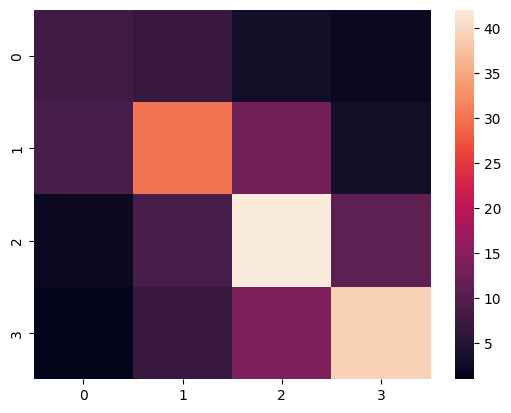

In [ ]:
c = pyanno.measures.agreement.confusion_matrix(anno.annotations[:,0], anno.annotations[:,1],4)
print(c)
ac = seaborn.heatmap(c)
plt.show()

Scott's $\pi$ is computed as:

$\pi = \frac{\text{Pr}(a)-\text{Pr}(e)}{1-\text{Pr}(e)}$

Where Pr($a$) is relative observed agreement, and Pr($e$) is expected agreement using joint proportions calculated from the confusion matrix or matrix of coded agreements between any two coders:

In [ ]:
scotts_pi(anno.annotations[:,0], anno.annotations[:,1])

0.4386478265891502

The generalization of Scott's $\pi$ to $n$ coders is Fleiss' $\kappa$ (Fleiss called it $\kappa$ because he thought he was generalizing Cohen's $\kappa$)

In [ ]:
fleiss_kappa(anno.annotations[::])

0.40417653771912765

Krippendorff's $\alpha$ generalizes of Fleiss' $\kappa$ to $n$ coders and takes into account the fact that annotations here are not categorically different, but ordinal, by adding a weight matrix in which off-diagonal cells contain weights indicating the seriousness of the disagreement between each score. When produced with no arguments, it simply produces an arithmetic distance (e.g., 3-1=2), such that cells one off the diagonal are weighted 1, two off 2, etc.

In [ ]:
krippendorffs_alpha(anno.annotations[::])

0.6472588223831547

Like Scott's $\pi$, Cohen's $\kappa$ also takes into account the possibility of the agreement occurring by chance, but in the following way:

$\kappa = \frac{p_o-p_e}{1-p_e}=1-\frac{1-p_o}{p_e}$

where $p_o$ is the relative observed agreement among raters, and $p_e$ is the hypothetical probability of chance agreement, using the observed data to calculate the probabilities of each observer randomly saying each category. If the raters are in complete agreement then $\kappa = 1$. If there is no agreement among the raters other than what would be expected by chance (as given by $p_e$), $\kappa ≤ 0 $. Here, Cohen's $\kappa$ statistic for the first two annotators is computed. This is probably the most common metric of agreement.

In [ ]:
cohens_kappa(anno.annotations[:,0], anno.annotations[:,1])

0.43917037219392857

In [ ]:
m = pairwise_matrix(cohens_kappa, anno.annotations)
print(m)

[[1.         0.43917037 0.47677621        nan        nan        nan
  0.45819119 0.43381462]
 [0.43917037 1.         0.38432922 0.41344423        nan        nan
         nan 0.33643611]
 [0.47677621 0.38432922 1.         0.39583333 0.51704894        nan
         nan        nan]
 [       nan 0.41344423 0.39583333 1.         0.34597068 0.4446844
         nan        nan]
 [       nan        nan 0.51704894 0.34597068 1.         0.37938644
  0.43039733        nan]
 [       nan        nan        nan 0.4446844  0.37938644 1.
  0.38341929 0.31214748]
 [0.45819119        nan        nan        nan 0.43039733 0.38341929
  1.         0.394806  ]
 [0.43381462 0.33643611        nan        nan        nan 0.31214748
  0.394806   1.        ]]


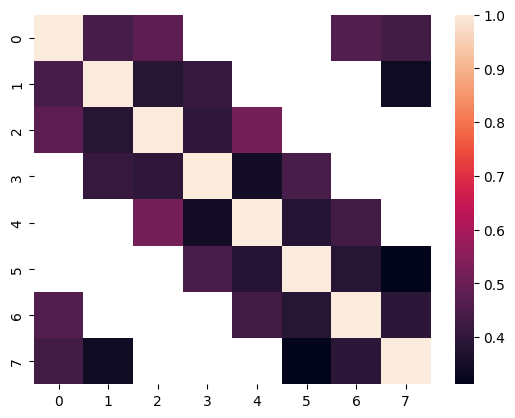

In [ ]:
ax = seaborn.heatmap(m)
plt.show()

You can see that this 8 by 3 loop design will be less stable than an 8 choose 3 combinatorial design, because each codes with more others.

One can also assess the average Cohen's $\kappa$ for all pairs of coders that have coded against one another:

In [ ]:
def pairwise_metric_average(metric, array):
    """Calculate the pairwise metric average for the real elements of metric function run on an array of annotations"""
    p = permutations(range(array[0,:].size),2)
    m = [metric(array[:,x[0]], array[:,x[1]]) for x in p]
    clean_m = [c for c in m if not math.isnan(c)]
    return reduce(lambda a, b: a + b, clean_m)/len(clean_m)

pairwise_metric_average(cohens_kappa, anno.annotations)

0.40911598940065674

As recognized with Krippendorff's flexible $\alpha$, our scores are *not* categorical, but rather ordered and her considered metric. Weighted $\kappa$ allows you to count disagreements differently and is useful when codes are ordered as they are here. Here a weight matrix is added to the calculation, in which off-diagonal cells contain weights indicating the seriousness of the disagreement between each score. When automatically produced, it simply produces an arithmetic distance (e.g., 3-1=2), such that cells one off the diagonal are weighted 1, two off 2, etc. Here

$\kappa = 1-\frac{\sum^k_{i=1}\sum^k_{j=1}w_{ij}x_{ij}}{\sum^k_{i=1}\sum^k_{j=1}w_{ij}m_{ij}}$

where $\kappa$ = $n$ codes and $w_{ij}$,$x_{ij}$, and $m_{ij}$ represent elements in the weight, observed, and expected matrices, respectively. (Obviously, when diagonal cells contain weights of 0 and off-diagonal cells weights of 1, this equals $\kappa$).

In [ ]:
cohens_weighted_kappa(anno.annotations[:,0], anno.annotations[:,1])

0.5330240507874497

Or averaged over the total:

In [ ]:
pairwise_metric_average(cohens_weighted_kappa,anno.annotations)

0.5299113458717166

Alternatively, if the annontation data can be understood as indicating real values, we can assess not agreement, but rather the correlation of values (Pearson's $\rho$) or correlation of ranks (Spearman's $\rho$) for pairs of coders:

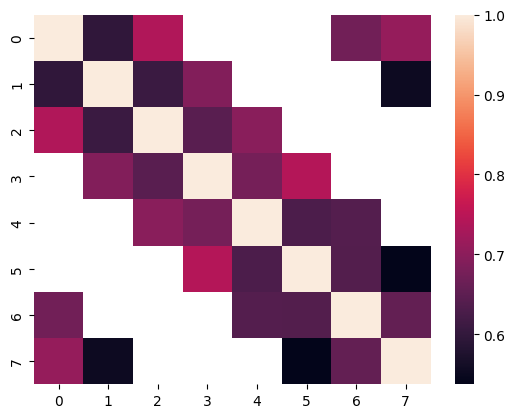

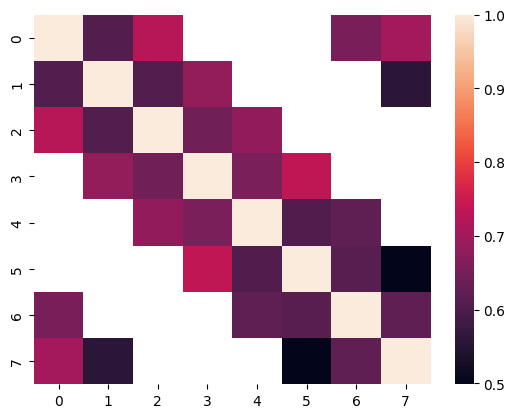

In [ ]:
n = pairwise_matrix(pearsons_rho, anno.annotations)
m = pairwise_matrix(spearmans_rho, anno.annotations)
an = seaborn.heatmap(n)
plt.show()
am = seaborn.heatmap(m)
plt.show()

Or averaged over all comparable pairs:

In [ ]:
print(pairwise_metric_average(pearsons_rho,anno.annotations), pairwise_metric_average(spearmans_rho,anno.annotations))

0.6517219321175077 0.63808488688039


## <font color="red">*Exercise 1*</font>

<font color="red">Perform a content annotation survey of some kind in which at least 3 people evaluate and code each piece of content, using Amazon Mechanical Turk as described in the [MTurk slides on Canvas](https://canvas.uchicago.edu/courses/54694/files/folder/unfiled?preview=10675152), or by hand with friends.  With the resulting data, calculate, visualize and discuss inter-coder agreement or covariation with appropriate metrics. What does this means for the reliability of human assessments regarding content in your domain?

I will first load my data, inorder to perform machine learning, I need to extract sentences including Mexico to increase my sample size and to label the attitude precicely

In [ ]:
import pandas as pd

os.chdir('/content/drive/MyDrive/Content_Analysis/Homework-Notebooks/week 5')

President = pd.read_csv('President_with_token.csv')
President

,DATE,TITLE,SPEAKER,CITATION,URL,TEXT1,TEXT2,TEXT3,TEXT4,Merged_Text,normalized_tokens,normalized_tokens_count,normalized_tokens_POS
0,16-Feb-01,The President's News Conference With President...,George W. Bush,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,"President Fox. Good afternoon. Good afternoon,...",NaN,NaN,NaN,"President Fox. Good afternoon. Good afternoon,...","['president', 'fox', 'good', 'afternoon', 'goo...",1604,"[('president', 'NNP'), ('fox', 'NNP'), ('.', '..."
1,29-Mar-01,The President's News Conference,George W. Bush,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,The President. Good morning. I first want to s...,NaN,NaN,NaN,The President. Good morning. I first want to s...,"['president', 'good', 'morning', 'want', 'plea...",2177,"[('the', 'DT'), ('president', 'NN'), ('.', '.'..."
2,22-Apr-01,The President's News Conference With Summit of...,George W. Bush,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,[Prime Minister Jean Chretien of Canada opened...,NaN,NaN,NaN,[Prime Minister Jean Chretien of Canada opened...,"['prime', 'minister', 'jean', 'chretien', 'can...",2049,"[('[', '-LRB-'), ('prime', 'NNP'), ('minister'..."
3,11-May-01,The President's News Conference,George W. Bush,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,"The President. Good afternoon. First, let me b...",NaN,NaN,NaN,"The President. Good afternoon. First, let me b...","['president', 'good', 'afternoon', 'let', 'beg...",1965,"[('the', 'DT'), ('president', 'NN'), ('.', '.'..."
4,24-Aug-01,The President's News Conference in Crawford,George W. Bush,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,Nominations for Chairman and Vice-Chairman of ...,this is—you've been reluctant to talk about t...,NaN,NaN,Nominations for Chairman and Vice-Chairman of ...,"['nomination', 'chairman', 'vice', 'chairman',...",2639,"[('nominations', 'NNS'), ('for', 'IN'), ('chai..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
102,7-Sep-20,The President's News Conference,Donald J. Trump,"Donald J. Trump, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,The President. Thank you very much. Thank you....,I know. I know.\nQ. We're 2 months out from th...,NaN,NaN,The President. Thank you very much. Thank you....,"['president', 'thank', 'thank', 'happy', 'labo...",3461,"[('the', 'DT'), ('president', 'NN'), ('.', '.'..."
103,25-Mar-21,The President's News Conference,Joseph R. Biden,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,"The President. Please, please sit down. Thank ...","h God, I miss him. [Laughter]\nQ. Have you—hav...",NaN,NaN,"The President. Please, please sit down. Thank ...","['president', 'sit', 'thank', 'thank', 'good',...",3845,"[('the', 'DT'), ('president', 'NN'), ('.', '.'..."
104,19-Jan-22,The President's News Conference,Joseph R. Biden,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,"The President. Hello, folks. Thanks for being ...",ic thing that's happened to Mother Russia—in t...,to succeed—other than sending more body bags ...,"on drugs? What do you think?\nI mean, I just—I...","The President. Hello, folks. Thanks for being ...","['president', 'hello', 'folk', 'thank', 'good'...",6941,"[('the', 'DT'), ('president', 'NN'), ('.', '.'..."
105,10-Jan-23,The President's News Conference With Prime Min...,Joseph R. Biden,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,Moderator. Good afternoon. Good afternoon. And...,"s.\nBut like I said, we're going to make sure ...",NaN,NaN,Moderator. Good afternoon. Good afternoon. And...,"['moderator', 'good', 'afternoon', 'good', 'af...",3609,"[('mo

Now I spill extract the sentences and save it for later use

In [ ]:
import pandas as pd

# Create new DataFrame to store centences
mexico_sentences = pd.DataFrame(columns=['SPEAKER', 'DATE', 'TITLE', 'CITATION', 'URL', 'Merged_Text'])

# For each row in President dataframe
for index, row in President.iterrows():
    # Spill sentence in Merged_Text
    sentences = row['Merged_Text'].split('.')

    # Extract sentence contain "Mexico"
    for sentence in sentences:
        if 'Mexico' in sentence:
            mexico_sentences = mexico_sentences.append({'SPEAKER': row['SPEAKER'], 'DATE': row['DATE'], 'TITLE': row['TITLE'], 'CITATION': row['CITATION'], 'URL': row['URL'], 'Merged_Text': sentence.replace('\n', '')}, ignore_index=True)

mexico_sentences

,SPEAKER,DATE,TITLE,CITATION,URL,Merged_Text
0,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,The fact that the President—George Bush's firs...
1,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,I also acknowledge President Bush's demonstra...
2,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,"President, that you will always be welcome in..."
3,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,"We, the Presidents of Mexico and the United St..."
4,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,"Muchas gracias, amigo, el Presidente de Mexico"
...,...,...,...,...,...,...
901,Joseph R. Biden,10-Jan-23,The President's News Conference With Prime Min...,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,That's exactly what we're doing in Mexico
902,Joseph R. Biden,10-Jan-23,The President's News Conference With Prime Min...,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,This doesn't happen in Mexico anymore
903,Joseph R. Biden,10-Jan-23,The President's News Conference With Prime Min...,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,Just as I was telling you that in the case of...
904,Joseph R. Biden,10-Jan-23,The President's News Conference With Prime Min...,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,"In the case of Mexico, this led us to make al..."


In [ ]:
mexico_sentences.to_csv('mexico_sentences.csv', index=False)

I have coded with 3 different classmates now I load my csv

In [ ]:
President = pd.read_csv('mexico_sentences.csv')
President

,SPEAKER,DATE,TITLE,CITATION,URL,Merged_Text,A1,A2,A3
0,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,The fact that the President—George Bush's firs...,2.0,2.0,2.0
1,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,I also acknowledge President Bush's demonstra...,2.0,2.0,2.0
2,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,"President, that you will always be welcome in...",2.0,2.0,2.0
3,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,"We, the Presidents of Mexico and the United St...",2.0,1.0,1.0
4,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,"Muchas gracias, amigo, el Presidente de Mexico",2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...
901,Joseph R. Biden,10-Jan-23,The President's News Conference With Prime Min...,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,That's exactly what we're doing in Mexico,NaN,NaN,NaN
902,Joseph R. Biden,10-Jan-23,The President's News Conference With Prime Min...,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,This doesn't happen in Mexico anymore,NaN,NaN,NaN
903,Joseph R. Biden,10-Jan-23,The President's News Conference With Prime Min...,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,Just as I was telling you that in the case of...,NaN,NaN,NaN
904,Joseph R. Biden,10-Jan-23,The President's News Conference With Prime Min...,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,"In the case of Mexico, this led us to make al...",NaN,NaN,NaN


Now, we transfer my dataframe to annotation, drop na values, because I coded 1/10 sentences and for those `10%` data I have 3 coders for each, therefore, there are no na valuse withnin those labeled sentences

In [ ]:
import pandas as pd
President = President.dropna()

annotations_data = President[['A1', 'A2', 'A3']].values

# Build the annotation container object
anno = AnnotationsContainer.from_array(annotations_data)

In [ ]:
print(anno.annotations[:5])

[[2 2 2]
 [2 2 2]
 [2 2 2]
 [2 1 1]
 [2 2 2]]


In [ ]:
anno.labels

[0.0, 1.0, 2.0]

The frequency of each category in all annotators' comments:

In [ ]:
pyanno.measures.agreement.labels_frequency(anno.annotations,3)

array([0.15746421, 0.49897751, 0.34355828])

Now consider the "confusion matrix" or matrix of coded agreements between any two coders:

[[19.  4.  0.]
 [ 5. 71. 10.]
 [ 0.  8. 46.]]


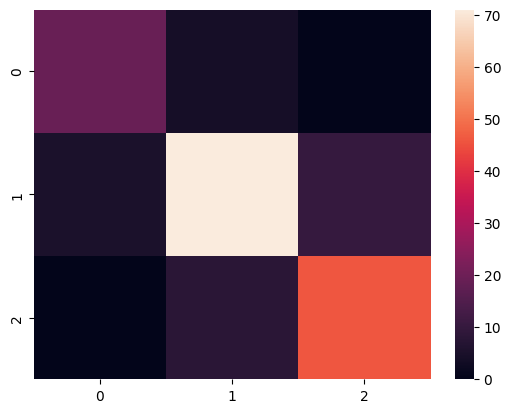

In [ ]:
c = pyanno.measures.agreement.confusion_matrix(anno.annotations[:,0], anno.annotations[:,1],3)
print(c)
ac = seaborn.heatmap(c)
plt.show()

It could learn from heat map that the two coder have more agreements

In [ ]:
scotts_pi(anno.annotations[:,0], anno.annotations[:,1])

0.7223606598744596

Scott's π coefficient between two callers, which is a statistical measure of consistency between two callers, is high

In [ ]:
fleiss_kappa(anno.annotations[::])

0.7713570603443531

The Fleiss 'Kappa coefficient among multiple callers is also very high

In [ ]:
krippendorffs_alpha(anno.annotations[::])

0.8512248484631111

The Krippendorff's Alpha coefficient indicator between multiple taggers is also high

In [ ]:
cohens_kappa(anno.annotations[:,0], anno.annotations[:,1])

0.7224219489120149

Above is Cohen's Kappa coefficient between the two markers, which is similar to Scott's π coefficient

In [ ]:
m = pairwise_matrix(cohens_kappa, anno.annotations)
print(m)

[[1.         0.72242195 0.76995766]
 [0.72242195 1.         0.82083537]
 [0.76995766 0.82083537 1.        ]]


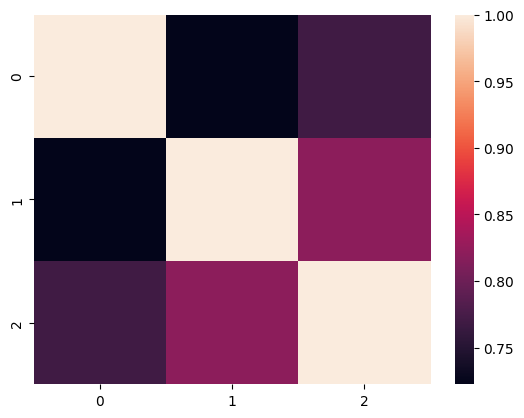

In [ ]:
ax = seaborn.heatmap(m)
plt.show()

Above heatmap shows the Cohen's Kappa coefficient bwtween coder1 and coder2

One can also assess the average Cohen's κ for all pairs of coders that have coded against one another:

In [ ]:
def pairwise_metric_average(metric, array):
    """Calculate the pairwise metric average for the real elements of metric function run on an array of annotations"""
    p = permutations(range(array[0,:].size),2)
    m = [metric(array[:,x[0]], array[:,x[1]]) for x in p]
    clean_m = [c for c in m if not math.isnan(c)]
    return reduce(lambda a, b: a + b, clean_m)/len(clean_m)

pairwise_metric_average(cohens_kappa, anno.annotations)

0.7710716595545467

Weighted Cohen's Kappa coefficient:

In [ ]:
cohens_weighted_kappa(anno.annotations[:,0], anno.annotations[:,1])

0.7613211128586149

Or averaged over the total:

In [ ]:
pairwise_metric_average(cohens_weighted_kappa,anno.annotations)

0.8052380468637671

Calculate Pearson correlation coefficients and Spearman correlation coefficients between callers and visualize these correlations using thermal maps

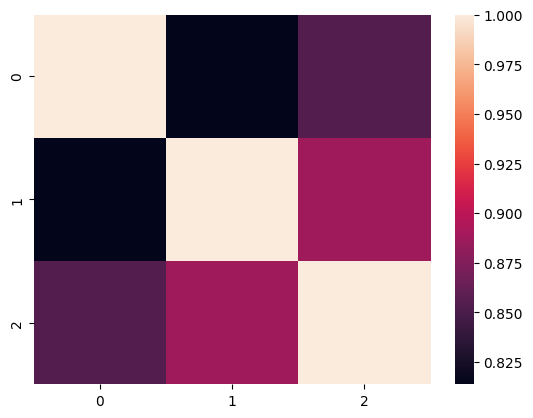

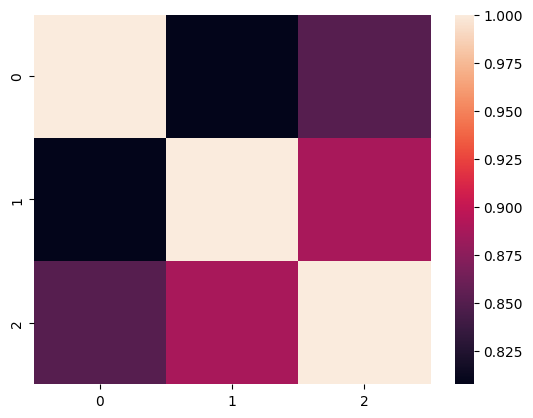

In [ ]:
n = pairwise_matrix(pearsons_rho, anno.annotations)
m = pairwise_matrix(spearmans_rho, anno.annotations)
an = seaborn.heatmap(n)
plt.show()
am = seaborn.heatmap(m)
plt.show()

Or averaged over all comparable pairs:

In [ ]:
print(pairwise_metric_average(pearsons_rho,anno.annotations), pairwise_metric_average(spearmans_rho,anno.annotations))

0.8517275158219406 0.8488974045354469


# Feom above results we can find that, my three coders have a relatively high concesus on coding for the attitude of president on mexico because the diagonal of the heat map is very close to 1, and the diverging part, that is, the part outside the diagonal, has a smaller value

# Simple Simulated Examples for Classification

Here we create a sandbox for you to explore different types of classified data and how different statistical classifiers perform on each type.

## Generating example data

We start by loading one of the "cartoon" or simplified data sets and then dividing it into training and testing sets. To maximize our ability to visualize, each dataset involves two classes, colored yellow and blue, arrayed along two dimensions (`x` and `y`).

The four data patterns include:
+ `random` in which the two classes are randomly distributed across both dimensions
+ `andSplit` in which the two classes are linearly split along one of two dimensions (e.g., men like Adidas)
+ `xorSplit` in which the two classes are split, oppositely, along each dimension (e.g., old ladies and young men like Nikes)
+ `targetSplit` in which one class is nested within the other in two dimensions (e.g., middle aged, middle income people like vintage Mustangs)
+ `multiBlobs` in which 5 classes are placed as bivariate Gaussians at random locations

`noise` is a variable [0-1] that ranges from no noise in the prescribed pattern [0] to complete noise/randomness [1].

Uncomment (remove the # in front of) each dataset, one at a time, and then run the cell and subsequent cells to examine how each machine learning approach captures each pattern.

We use the popular `train_test_split()` function from `sklearn`, and the data pattern function source code is copied below for your convenience from `lucem_illud`'s [cartoons.py](https://github.com/UChicago-Computational-Content-Analysis/lucem_illud/blob/main/lucem_illud/cartoons.py) file.

In [ ]:
def random(numPerCategory = 500):
    datDict = {
        'vect' : [np.random.rand(2) * 2 - 1 for i in range(2 * numPerCategory)],
        'category' : [i % 2 for i in range(2 * numPerCategory)],
    }

    return pandas.DataFrame(datDict)

def andSplit(noise = 0, numPerCategory = 500):
    def genPoint(cat):
        y = np.random.random_sample() * 2 - 1
        if noise >= 0:
            x = np.random.random_sample() - cat - (np.random.random_sample() - cat) * noise
        else:
            x = (1 - noise * np.random.random_sample()) - cat
        return np.array([x, y])
    datDict = {
        'vect' : [genPoint(i % 2) for i in range(2 * numPerCategory)],
        'category' : [i % 2 for i in range(2 * numPerCategory)],
    }

    return pandas.DataFrame(datDict)

def xorSplit(noise = 0, numPerCategory = 500):
    def genPoint(cat):
        if cat == 1:
            if np.random.randint(0,2) < 1:
                y = np.random.random_sample() - np.random.random_sample() * noise * 2
                x = np.random.random_sample() - np.random.random_sample() * noise * 2
            else:
                y = np.random.random_sample() - 1 - np.random.random_sample() * noise * 2
                x = np.random.random_sample() - 1 - np.random.random_sample() * noise * 2
        else:
            if np.random.randint(0,2) < 1:
                y = np.random.random_sample() - 1 - np.random.random_sample() * noise * 2
                x = np.random.random_sample() - np.random.random_sample() * noise * 2
            else:
                y = np.random.random_sample() - np.random.random_sample() * noise * 2
                x = np.random.random_sample() - 1 - np.random.random_sample() * noise * 2
        return np.array([x, y])

    datDict = {
        'vect' : [genPoint(i % 2) for i in range(2 * numPerCategory)],
        'category' : [i % 2 for i in range(2 * numPerCategory)],
    }

    return pandas.DataFrame(datDict)

def targetSplit(noise = 0, numPerCategory = 500, innerRad = .3):
    def genPoint(cat):
        if cat == 0:
            r = np.random.random_sample() * innerRad + (1 - innerRad) * np.random.random_sample() * noise
        else:
            r = np.random.random_sample() * (1 - innerRad) + innerRad - innerRad * np.random.random_sample() * noise
        eta = 2 * np.pi * np.random.random_sample()
        return np.array([r * np.cos(eta), r * np.sin(eta)])

    datDict = {
        'vect' : [genPoint(i % 2) for i in range(2 * numPerCategory)],
        'category' : [i % 2 for i in range(2 * numPerCategory)],
    }

    return pandas.DataFrame(datDict)

def multiBlobs(noise = 0, numPerCategory = 500, centers = 5):
    if isinstance(centers, int):
        n_samples = numPerCategory * centers
    else:
        n_samples = numPerCategory * len(centers)
    X, y = sklearn.datasets.make_blobs(n_samples=n_samples, centers=centers, cluster_std = (.8 * (noise * 2 + 1)))
    datDict = {
        'vect' : list(X),
        'category' : y,
    }
    return pandas.DataFrame(datDict)

In [ ]:
noise = .2

#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.random(noise), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.andSplit(noise), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.xorSplit(noise), test_size=.2)
dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.targetSplit(noise), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.multiBlobs(noise), test_size=.2)

We can easily visualize the rendered datasets because they are generated in two dimensions.

Let's see what dfTrain, a simulated data that we just made, looks like

In [ ]:
dfTrain

,vect,category
850,"[0.07453070714092033, 0.16857460840684063]",0
702,"[0.32787148408019534, 0.04667859229235841]",0
244,"[0.11317574011545131, 0.07058940805535333]",0
842,"[0.15700537490616162, 0.030660914745560906]",0
383,"[-0.813192325886294, 0.3169388774033263]",1
...,...,...
785,"[0.21671844401058094, 0.8238458720455393]",1
772,"[-0.2523954612783164, -0.10822843594407512]",0
195,"[0.33439898625350417, -0.16185048839026095]",1
293,"[-0.15090438997205444, 0.8711670510066102]",1


So, dfTrain has two columns, vect and category. We can plot this with `plotter()` from [lucem_illud/lucem_illud/cartoons.py](https://github.com/UChicago-Computational-Content-Analysis/lucem_illud/blob/main/lucem_illud/cartoons.py). Here's the source code:

In [ ]:
def plotter(df):
    fig, ax = plt.subplots(figsize = (10,10))
    pallet = seaborn.color_palette(palette='rainbow', n_colors= len(set(df['category'])))
    for i, cat in enumerate(set(df['category'])):
        a = np.stack(df[df['category'] == cat]['vect'])
        ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)
    ax.legend(loc = 'center right', title = 'Categories')
    ax.axis('off')
    plt.show()
    plt.close()

/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


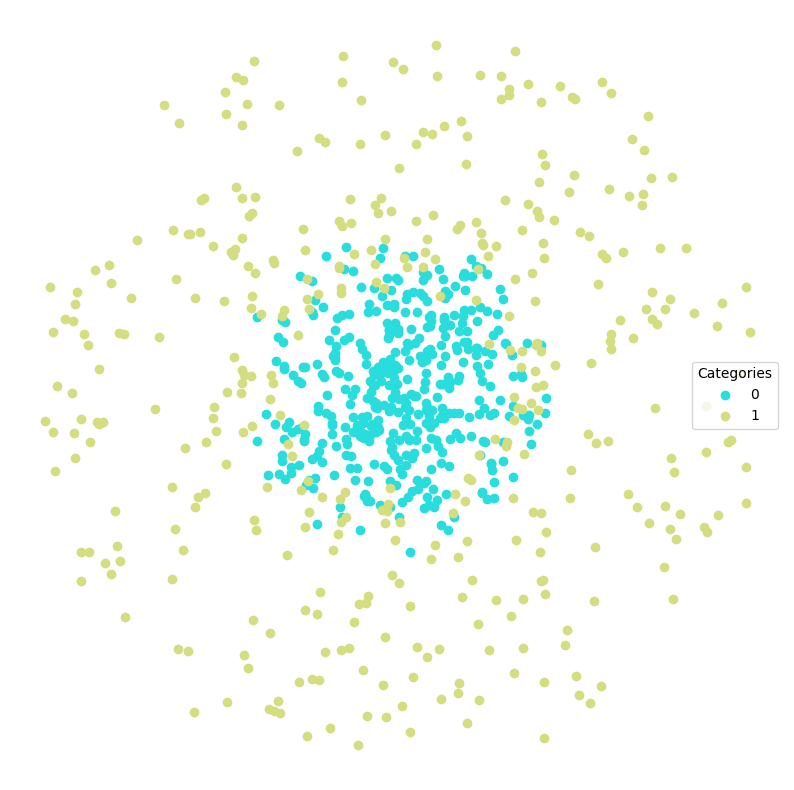

In [ ]:
lucem_illud.plotter(dfTrain)

## Training a Machine Learning algorithm

We can now pick a model, there are many more options in `scikit-learn`. These are just a few examples, which array along the machine learning "tribes" described in Pedro Domingos _The Master Algorithm_.

Uncomment (remove the # in front of) each algorithm one at a time, then run the cell and subsequent cells to evaluate how it learns to understand the data.

In [ ]:
#Bayes
#clf = sklearn.naive_bayes.GaussianNB()

#Analogizes
#clf = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up
#clf = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower
clf = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
#clf = sklearn.linear_model.LogisticRegression()

#Symbolists
#clf = sklearn.tree.DecisionTreeClassifier()
#clf = sklearn.ensemble.RandomForestClassifier()

#Connectionists
#clf = sklearn.neural_network.MLPClassifier()

#Ensemble
#clf = sklearn.ensemble.GradientBoostingClassifier()

We're using sklearn here. What is sklearn? It's an open source machine learning library for Python. We use sklearn because it features various machine learning algorithms and it works well with NumPy library. You don't need to understand the sklearn package in detail for the moment, but let's see what methods and attributes sklearn has, because we're going to use some of them:

In [ ]:
dir(sklearn)

['__SKLEARN_SETUP__',
 '__all__',
 '__builtins__',
 '__cached__',
 '__check_build',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 '__version__',
 '_config',
 '_distributor_init',
 '_loss',
 'base',
 'clone',
 'config_context',
 'datasets',
 'decomposition',
 'dummy',
 'ensemble',
 'exceptions',
 'externals',
 'feature_extraction',
 'get_config',
 'linear_model',
 'logger',
 'logging',
 'metrics',
 'model_selection',
 'neighbors',
 'neural_network',
 'os',
 'preprocessing',
 'random',
 'set_config',
 'setup_module',
 'show_versions',
 'svm',
 'sys',
 'tree',
 'utils']

Now we fit the model by giving it our training data

In [ ]:
clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])

KNeighborsClassifier(weights='distance')

Here, "stack" function is used. Why did we use stack function here? This is because dfTrain['vect'] is a sequence, while clf.fit() takes an array element. Let's see what dfTrain['vect'] looks like:

In [ ]:
dfTrain['vect']

850      [0.07453070714092033, 0.16857460840684063]
702      [0.32787148408019534, 0.04667859229235841]
244      [0.11317574011545131, 0.07058940805535333]
842     [0.15700537490616162, 0.030660914745560906]
383        [-0.813192325886294, 0.3169388774033263]
                           ...                     
785       [0.21671844401058094, 0.8238458720455393]
772     [-0.2523954612783164, -0.10822843594407512]
195     [0.33439898625350417, -0.16185048839026095]
293      [-0.15090438997205444, 0.8711670510066102]
398    [-0.23308460439718273, -0.17430892272678017]
Name: vect, Length: 800, dtype: object

And let's see what np.stack(dfTrain['vect']) does:

In [ ]:
np.stack(dfTrain['vect'])

array([[ 0.07453071,  0.16857461],
       [ 0.32787148,  0.04667859],
       [ 0.11317574,  0.07058941],
       ...,
       [ 0.33439899, -0.16185049],
       [-0.15090439,  0.87116705],
       [-0.2330846 , -0.17430892]])

As you can see, stack function takes a sequence of arrays (which have the same shape) and joins them along a new axis.

## Algorithm evaluation

We can look at few measurements of each classifier's performance by using the testing set. These `lucem_illud` functions are in [metrics.py](https://github.com/UChicago-Computational-Content-Analysis/lucem_illud/blob/main/lucem_illud/metrics.py), and we will skip copying source code this time due to length.

In [ ]:
lucem_illud.evaluateClassifier(clf, dfTest)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
0,0.17,0.835712,0.766990,0.730812,0.887640
1,0.17,0.835712,0.896907,0.822981,0.783784


This lets us look at which classes do better:

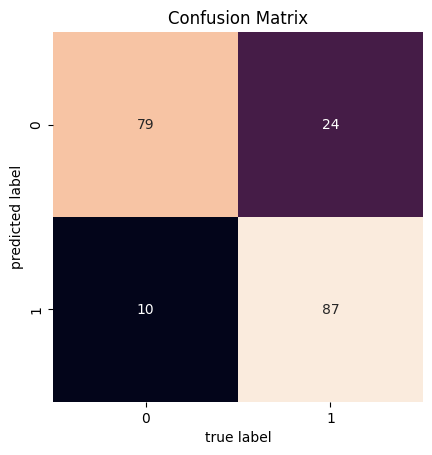

In [ ]:
lucem_illud.plotConfusionMatrix(clf, dfTest)

The greater the area under the curve the better.

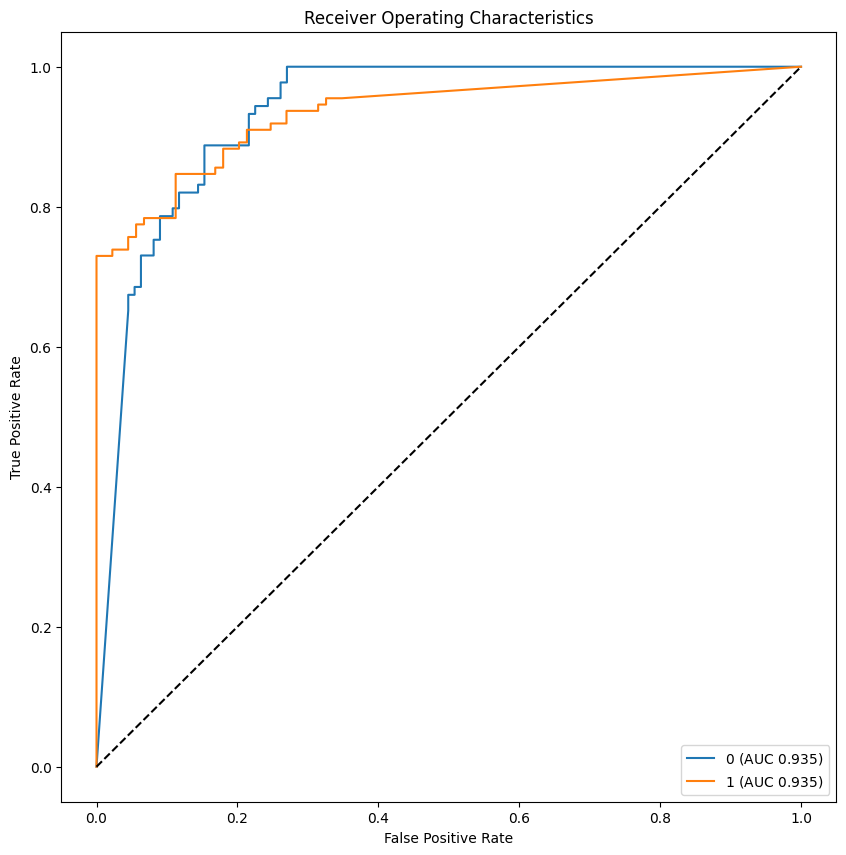

In [ ]:
lucem_illud.plotMultiROC(clf, dfTest)

We can also look at the regions the classifer identifies as one class or the other:

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


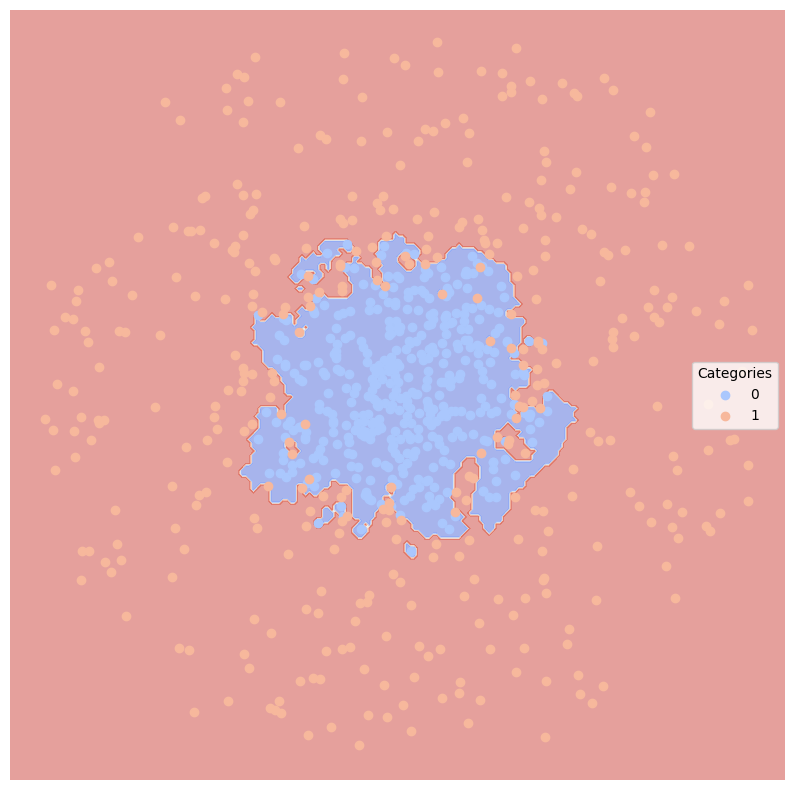

In [ ]:
lucem_illud.plotregions(clf, dfTrain)

## Now we do the same for real data

Available data sets include:
+ Reddit threads "classified" by thread topic
+ 20 newsgroups "classified" by group topic
+ Senate press releases "classified" by Senator (2 senators)
+ Senate press releases "classified" by Senator (5 senators)
+ Emails classified as Spam or Ham

Note that if you're on Google Colab and have not `git clone`ed the [class repo](https://github.com/UChicago-Computational-Content-Analysis/Homework-Notebooks-2024-Winter), you can set a `dataDirectory=` parameter in the loadReddit function to match the data folder path on Colab.

In [ ]:
 dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadReddit(dataDirectory='/content/drive/MyDrive/Content_Analysis/Homework-Notebooks/data/'), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadReddit(dataDirectory=''), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadNewsGroups(), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadSenateSmall(), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadSenateLarge(), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadSpam(), test_size=.2)

Loading Reddit data
Converting to vectors


/usr/local/lib/python3.10/dist-packages/spacy/pipeline/lemmatizer.py:211: UserWarning: [W108] The rule-based lemmatizer did not find POS annotation for one or more tokens. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
  warnings.warn(Warnings.W108)


In [ ]:
dfTrain

,Unnamed: 0,author,over_18,score,subreddit,text,title,url,category,tokenized_text,normalized_text,vect
177,177,ArtzDept,False,3615,Tales From Tech Support,"Whoa, this sub really dies during the weekends...",My high tech grandma.,https://www.reddit.com/r/talesfromtechsupport/...,Tales From Tech Support,"[Whoa, this, sub, really, dies, during, the, w...","[whoa, sub, die, weekend, ve, mention, grandmo...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1354,1354,ahdjashdkahds,False,2991,Relationships,Original post: https://www.reddit.com/r/relati...,UPDATE! Me [25 F] with my bf [26 M] of nearly ...,https://www.reddit.com/r/relationships/comment...,Relationships,"[Original, post, https://www.reddit.com/r/rela...","[original, post, https://www.reddit.com/r/rela...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1363,1363,Throwaway592j1,False,2914,Relationships,Original post here: https://www.reddit.com/r/r...,[UPDATE] My [19F] manager [25M] had unlocked m...,https://www.reddit.com/r/relationships/comment...,Relationships,"[Original, post, here, https://www.reddit.com/...","[original, post, https://www.reddit.com/r/rela...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
274,274,Wellhowboutdat,False,3063,Tales From Tech Support,So this tale starts with an irate customer and...,Certainly sir. Would you mind sending us a scr...,https://www.reddit.com/r/talesfromtechsupport/...,Tales From Tech Support,"[So, this, tale, starts, with, an, irate, cust...","[tale, start, irate, customer, end, confusion,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
518,518,roommate_blues,False,52,Bad Roommates: Tales of Irritation,(throwaway account) My friend who I was in th...,Our roommate is now a squatter and treats us l...,https://www.reddit.com/r/badroommates/comments...,Bad Roommates,"[throwaway, account, My, friend, who, I, was, ...","[throwaway, account, friend, navy, year, deplo...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
...,...,...,...,...,...,...,...,...,...,...,...,...
945,945,YouGottaFlaunt,False,167,Weeaboo Tales: stories about the extreme fans ...,[Part one](https://www.reddit.com/r/weeabootal...,My college anime club experience - Shorts,https://www.reddit.com/r/weeabootales/comments...,Weeaboo Tales,"[Part, one](https://www.reddit.com, r, weeaboo...","[one](https://www.reddit.com, r, weeabootale, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1548,1548,uhhhishecheating,False,2178,Relationships,Wow this is a doozy. Sorry the title is kind o...,"Boyfriend 30M of 2.5 years, avoiding our (27F)...",https://www.reddit.com/r/relationships/comment...,Relationships,"[Wow, this, is, a, doozy, Sorry, the, title, i...","[wow, doozy, sorry, title, kind, doozy, m, fee...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1173,1173,tenel_ka27,False,103,Weeaboo Tales: stories about the extreme fans ...,"I had a fun little encounter today. *Be me, T...",A wild weeb appears!,https://www.reddit.com/r/weeabootales/comments...,Weeaboo Tales,"[I, had, a, fun, little, encounter, today, Be,...","[fun, little, encounter, today, tenel, tall, l...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
921,921,DanillaIce,False,179,Weeaboo Tales: stories about the extreme fans ...,"Okay, so, I'd been debating about finally putt...","Why I never joined an anime club/society, aka:...",https://www.reddit.com/r/weeabootales/comments...,Weeaboo Tales,"[Okay, so, I, 'd, been, debating, about, final...","[okay, debate, finally, put, find, subreddit, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


In [ ]:
#Classical Regression
clf = sklearn.linear_model.LogisticRegression()

#Bayes
# clf = sklearn.naive_bayes.GaussianNB()

#Analogizes
#clf = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up, but lose ROC
#clf = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower
#clf = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Symbolists
#clf = sklearn.tree.DecisionTreeClassifier()
#clf = sklearn.ensemble.RandomForestClassifier()

#Connectionists
#clf = sklearn.neural_network.MLPClassifier()

#Ensemble
#clf = sklearn.ensemble.GradientBoostingClassifier()

In [ ]:
clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])

LogisticRegression()

In [ ]:
lucem_illud.evaluateClassifier(clf, dfTest)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
Relationships,0.025000,0.953143,0.969697,0.905330,0.914286
Weeaboo Tales,0.003125,0.994318,1.000000,0.991761,0.988636
Bad Roommates,0.012500,0.991803,0.950000,0.950000,1.000000
Tales From Tech Support,0.009375,0.989913,0.977011,0.968776,0.988372


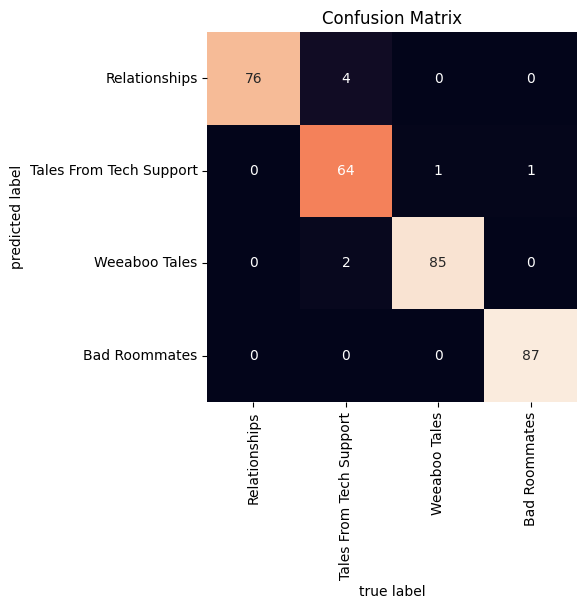

In [ ]:
lucem_illud.plotConfusionMatrix(clf, dfTest)

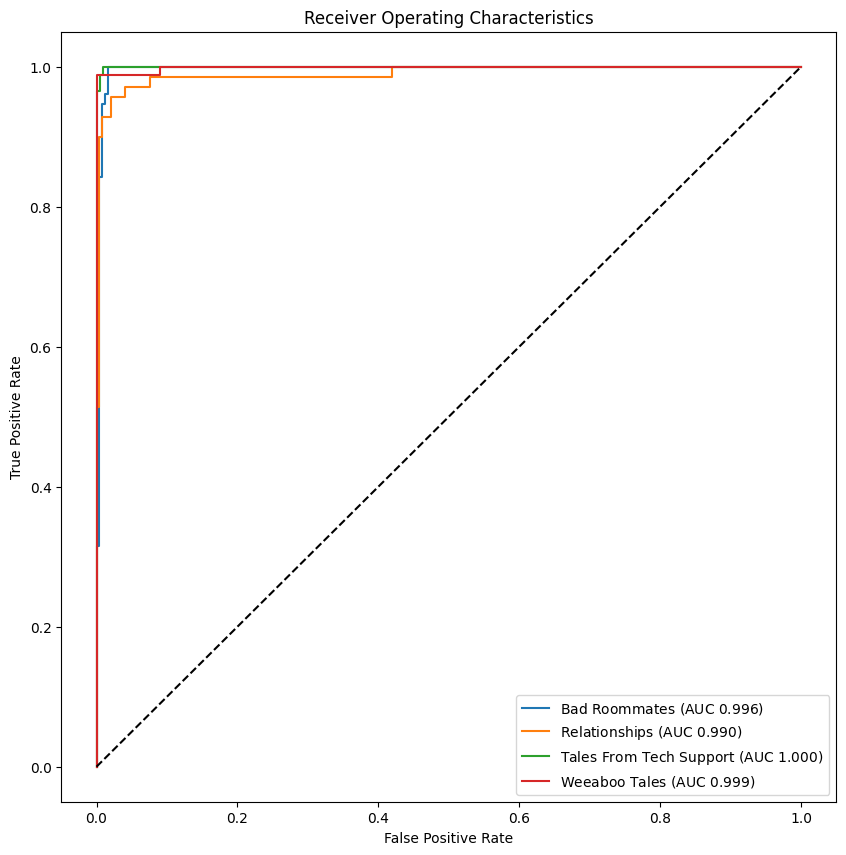

In [ ]:
lucem_illud.plotMultiROC(clf, dfTest)

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


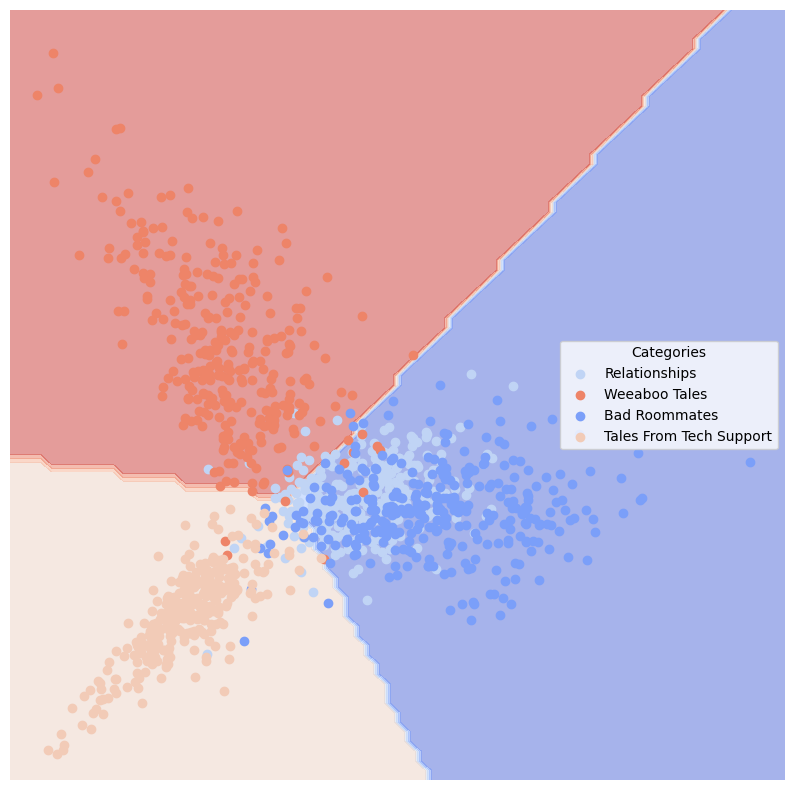

In [ ]:
lucem_illud.plotregions(clf, dfTrain)

## <font color="red">*Exercise 2*</font>

<font color="red">Go back through all of the cells above and generate 10 distinct artificial datasets and classify them with all of the available methods. Add a cell immediately below and describe which classifier(s) worked best with which artificially constructed data source and why. Then go through all of the empirical datasets (i.e., Newsgroups, Senate Small, Senate Large, Email Spam) and classify them with all available methods. Add a second cell immediately below and describe which classifier(s) worked best with which data set and why.

<font color="red">***Stretch*** (but also required) Wander through the SKLearn documentation available [here](http://scikit-learn.org/stable/), particularly perusing the classifiers. In cells following, identify and implement a new classifier that we have not yet used (e.g., AdaBoost, CART) on one artificial dataset and one real dataset (used above). Then, in the next cell describe the classifier, detail how it compares with the approaches above, and why it performed better or worse than others.

# Now I will load 10 distinct artificial data, **I will use a loop to plot all the methods** I willcompare and describe which classifier(s) worked best with which artificially constructed data source and why **after** all of the plots

In [ ]:
noise = .2

#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.random(noise), test_size=.2)
dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.andSplit(noise), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.xorSplit(noise), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.targetSplit(noise), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.multiBlobs(noise), test_size=.2)

Training and evaluating Logistic Regression


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


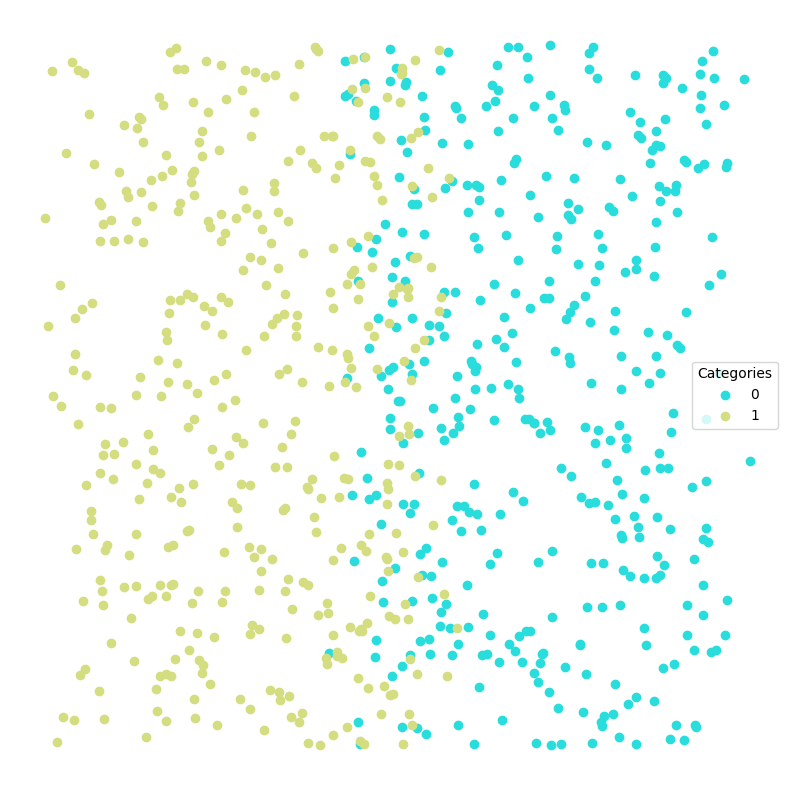

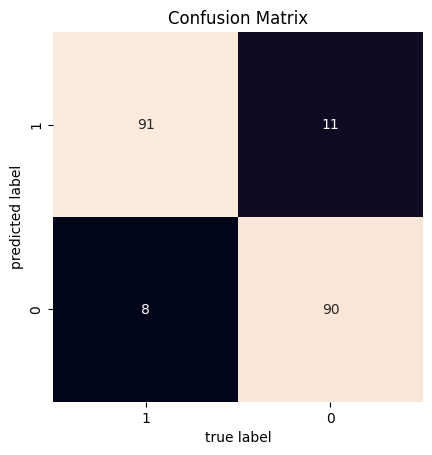

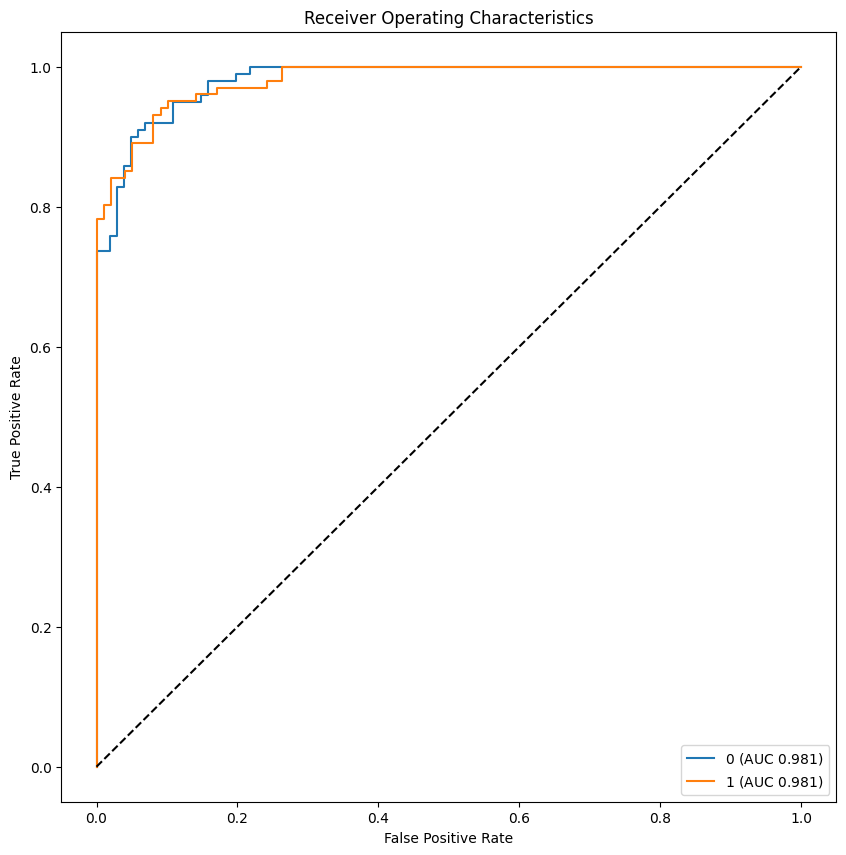

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


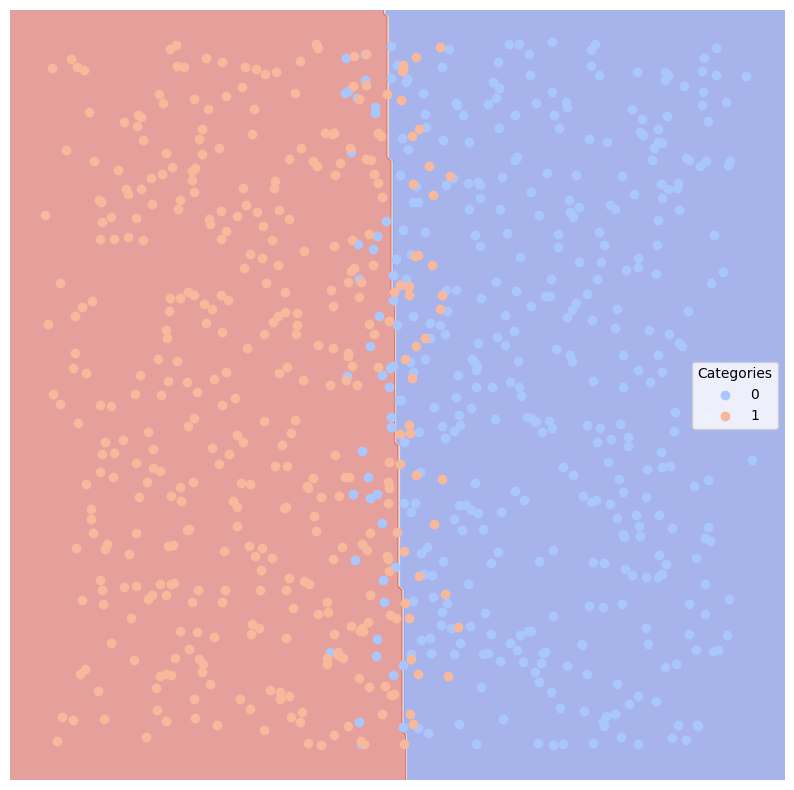

Training and evaluating Gaussian Naive Bayes


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


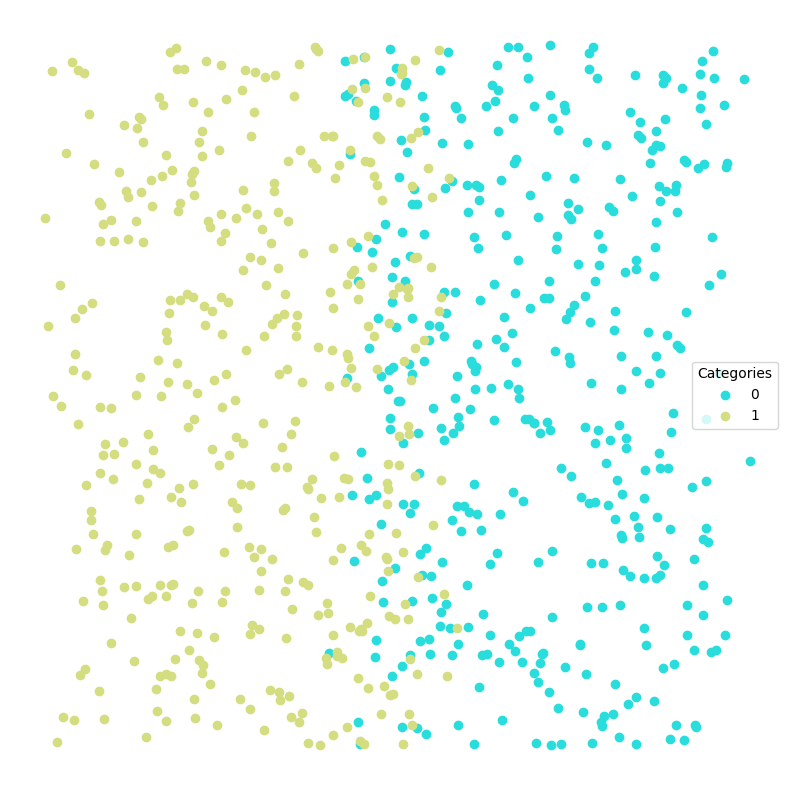

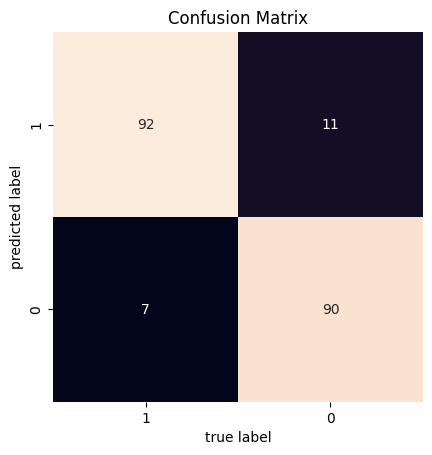

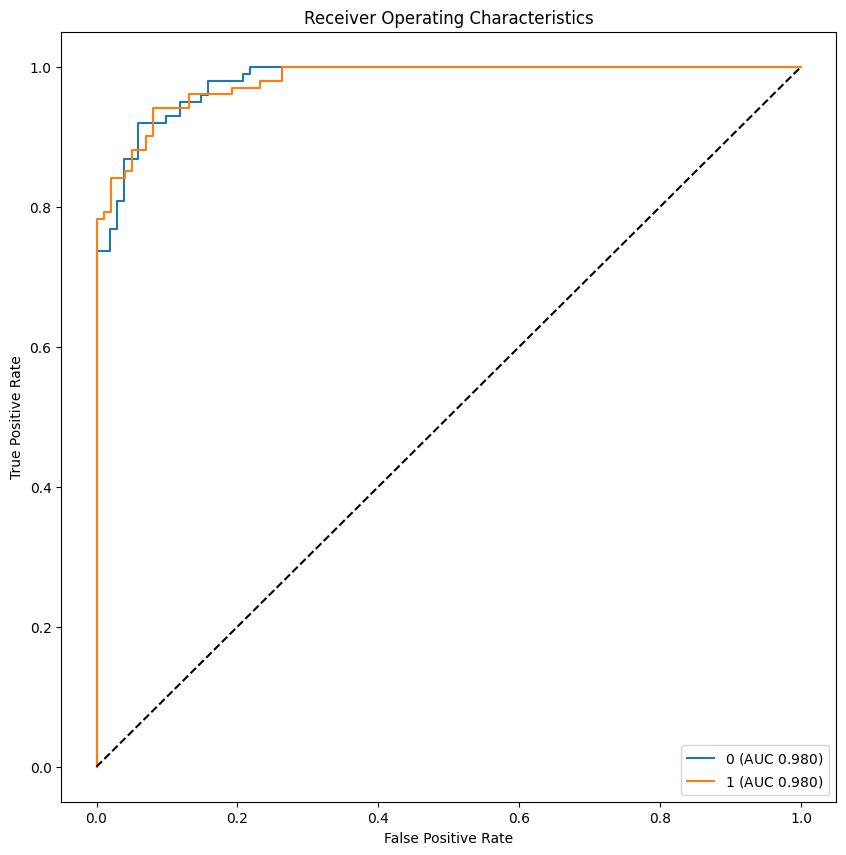

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


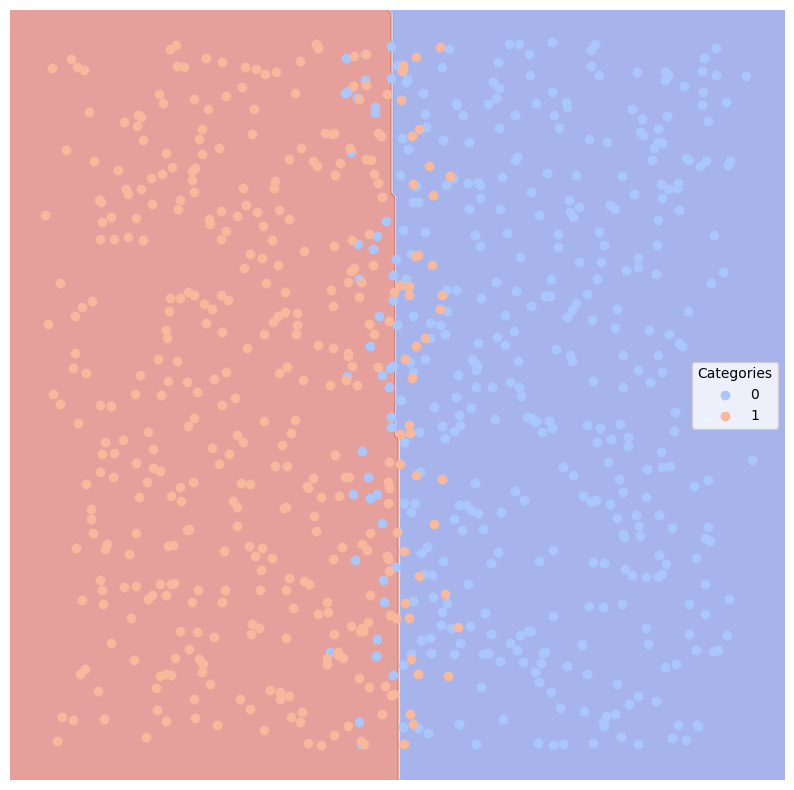

Training and evaluating SVC Linear


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


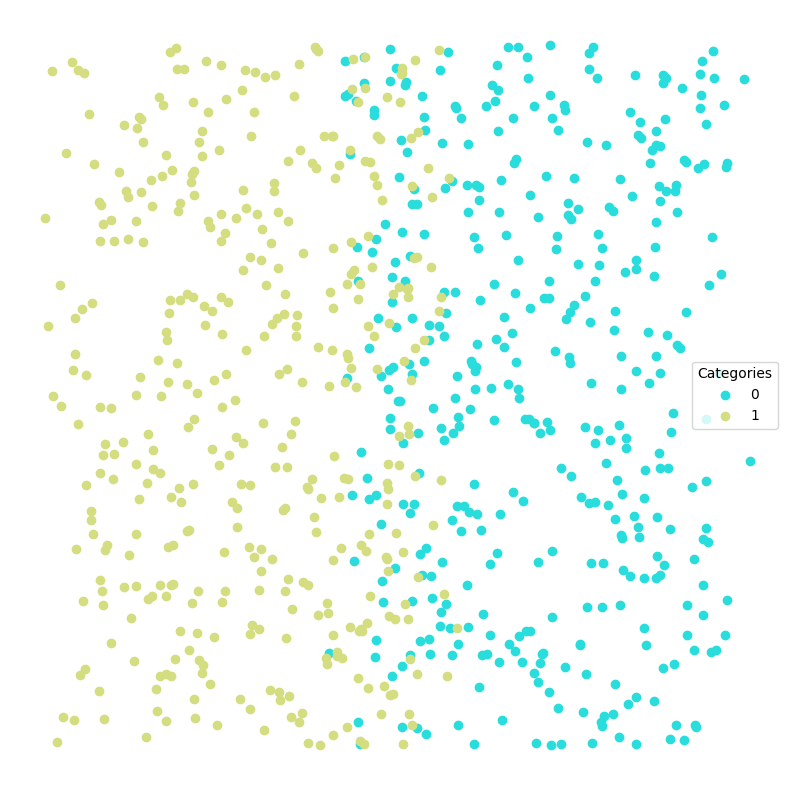

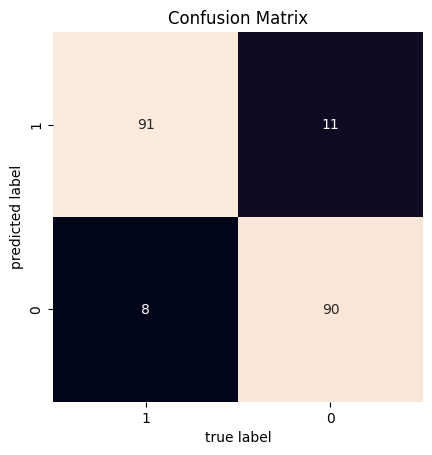

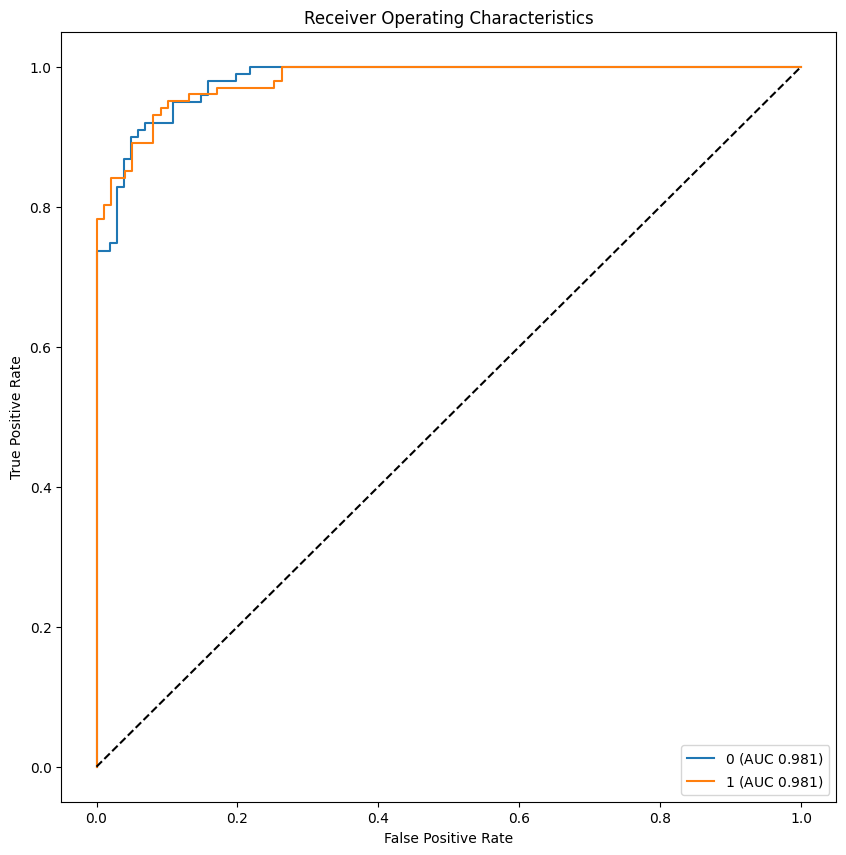

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


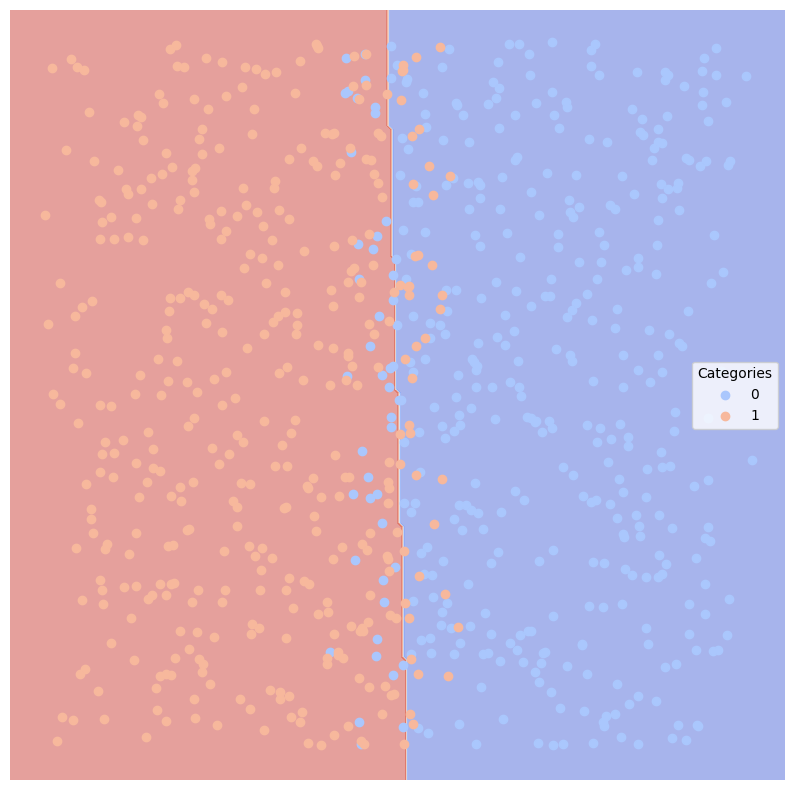

Training and evaluating SVC Poly


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


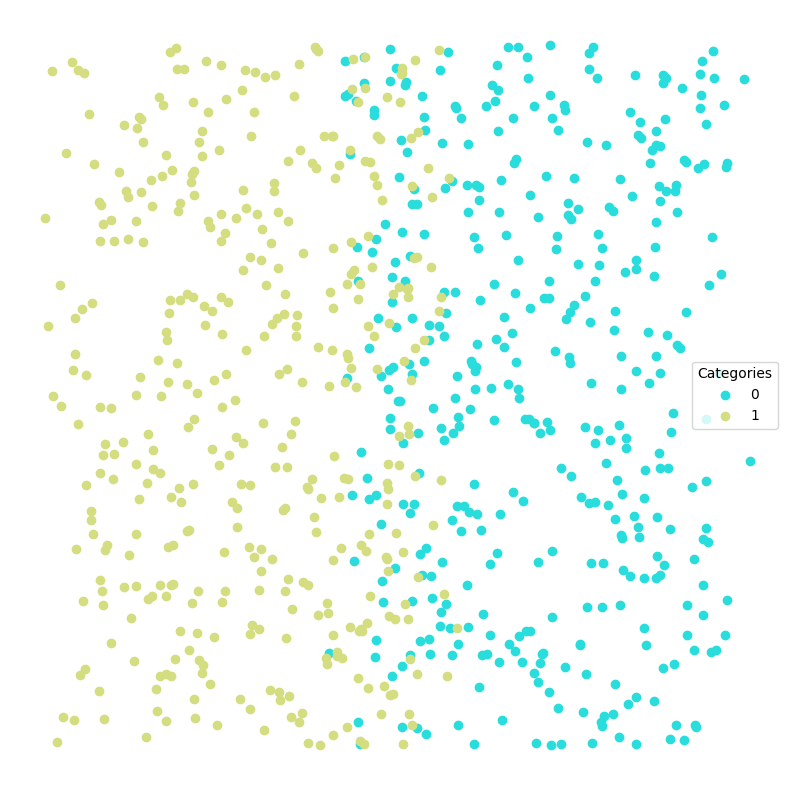

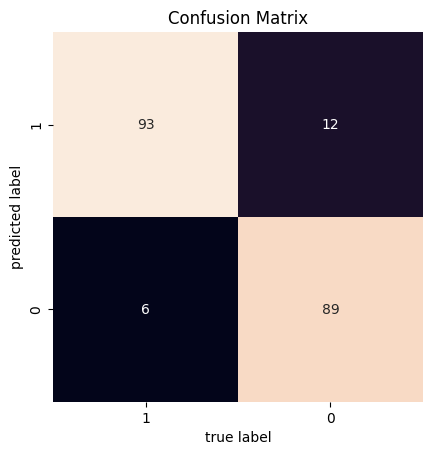

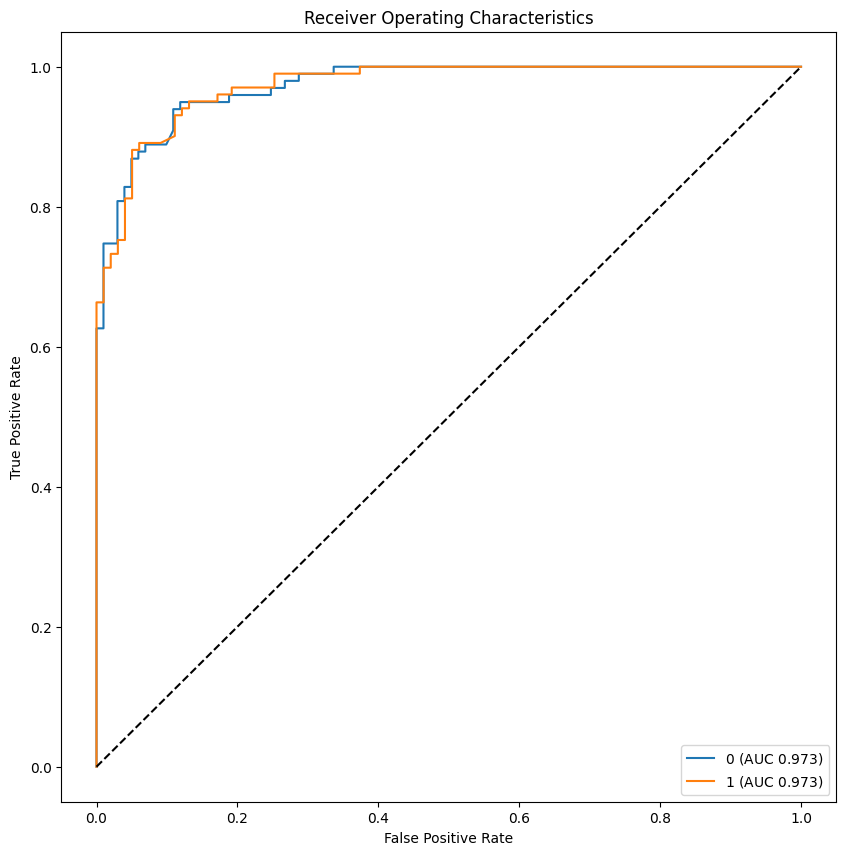

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


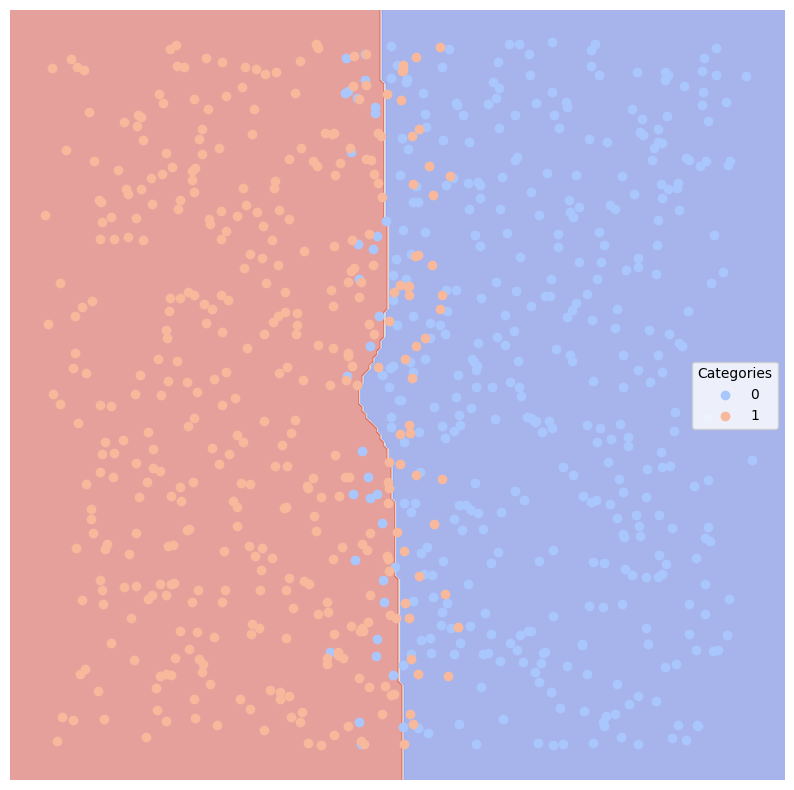

Training and evaluating KNeighbors Classifier


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


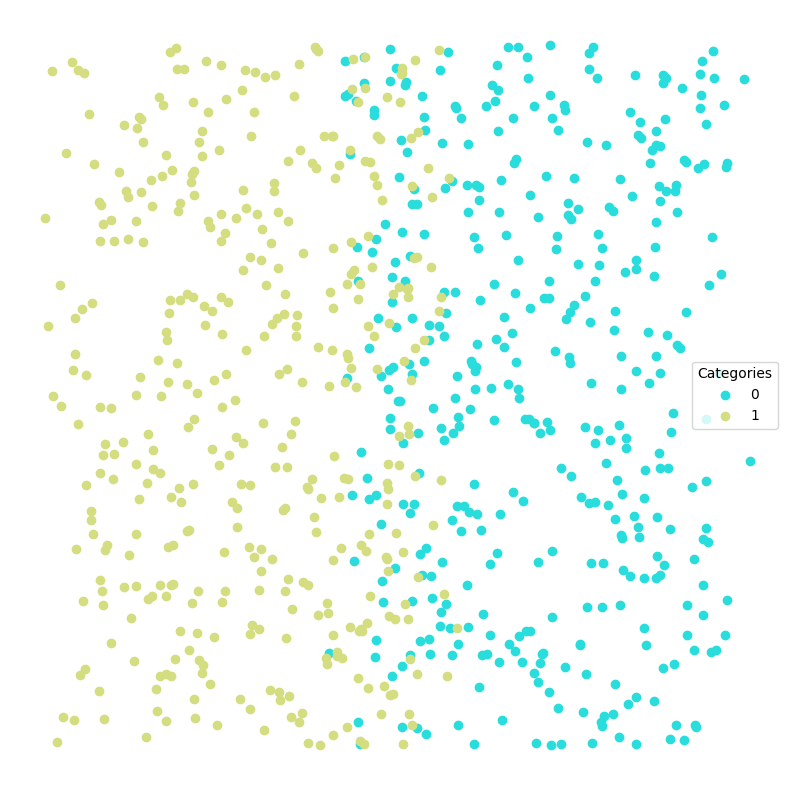

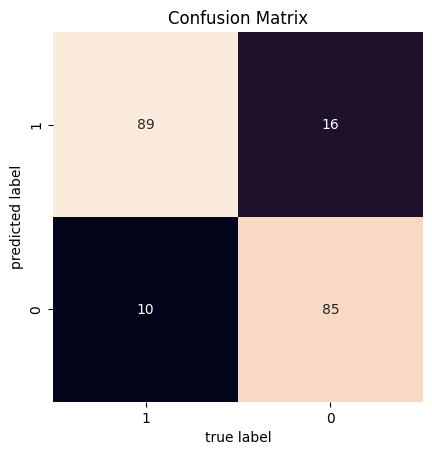

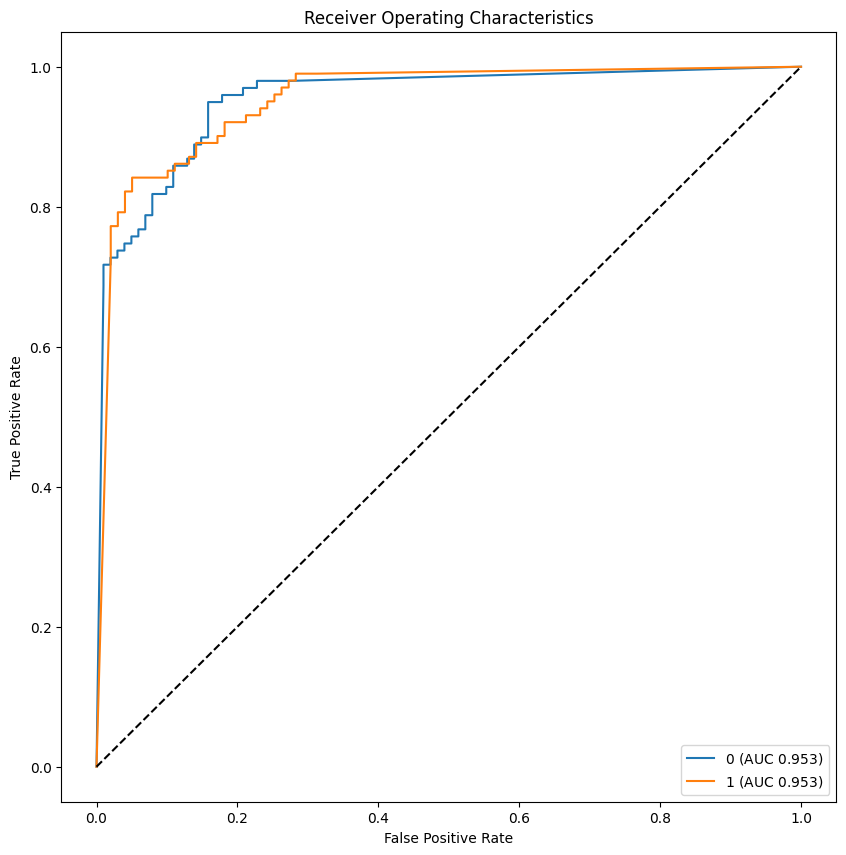

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


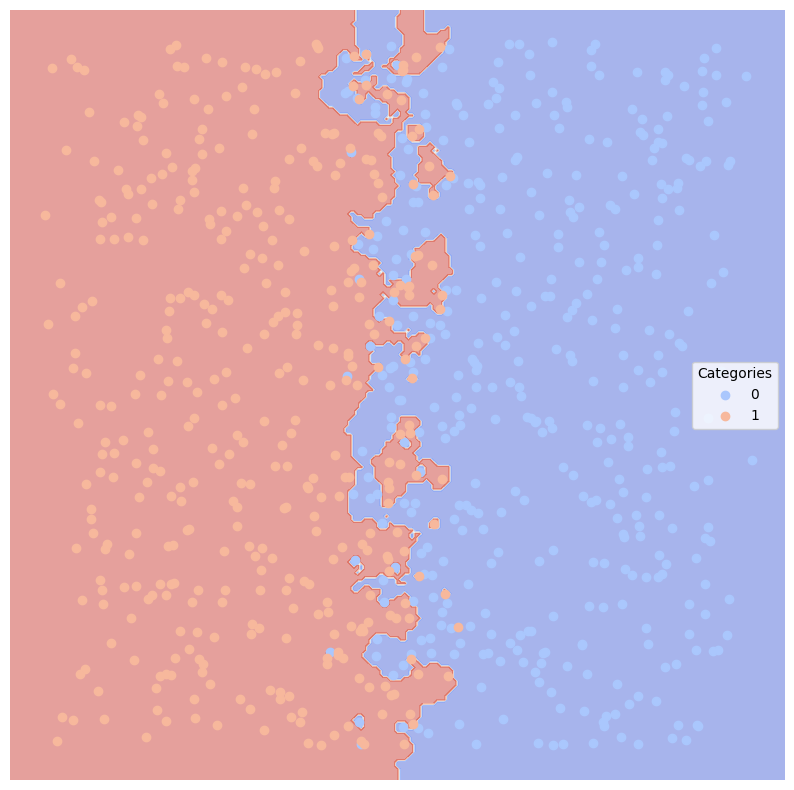

Training and evaluating Decision Tree


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


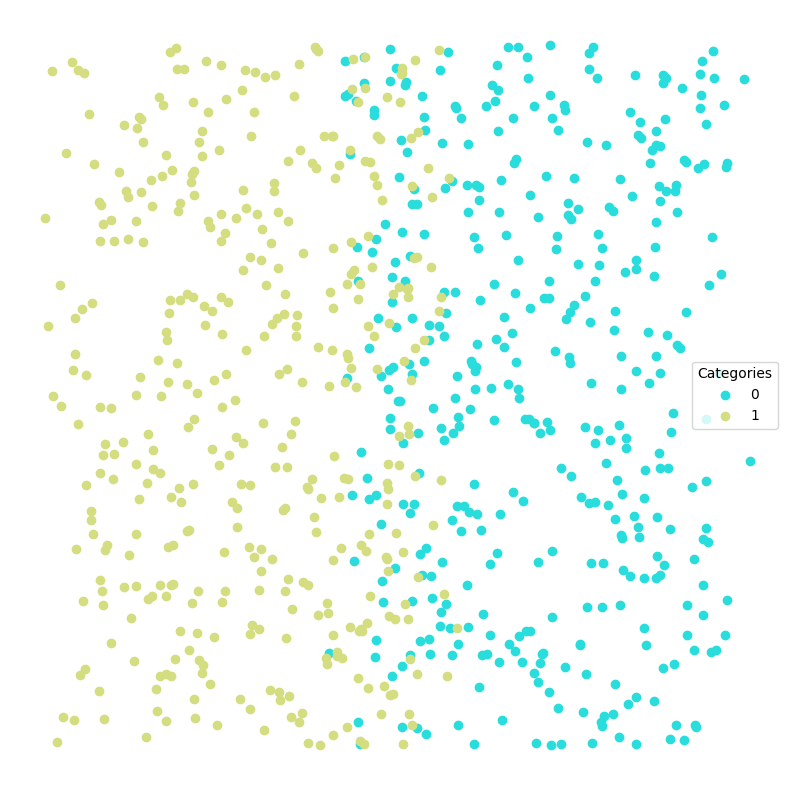

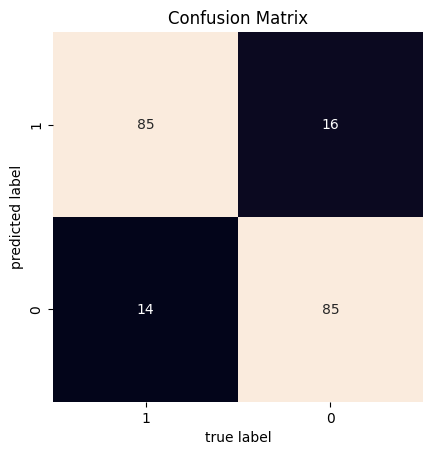

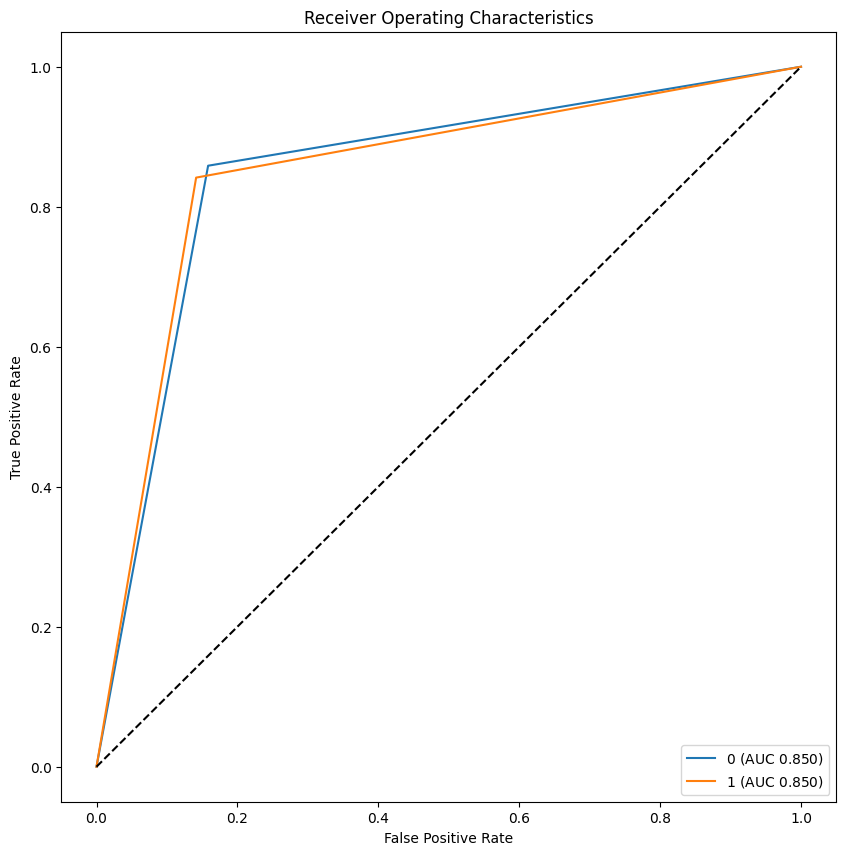

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


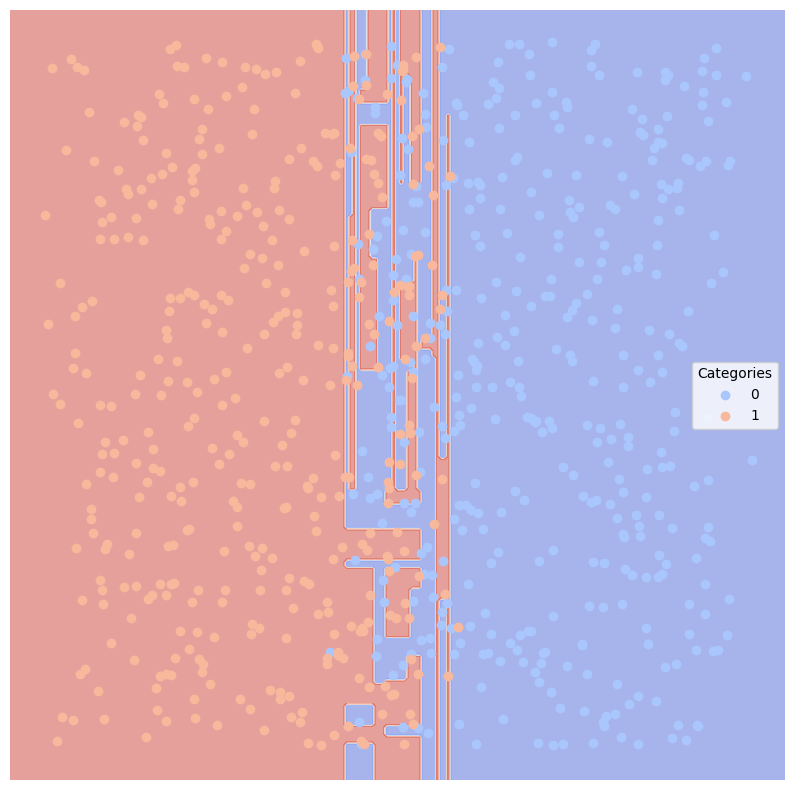

Training and evaluating Random Forest


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


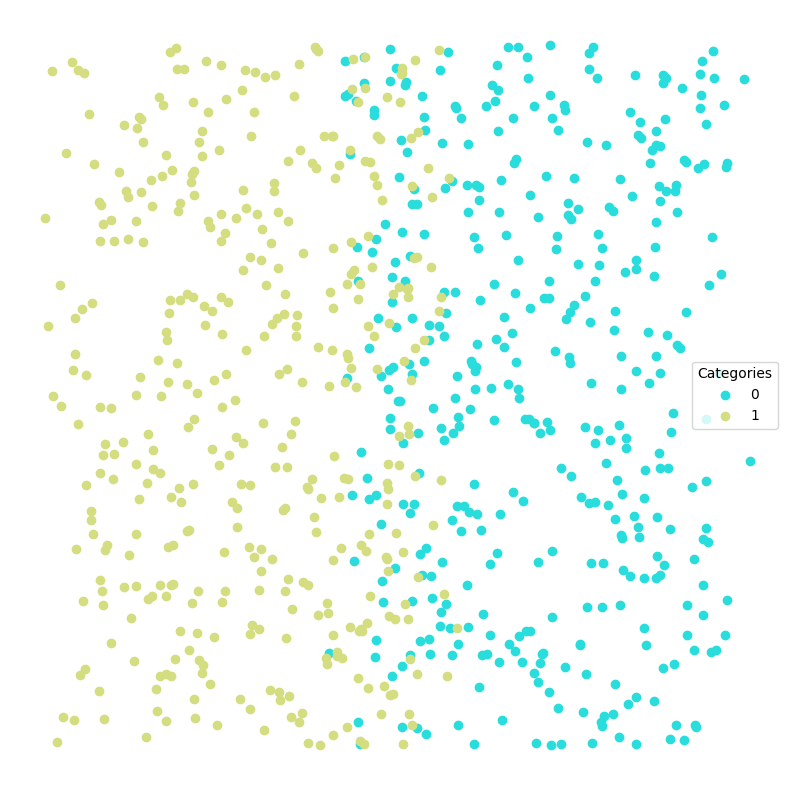

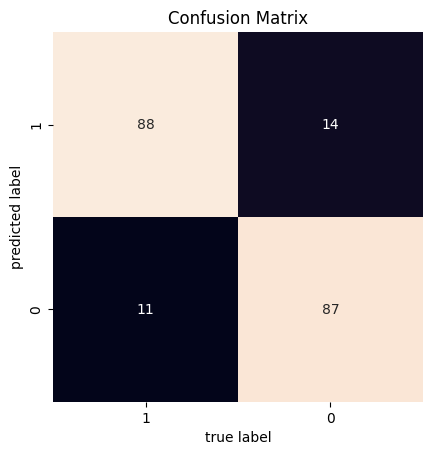

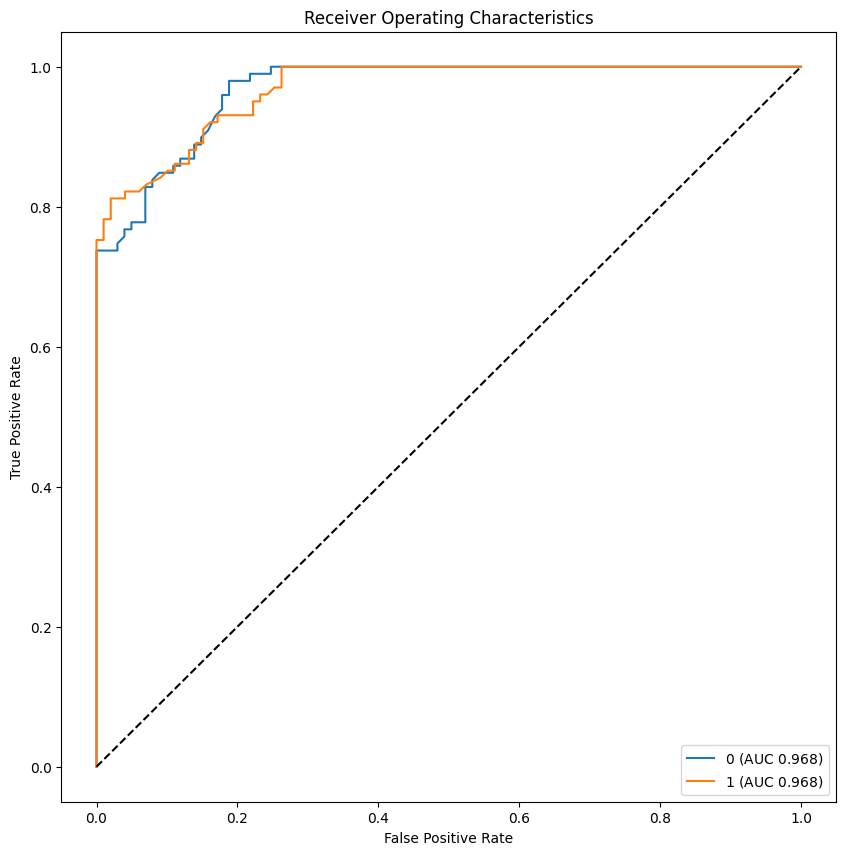

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


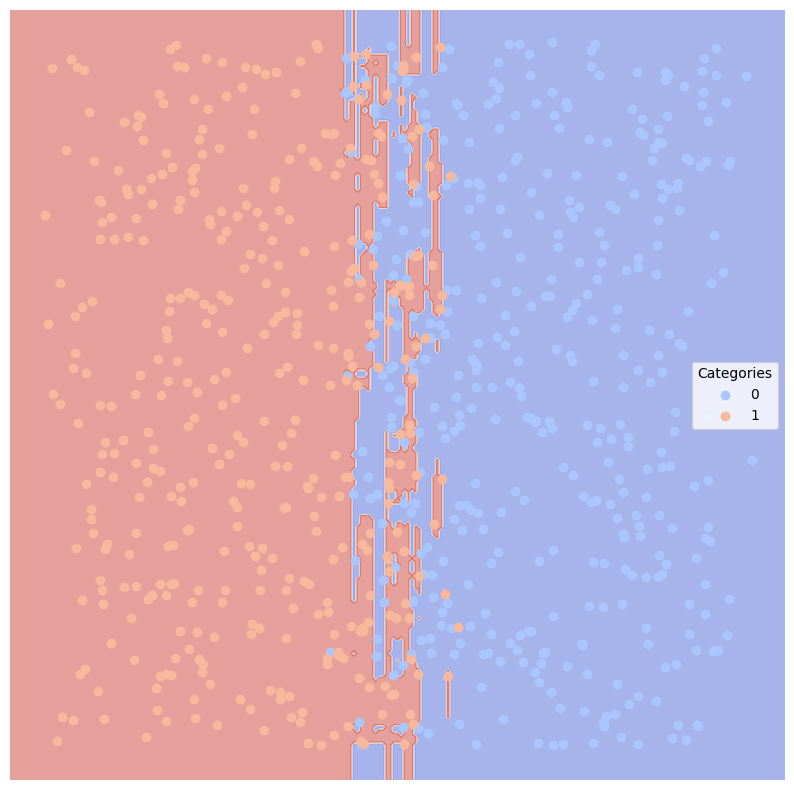

Training and evaluating MLP Classifier


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


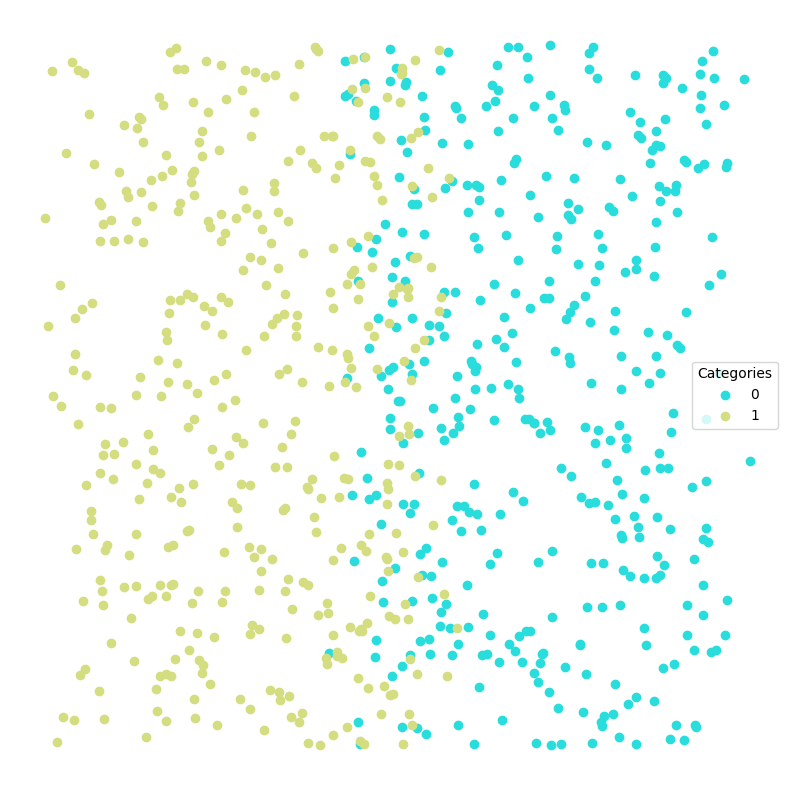

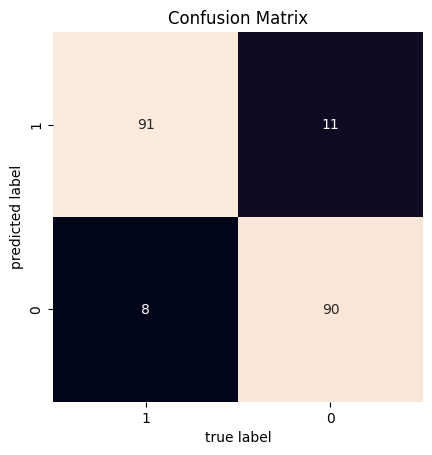

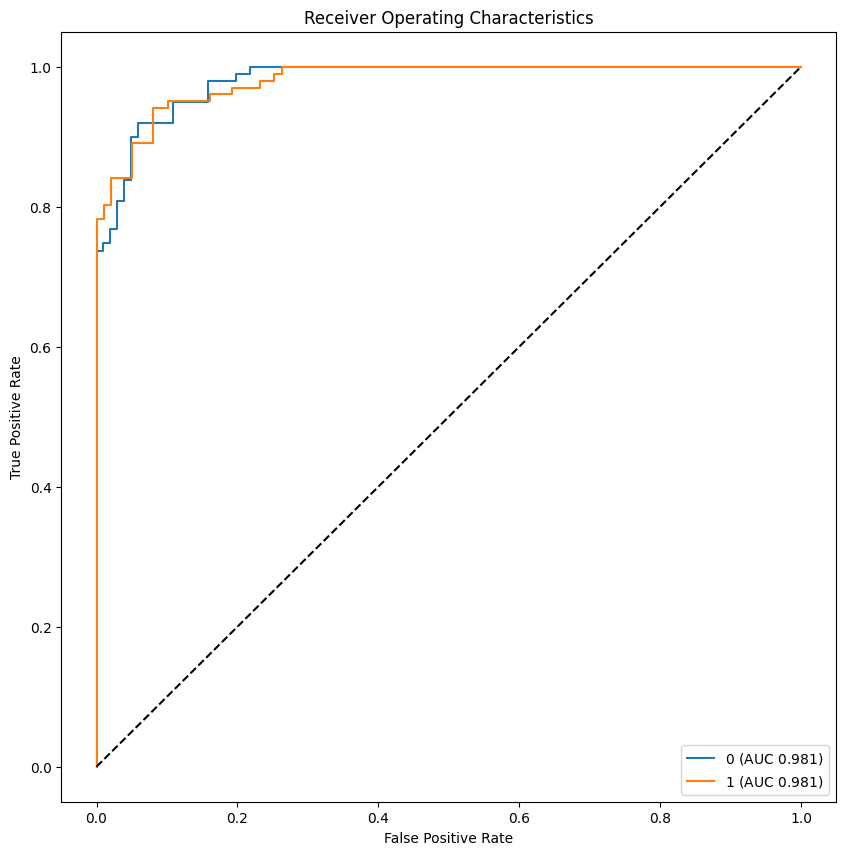

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


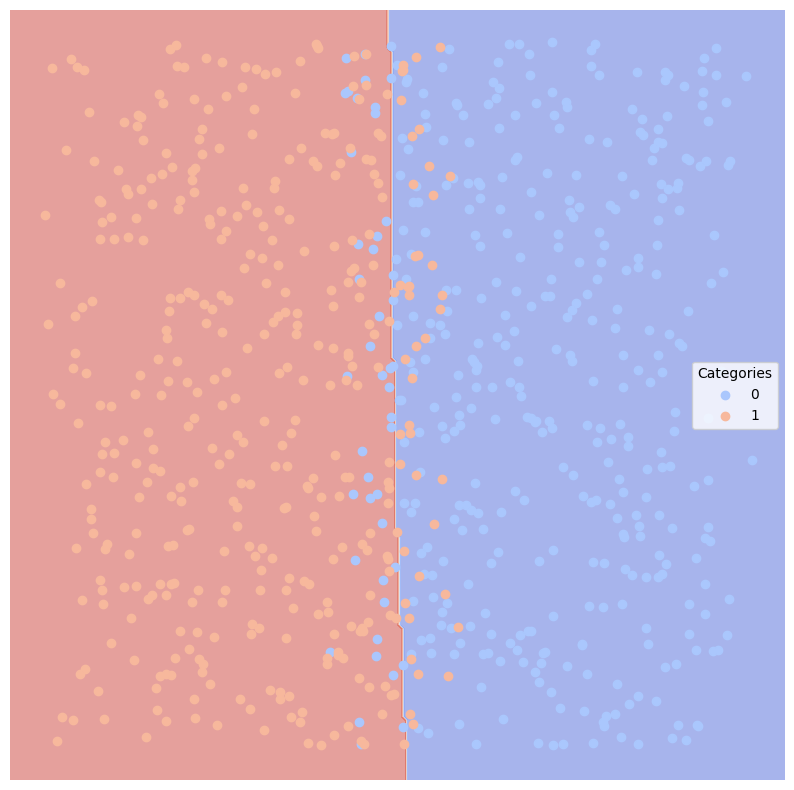

Training and evaluating Gradient Boosting


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


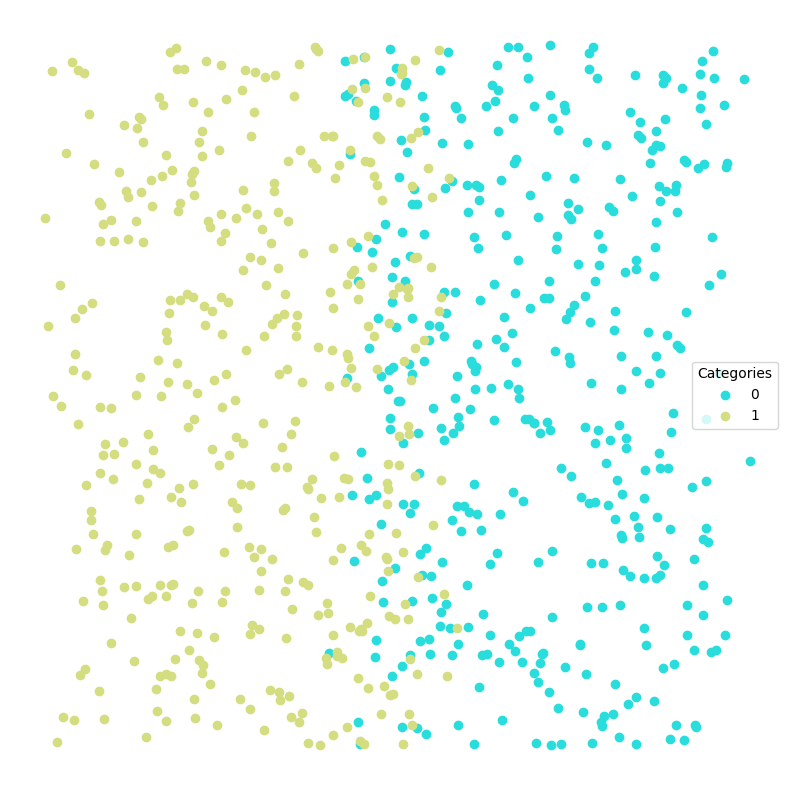

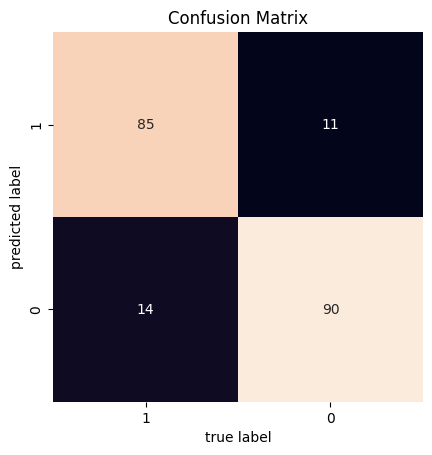

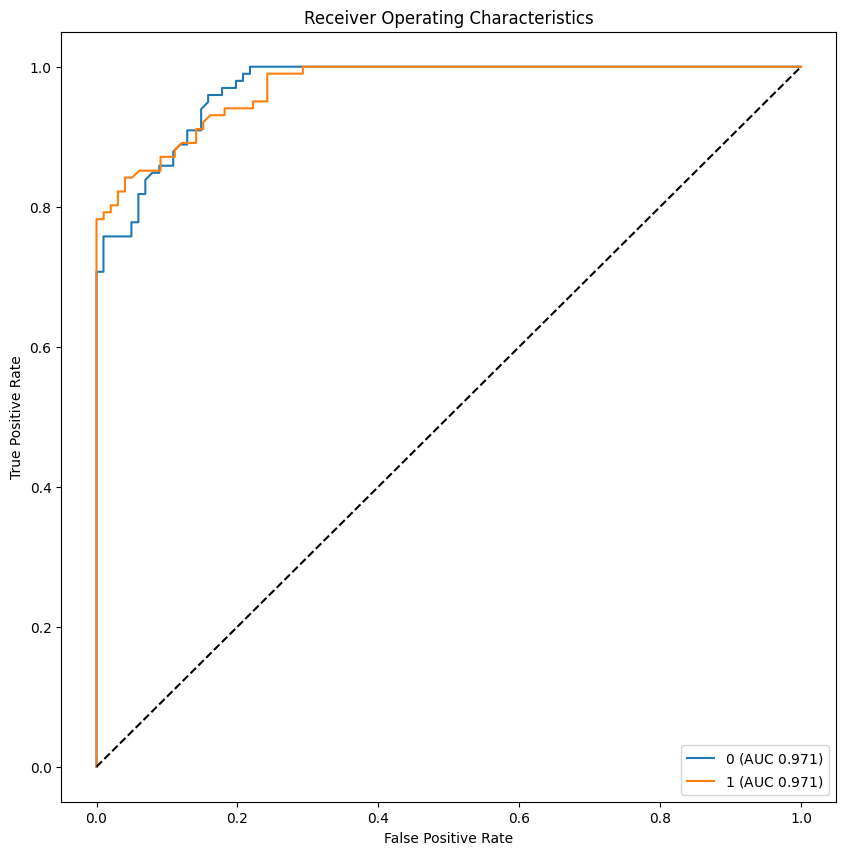

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


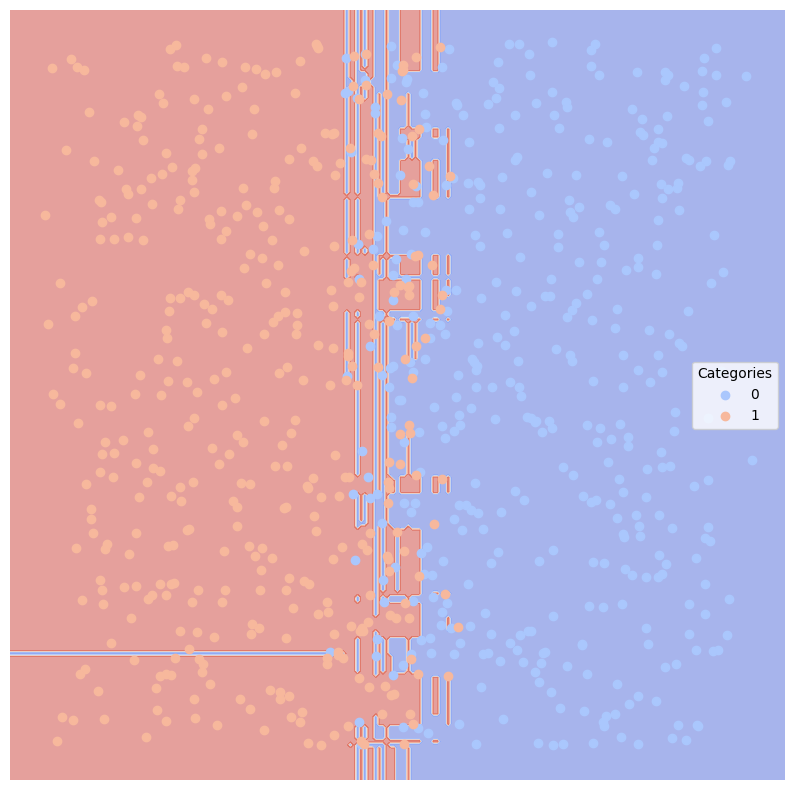

In [ ]:
import numpy as np
import sklearn.linear_model
import sklearn.naive_bayes
import sklearn.svm
import sklearn.neighbors
import sklearn.tree
import sklearn.ensemble
import sklearn.neural_network
from sklearn.naive_bayes import GaussianNB

# Define a list of classifiers
classifiers = [
    ("Logistic Regression", sklearn.linear_model.LogisticRegression()),
    ("Gaussian Naive Bayes", sklearn.naive_bayes.GaussianNB()),
    ("SVC Linear", sklearn.svm.SVC(kernel='linear', probability=True)),
    ("SVC Poly", sklearn.svm.SVC(kernel='poly', degree=3, probability=True)),
    ("KNeighbors Classifier", sklearn.neighbors.KNeighborsClassifier(5, weights='distance')),
    ("Decision Tree", sklearn.tree.DecisionTreeClassifier()),
    ("Random Forest", sklearn.ensemble.RandomForestClassifier()),
    ("MLP Classifier", sklearn.neural_network.MLPClassifier()),
    ("Gradient Boosting", sklearn.ensemble.GradientBoostingClassifier())
]

# Loop through each classifier
for name, clf in classifiers:
    print(f"Training and evaluating {name}")
    # Training classifier
    clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])

    # Evaluation classifier
    lucem_illud.evaluateClassifier(clf, dfTest)

    # Plot
    lucem_illud.plotter(dfTrain)

    # Plot confusion matrix
    lucem_illud.plotConfusionMatrix(clf, dfTest)

    # Plot ROC curve
    lucem_illud.plotMultiROC(clf, dfTest)

    # Plot the decision region
    lucem_illud.plotregions(clf, dfTrain)

# For Split data, all the classifier performed well, except `Decision Tree` model which trying to classify more precicely but loss effectiveness, while `SVC Poly` model is the best classifier because it reached a balance between precise and efficient

In [ ]:
noise = .2

#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.random(noise), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.andSplit(noise), test_size=.2)
dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.xorSplit(noise), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.targetSplit(noise), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.multiBlobs(noise), test_size=.2)

Training and evaluating Logistic Regression


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


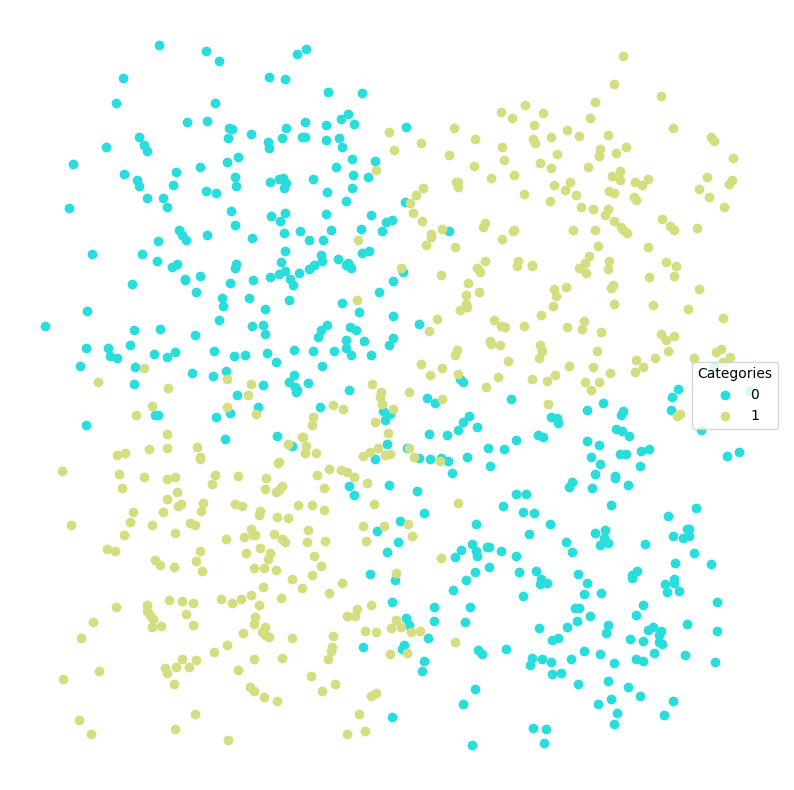

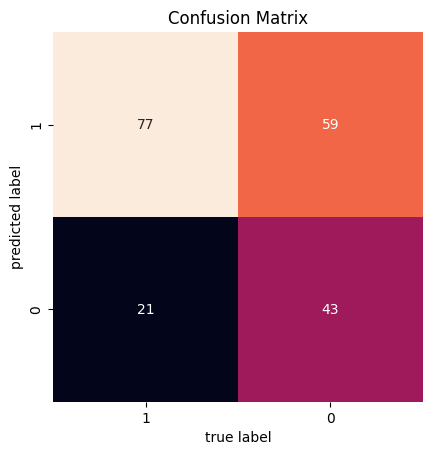

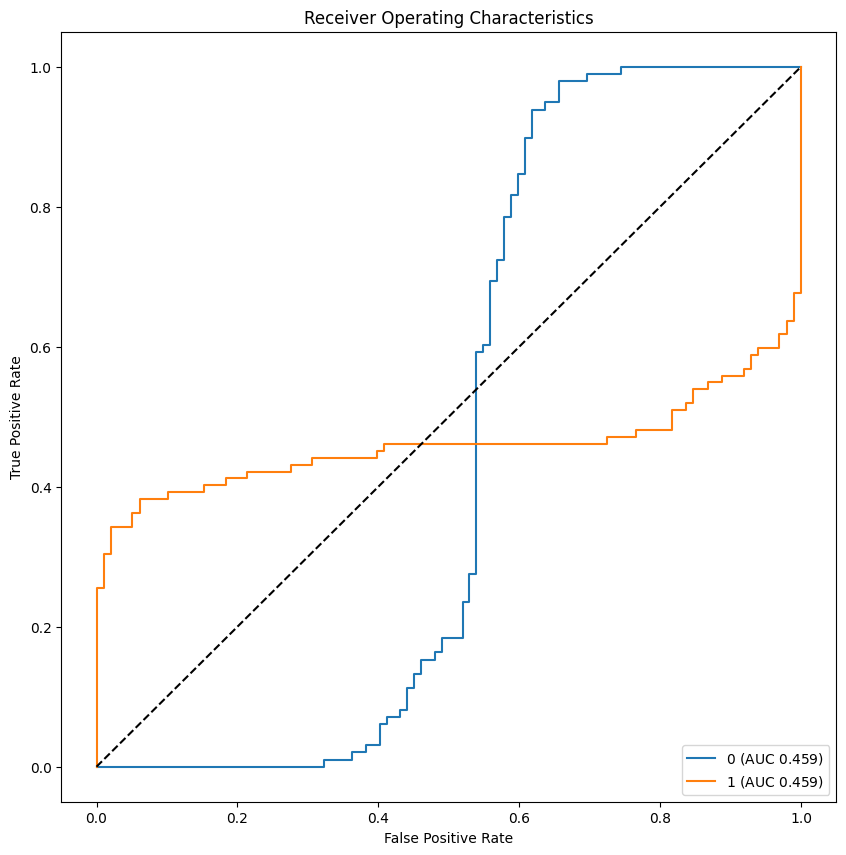

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


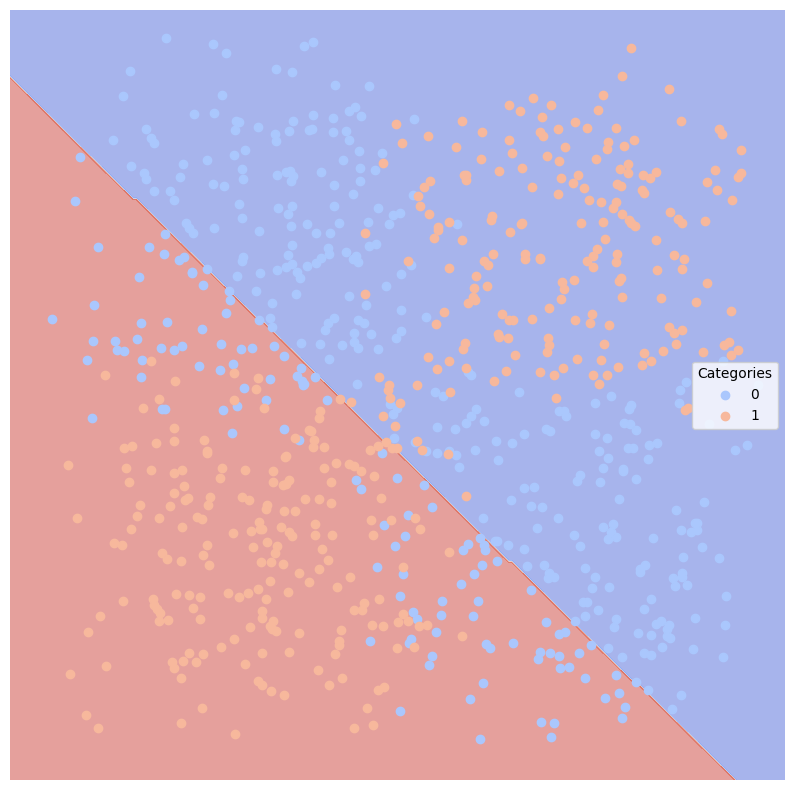

Training and evaluating Gaussian Naive Bayes


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


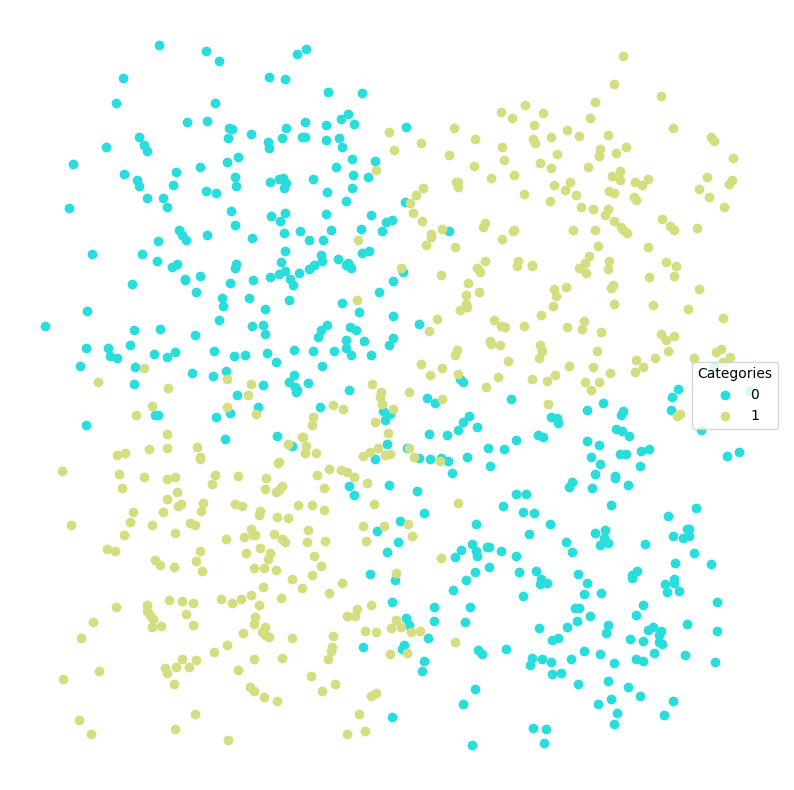

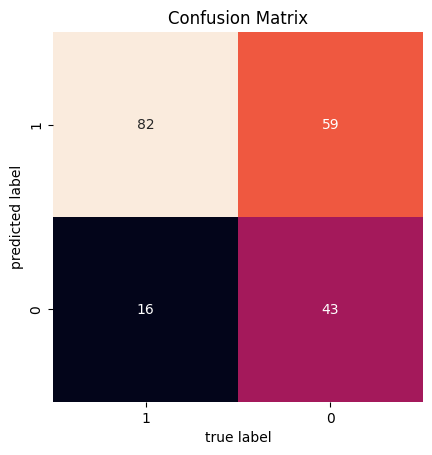

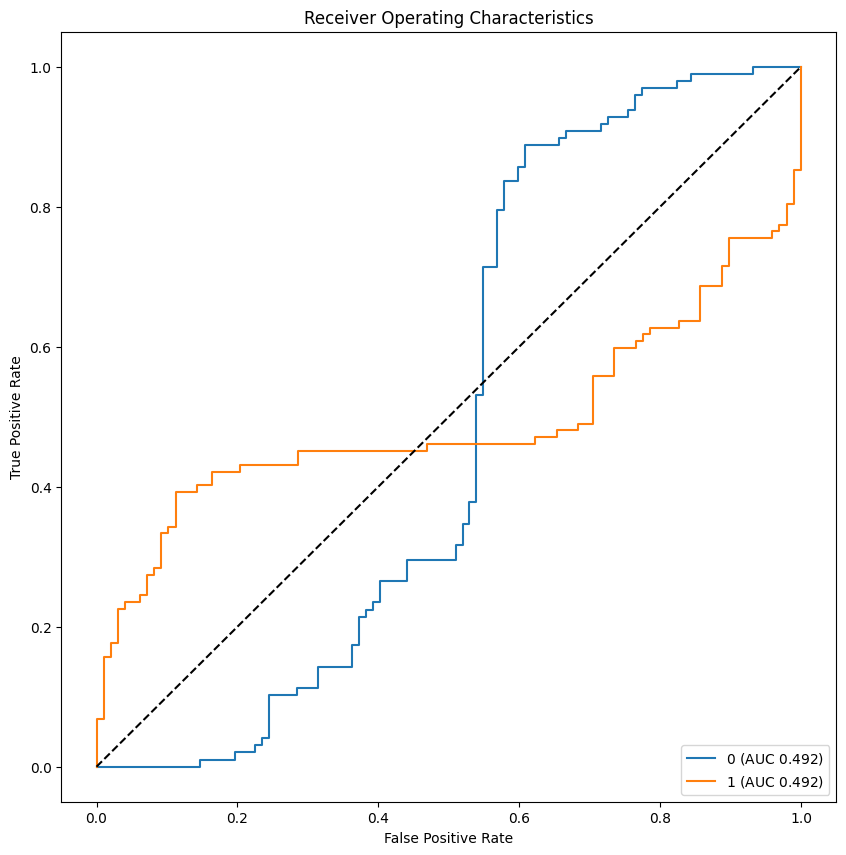

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


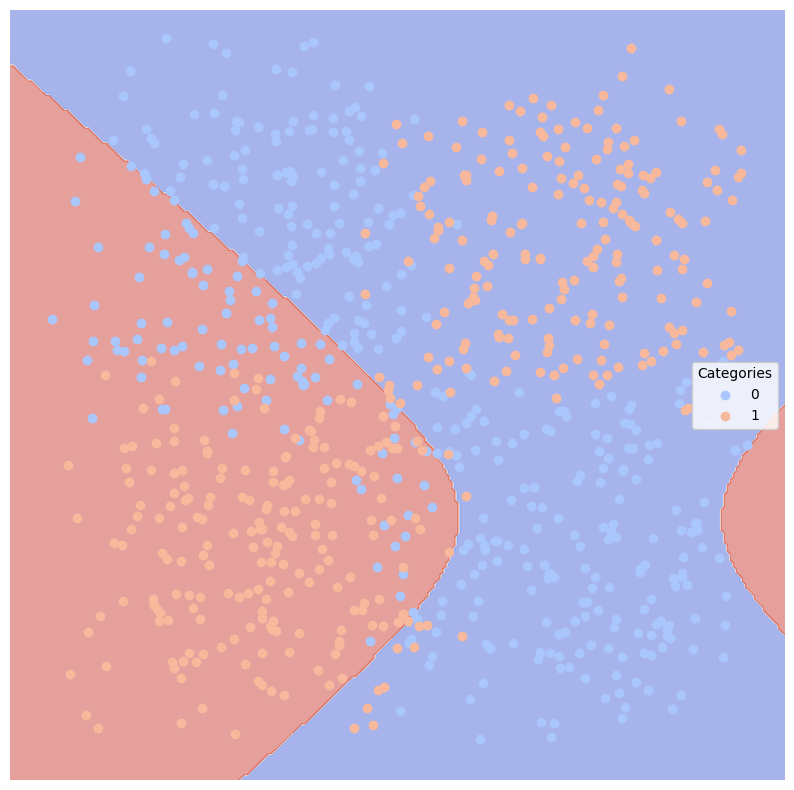

Training and evaluating SVC Linear


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


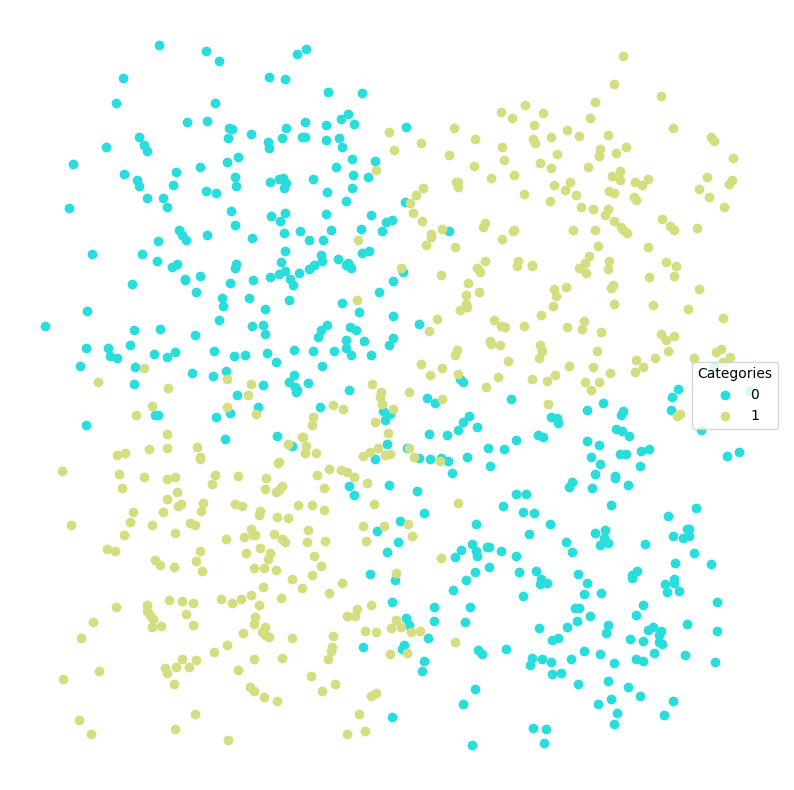

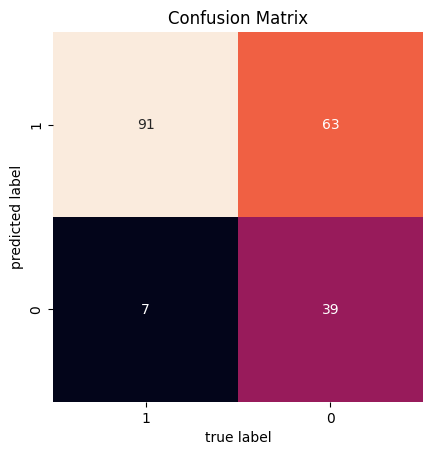

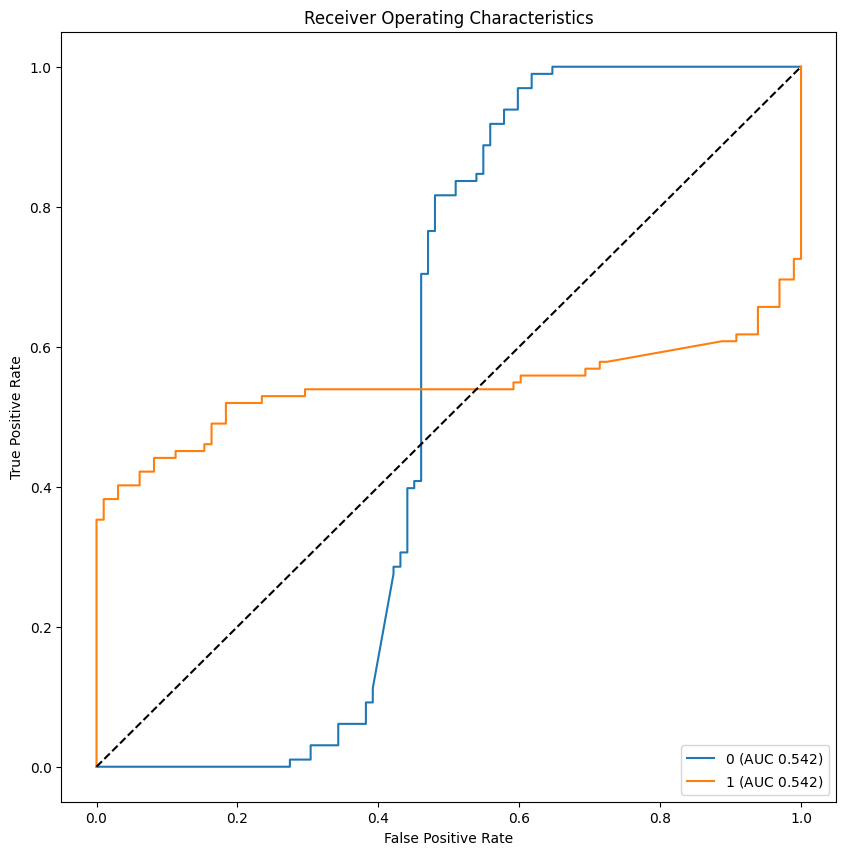

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


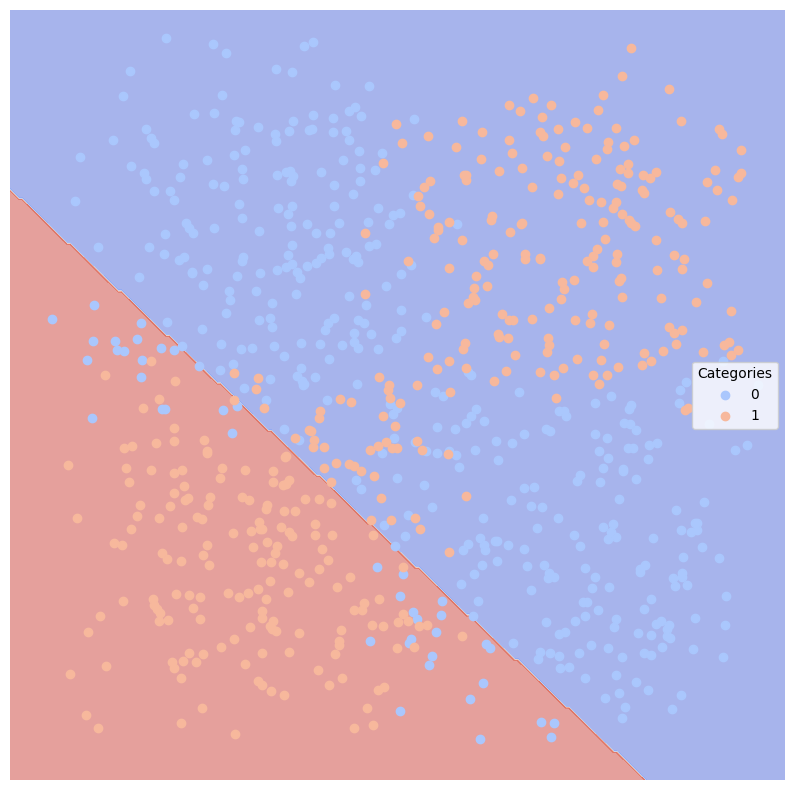

Training and evaluating SVC Poly


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


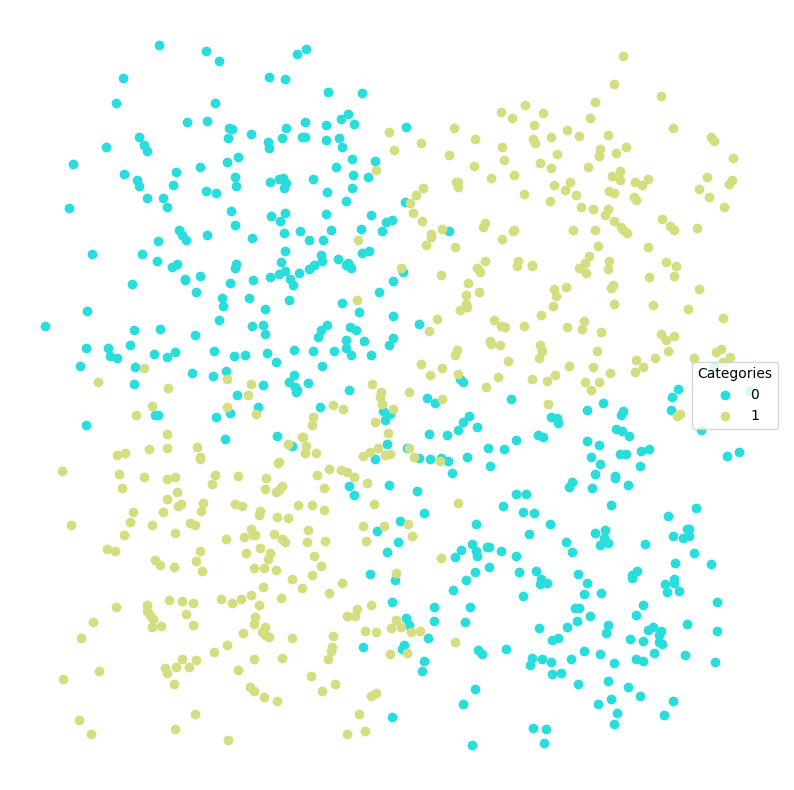

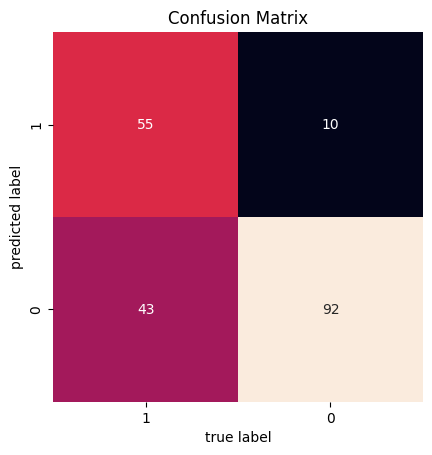

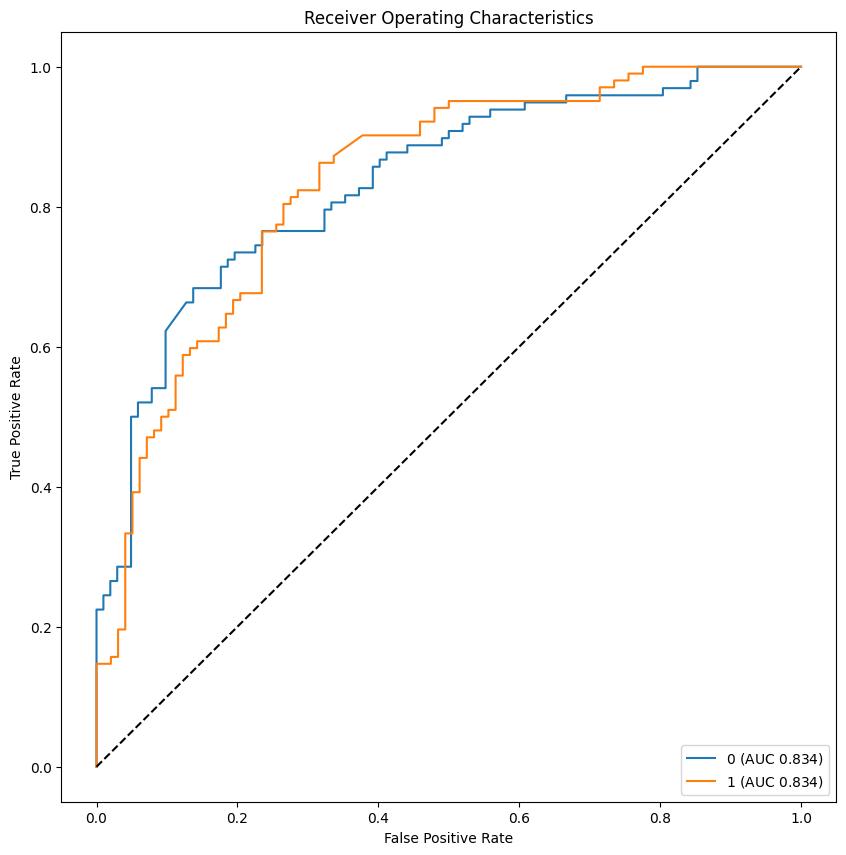

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


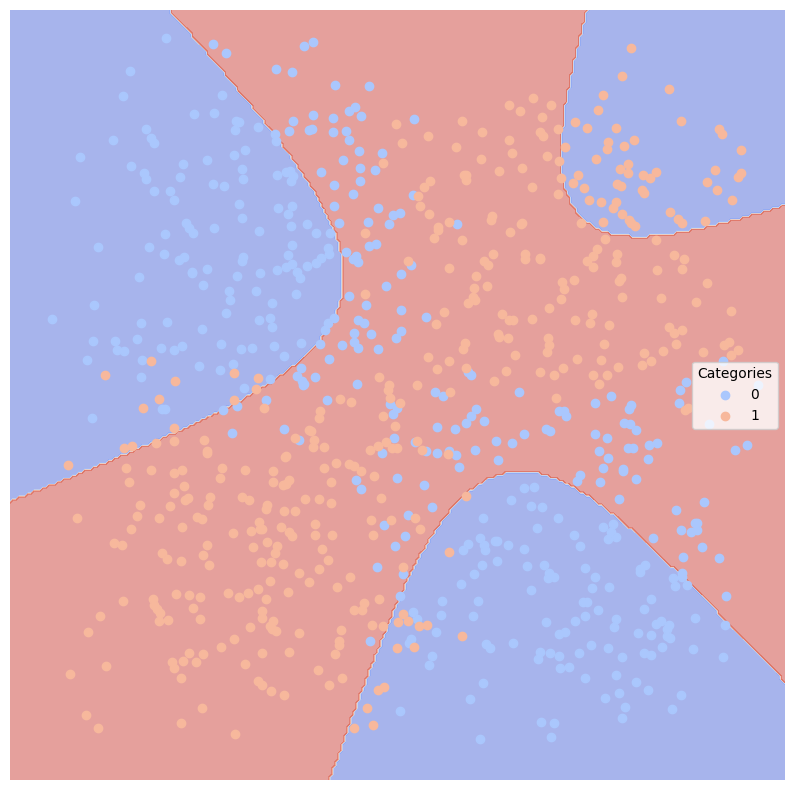

Training and evaluating KNeighbors Classifier


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


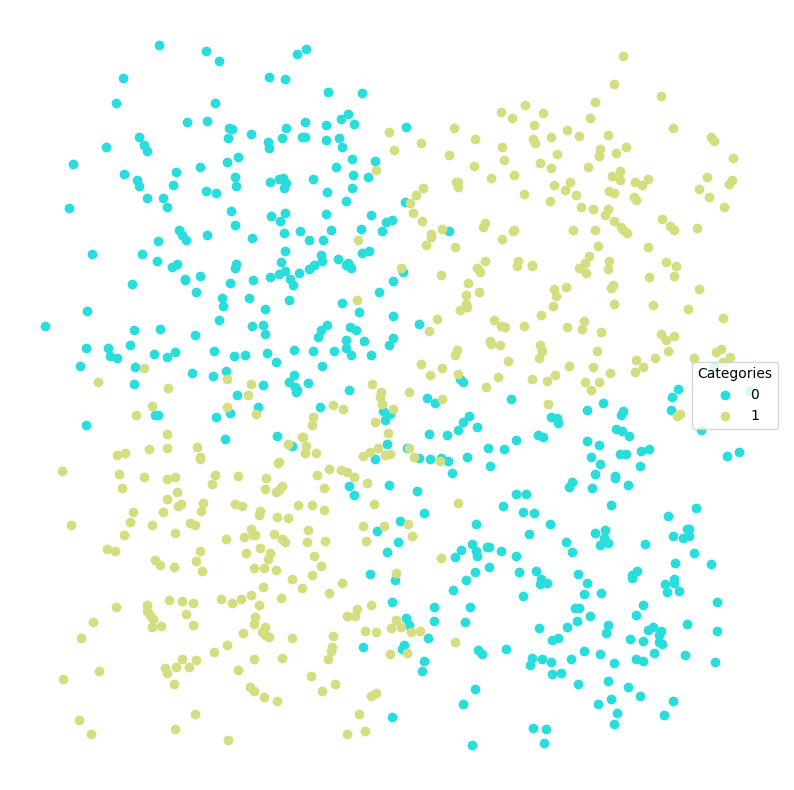

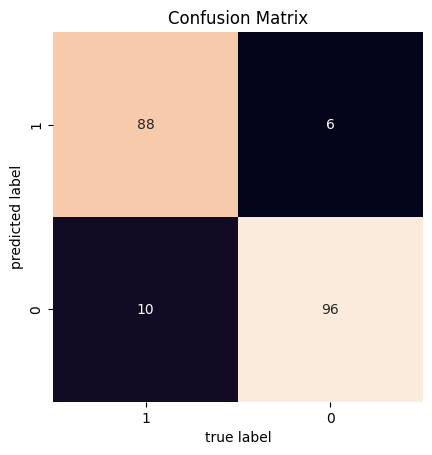

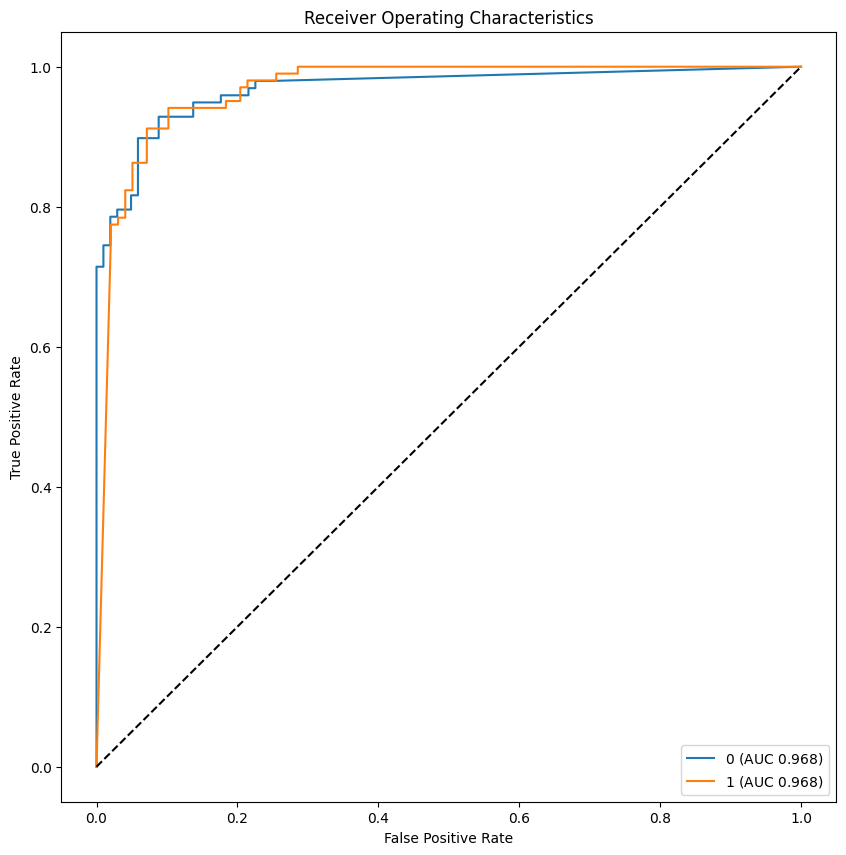

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


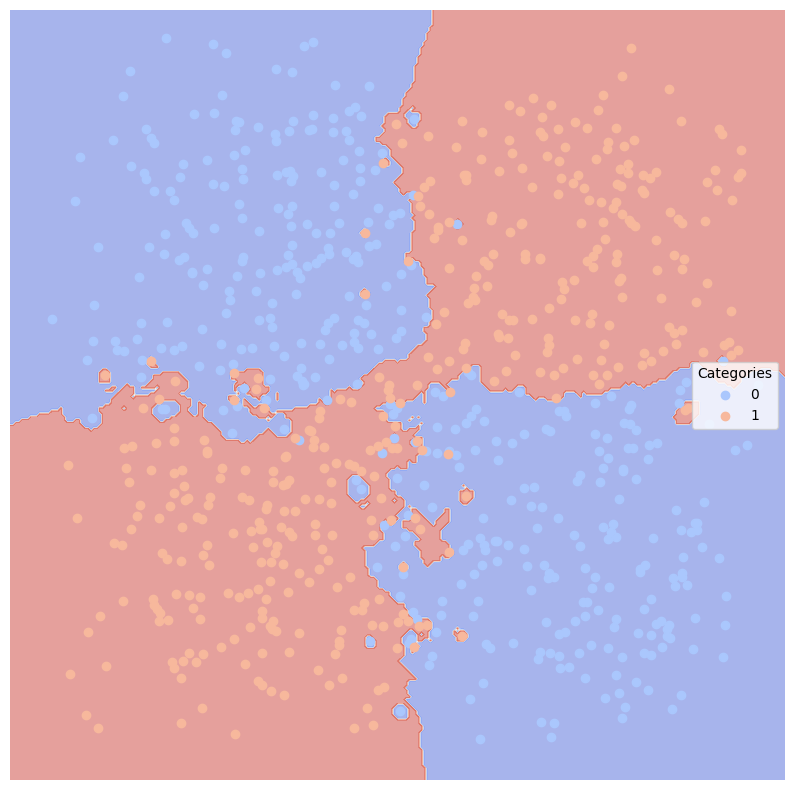

Training and evaluating Decision Tree


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


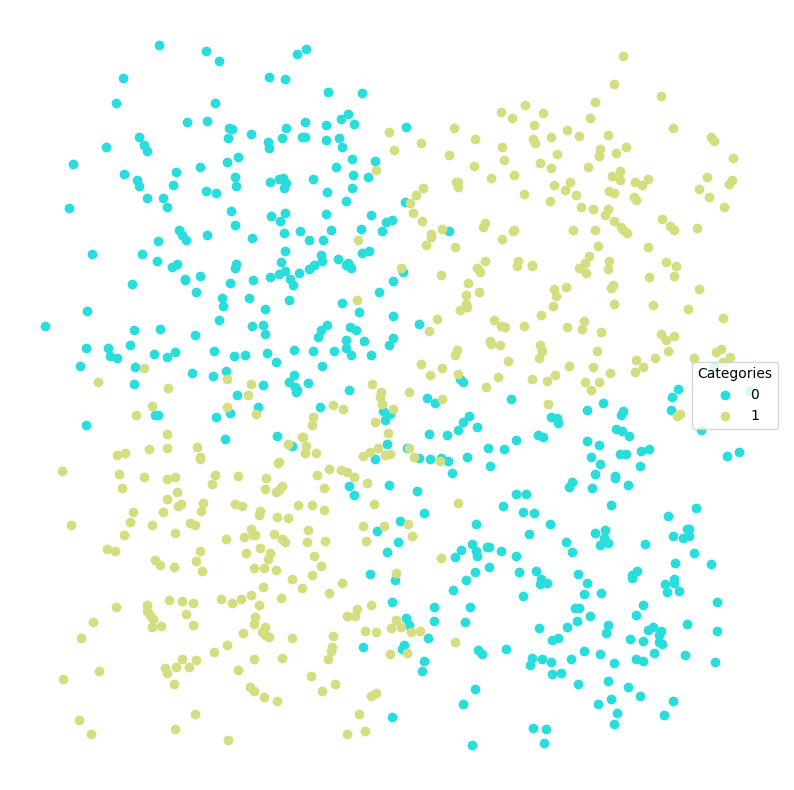

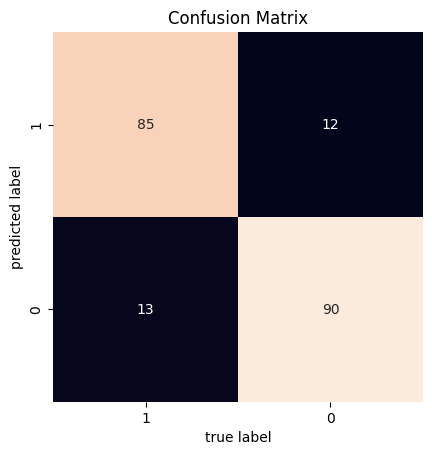

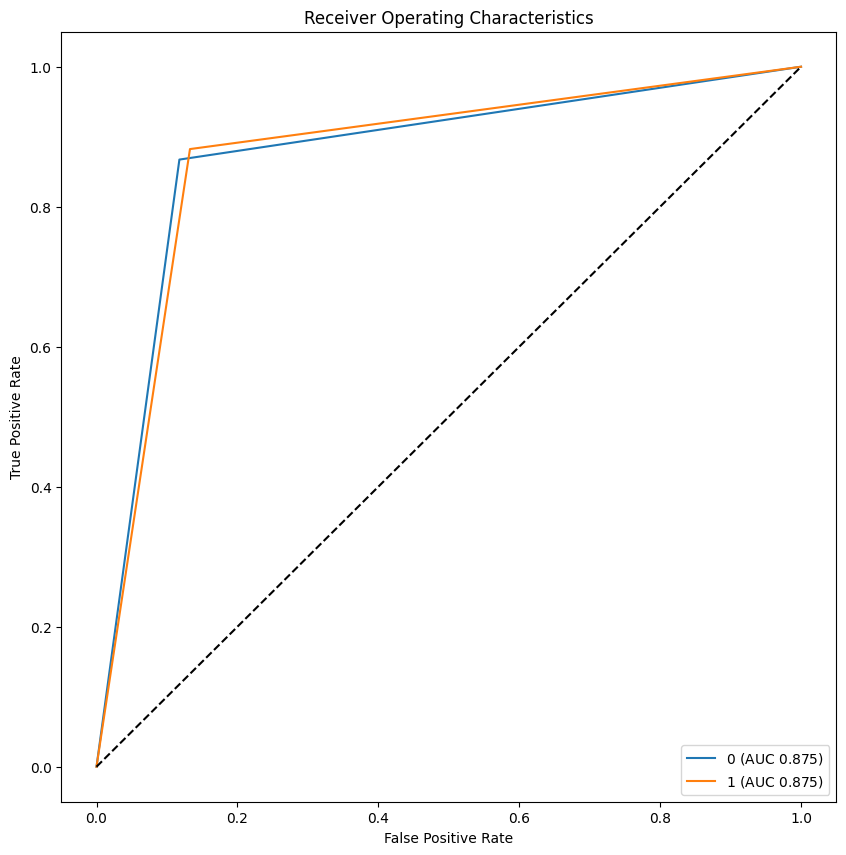

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


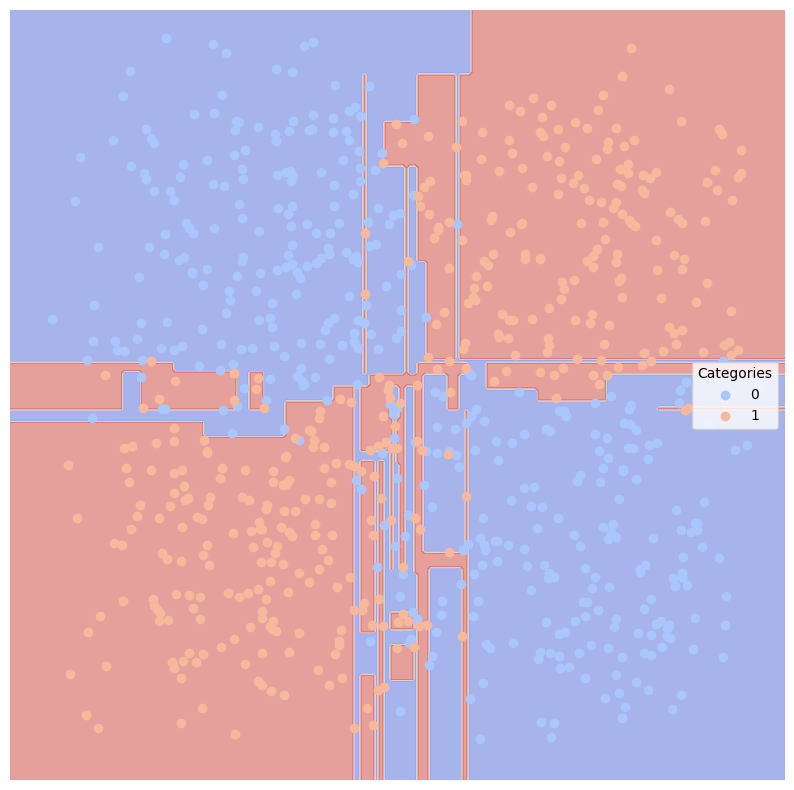

Training and evaluating Random Forest


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


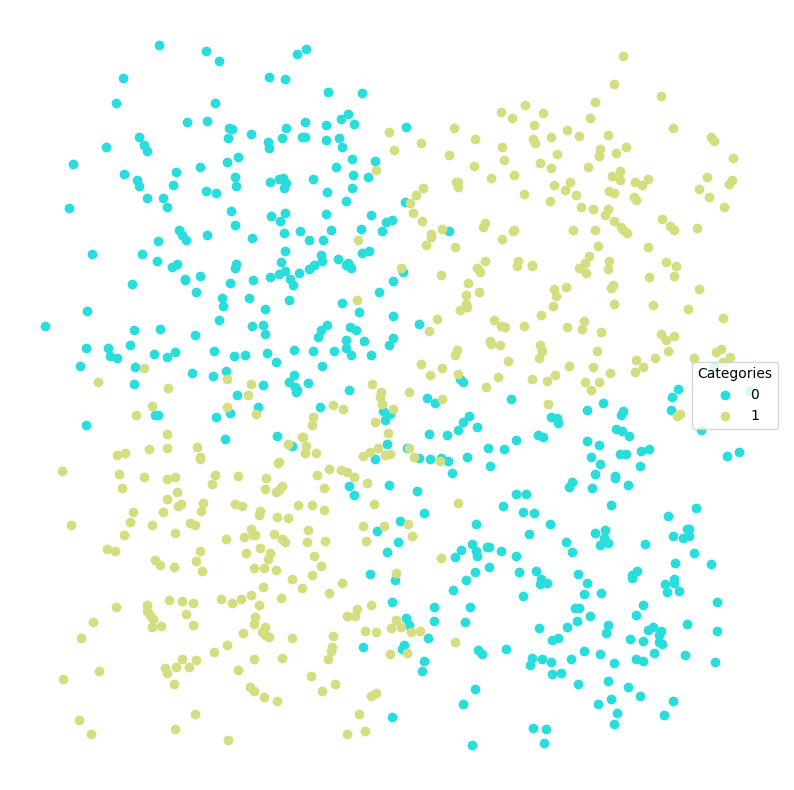

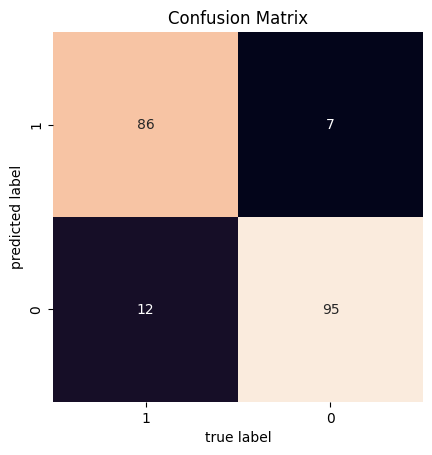

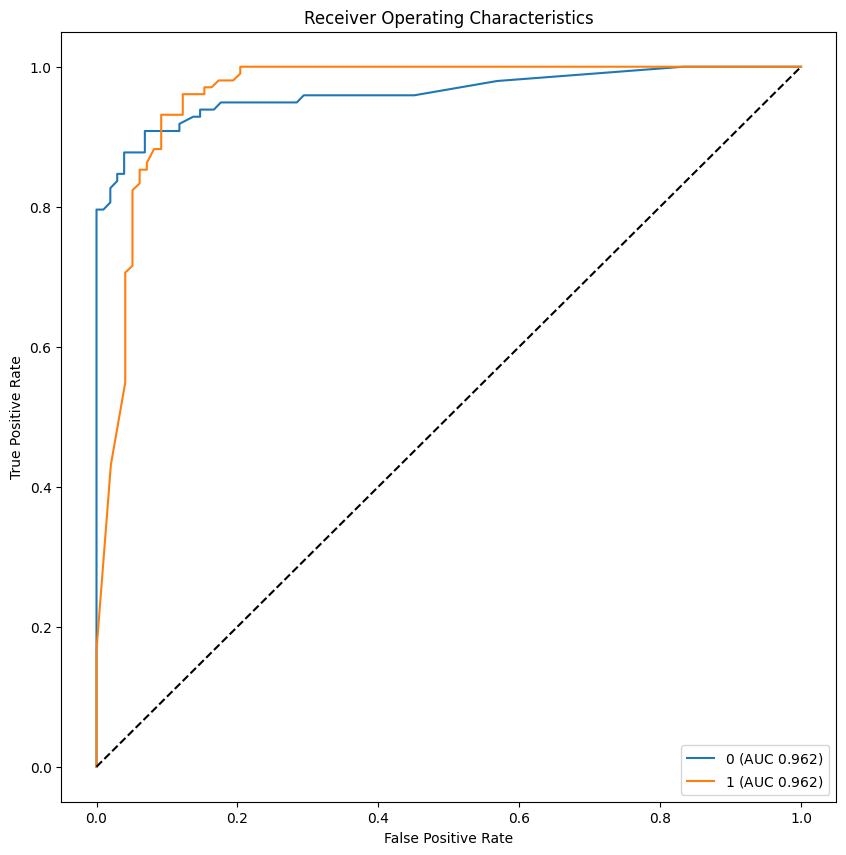

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


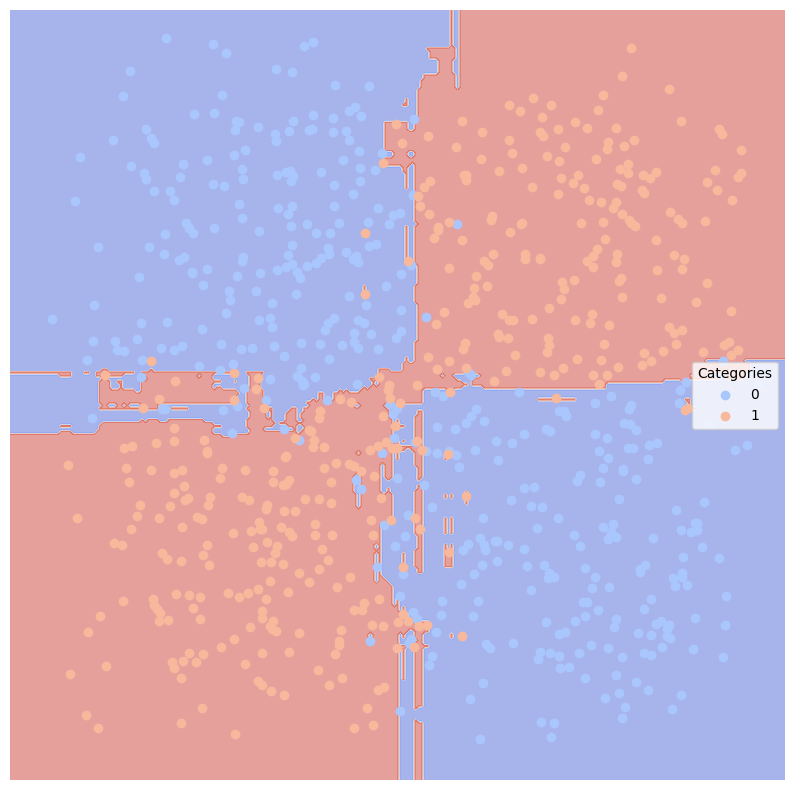

Training and evaluating MLP Classifier


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


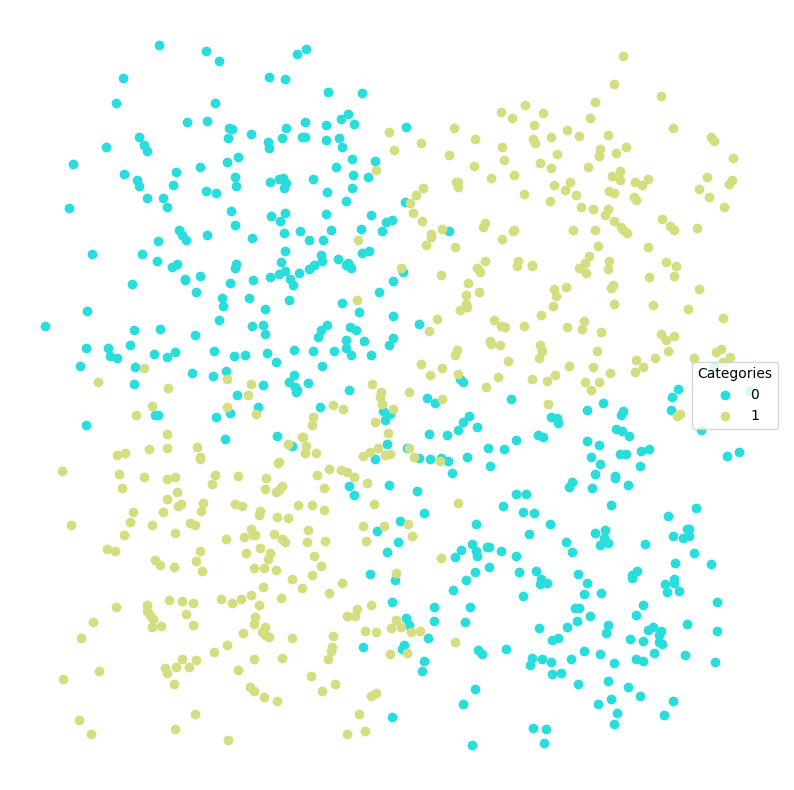

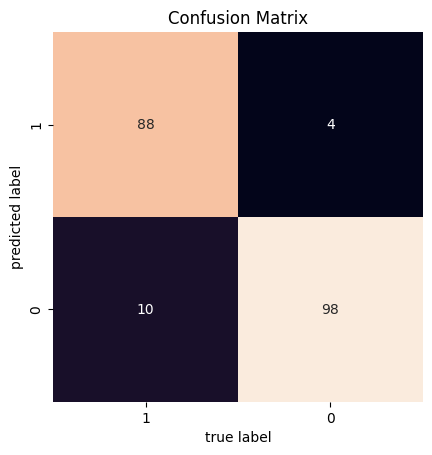

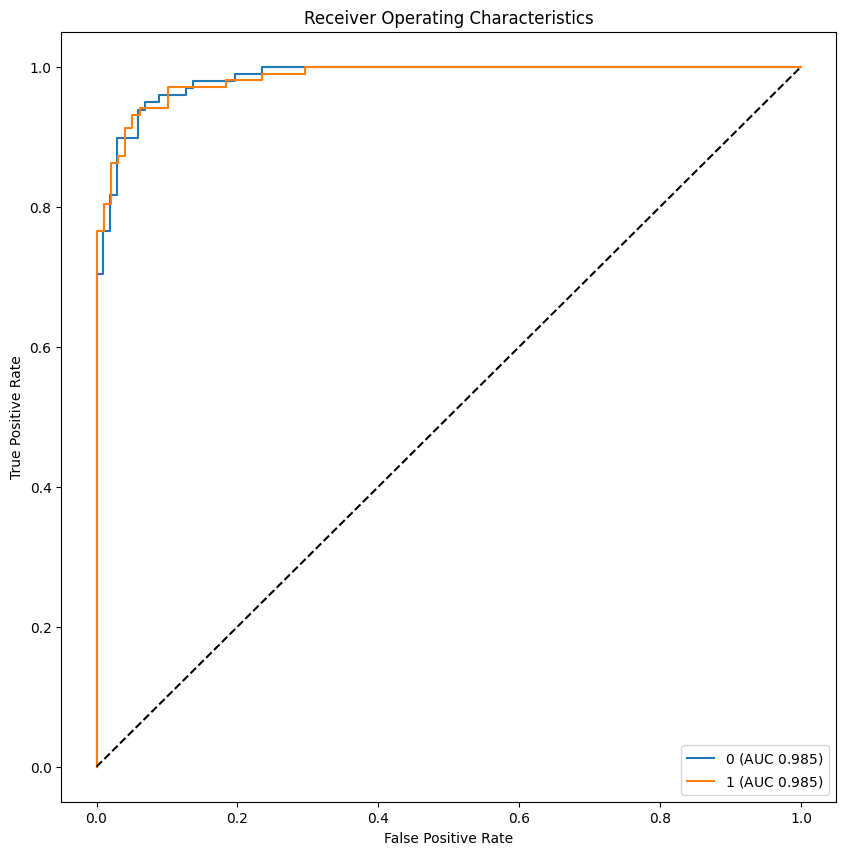

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


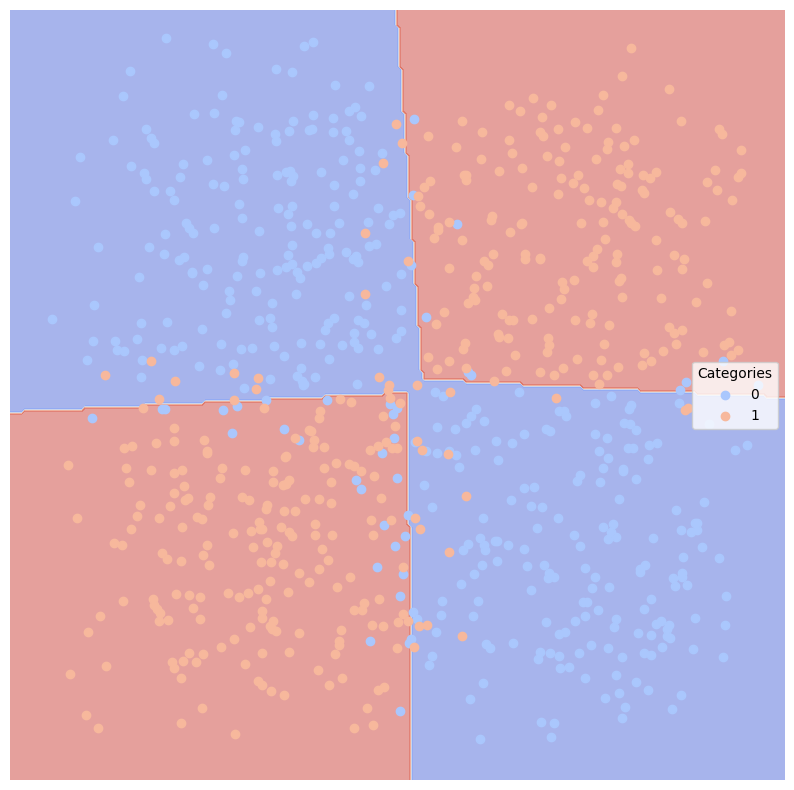

Training and evaluating Gradient Boosting


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


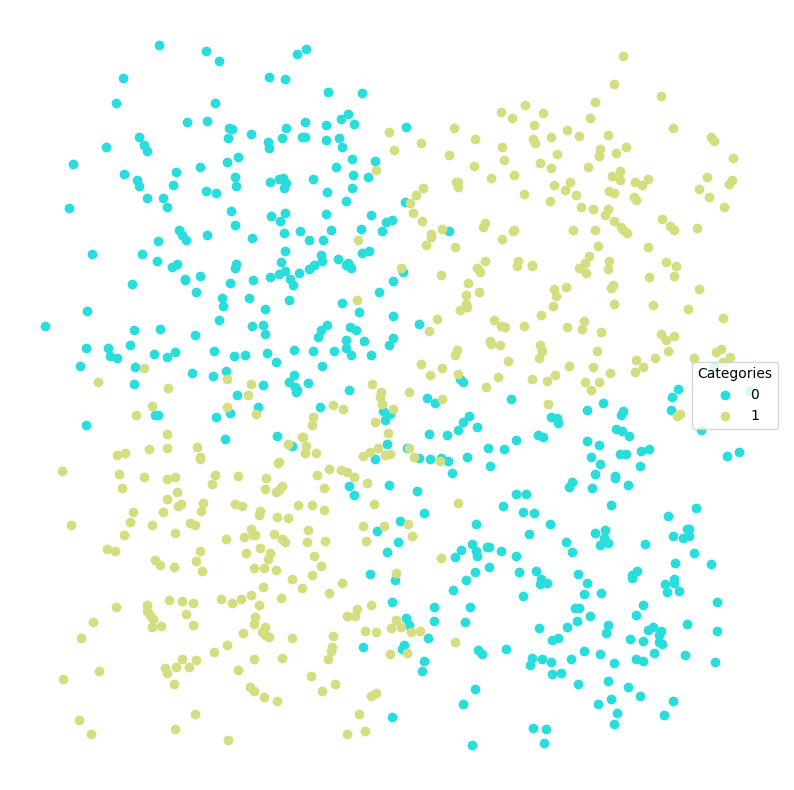

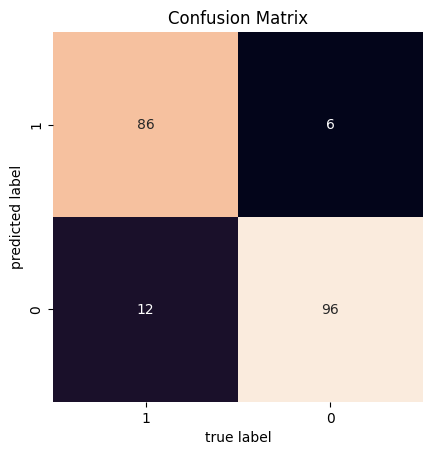

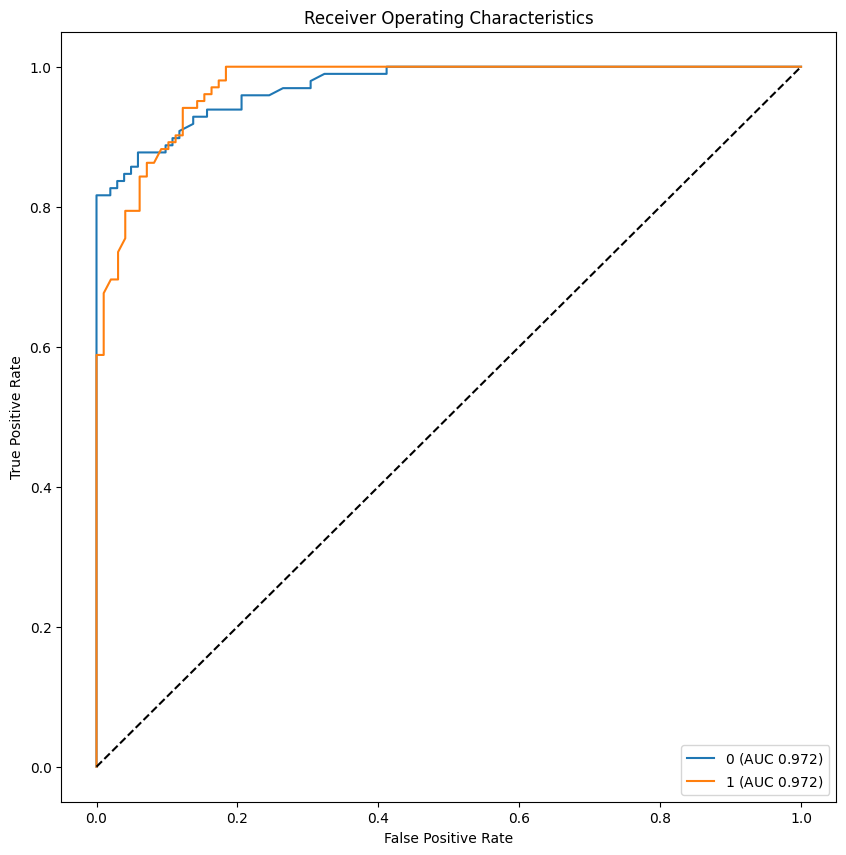

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


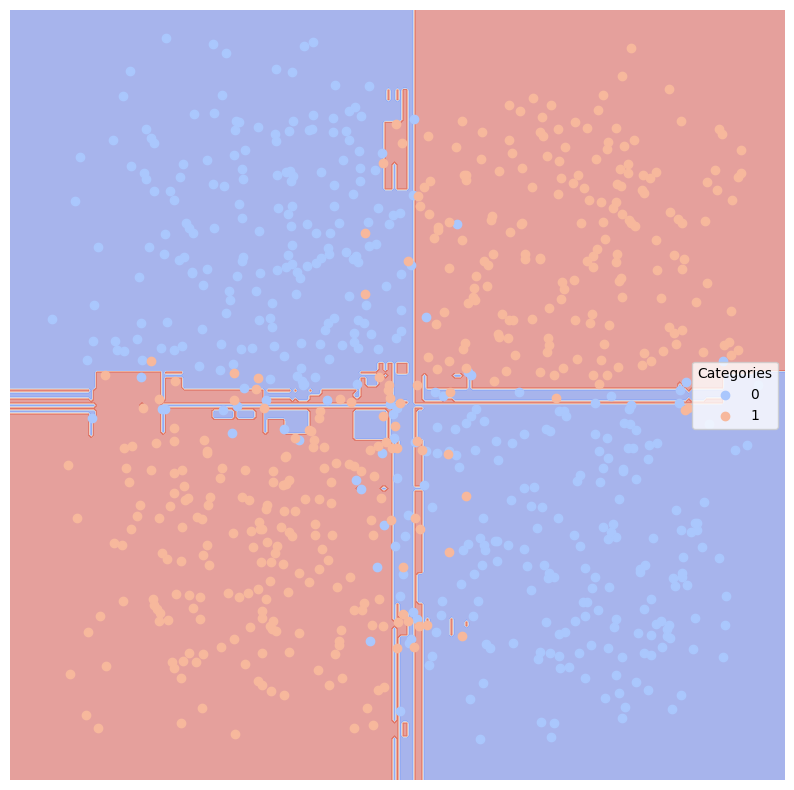

In [ ]:
import numpy as np
import sklearn.linear_model
import sklearn.naive_bayes
import sklearn.svm
import sklearn.neighbors
import sklearn.tree
import sklearn.ensemble
import sklearn.neural_network
from sklearn.naive_bayes import GaussianNB

# Define a list of classifiers
classifiers = [
    ("Logistic Regression", sklearn.linear_model.LogisticRegression()),
    ("Gaussian Naive Bayes", sklearn.naive_bayes.GaussianNB()),
    ("SVC Linear", sklearn.svm.SVC(kernel='linear', probability=True)),
    ("SVC Poly", sklearn.svm.SVC(kernel='poly', degree=3, probability=True)),
    ("KNeighbors Classifier", sklearn.neighbors.KNeighborsClassifier(5, weights='distance')),
    ("Decision Tree", sklearn.tree.DecisionTreeClassifier()),
    ("Random Forest", sklearn.ensemble.RandomForestClassifier()),
    ("MLP Classifier", sklearn.neural_network.MLPClassifier()),
    ("Gradient Boosting", sklearn.ensemble.GradientBoostingClassifier())
]

# Loop through each classifier
for name, clf in classifiers:
    print(f"Training and evaluating {name}")
    # Training classifier
    clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])

    # Evaluation classifier
    lucem_illud.evaluateClassifier(clf, dfTest)

    # Plot
    lucem_illud.plotter(dfTrain)

    # Plot confusion matrix
    lucem_illud.plotConfusionMatrix(clf, dfTest)

    # Plot ROC curve
    lucem_illud.plotMultiROC(clf, dfTest)

    # Plot the decision region
    lucem_illud.plotregions(clf, dfTrain)

# For xorSplit data, a lot of model Miscategorize half of the data, `Logistic Regression` model is worst, because it miscategorize half of the data, while `KNeighbors Classifier` performs best because it based on nearest neighbours

In [ ]:
noise = .2

#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.random(noise), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.andSplit(noise), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.xorSplit(noise), test_size=.2)
dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.targetSplit(noise), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.multiBlobs(noise), test_size=.2)

Training and evaluating Logistic Regression


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


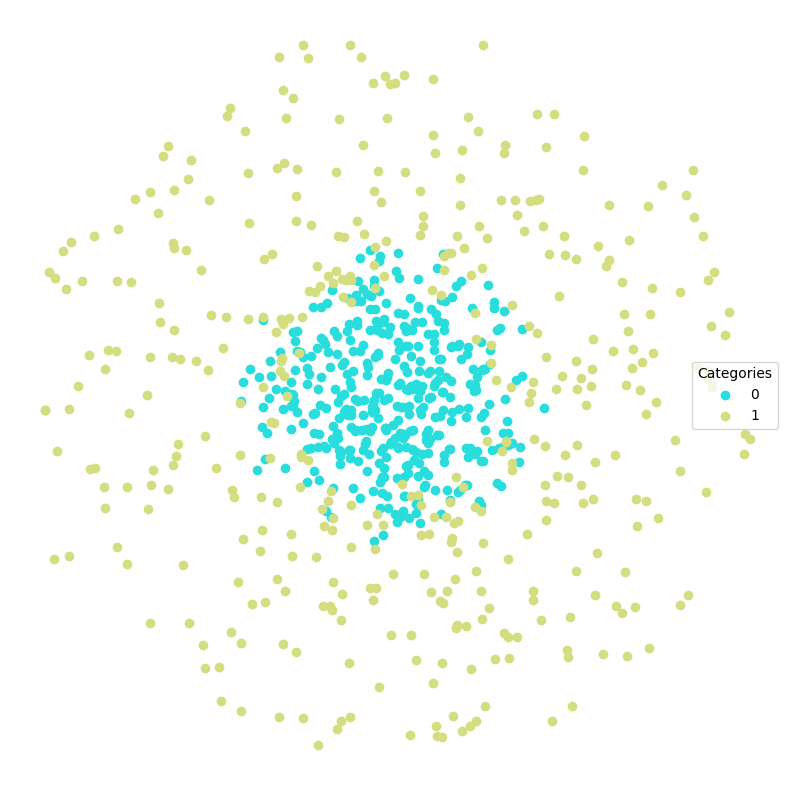

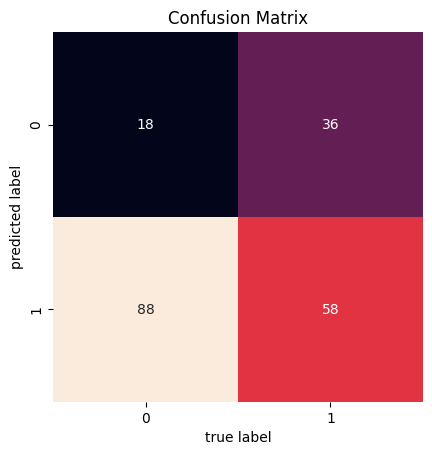

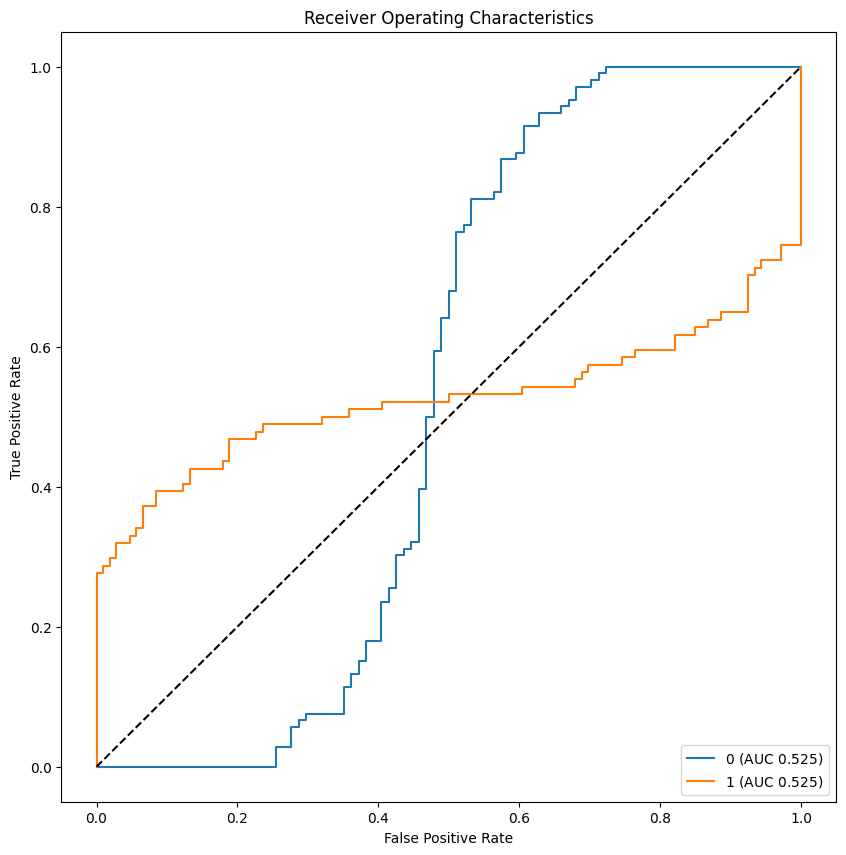

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


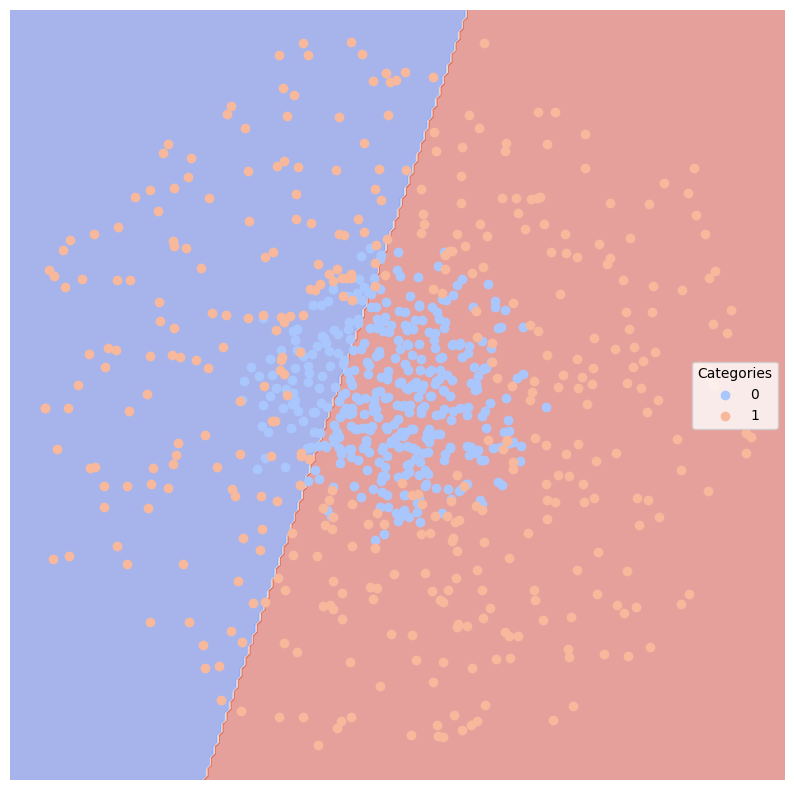

Training and evaluating Gaussian Naive Bayes


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


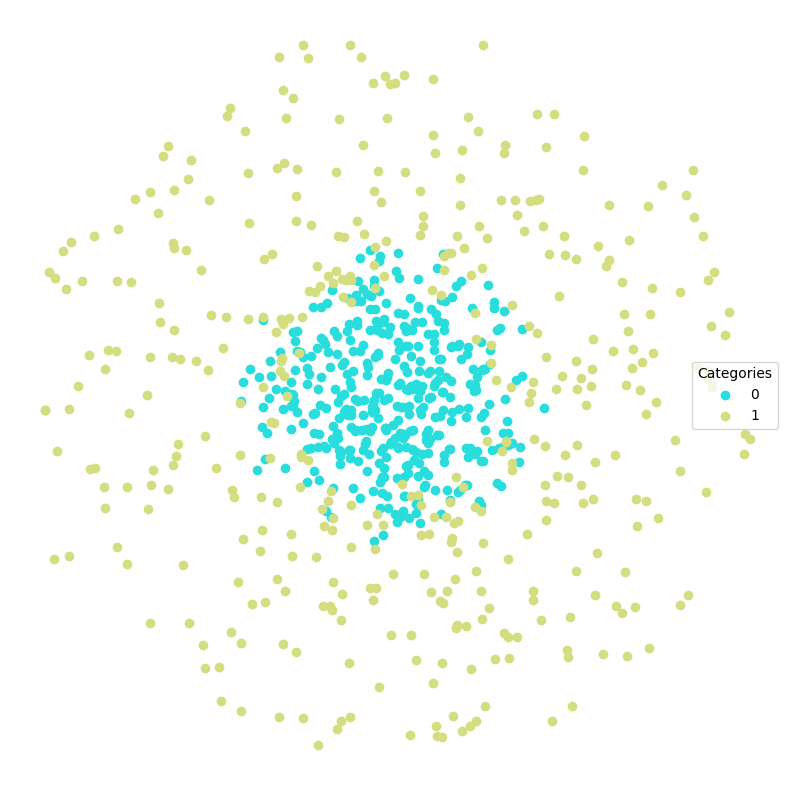

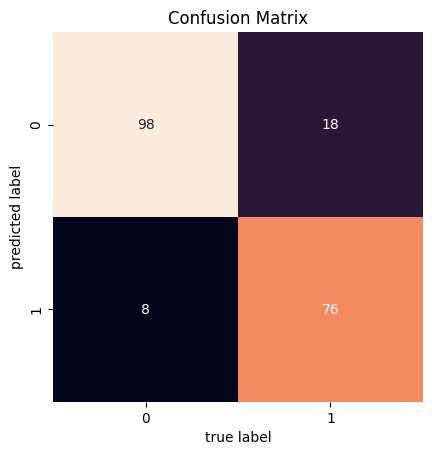

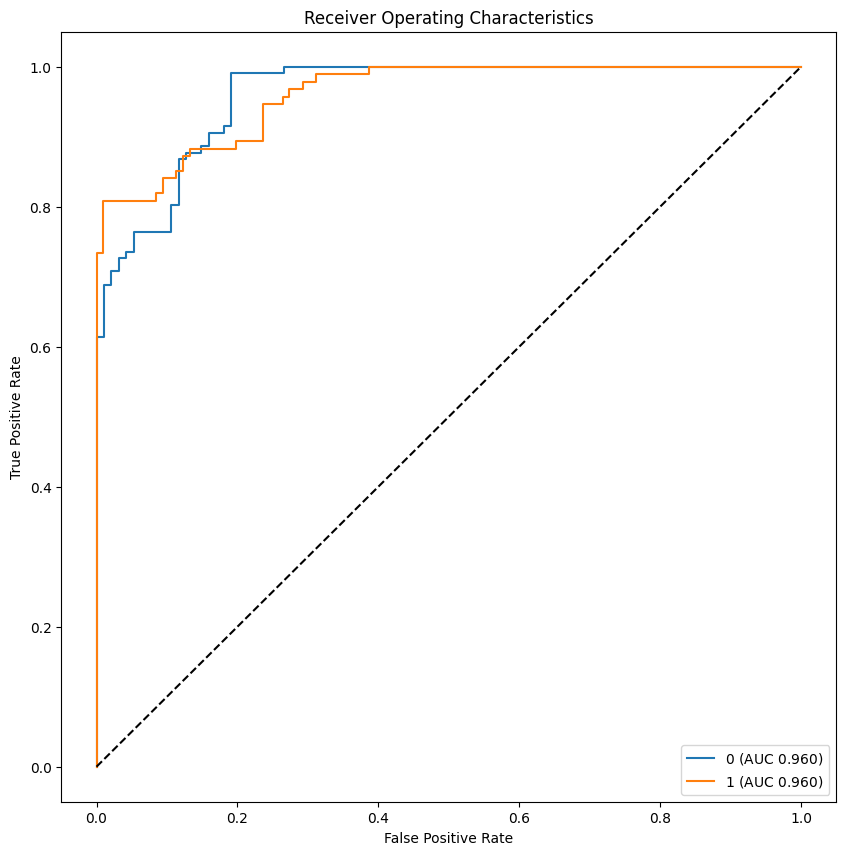

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


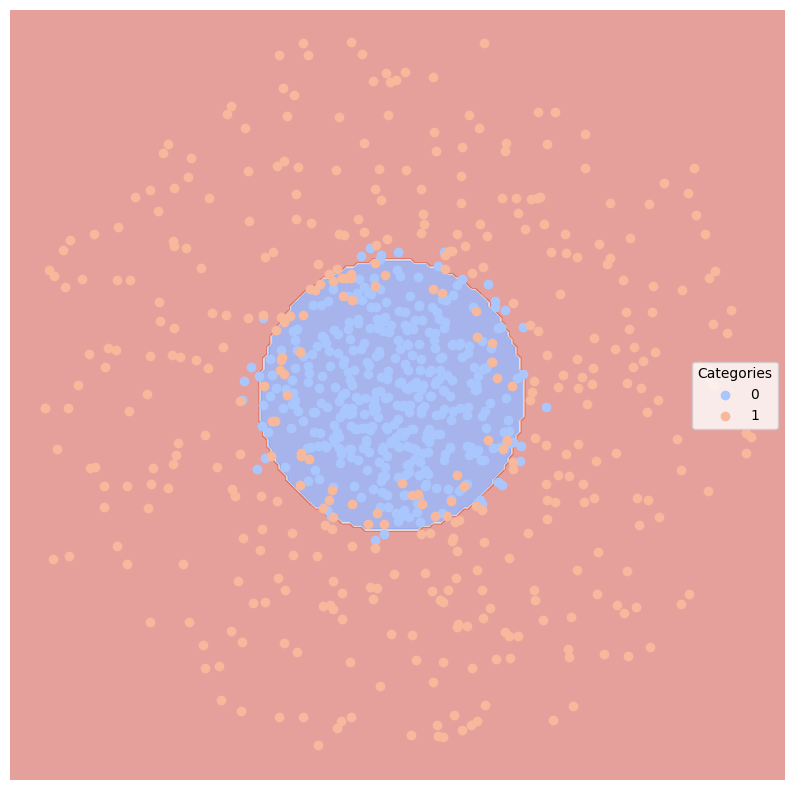

Training and evaluating SVC Linear


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


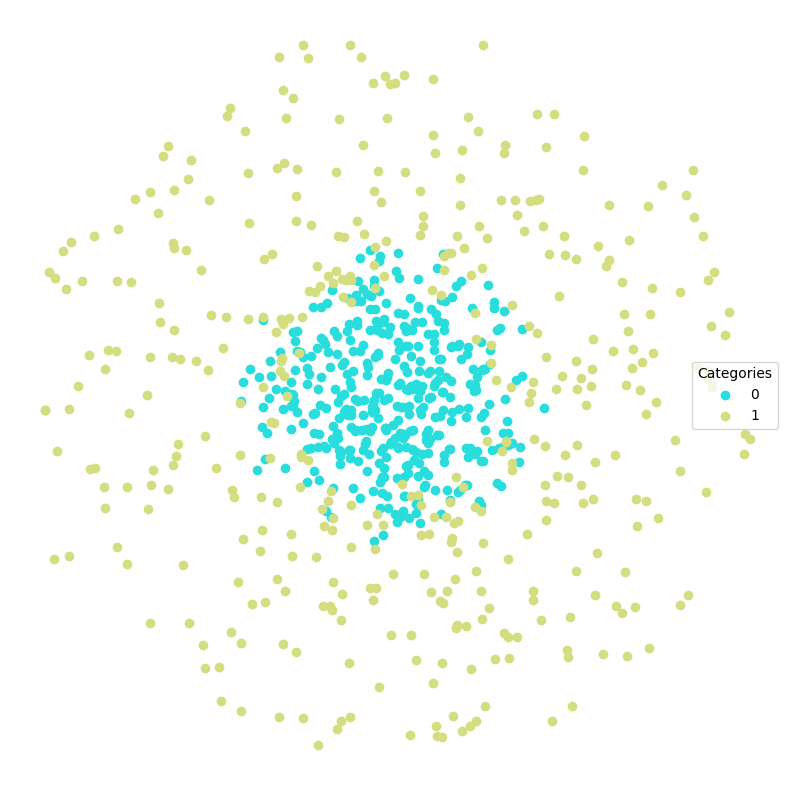

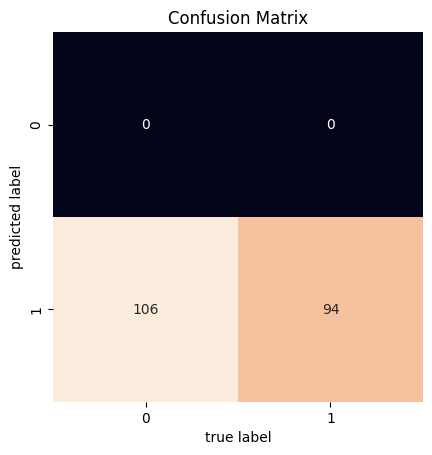

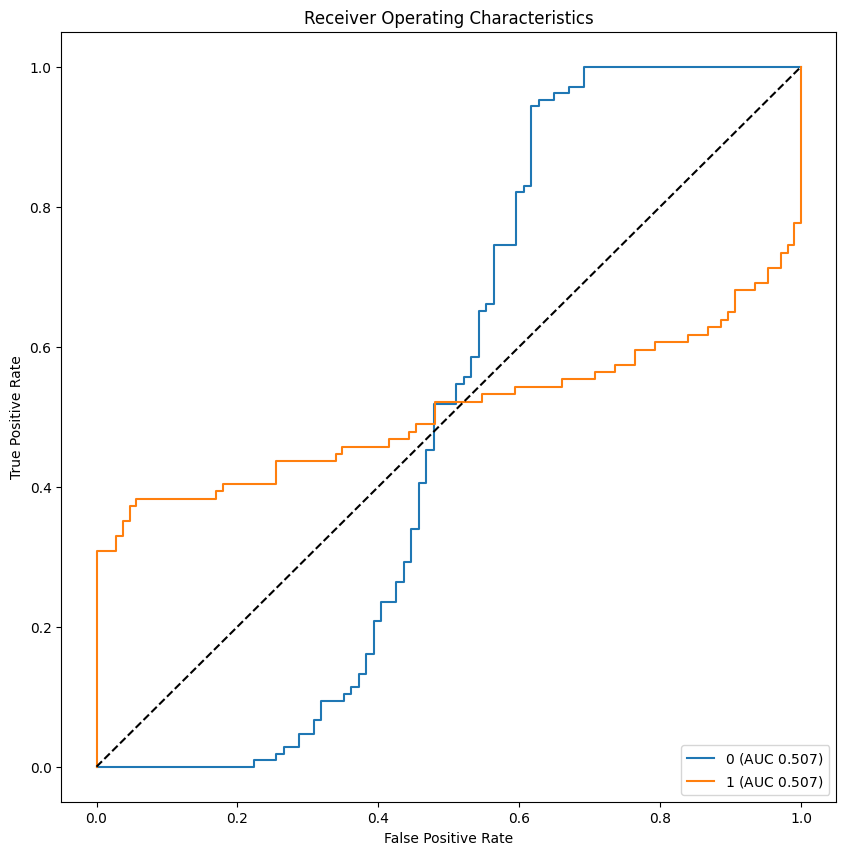

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


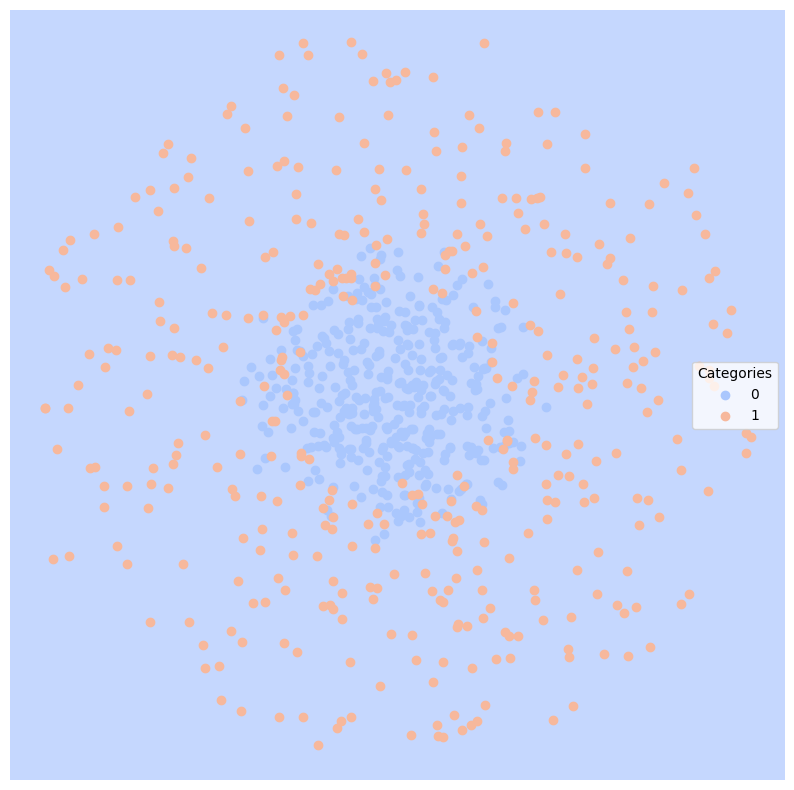

Training and evaluating SVC Poly


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


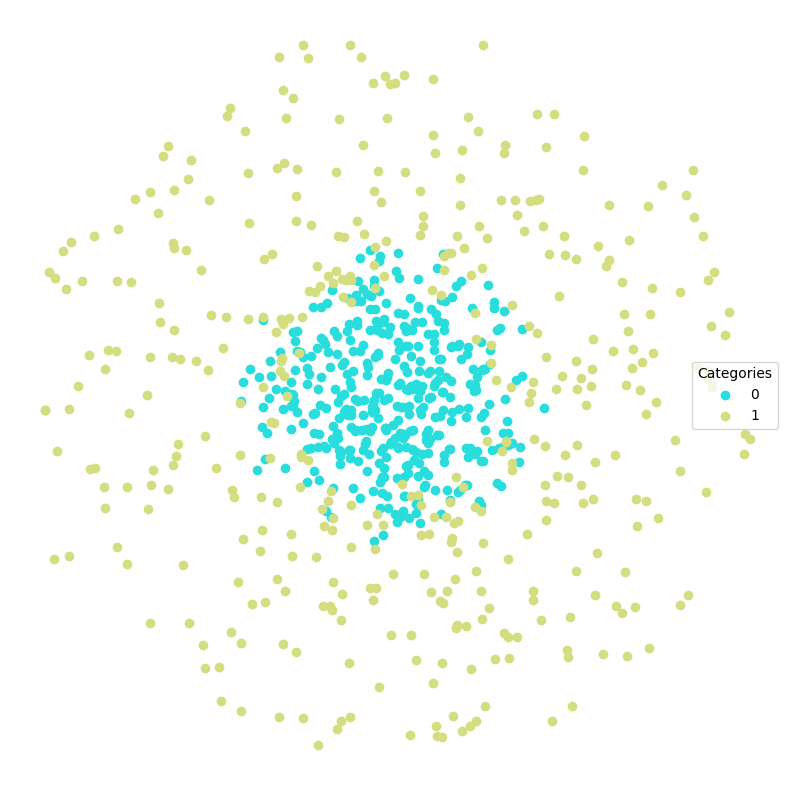

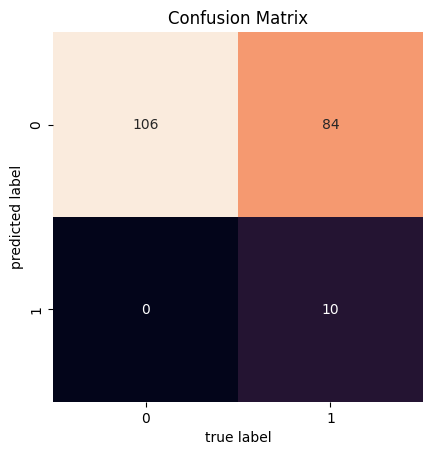

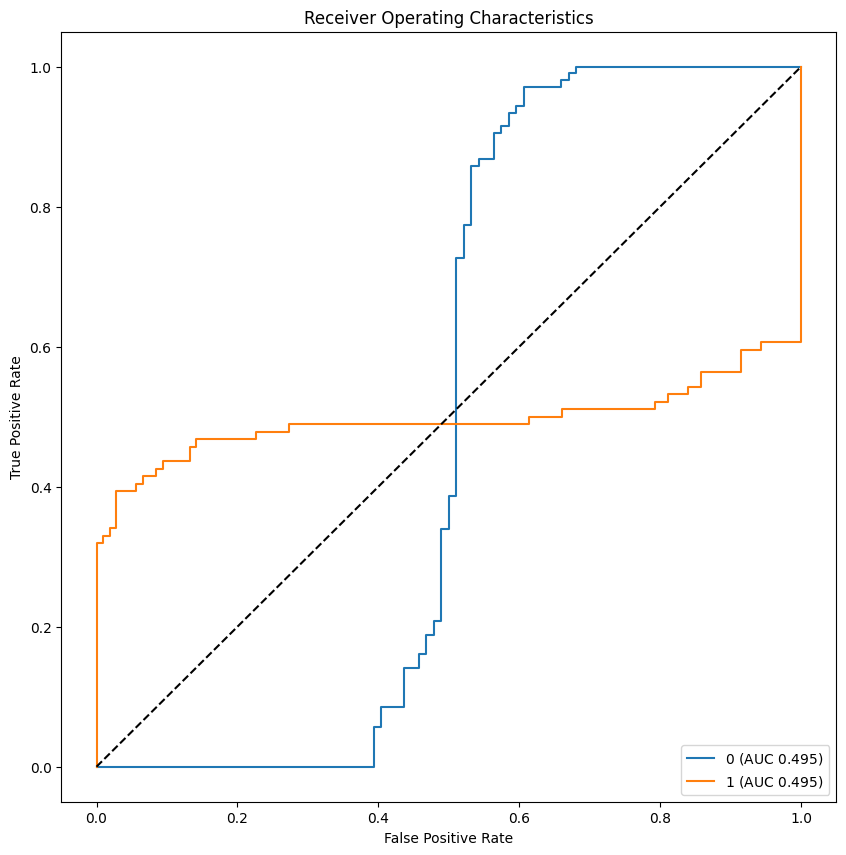

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


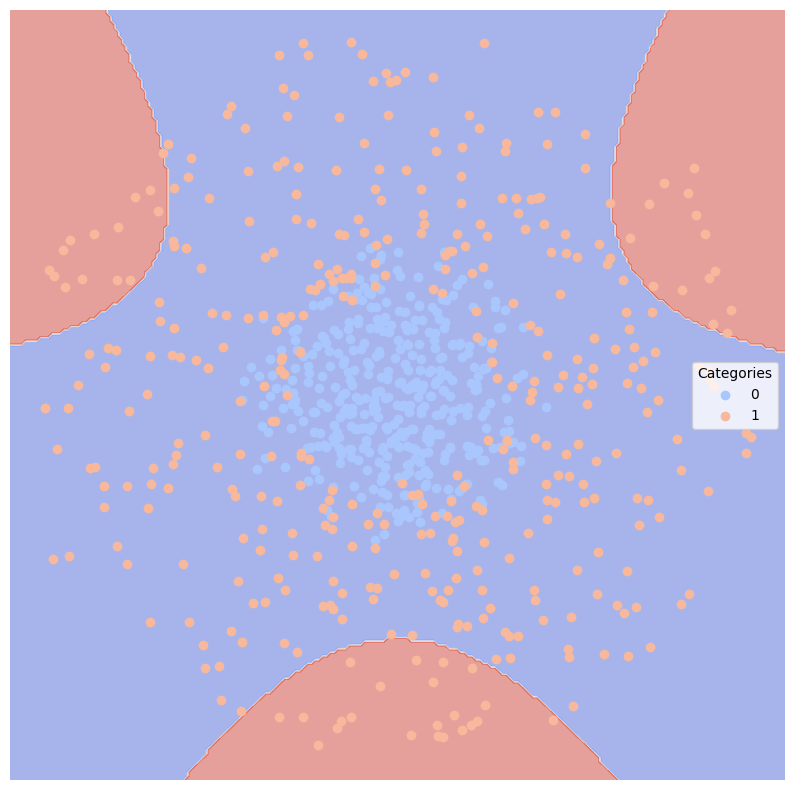

Training and evaluating KNeighbors Classifier


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


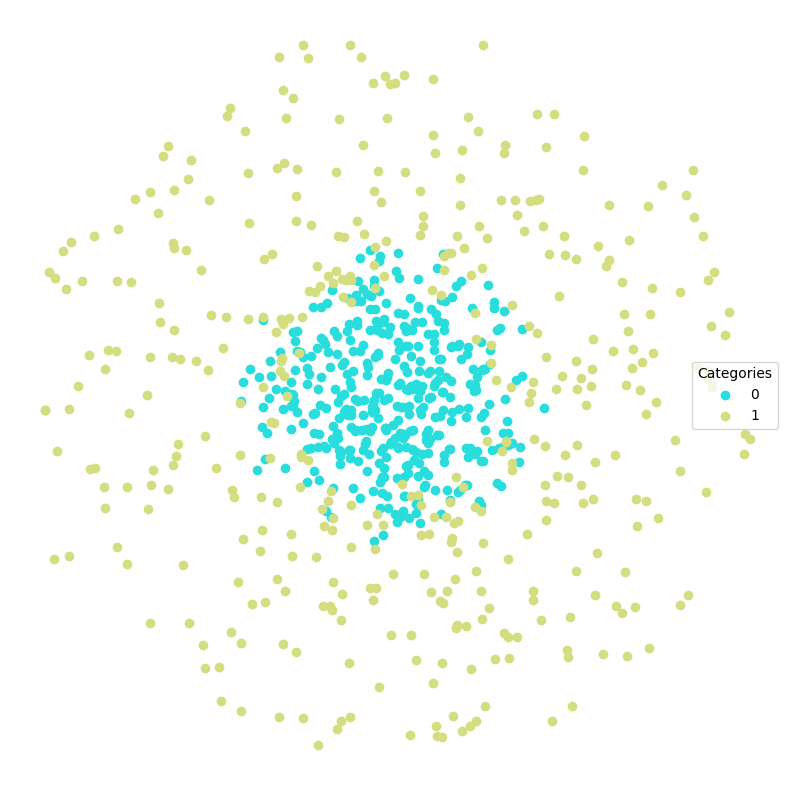

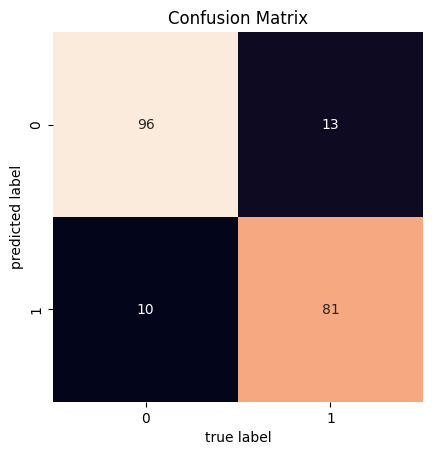

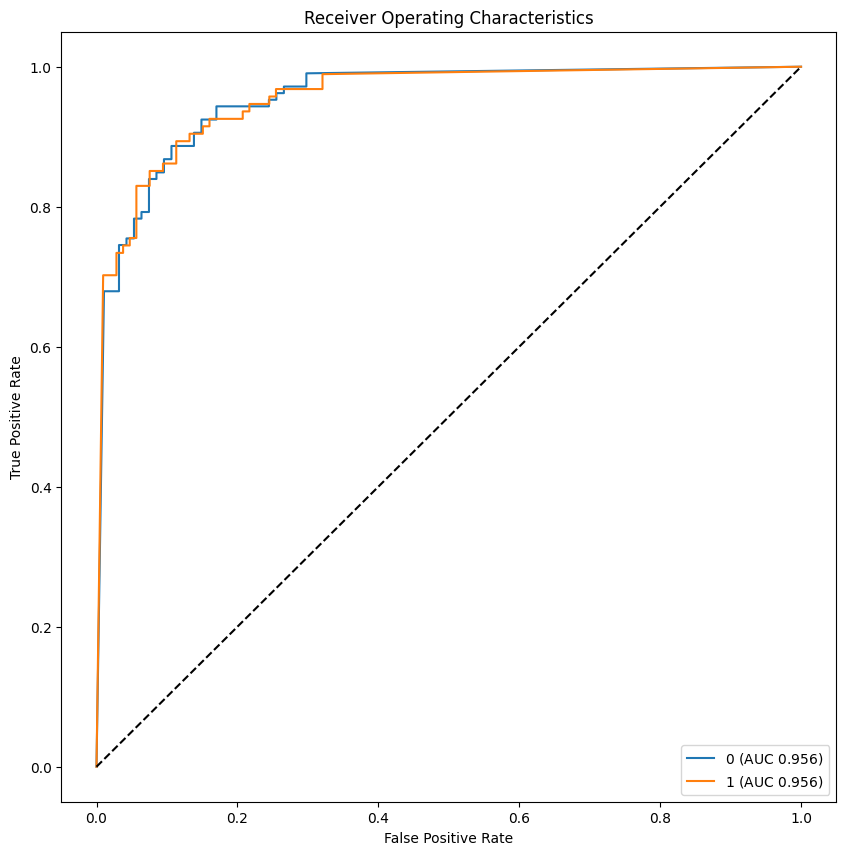

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


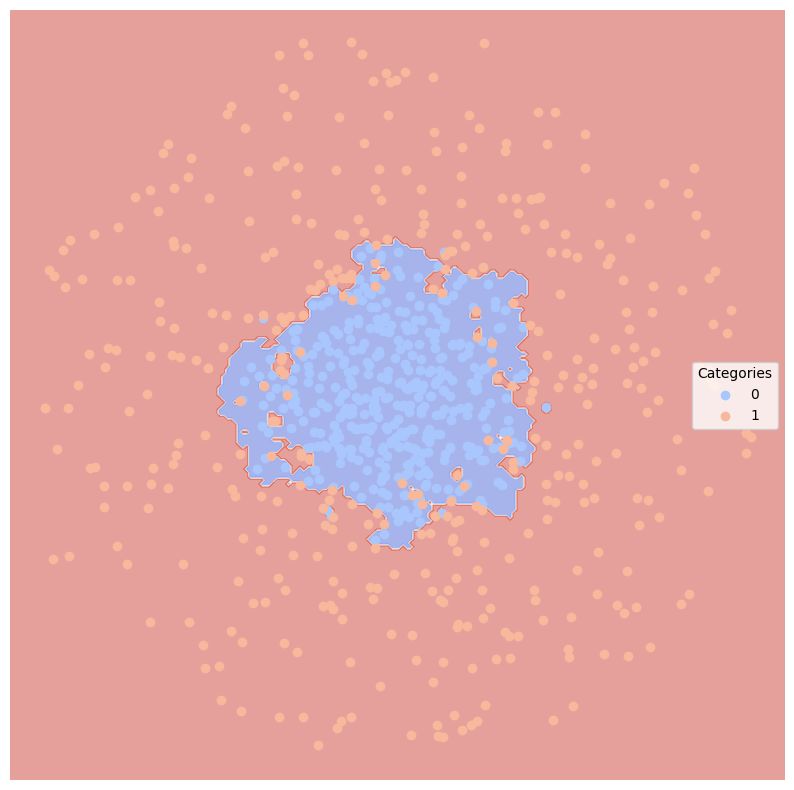

Training and evaluating Decision Tree


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


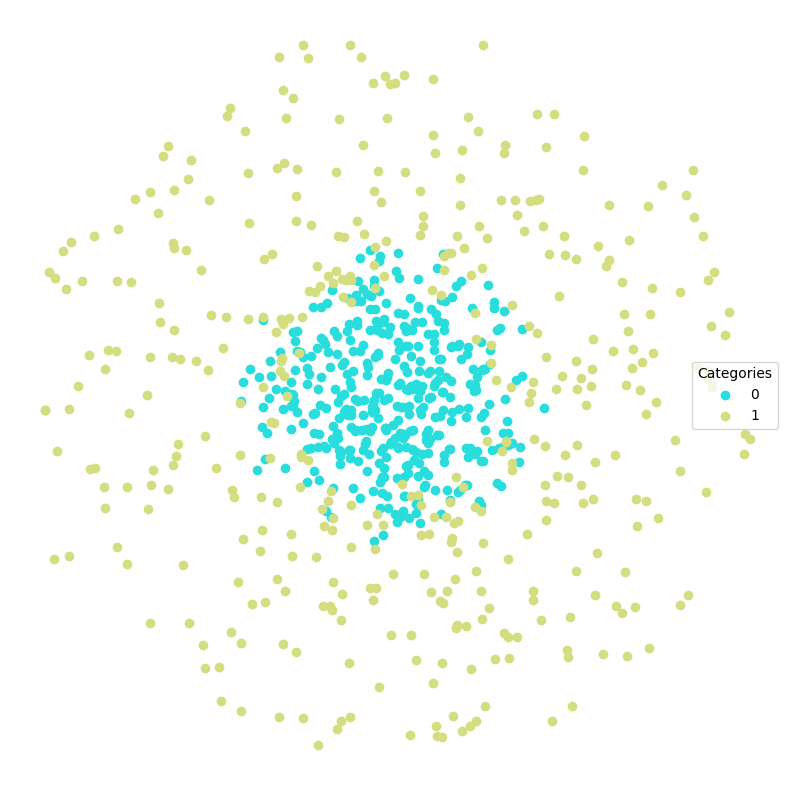

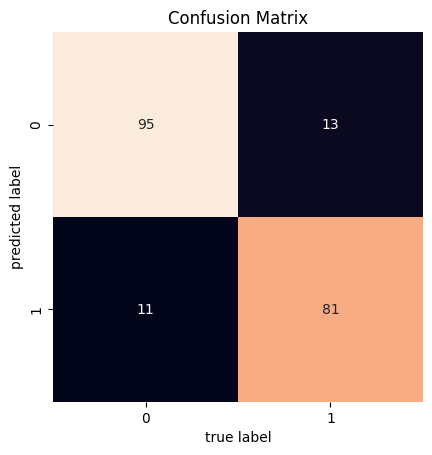

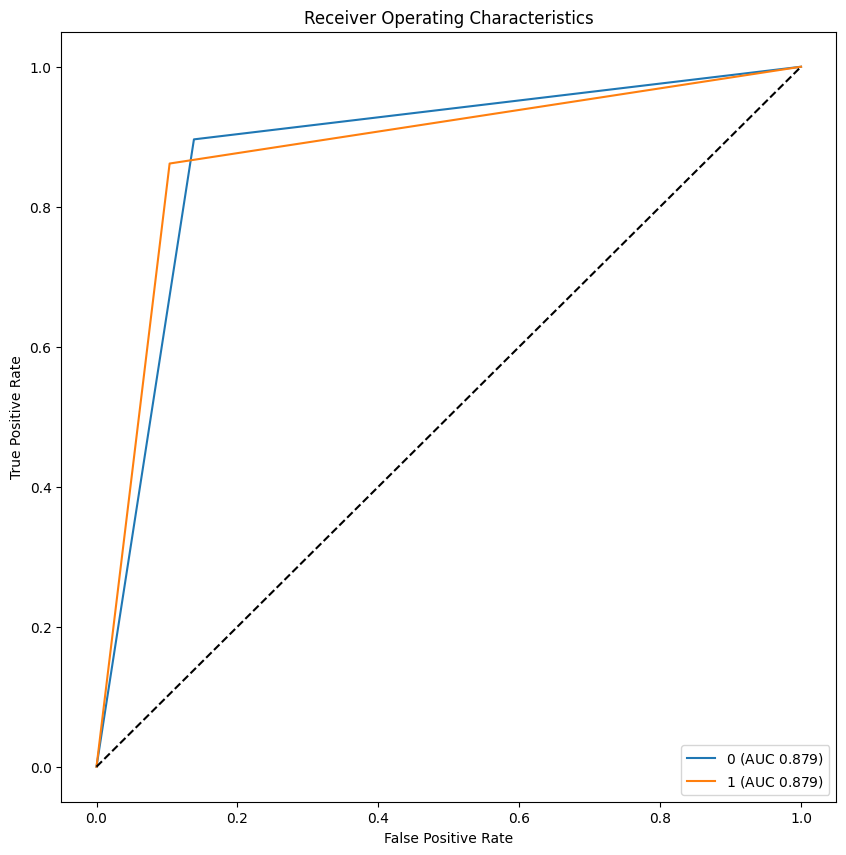

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


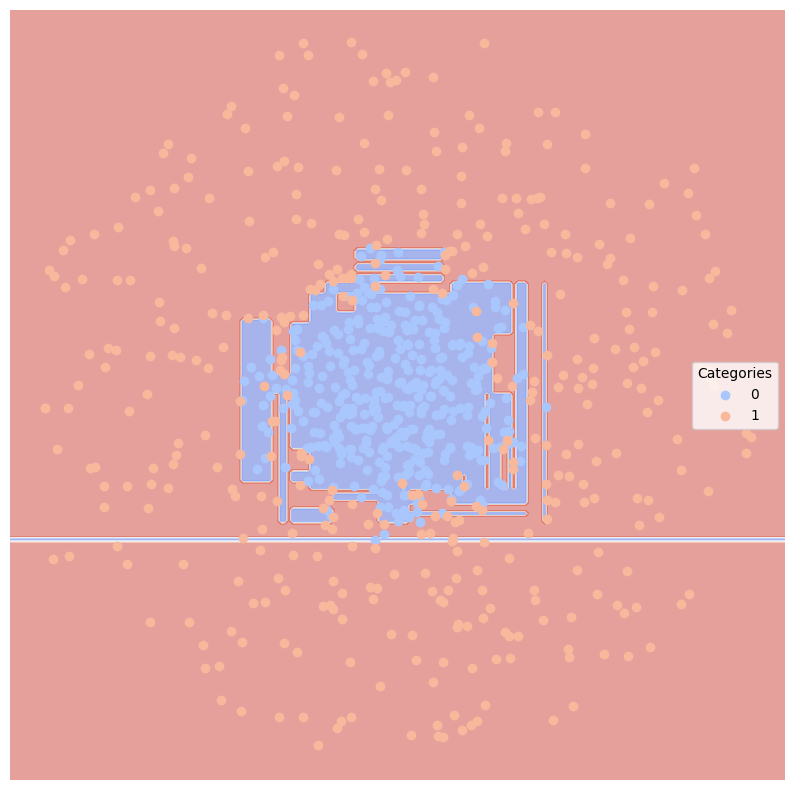

Training and evaluating Random Forest


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


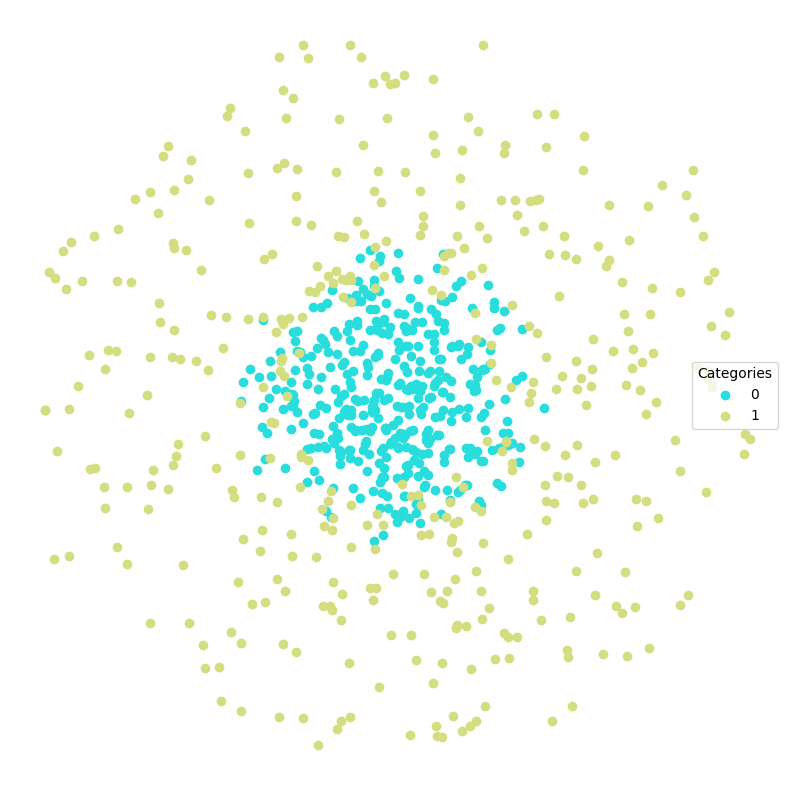

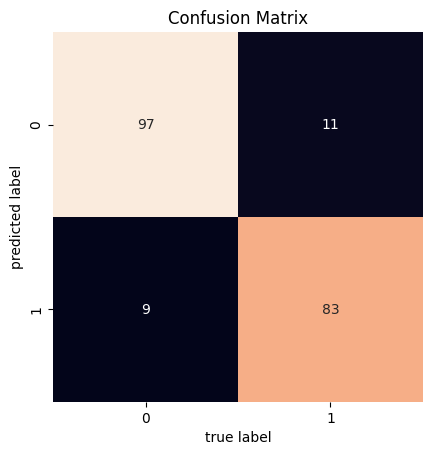

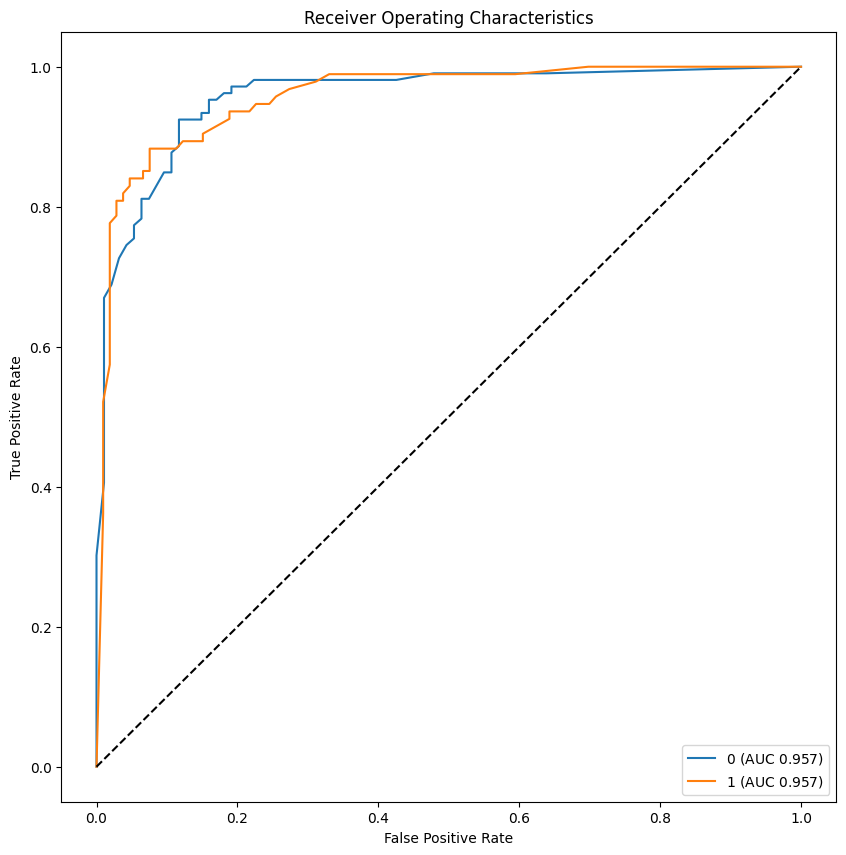

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


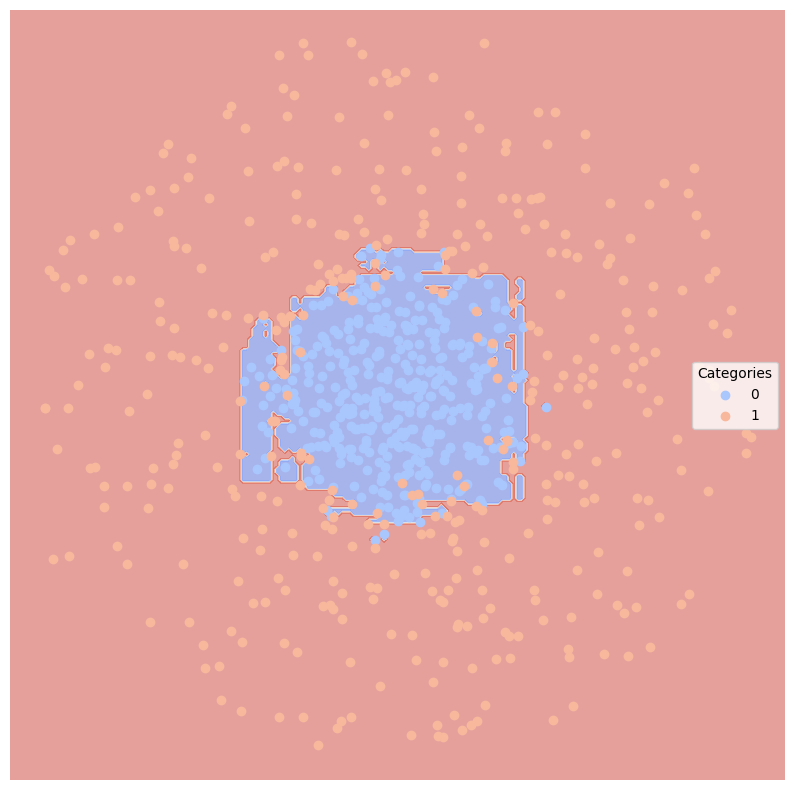

Training and evaluating MLP Classifier


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


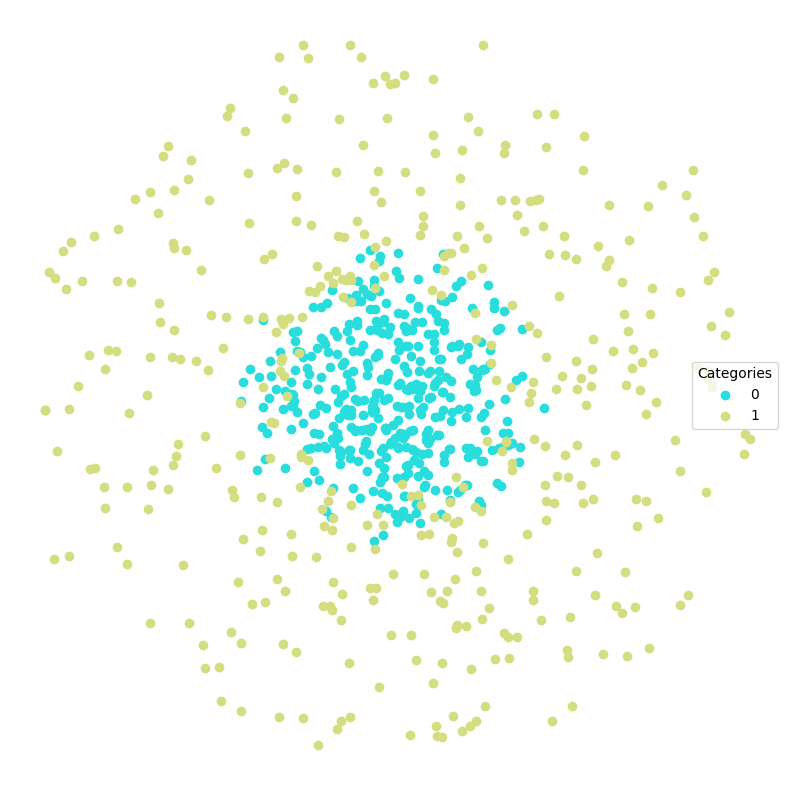

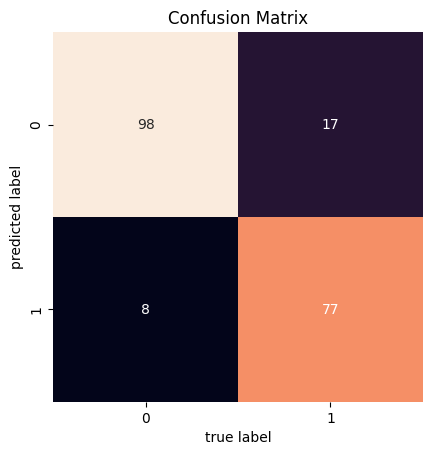

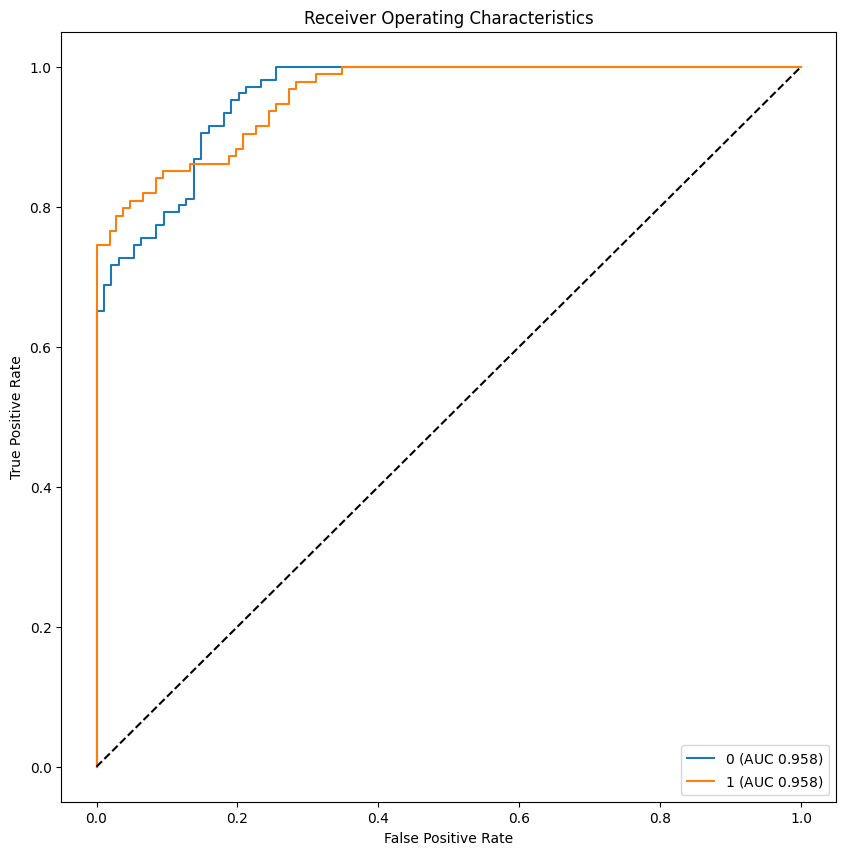

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


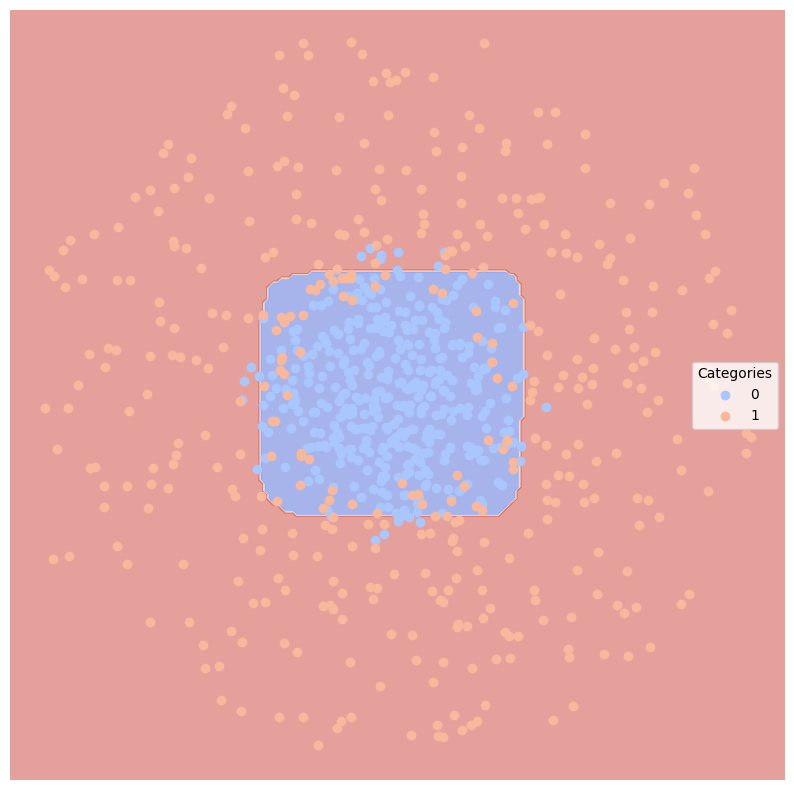

Training and evaluating Gradient Boosting


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


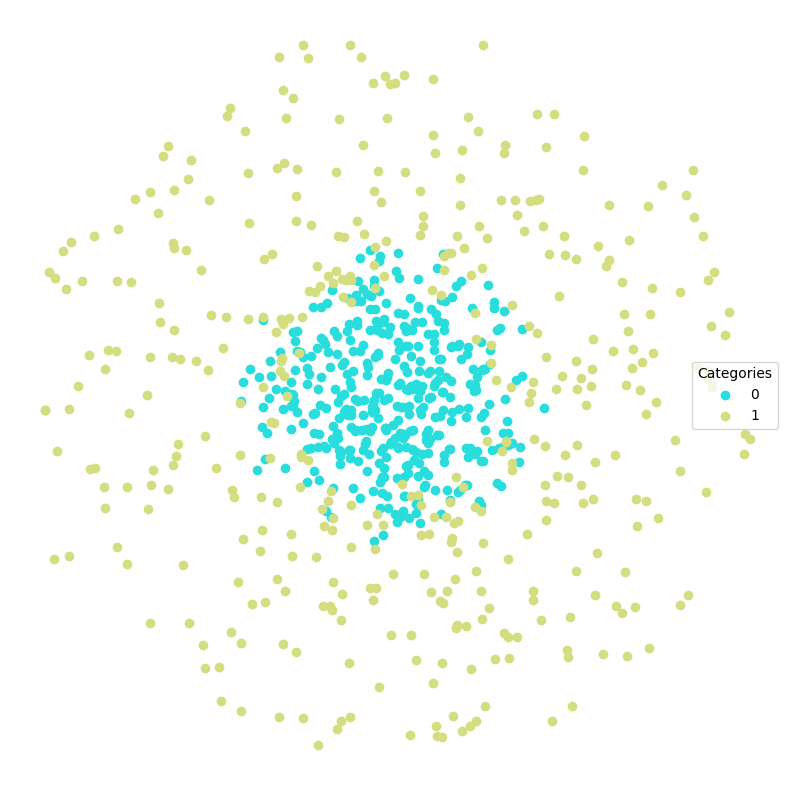

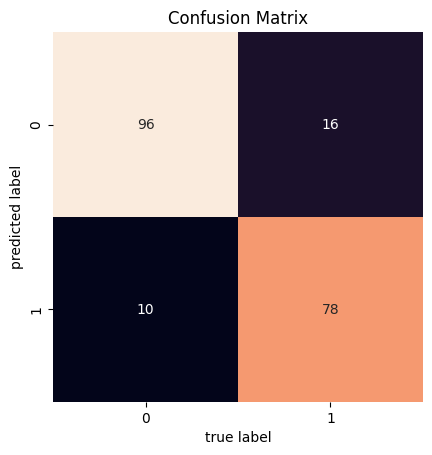

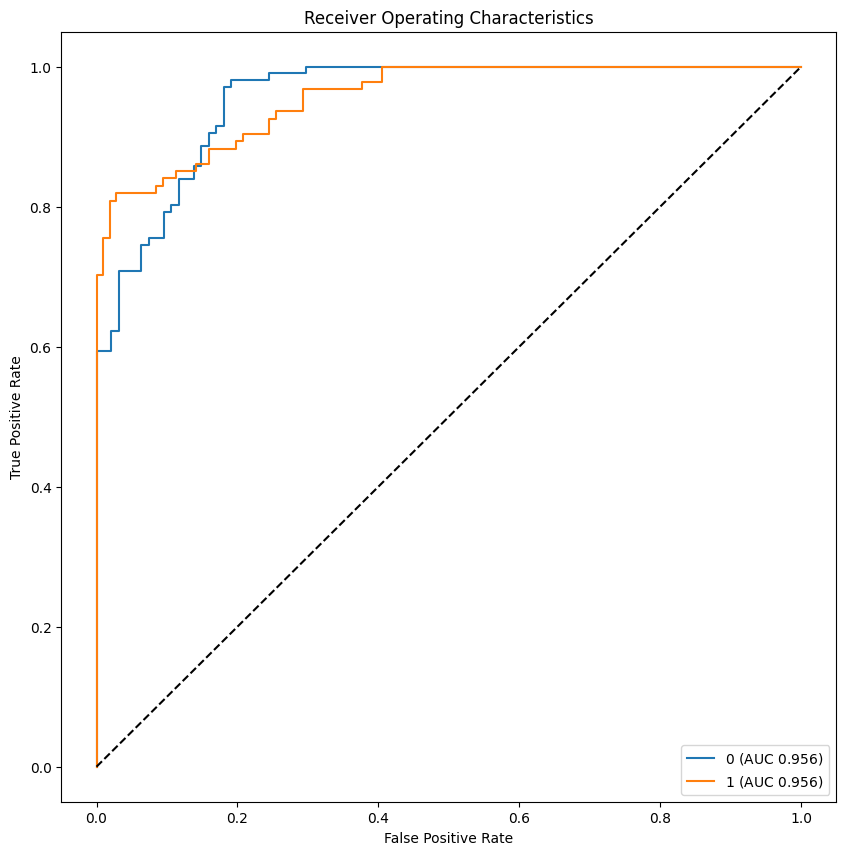

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


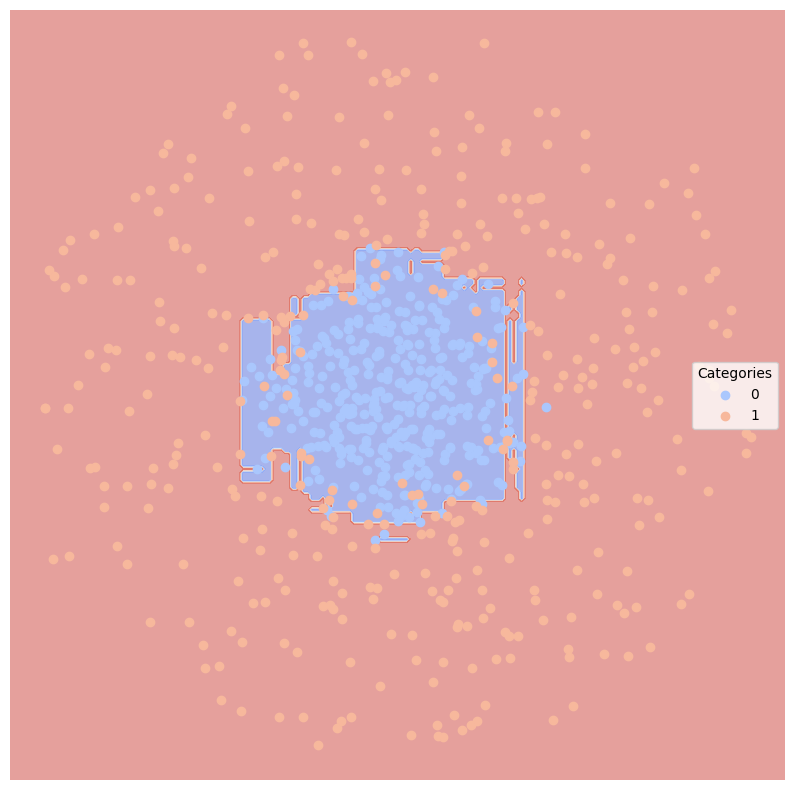

In [ ]:
import numpy as np
import sklearn.linear_model
import sklearn.naive_bayes
import sklearn.svm
import sklearn.neighbors
import sklearn.tree
import sklearn.ensemble
import sklearn.neural_network
from sklearn.naive_bayes import GaussianNB

# Define a list of classifiers
classifiers = [
    ("Logistic Regression", sklearn.linear_model.LogisticRegression()),
    ("Gaussian Naive Bayes", sklearn.naive_bayes.GaussianNB()),
    ("SVC Linear", sklearn.svm.SVC(kernel='linear', probability=True)),
    ("SVC Poly", sklearn.svm.SVC(kernel='poly', degree=3, probability=True)),
    ("KNeighbors Classifier", sklearn.neighbors.KNeighborsClassifier(5, weights='distance')),
    ("Decision Tree", sklearn.tree.DecisionTreeClassifier()),
    ("Random Forest", sklearn.ensemble.RandomForestClassifier()),
    ("MLP Classifier", sklearn.neural_network.MLPClassifier()),
    ("Gradient Boosting", sklearn.ensemble.GradientBoostingClassifier())
]

# Loop through each classifier
for name, clf in classifiers:
    print(f"Training and evaluating {name}")
    # Training classifier
    clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])

    # Evaluation classifier
    lucem_illud.evaluateClassifier(clf, dfTest)

    # Plot
    lucem_illud.plotter(dfTrain)

    # Plot confusion matrix
    lucem_illud.plotConfusionMatrix(clf, dfTest)

    # Plot ROC curve
    lucem_illud.plotMultiROC(clf, dfTest)

    # Plot the decision region
    lucem_illud.plotregions(clf, dfTrain)

# For targetSplit data, several model Miscategorize half of the data, `SVC Poly` model is worst, because it miscategorize half of the data, while `Gaussian Naive Bayes` performs best because it capture the circle feature of the distribution

In [ ]:
noise = .2

#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.random(noise), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.andSplit(noise), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.xorSplit(noise), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.targetSplit(noise), test_size=.2)
dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.multiBlobs(noise), test_size=.2)

Training and evaluating Logistic Regression


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


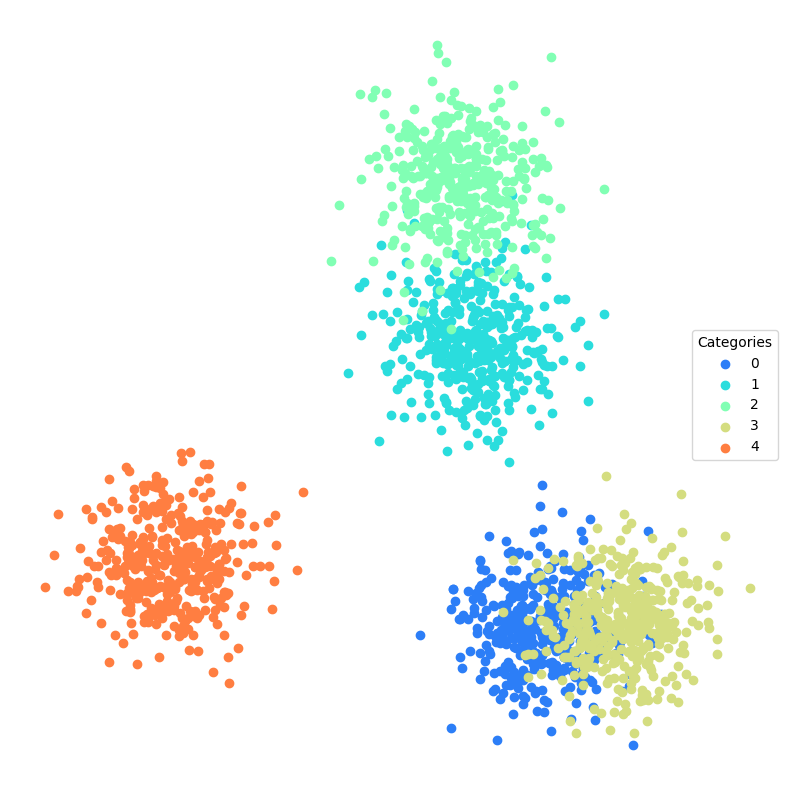

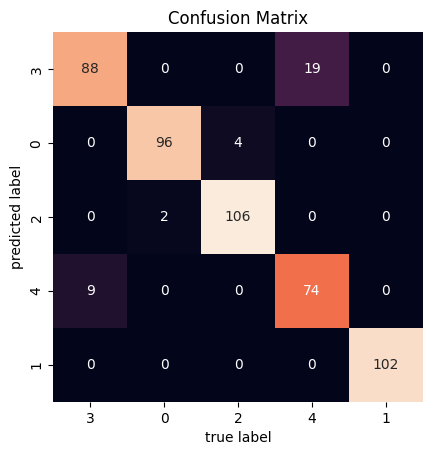

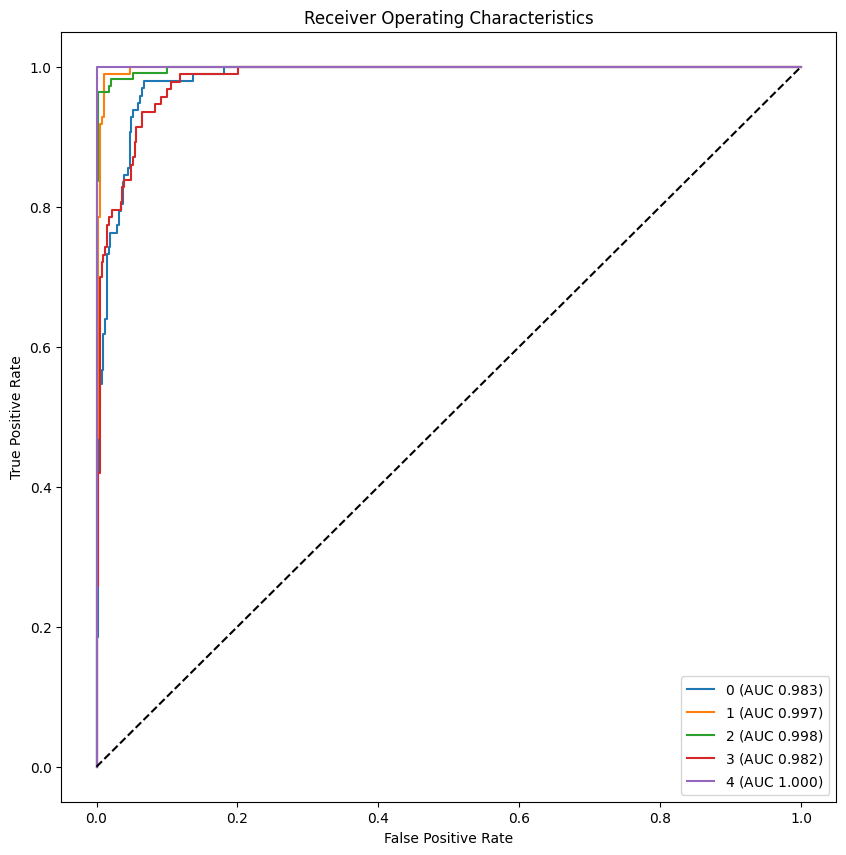

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


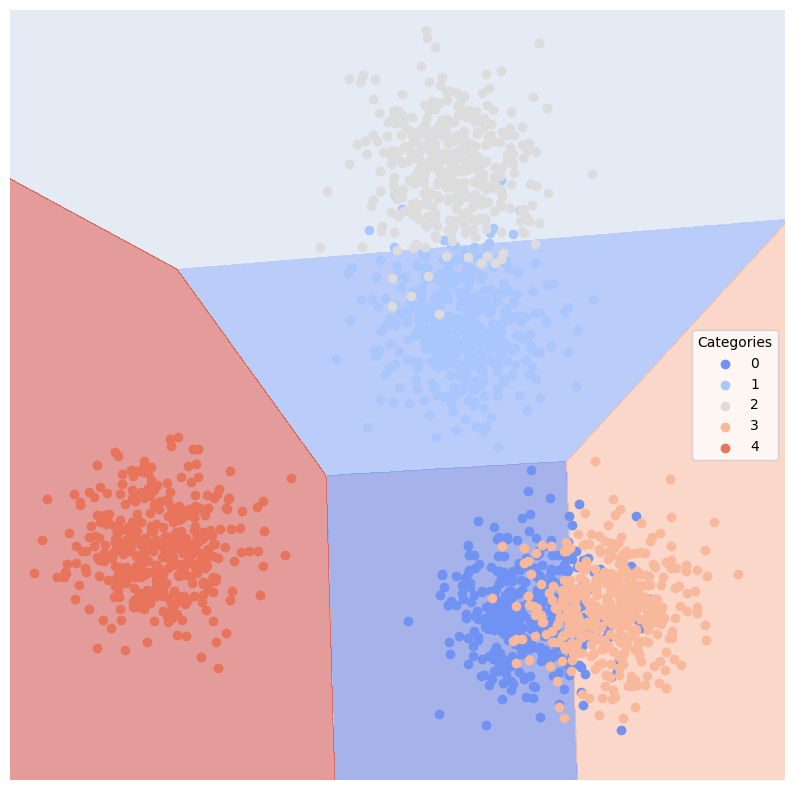

Training and evaluating Gaussian Naive Bayes


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


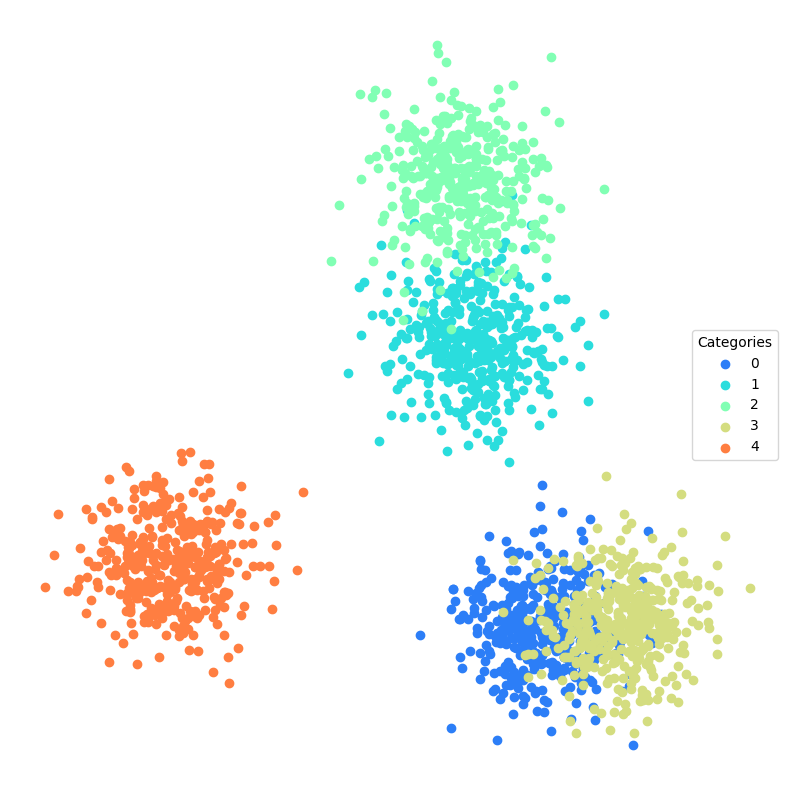

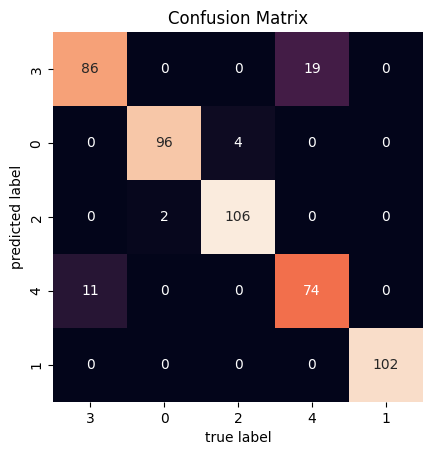

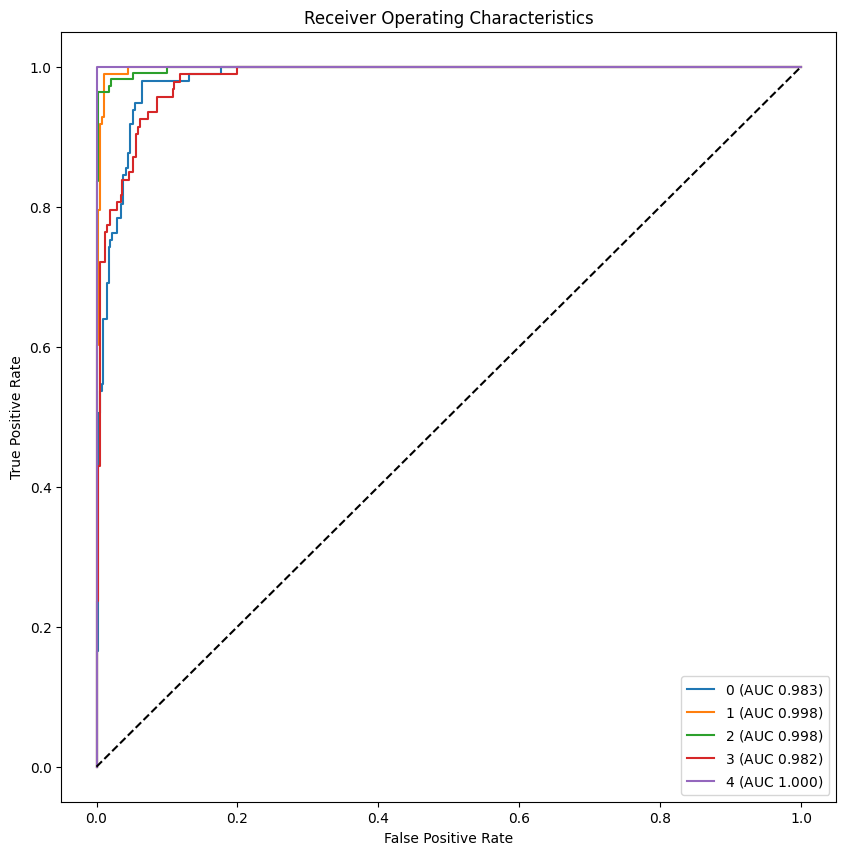

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


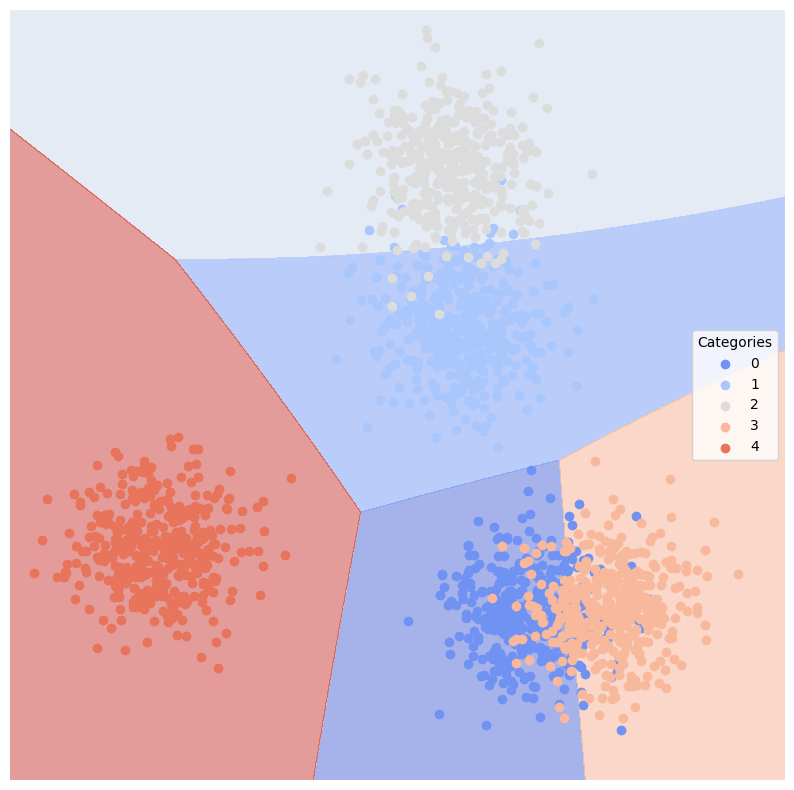

Training and evaluating SVC Linear


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


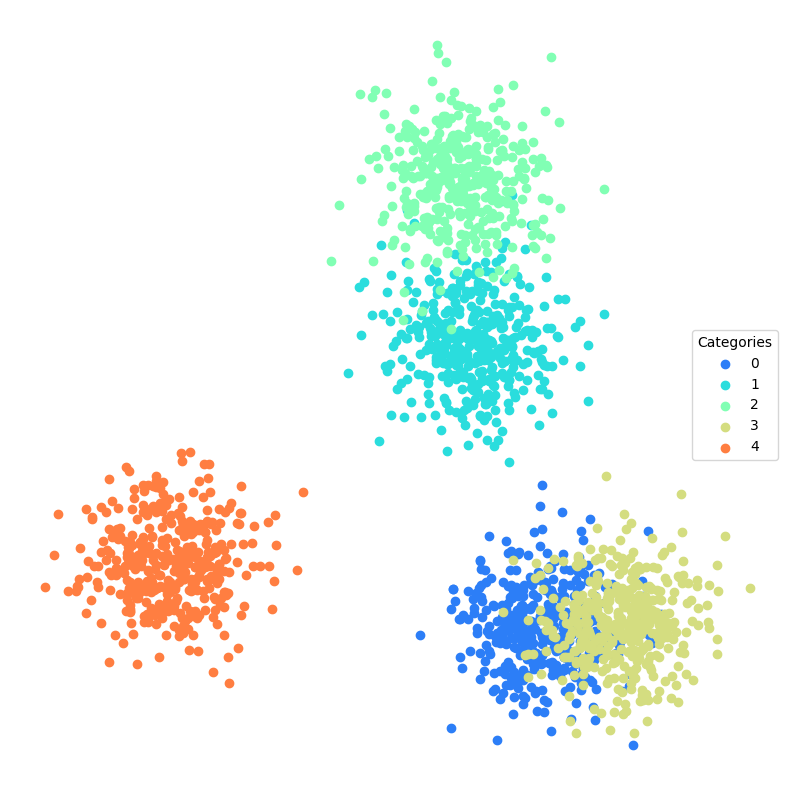

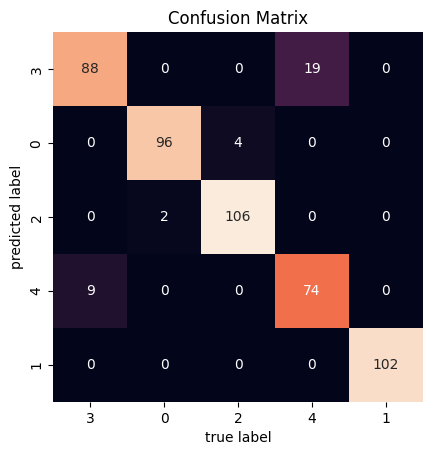

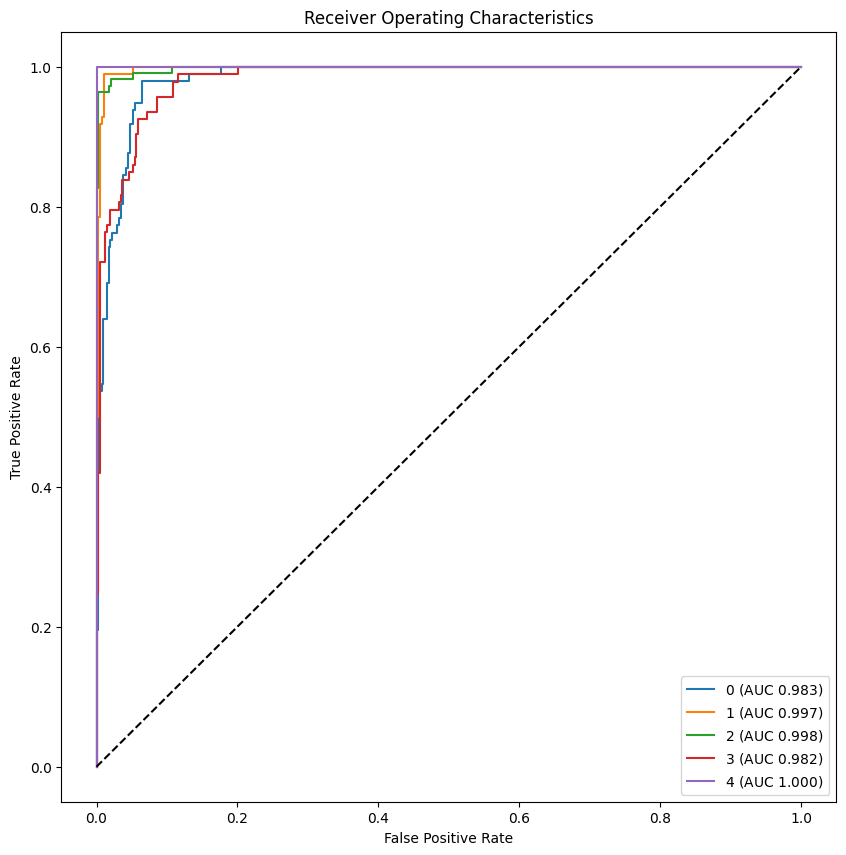

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


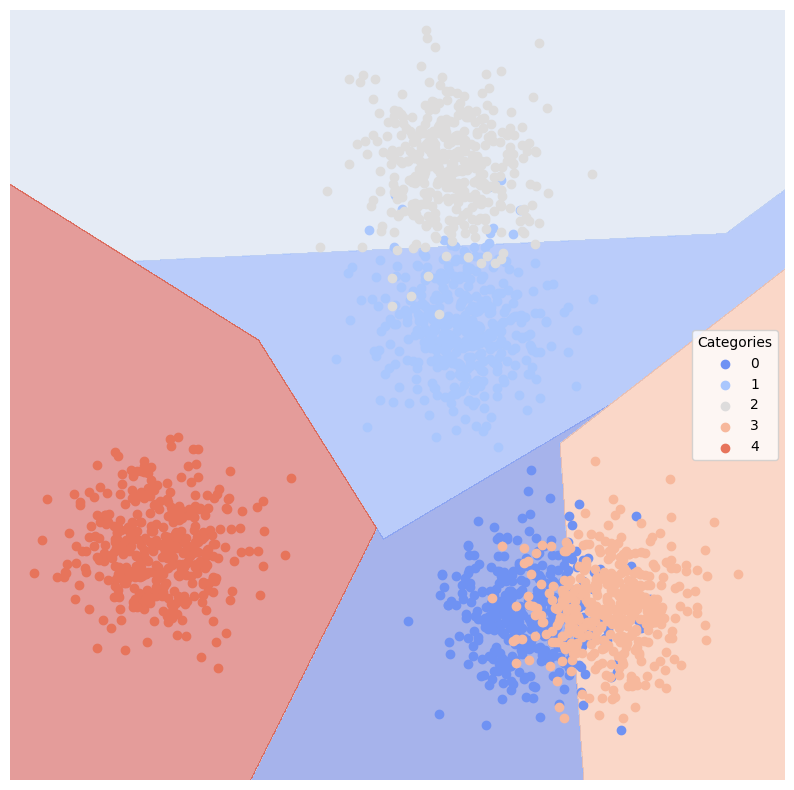

Training and evaluating SVC Poly


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


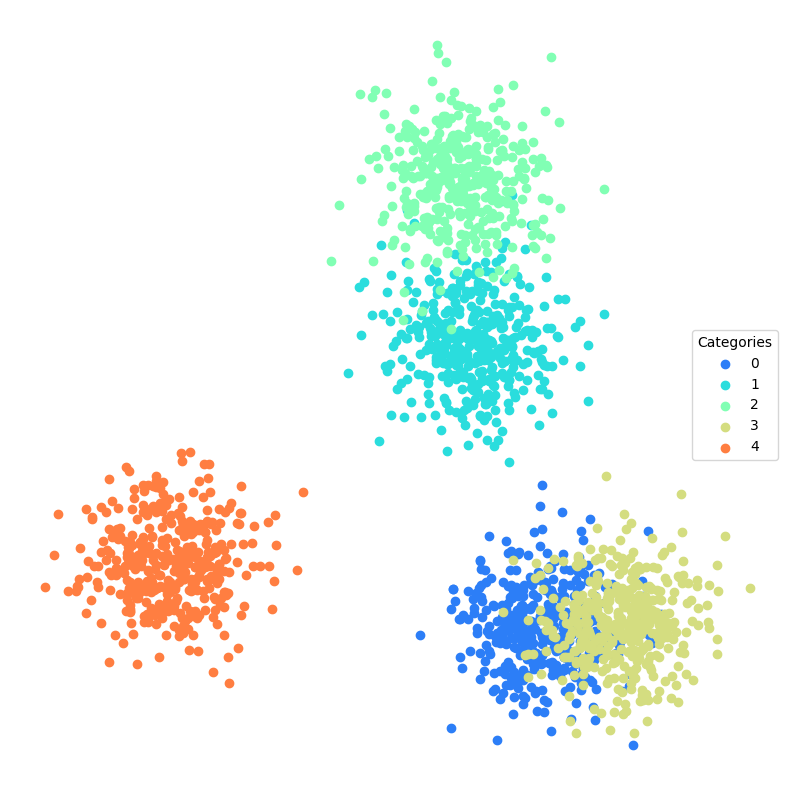

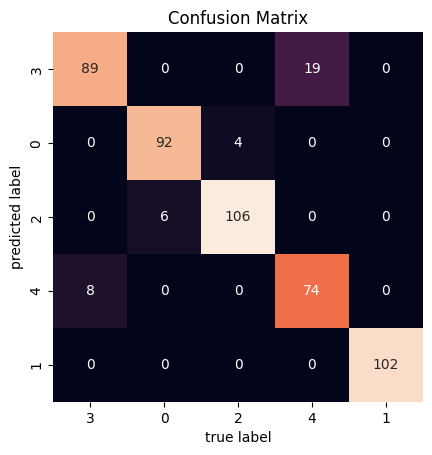

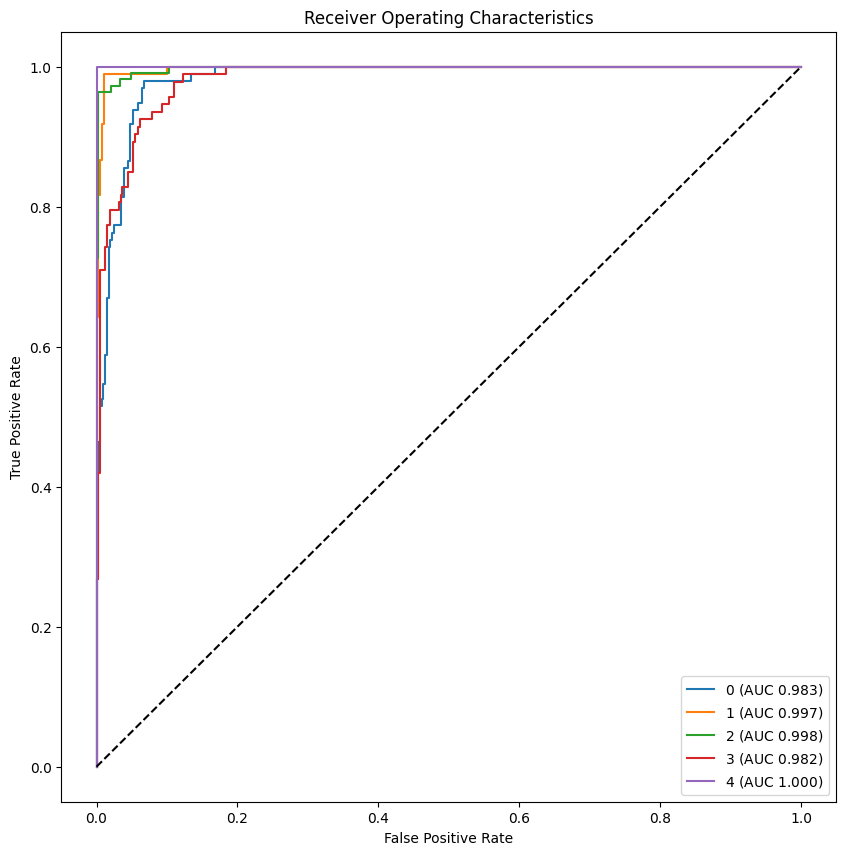

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


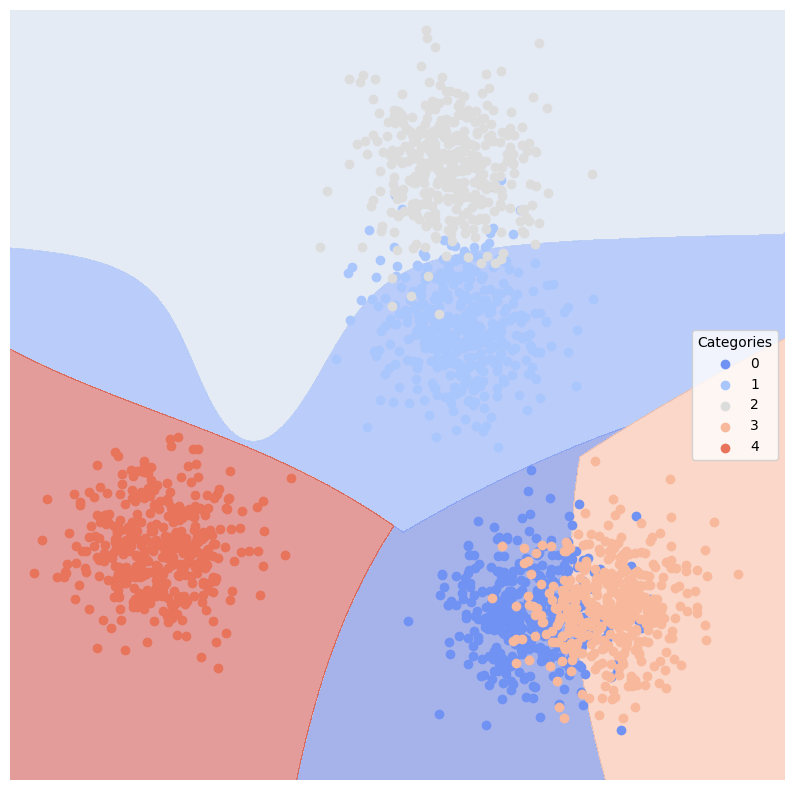

Training and evaluating KNeighbors Classifier


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


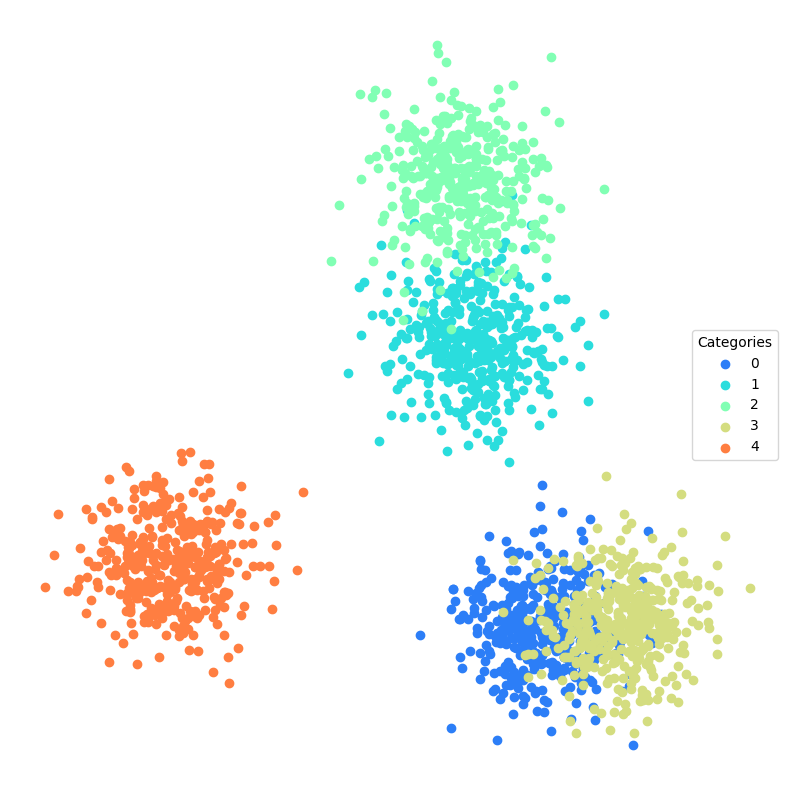

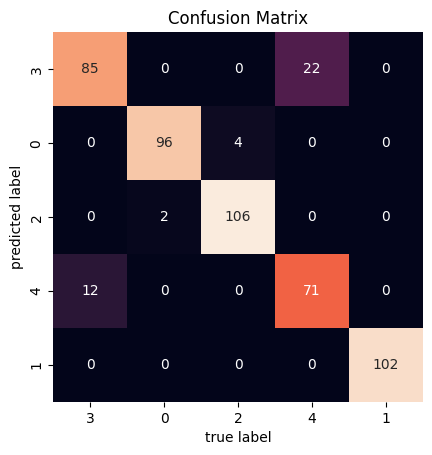

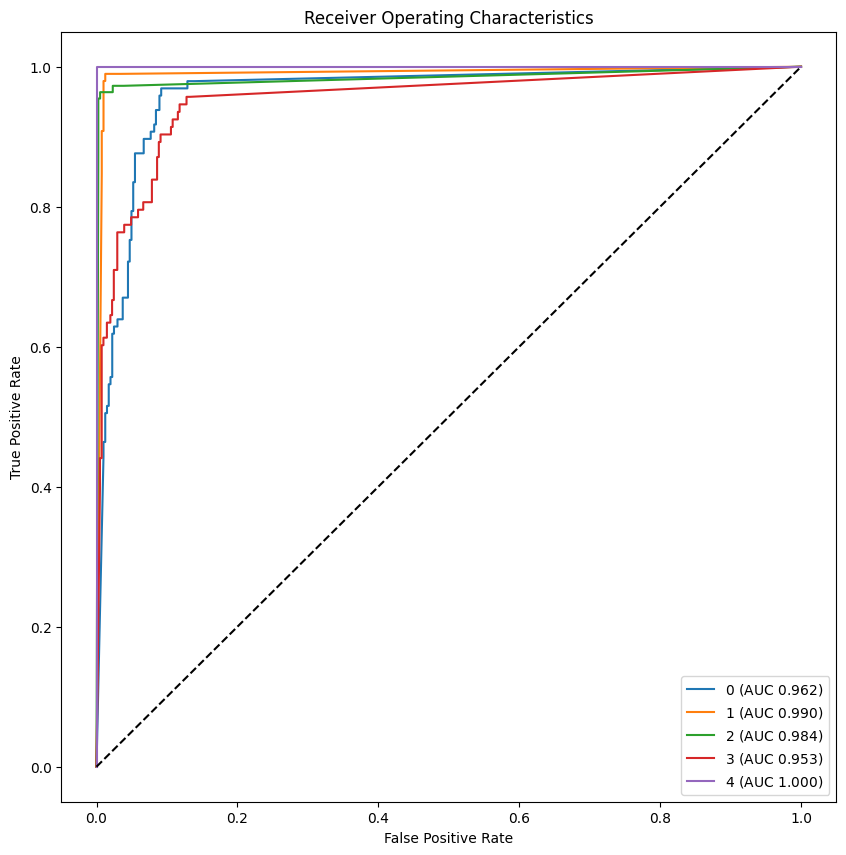

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


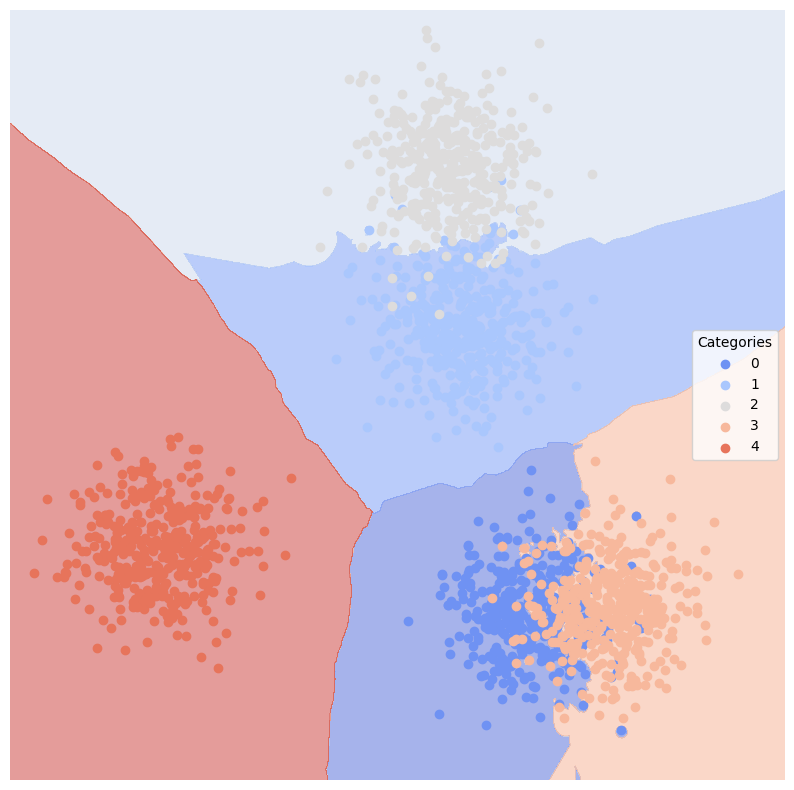

Training and evaluating Decision Tree


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


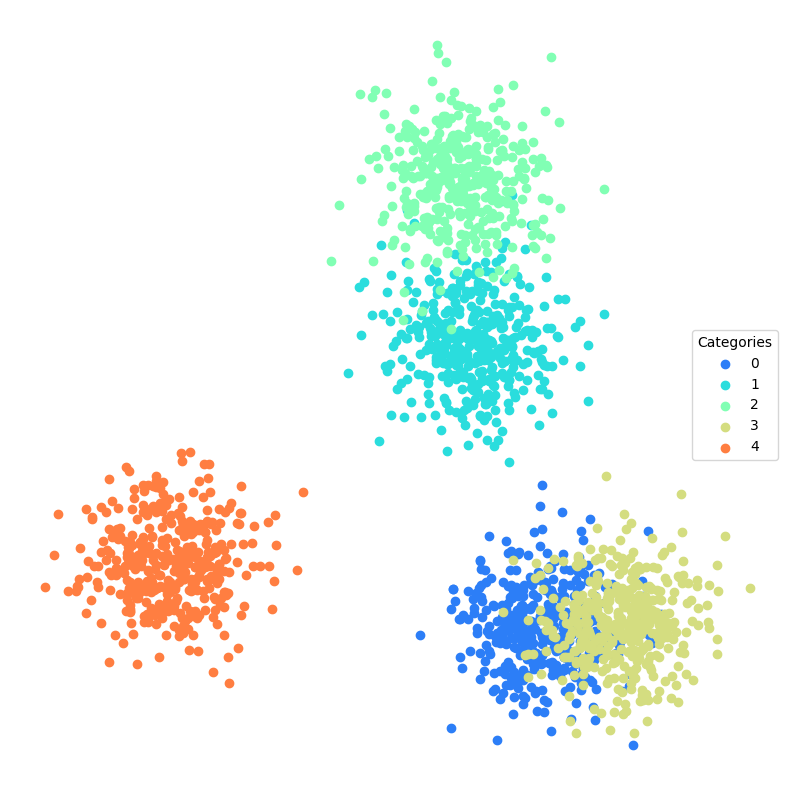

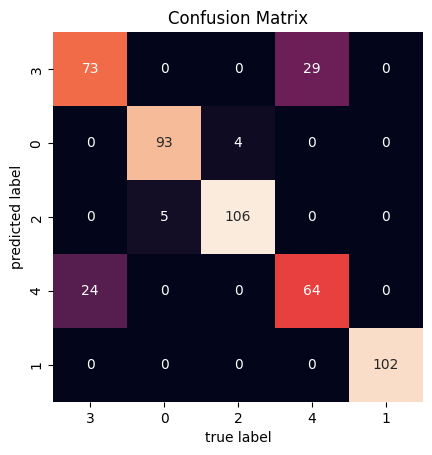

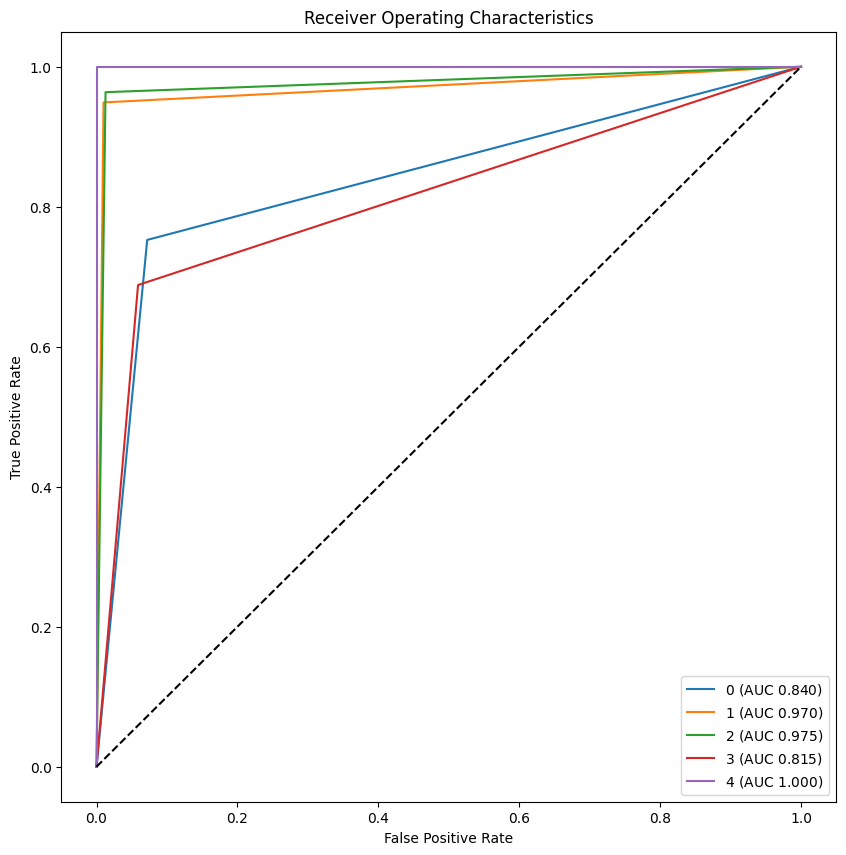

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


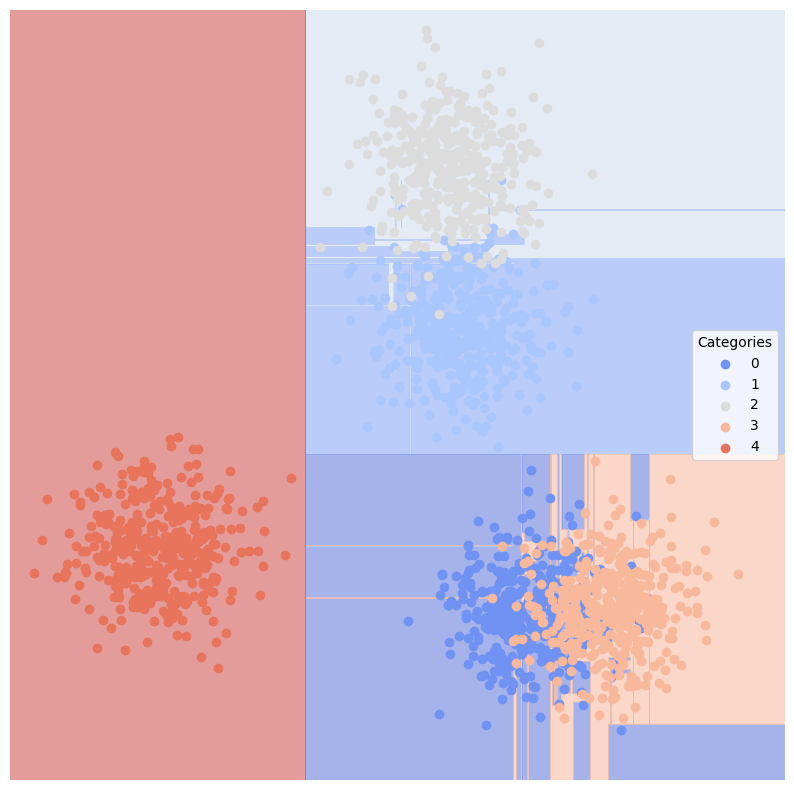

Training and evaluating Random Forest


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


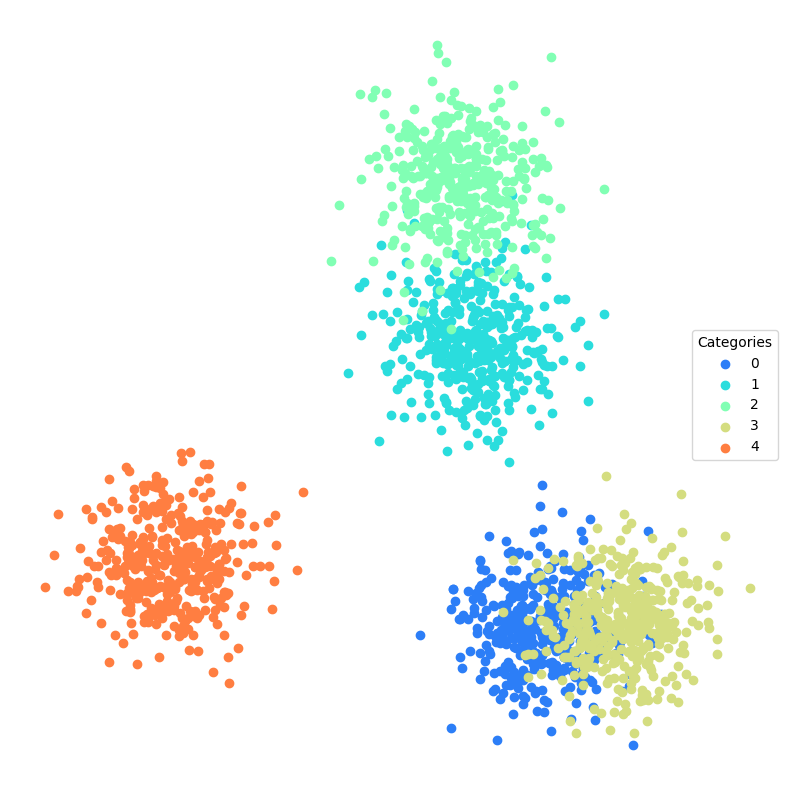

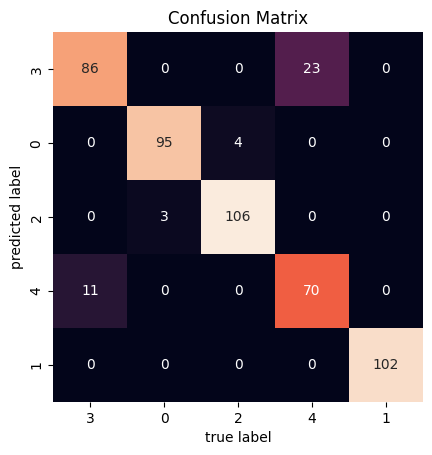

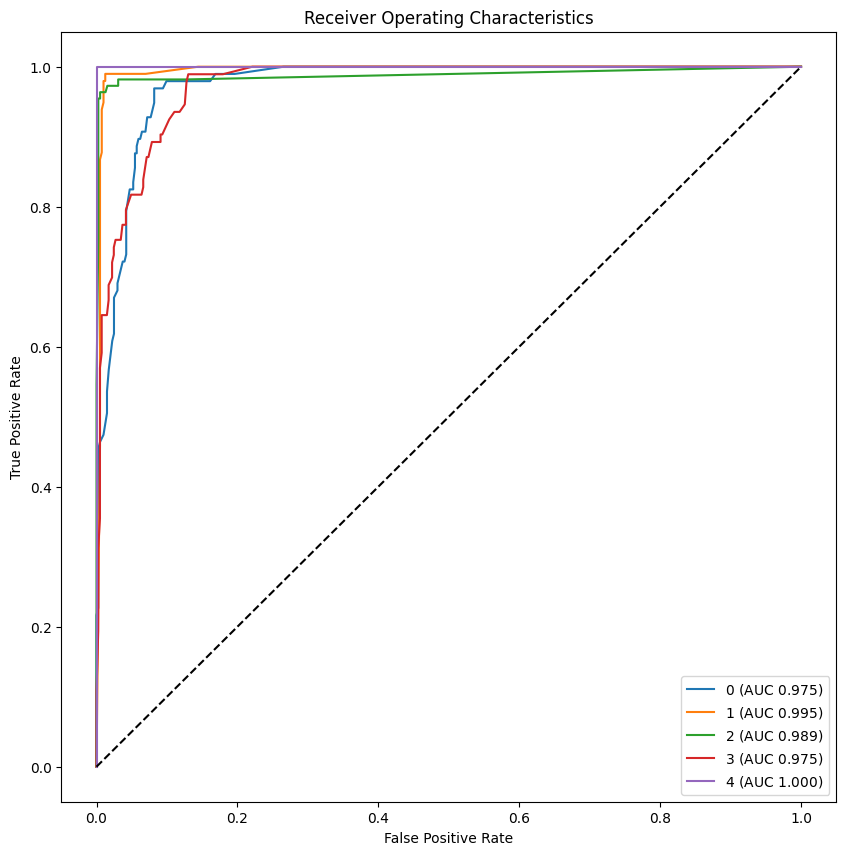

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


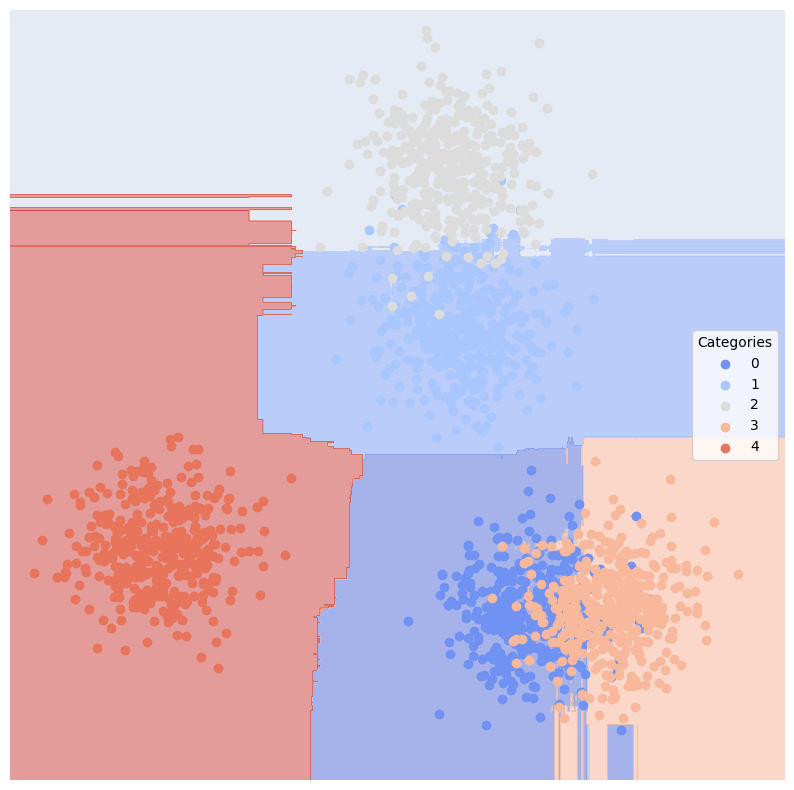

Training and evaluating MLP Classifier


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


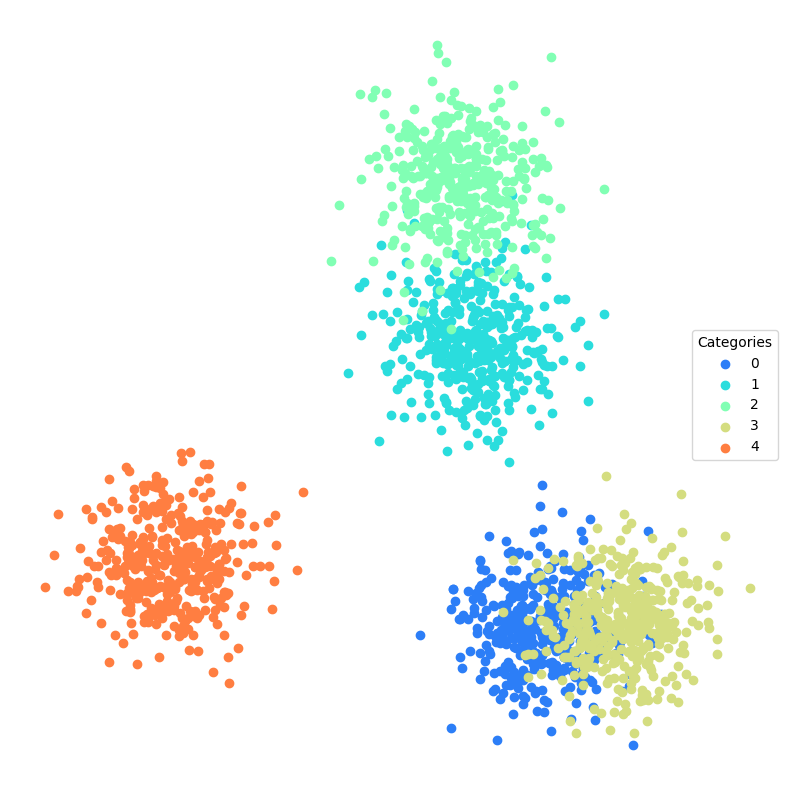

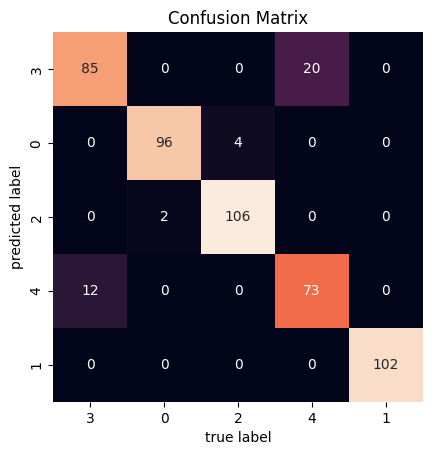

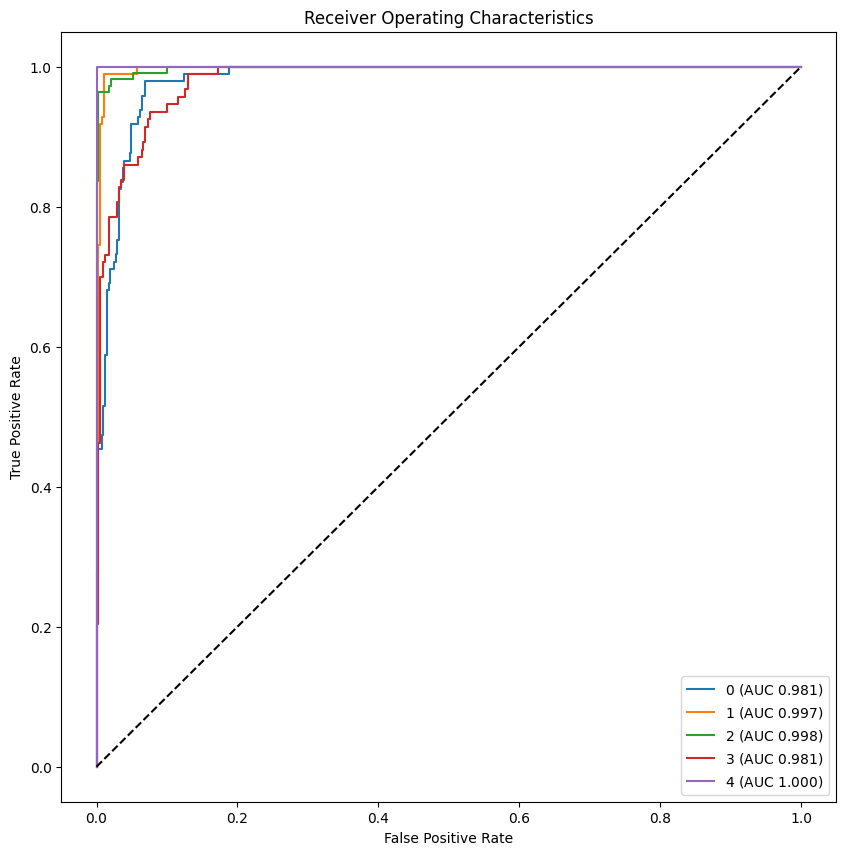

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


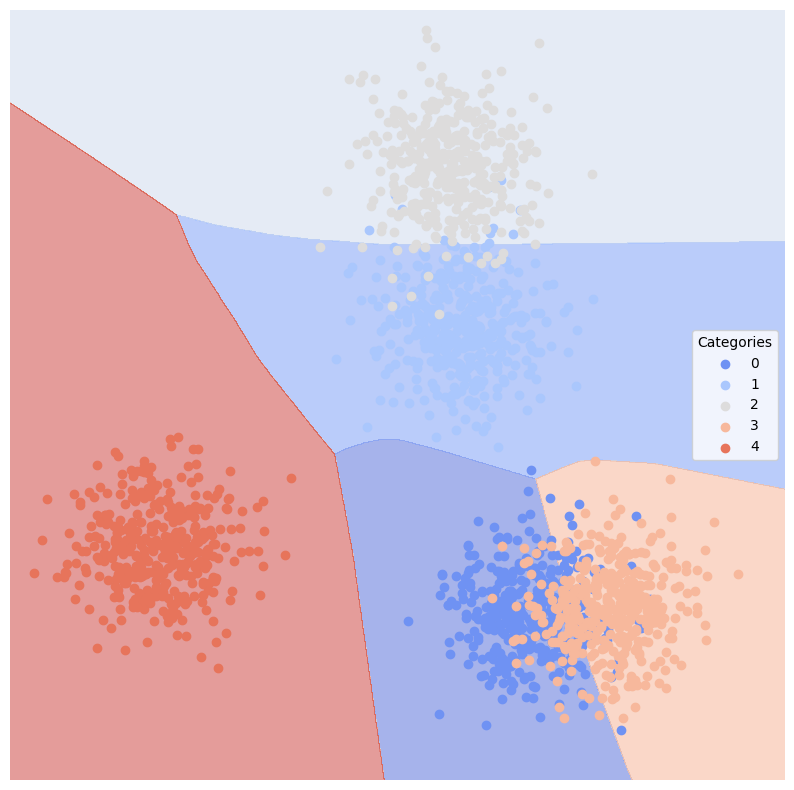

Training and evaluating Gradient Boosting


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


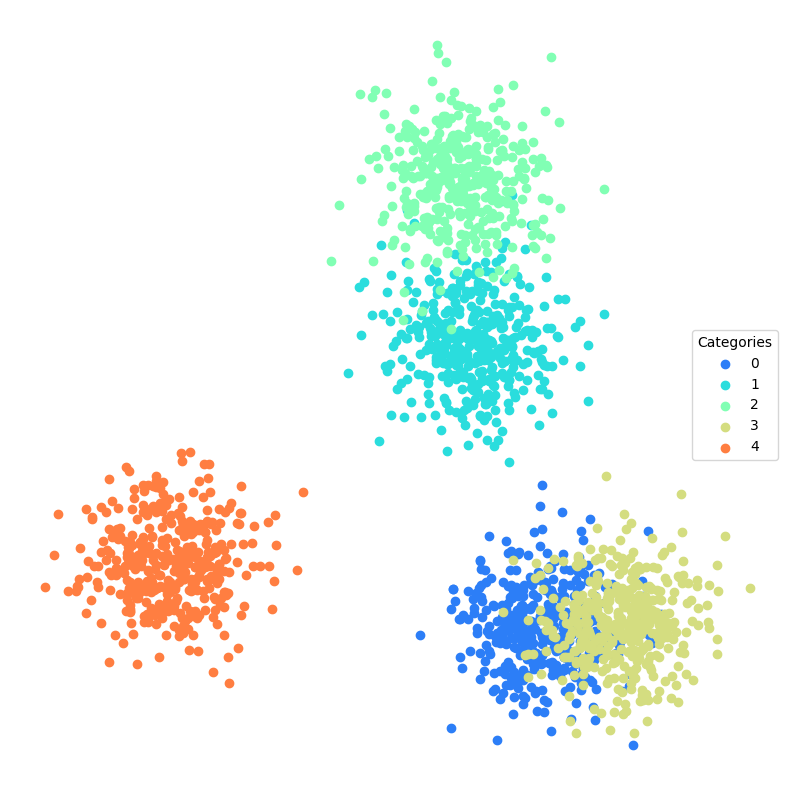

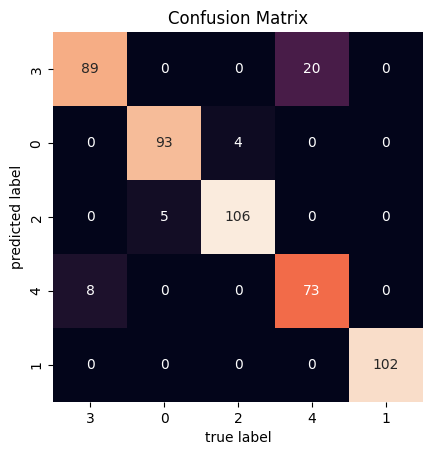

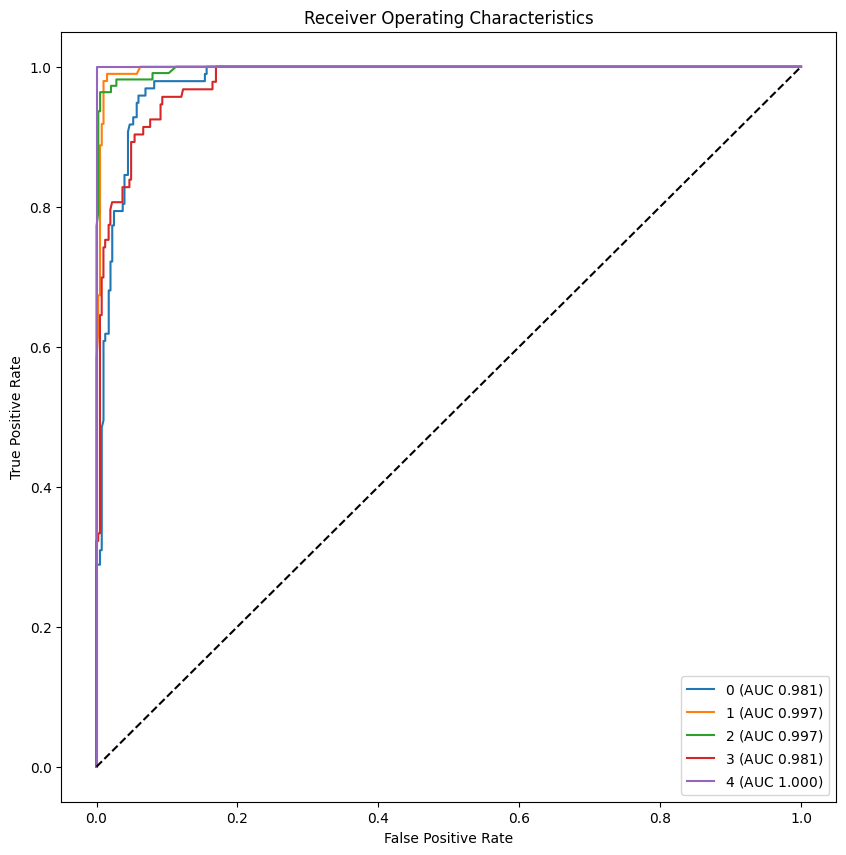

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


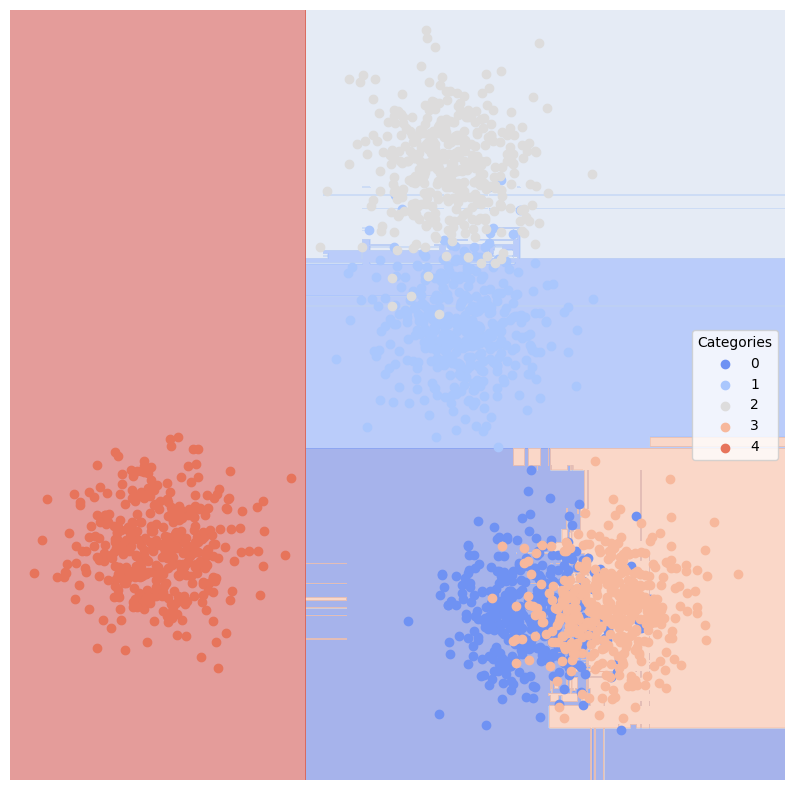

In [ ]:
import numpy as np
import sklearn.linear_model
import sklearn.naive_bayes
import sklearn.svm
import sklearn.neighbors
import sklearn.tree
import sklearn.ensemble
import sklearn.neural_network
from sklearn.naive_bayes import GaussianNB

# Define a list of classifiers
classifiers = [
    ("Logistic Regression", sklearn.linear_model.LogisticRegression()),
    ("Gaussian Naive Bayes", sklearn.naive_bayes.GaussianNB()),
    ("SVC Linear", sklearn.svm.SVC(kernel='linear', probability=True)),
    ("SVC Poly", sklearn.svm.SVC(kernel='poly', degree=3, probability=True)),
    ("KNeighbors Classifier", sklearn.neighbors.KNeighborsClassifier(5, weights='distance')),
    ("Decision Tree", sklearn.tree.DecisionTreeClassifier()),
    ("Random Forest", sklearn.ensemble.RandomForestClassifier()),
    ("MLP Classifier", sklearn.neural_network.MLPClassifier()),
    ("Gradient Boosting", sklearn.ensemble.GradientBoostingClassifier())
]

# Loop through each classifier
for name, clf in classifiers:
    print(f"Training and evaluating {name}")
    # Training classifier
    clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])

    # Evaluation classifier
    lucem_illud.evaluateClassifier(clf, dfTest)

    # Plot
    lucem_illud.plotter(dfTrain)

    # Plot confusion matrix
    lucem_illud.plotConfusionMatrix(clf, dfTest)

    # Plot ROC curve
    lucem_illud.plotMultiROC(clf, dfTest)

    # Plot the decision region
    lucem_illud.plotregions(clf, dfTrain)

# For multiBlobs data, every model performed vey well, except `Decision Tree` model, because it create a lot of noise, while `SVC Poly` performs best because it capture the distribution pattern

# Now I apply this to real data, **I will use a loop to plot all the methods** I willcompare and describe which classifier(s) worked best with which artificially constructed data source and why **after** all of the plots

In [ ]:
dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadNewsGroups(), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadSenateSmall(), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadSenateLarge(), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadSpam(), test_size=.2)

Loading data for: comp.sys.mac.hardware
Loading data for: comp.windows.x
Loading data for: misc.forsale
Loading data for: rec.autos
Converting to vectors


/usr/local/lib/python3.10/dist-packages/spacy/pipeline/lemmatizer.py:211: UserWarning: [W108] The rule-based lemmatizer did not find POS annotation for one or more tokens. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
  warnings.warn(Warnings.W108)


Training and evaluating Logistic Regression


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


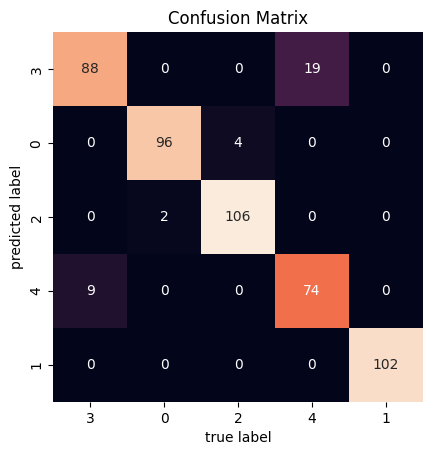

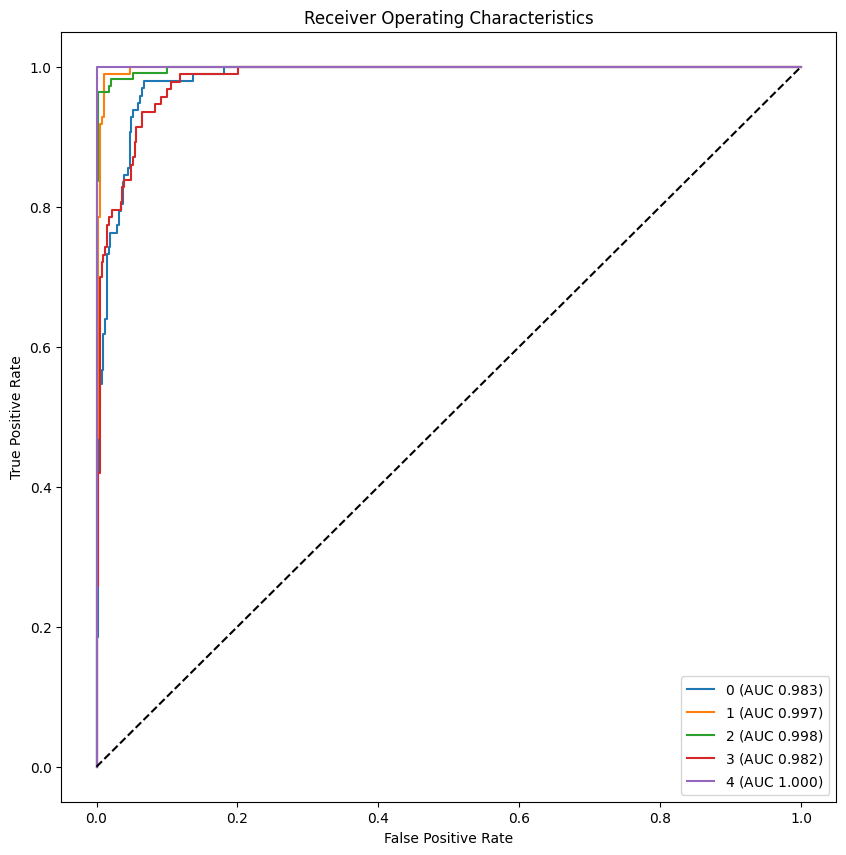

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


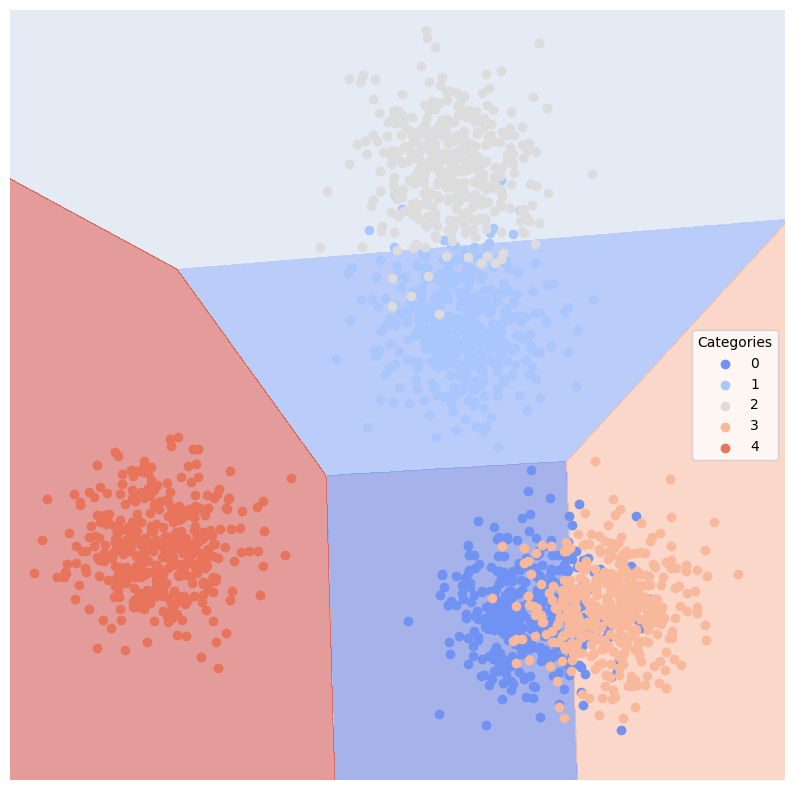

Training and evaluating Gaussian Naive Bayes


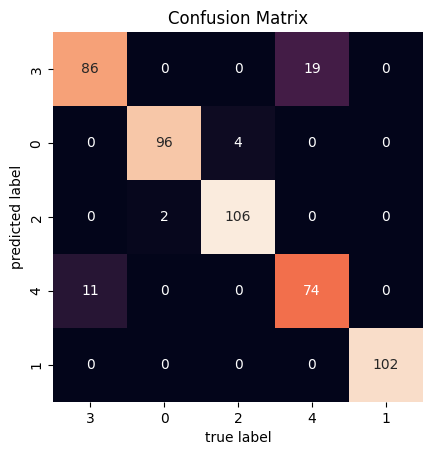

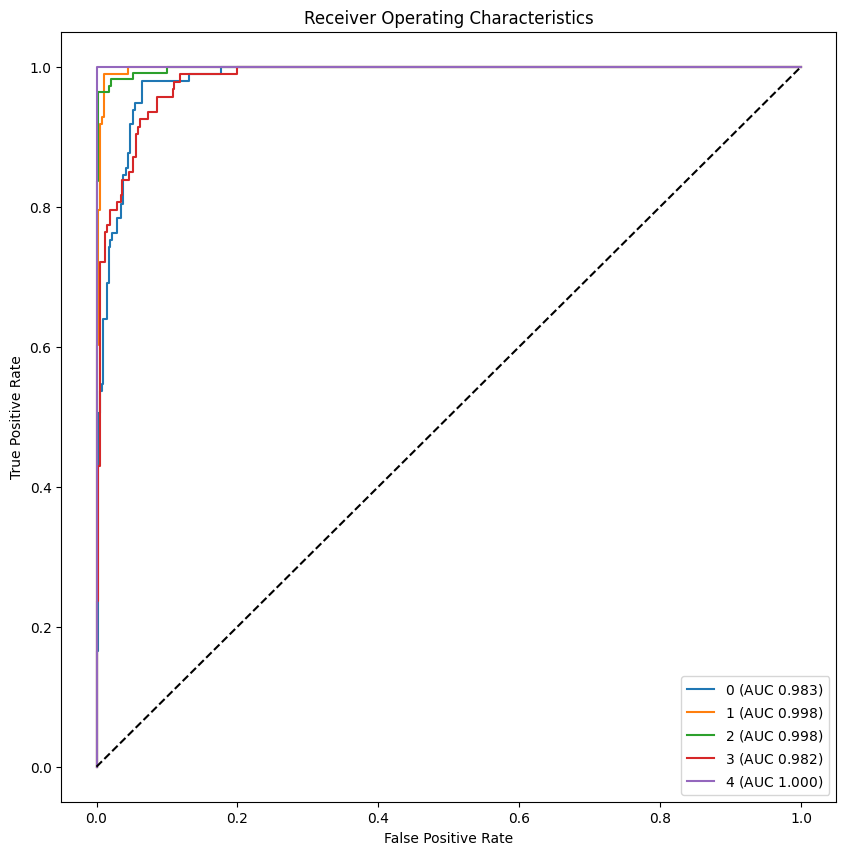

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


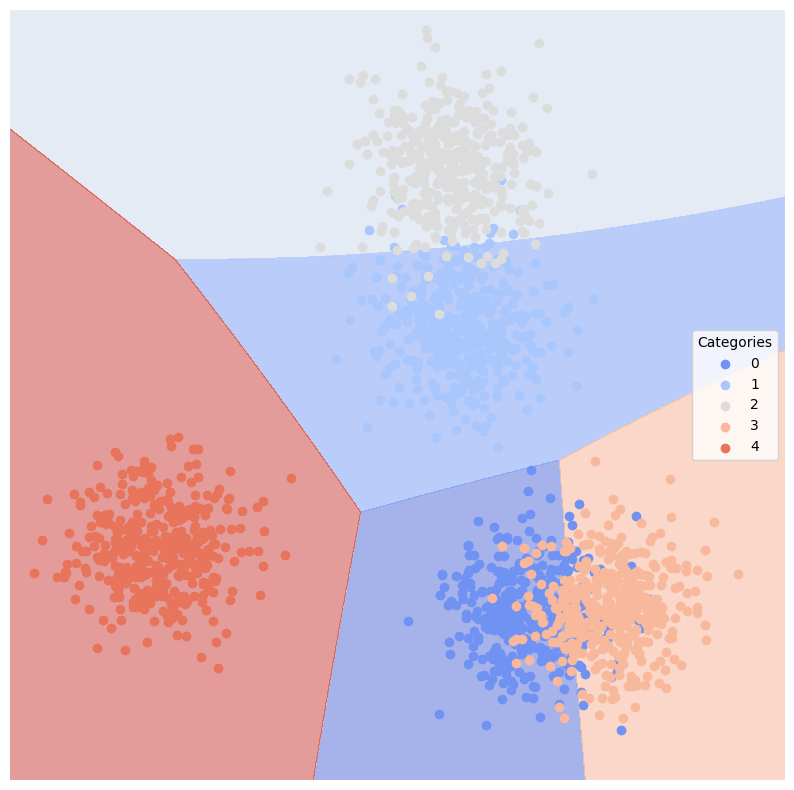

Training and evaluating SVC Linear


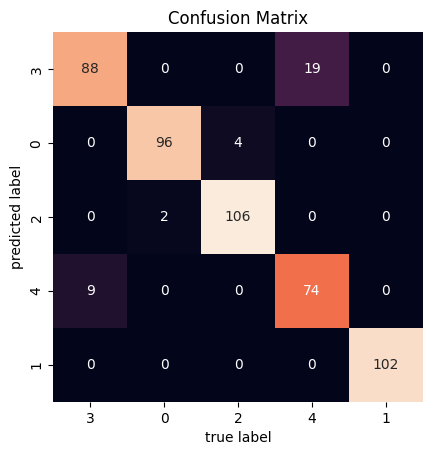

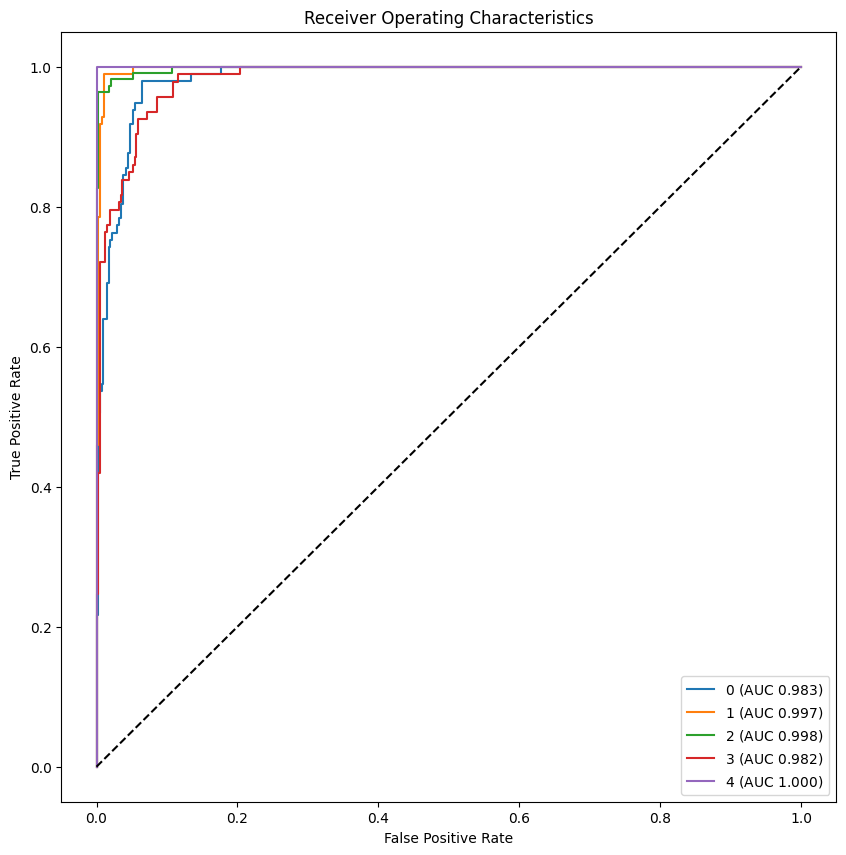

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


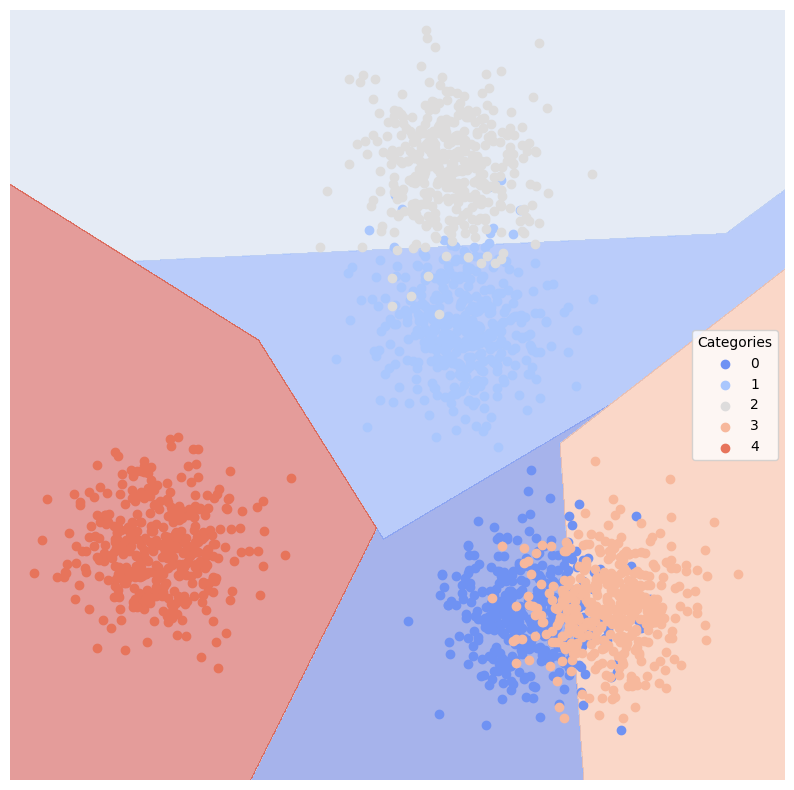

Training and evaluating SVC Poly


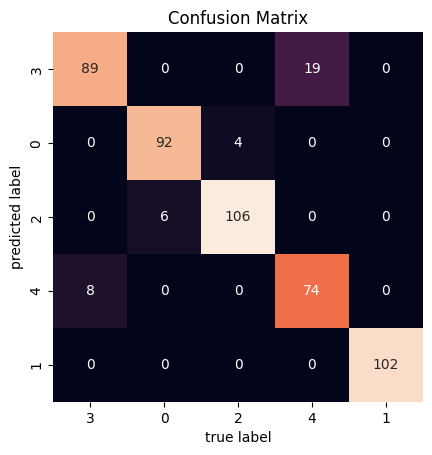

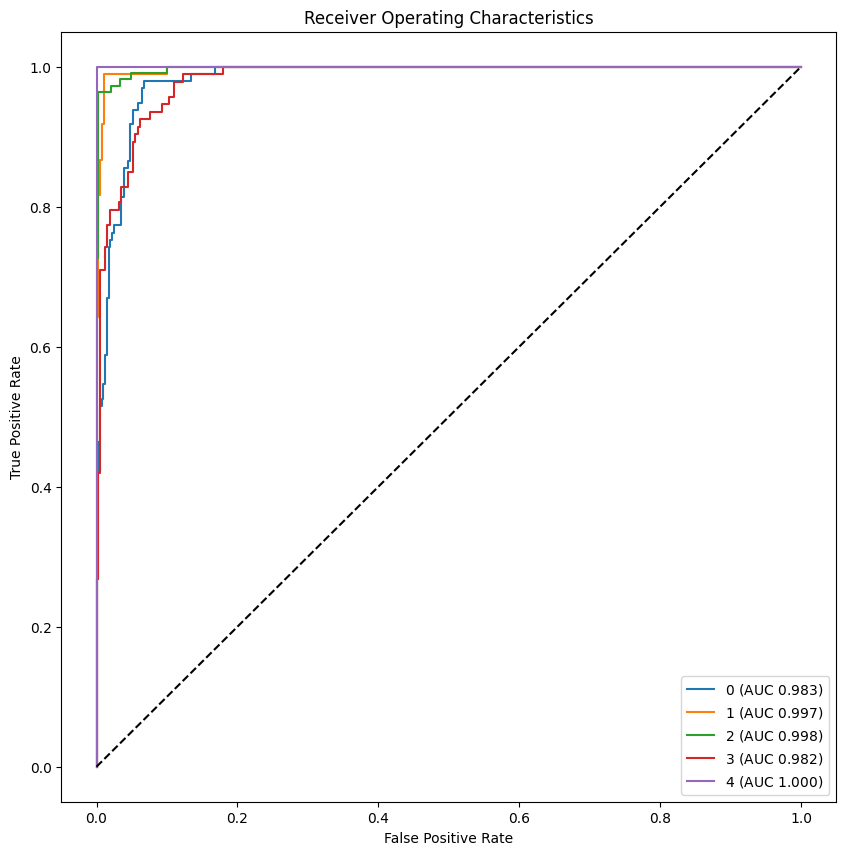

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


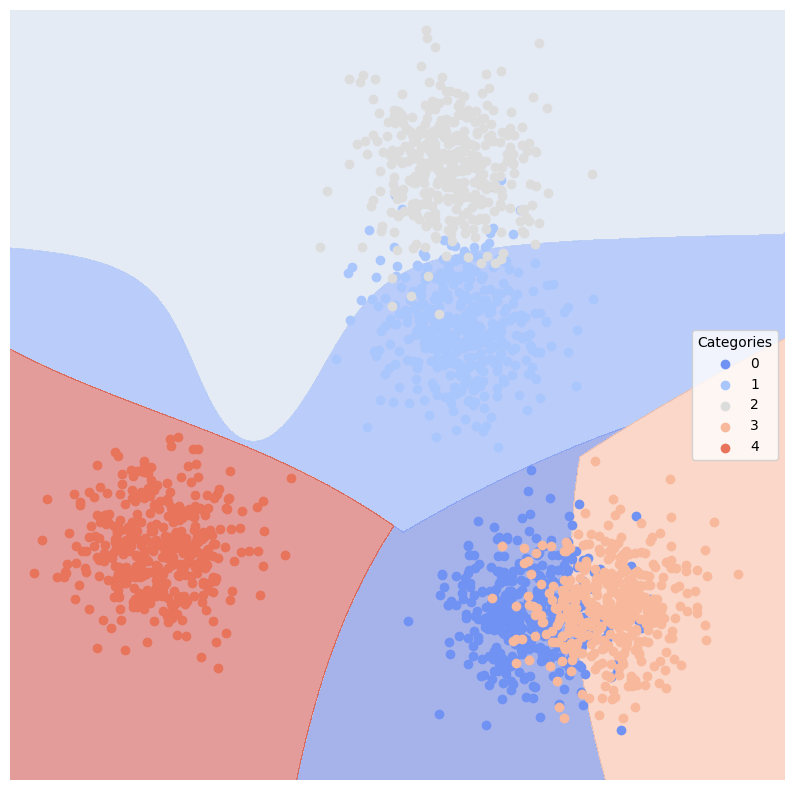

Training and evaluating Decision Tree


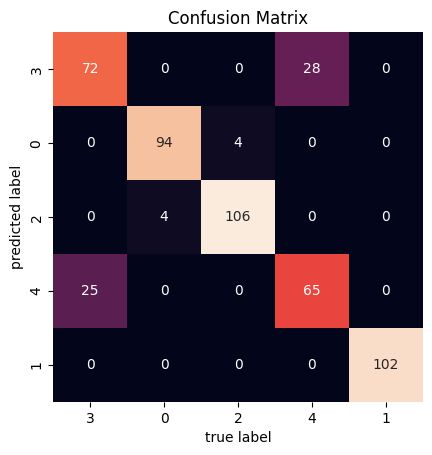

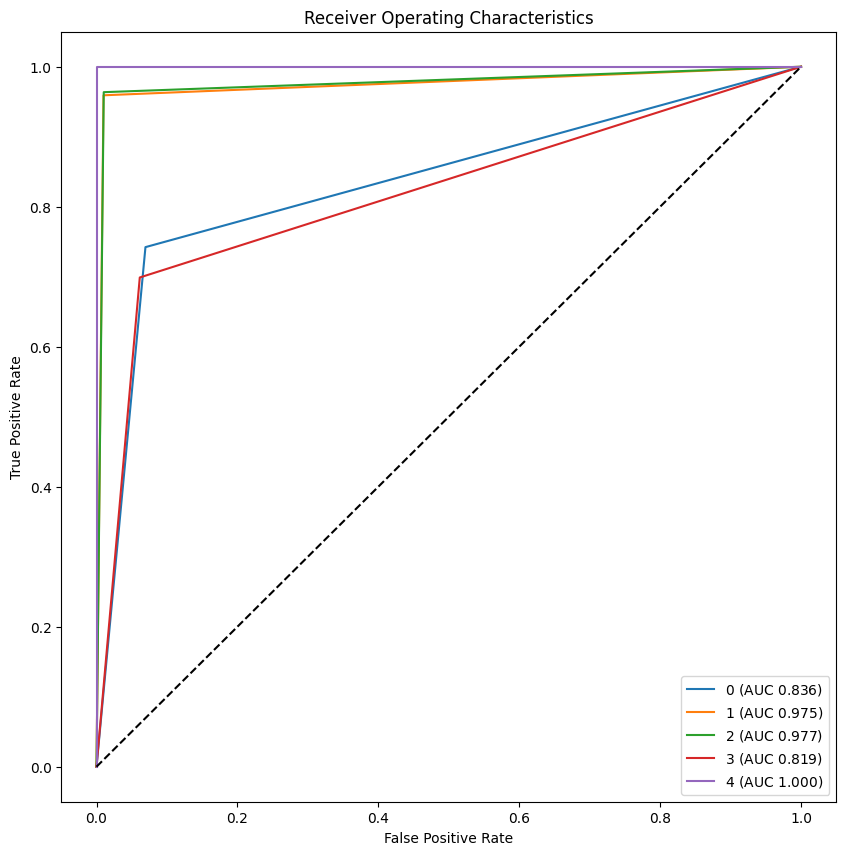

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


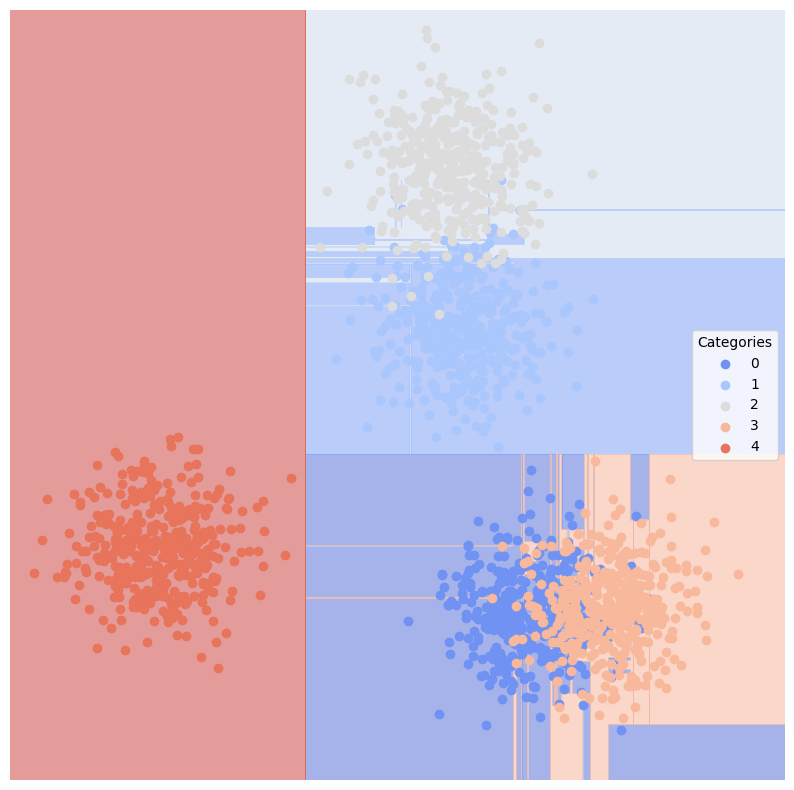

Training and evaluating Random Forest


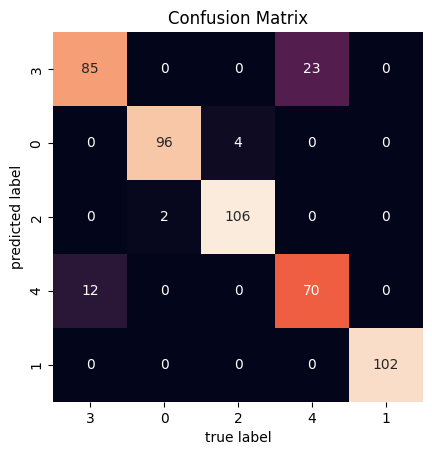

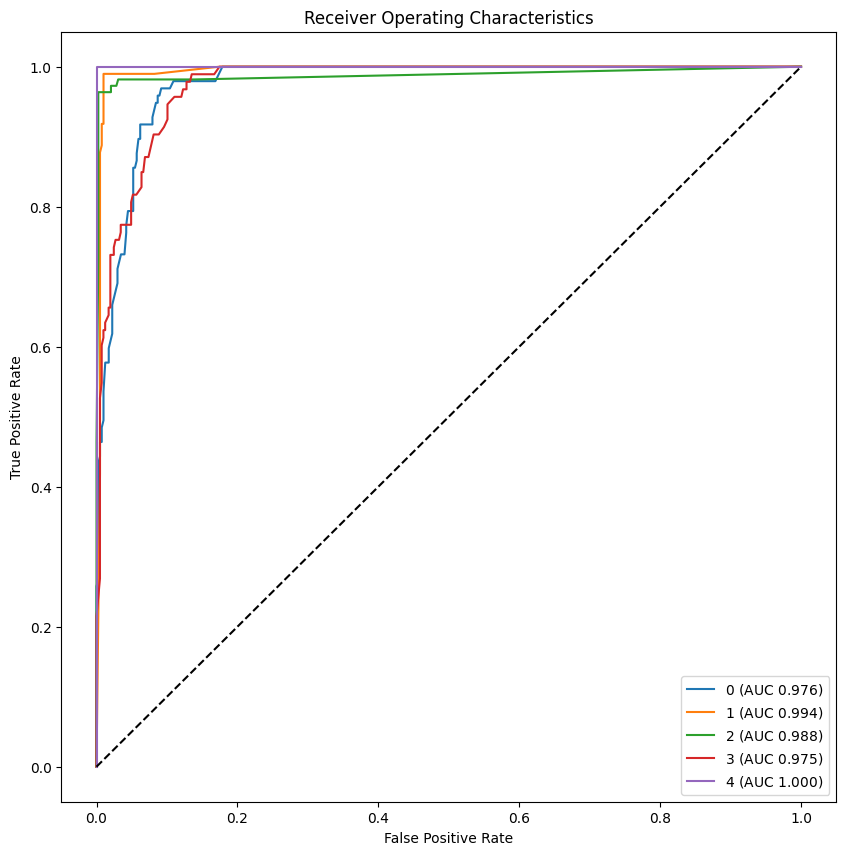

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


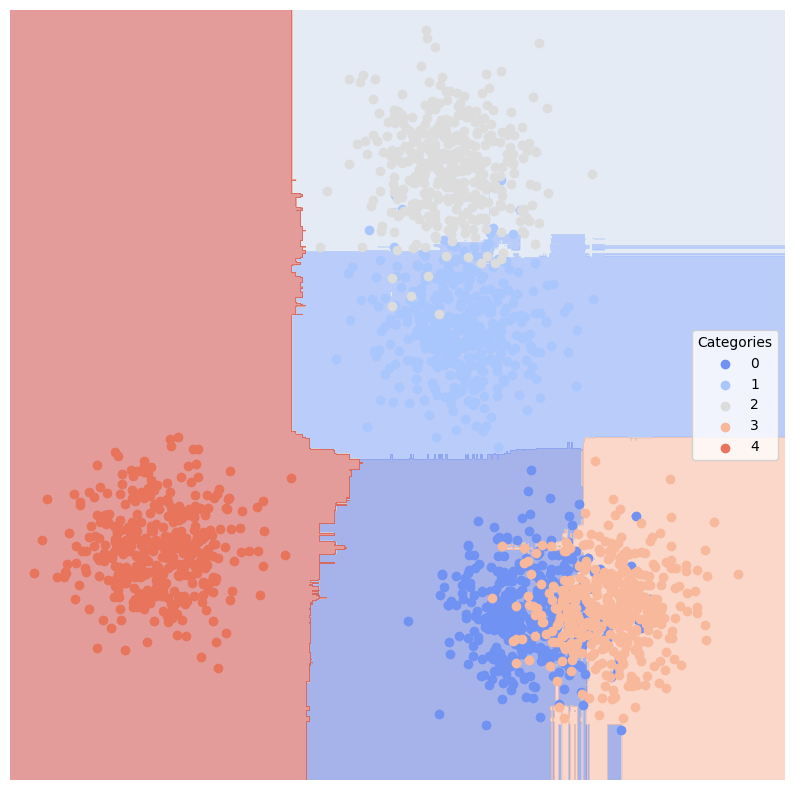

Training and evaluating MLP Classifier


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


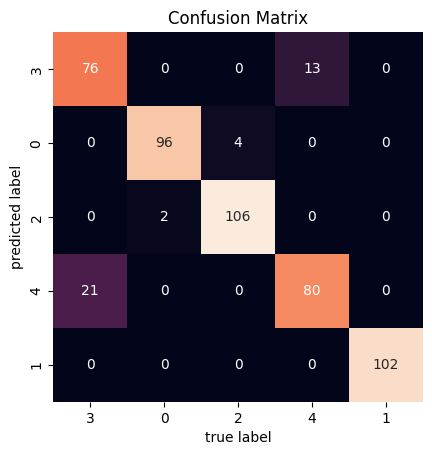

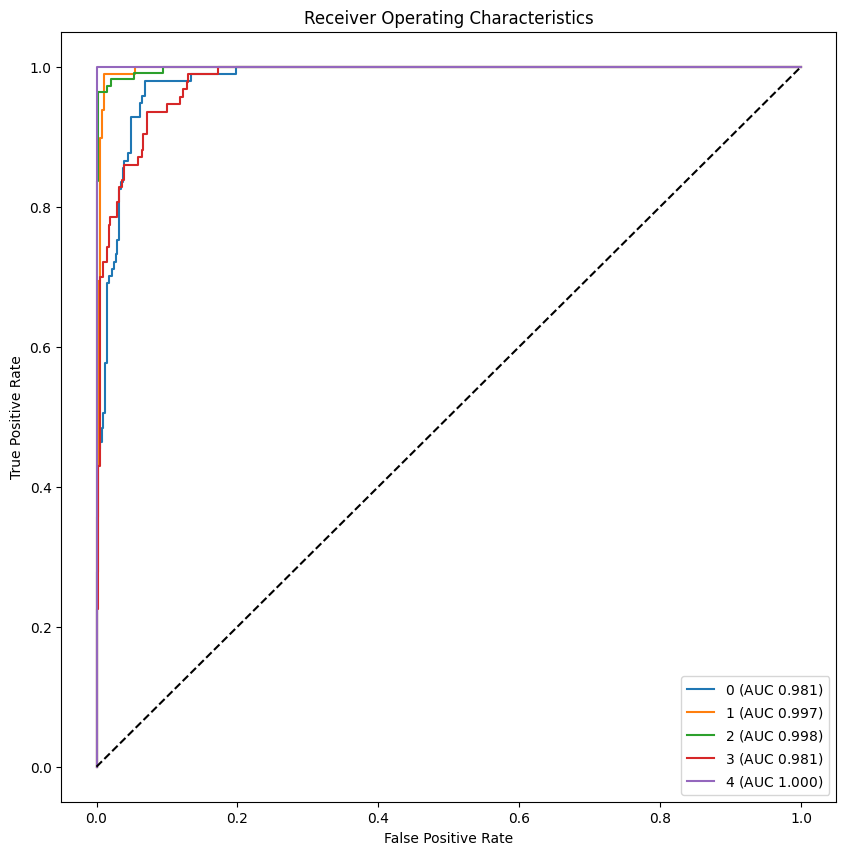

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


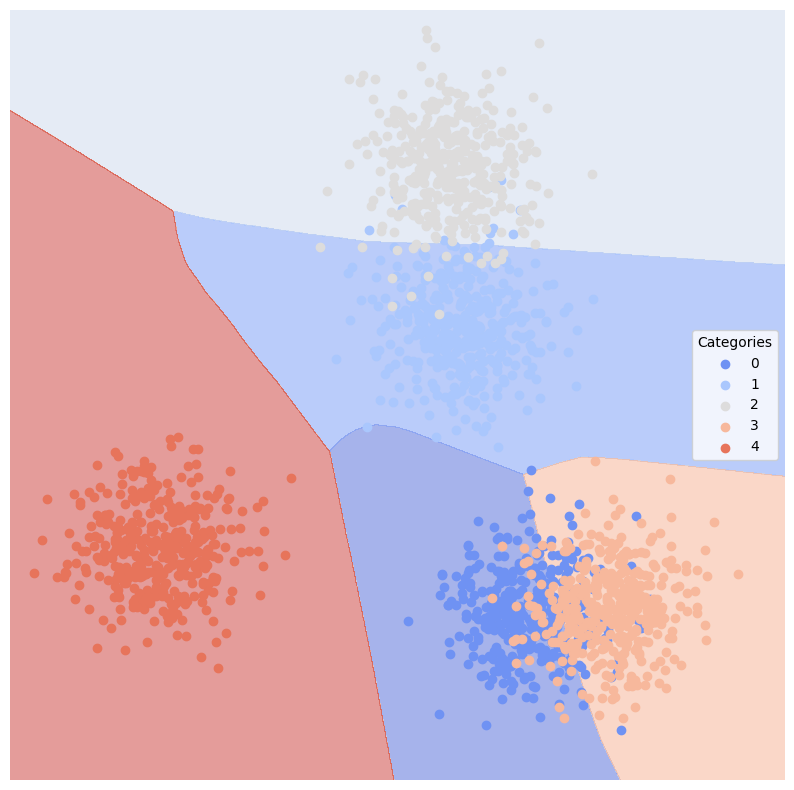

Training and evaluating Gradient Boosting


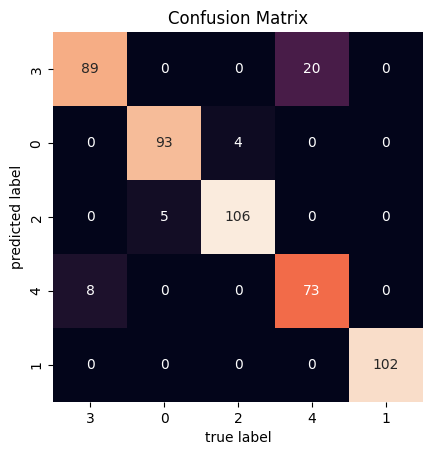

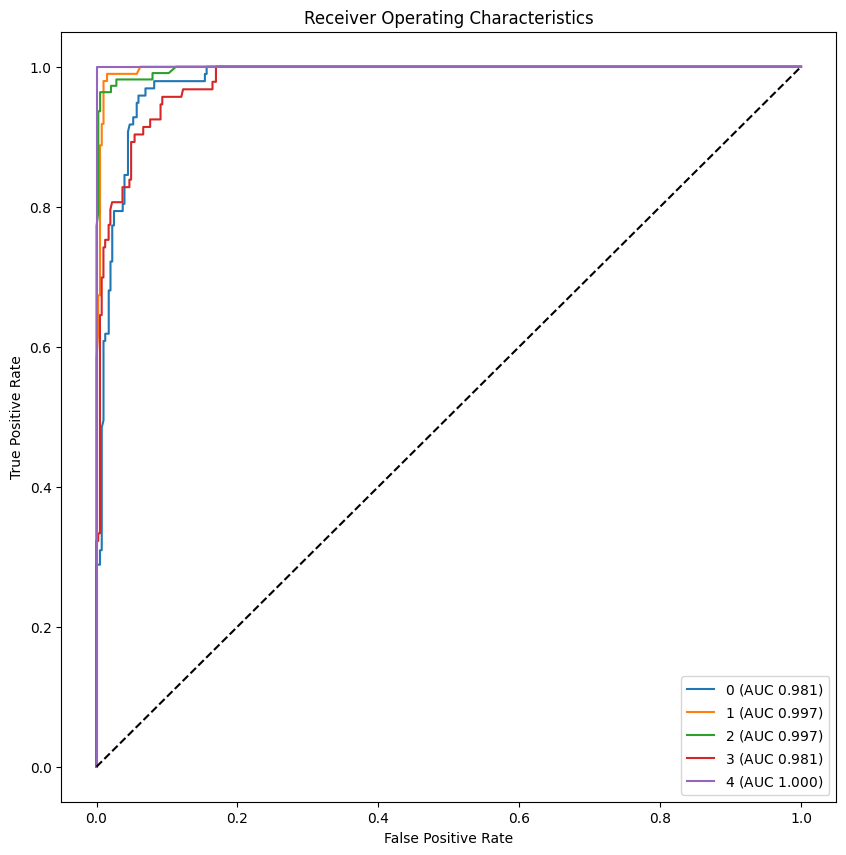

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


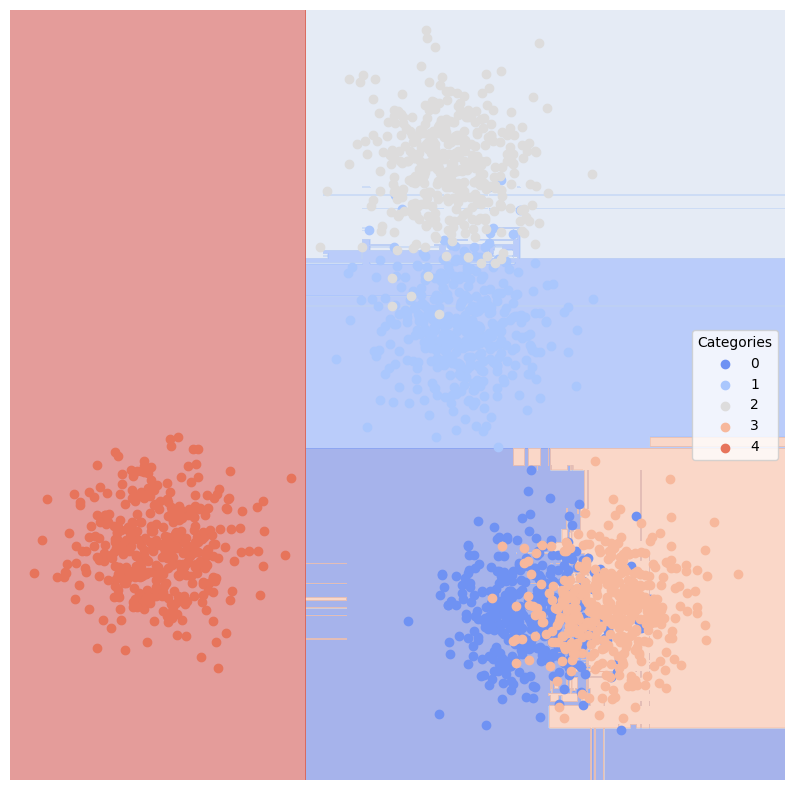

In [ ]:
import numpy as np
import sklearn.linear_model
import sklearn.naive_bayes
import sklearn.svm
import sklearn.neighbors
import sklearn.tree
import sklearn.ensemble
import sklearn.neural_network
from sklearn.naive_bayes import GaussianNB

# Define a list of classifiers
classifiers = [
    ("Logistic Regression", sklearn.linear_model.LogisticRegression()),
    ("Gaussian Naive Bayes", sklearn.naive_bayes.GaussianNB()),
    ("SVC Linear", sklearn.svm.SVC(kernel='linear', probability=True)),
    ("SVC Poly", sklearn.svm.SVC(kernel='poly', degree=3, probability=True)),
    ("Decision Tree", sklearn.tree.DecisionTreeClassifier()),
    ("Random Forest", sklearn.ensemble.RandomForestClassifier()),
    ("MLP Classifier", sklearn.neural_network.MLPClassifier()),
    ("Gradient Boosting", sklearn.ensemble.GradientBoostingClassifier())
]

# Loop through each classifier
for name, clf in classifiers:
    print(f"Training and evaluating {name}")
    # Training classifier
    clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])

    # Evaluation classifier
    lucem_illud.evaluateClassifier(clf, dfTest)

    # Plot confusion matrix
    lucem_illud.plotConfusionMatrix(clf, dfTest)

    # Plot ROC curve
    lucem_illud.plotMultiROC(clf, dfTest)

    # Plot the decision region
    lucem_illud.plotregions(clf, dfTrain)


# For `NewsGroups` data, every model performed vey well, except `Decision Tree` model, because it create a lot of noise, while `SVC Linear` performs best because it capture the distribution pattern

In [ ]:
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadNewsGroups(), test_size=.2)
dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadSenateSmall(dataDirectory='/content/drive/MyDrive/Content_Analysis/Homework-Notebooks/data/'), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadSenateLarge(), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadSpam(), test_size=.2)

Loading senate data
Converting to vectors


/usr/local/lib/python3.10/dist-packages/spacy/pipeline/lemmatizer.py:211: UserWarning: [W108] The rule-based lemmatizer did not find POS annotation for one or more tokens. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
  warnings.warn(Warnings.W108)


Training and evaluating Logistic Regression


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


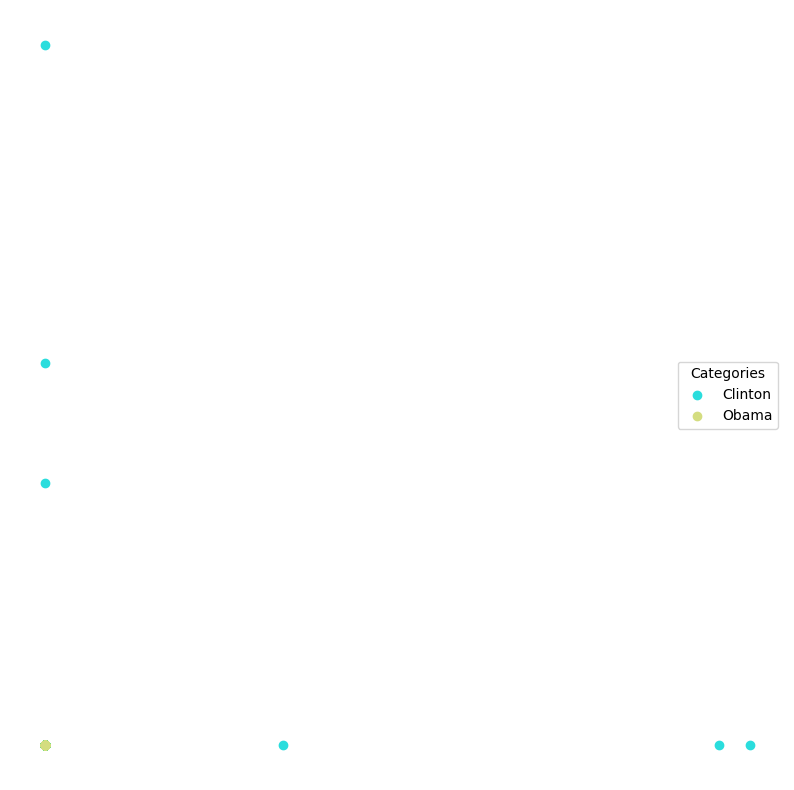

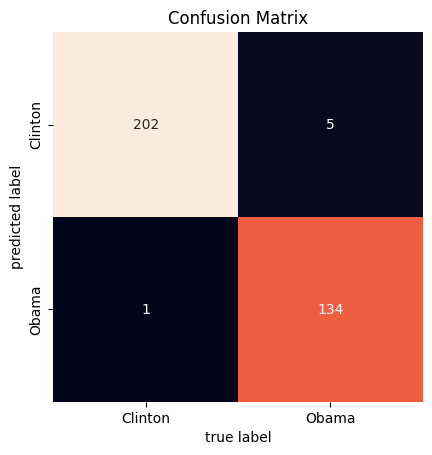

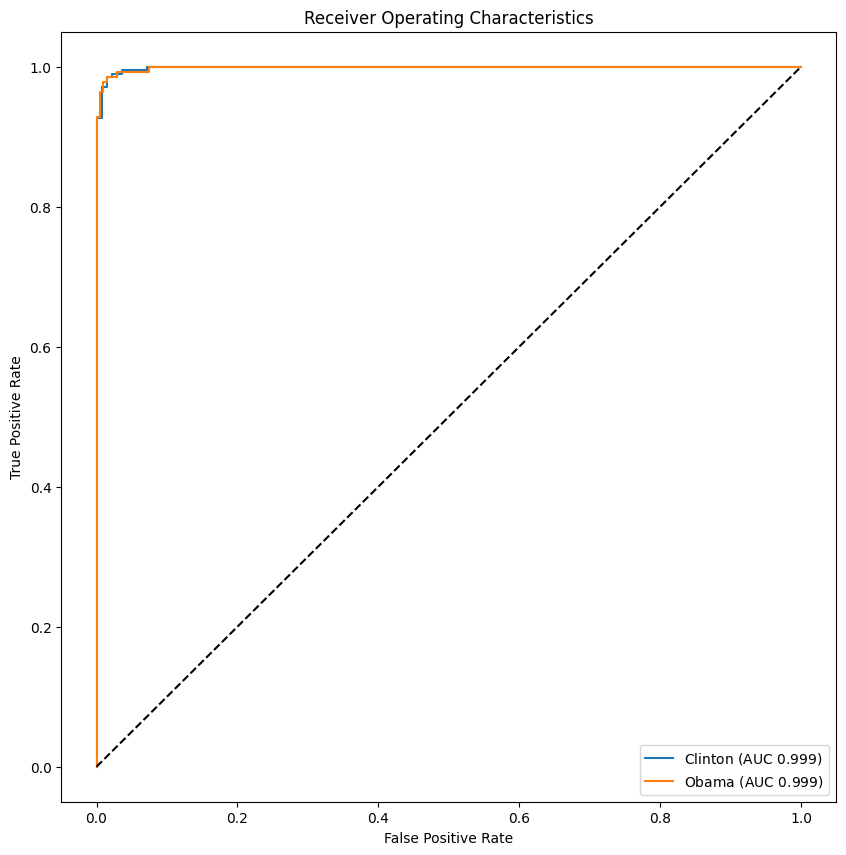

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


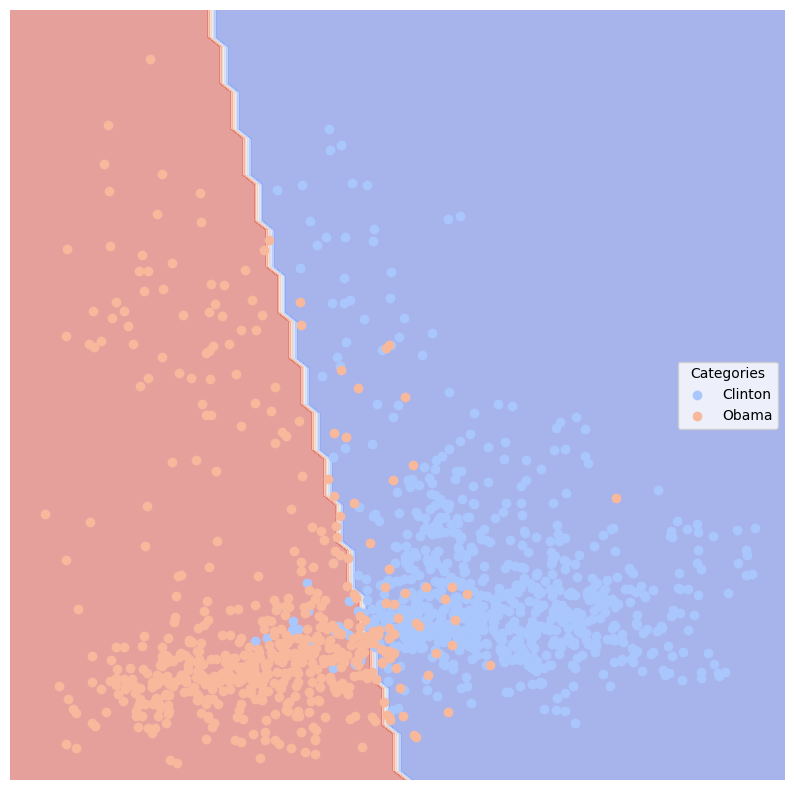

Training and evaluating Gaussian Naive Bayes


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


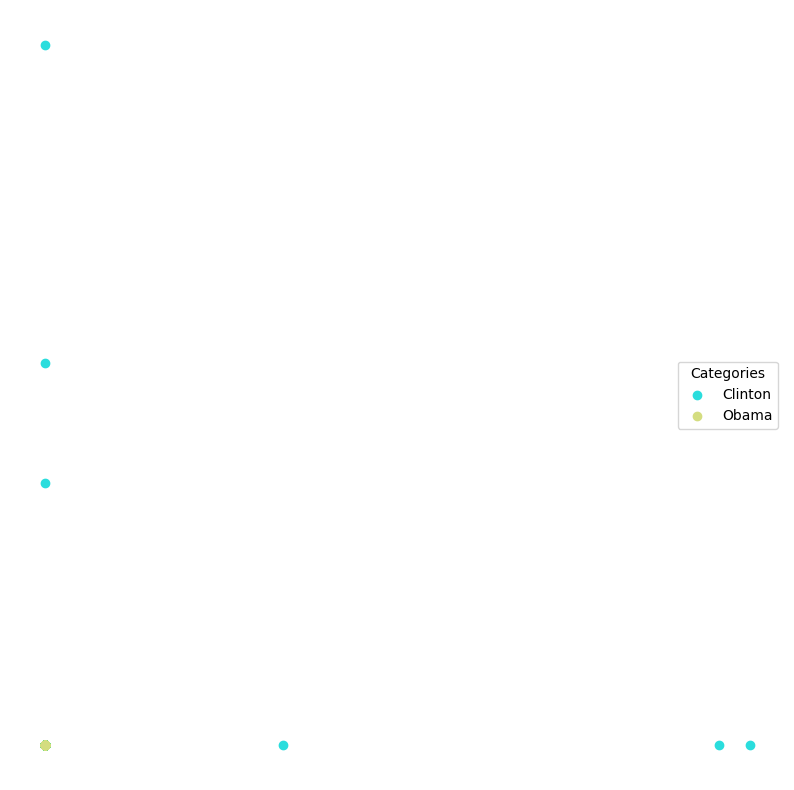

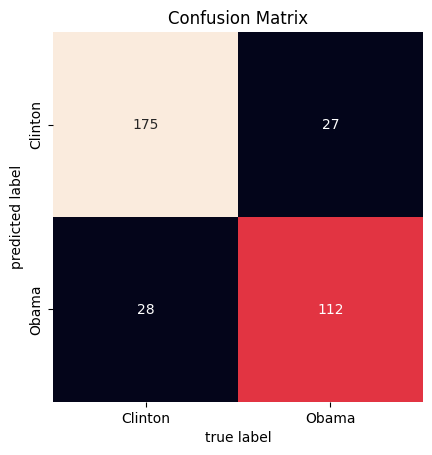

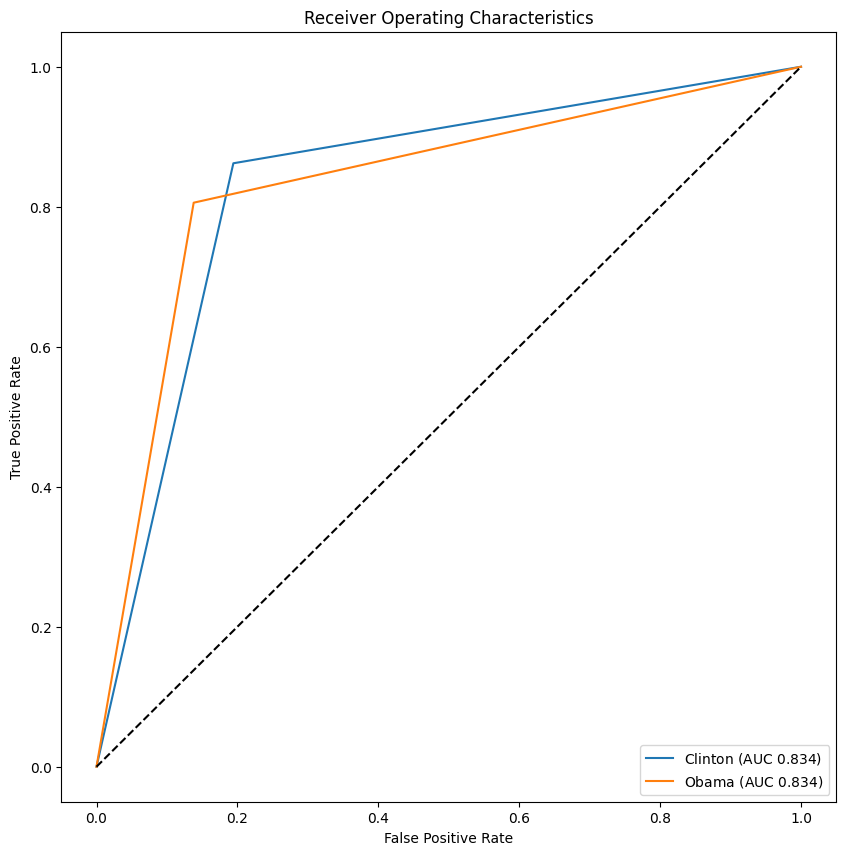

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


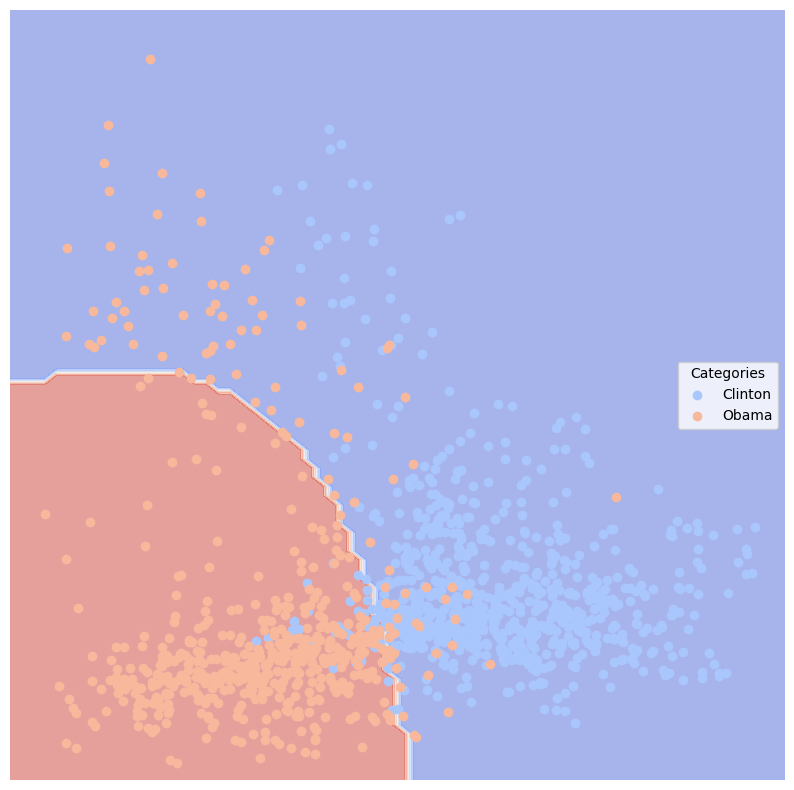

Training and evaluating SVC Linear


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


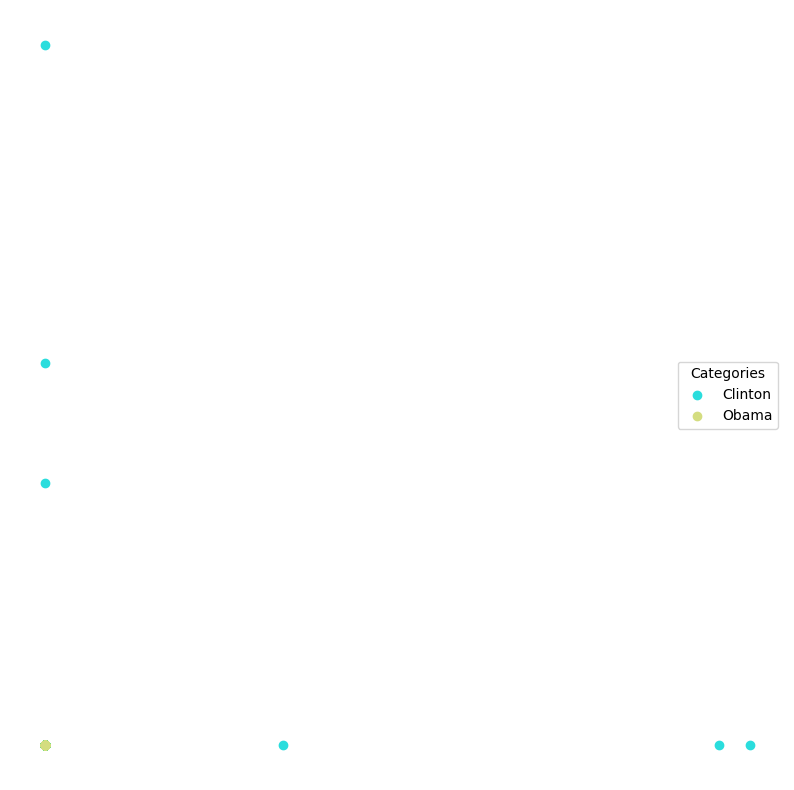

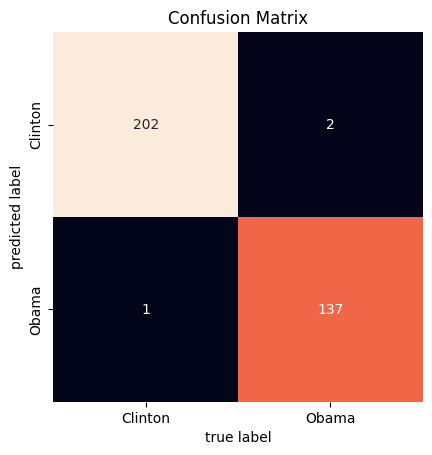

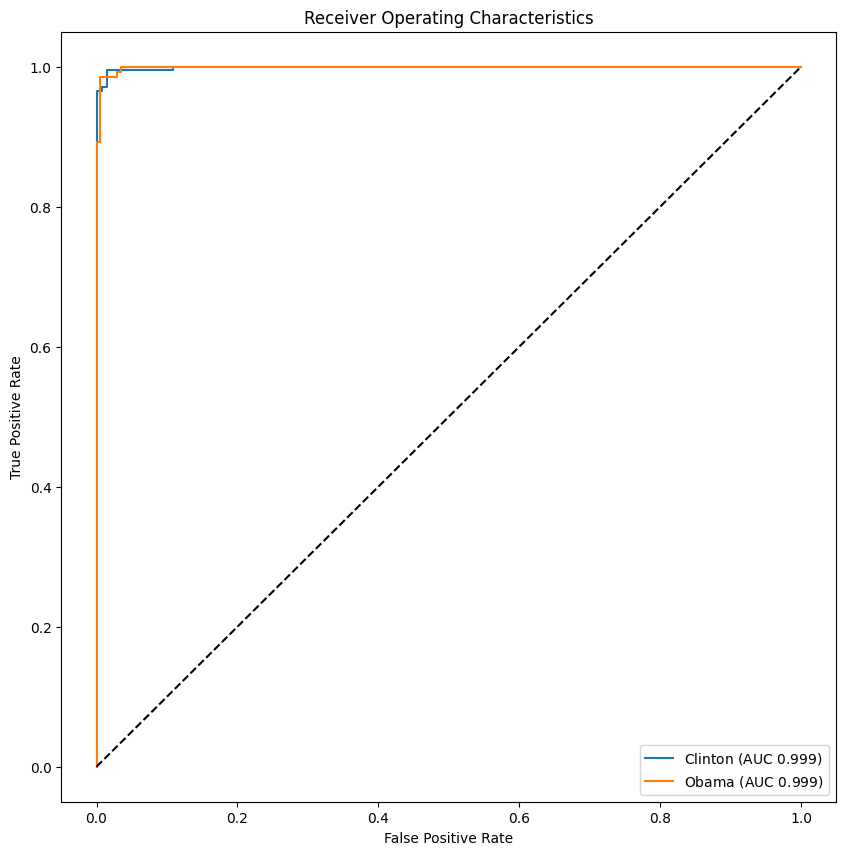

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


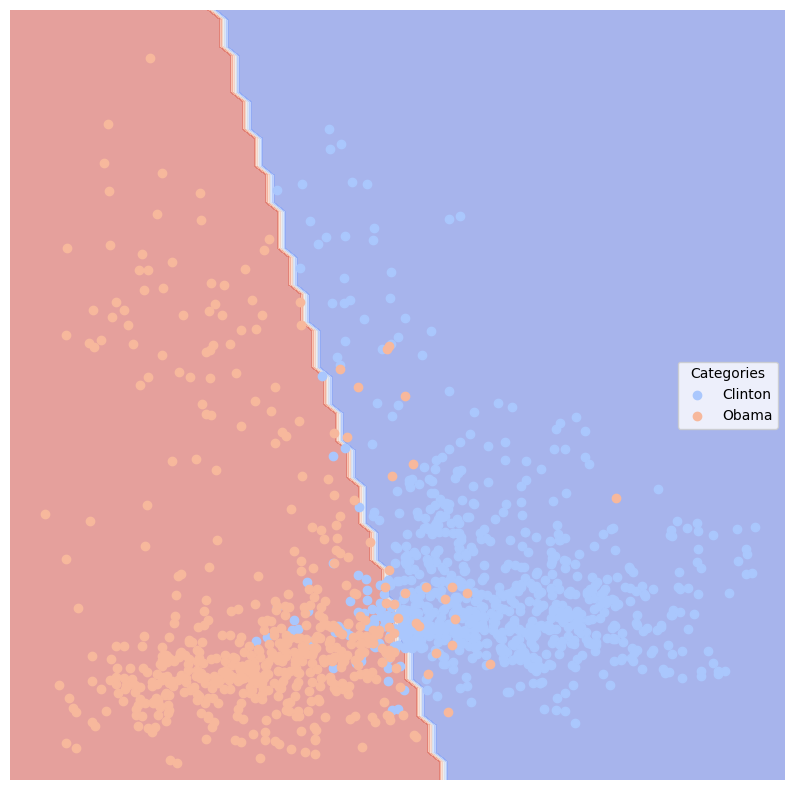

Training and evaluating SVC Poly


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


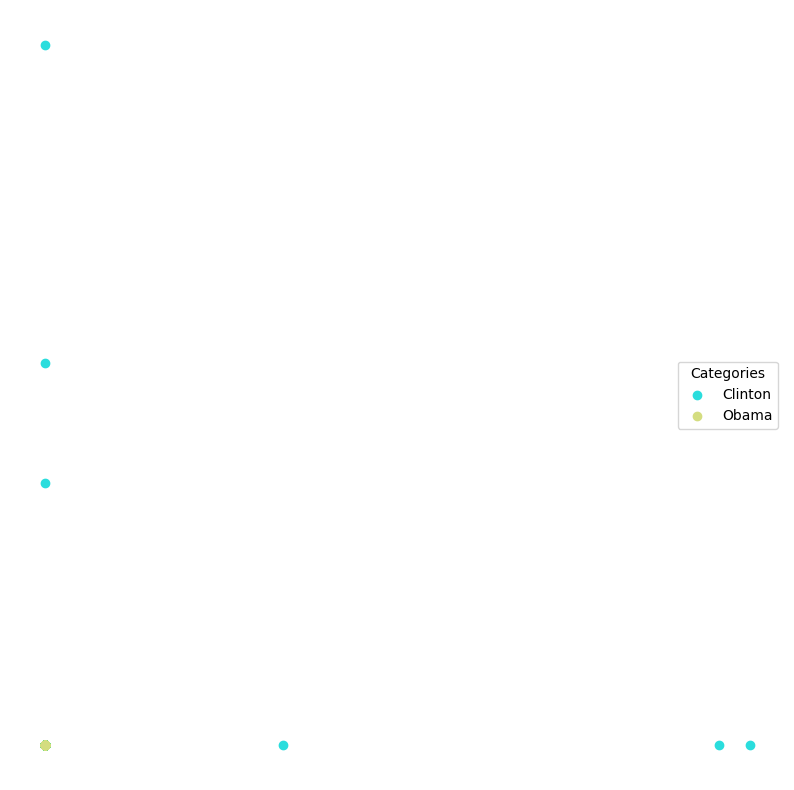

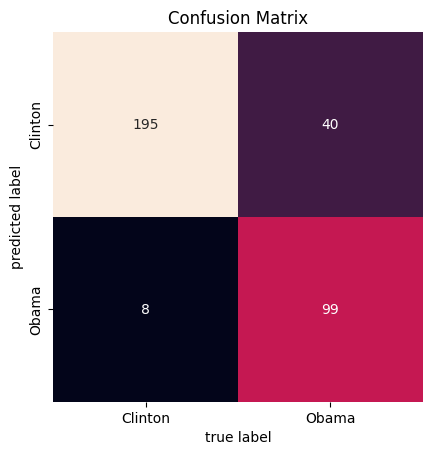

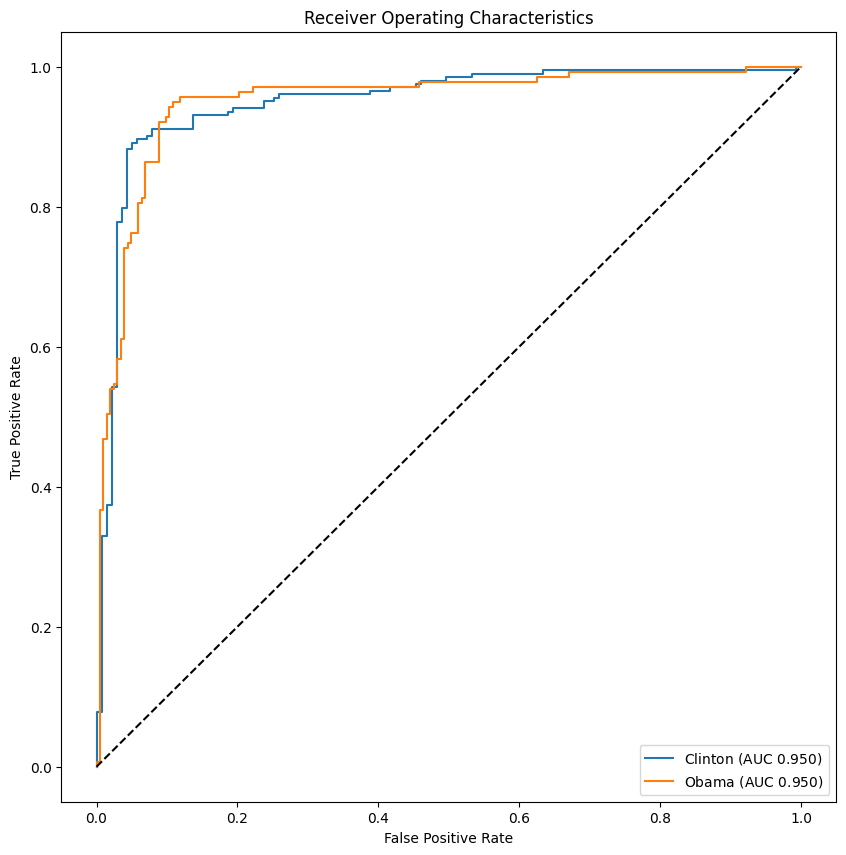

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


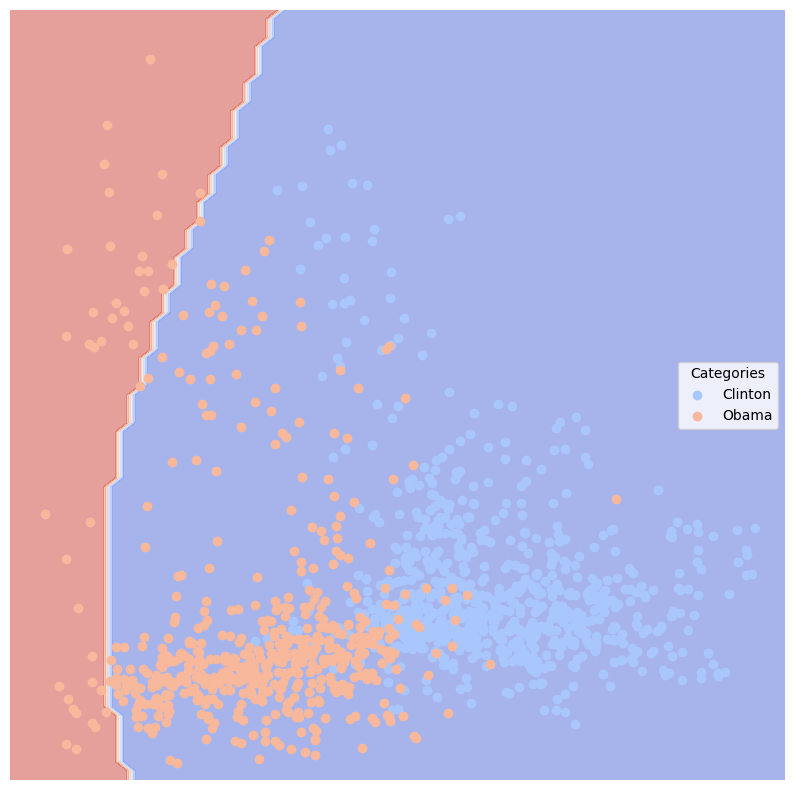

Training and evaluating Decision Tree


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


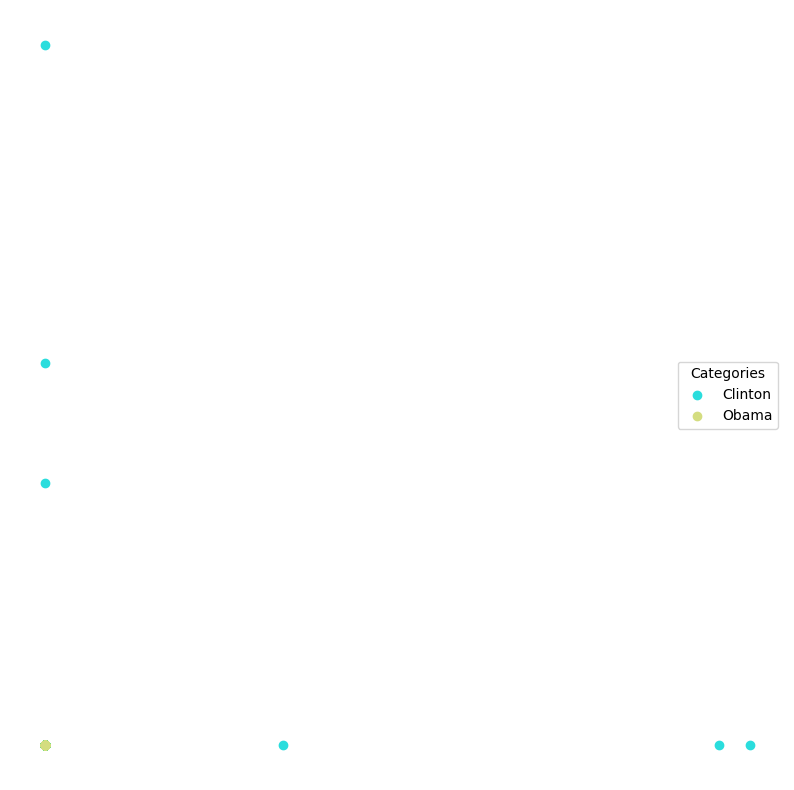

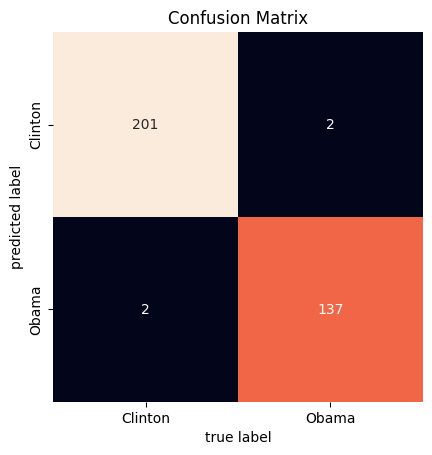

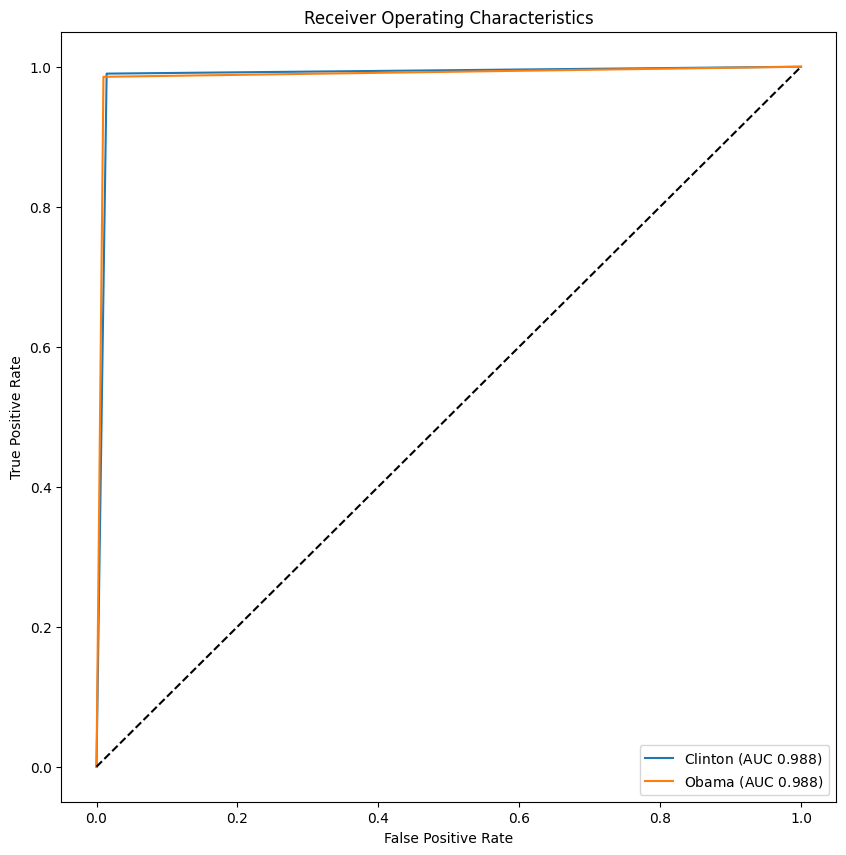

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


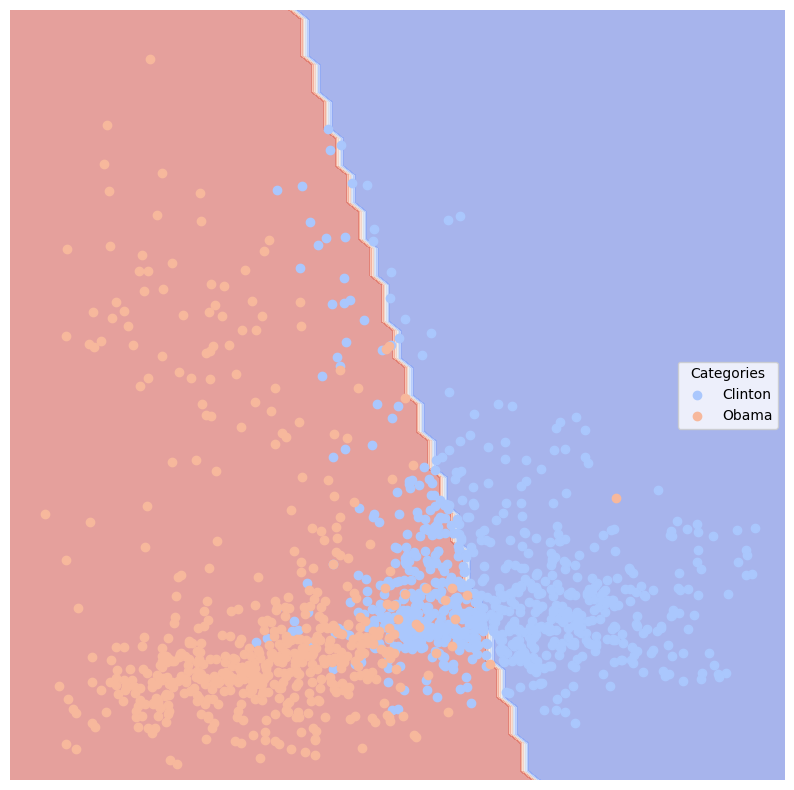

Training and evaluating Random Forest


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


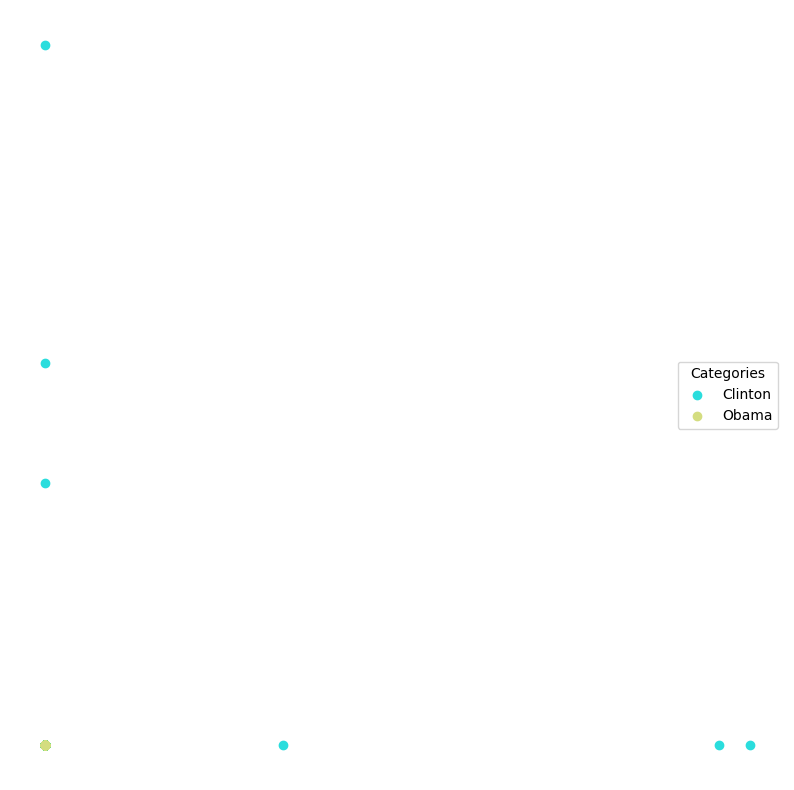

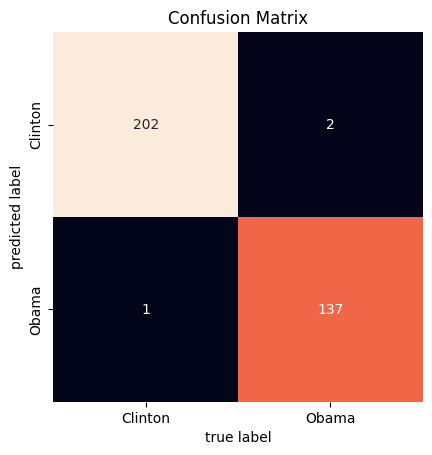

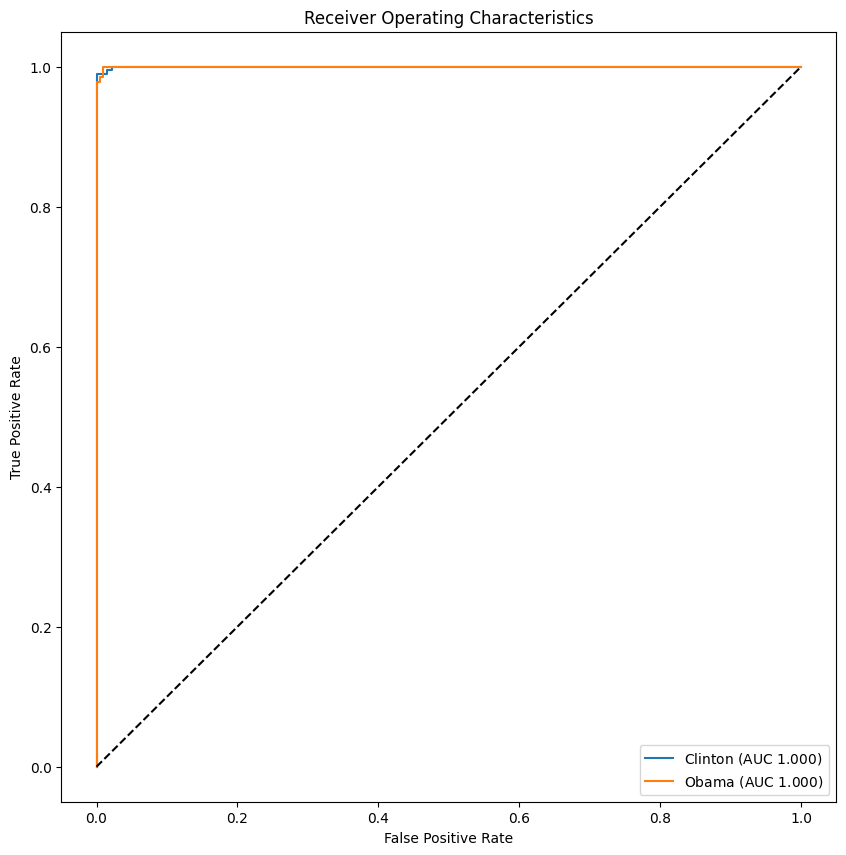

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


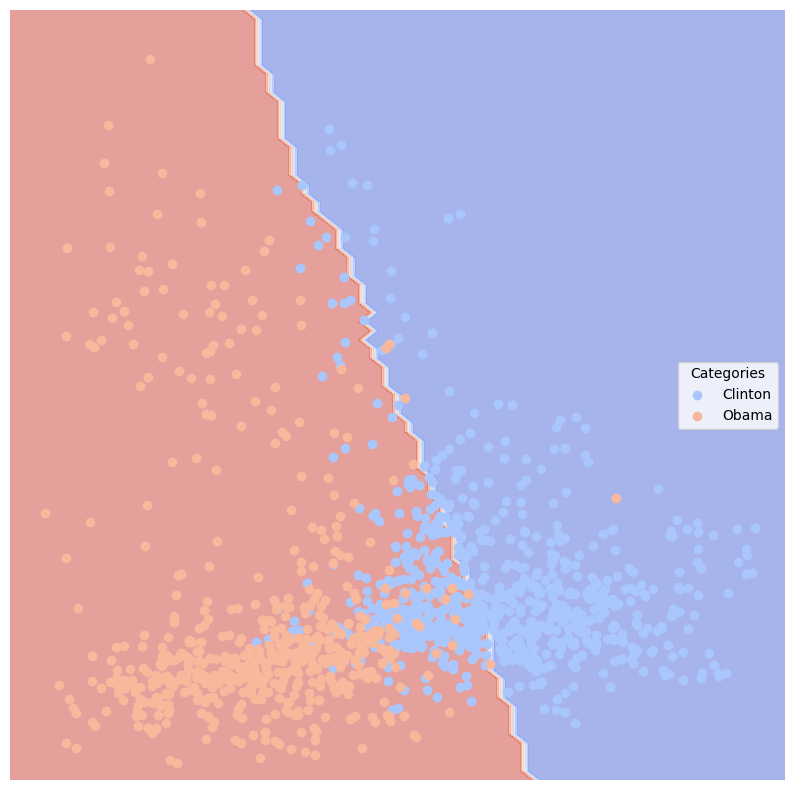

Training and evaluating MLP Classifier


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


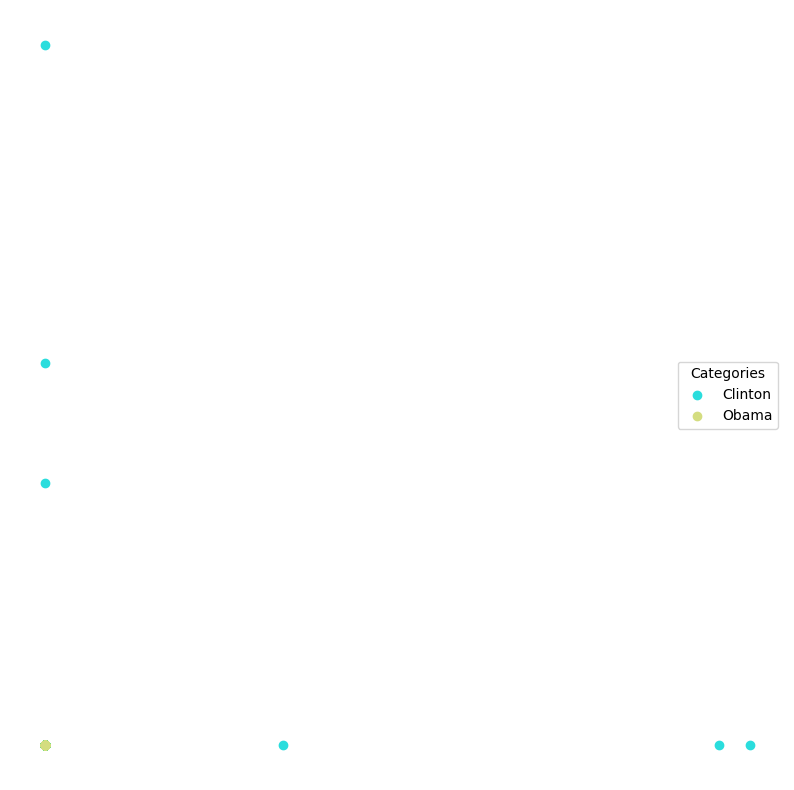

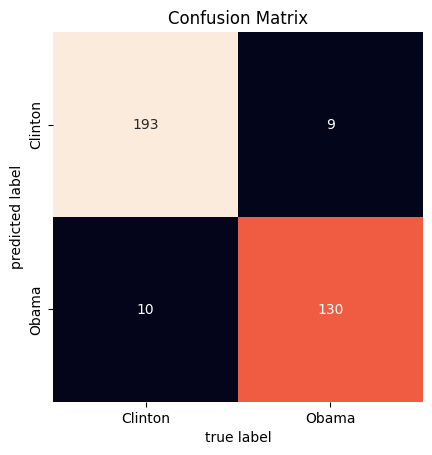

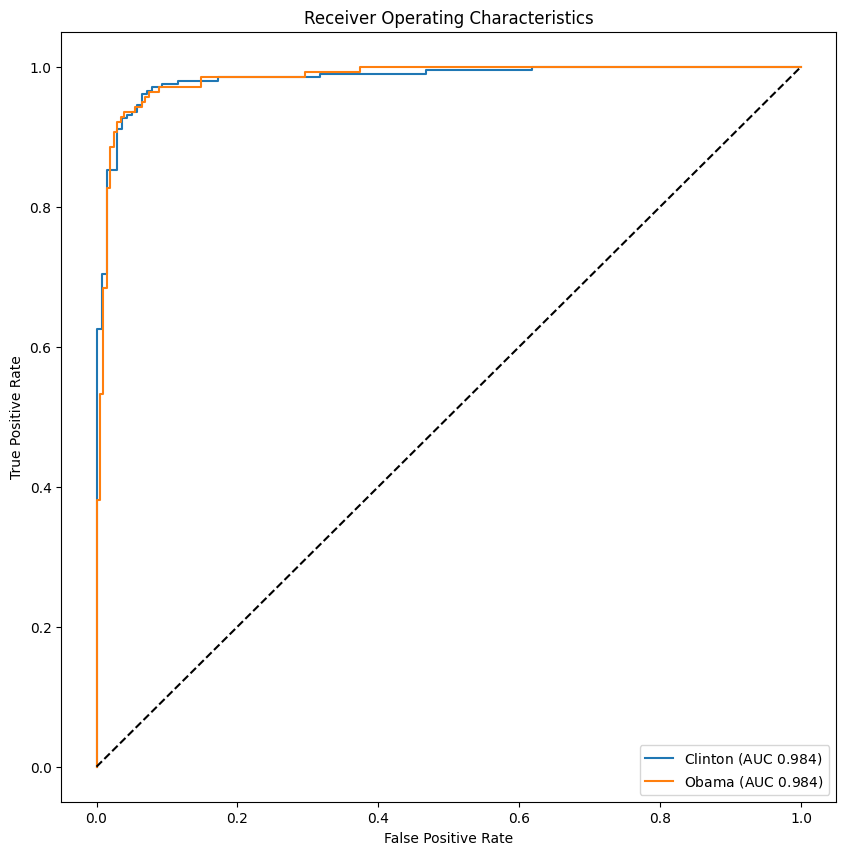

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


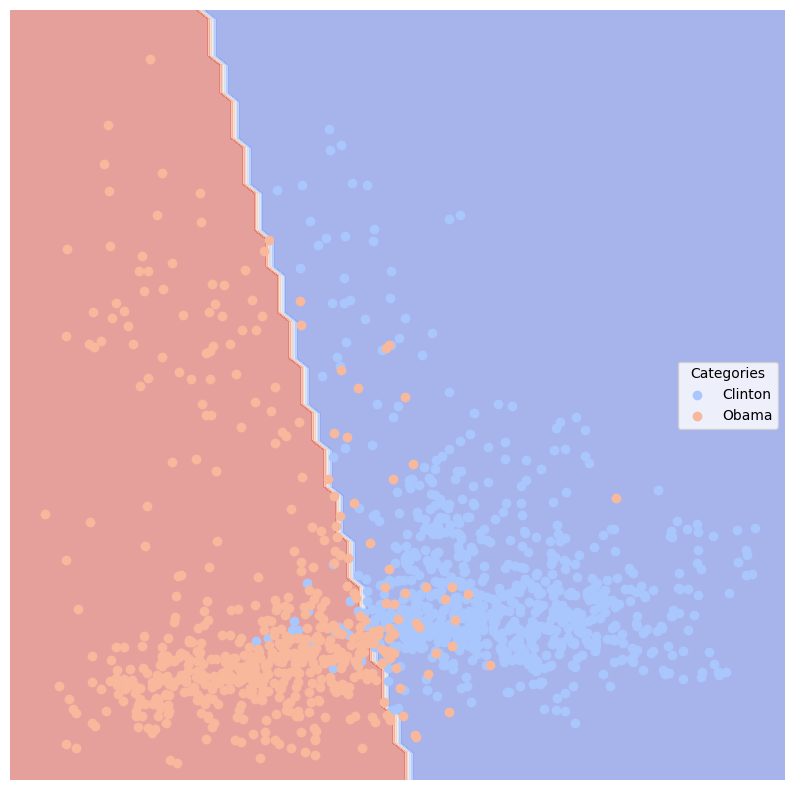

Training and evaluating Gradient Boosting


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


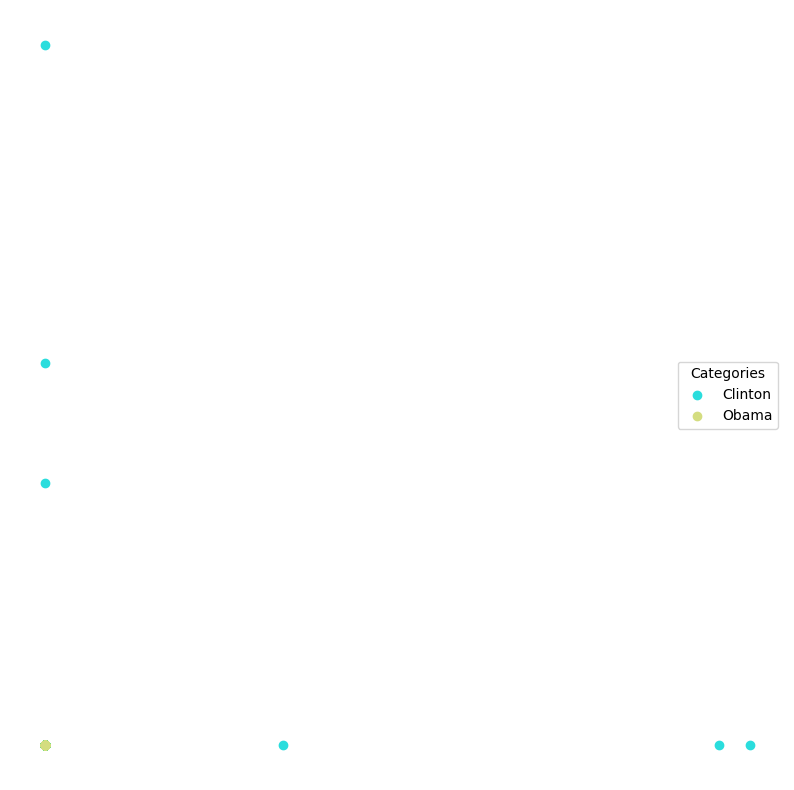

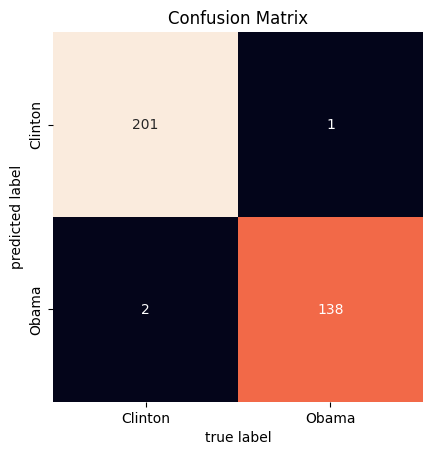

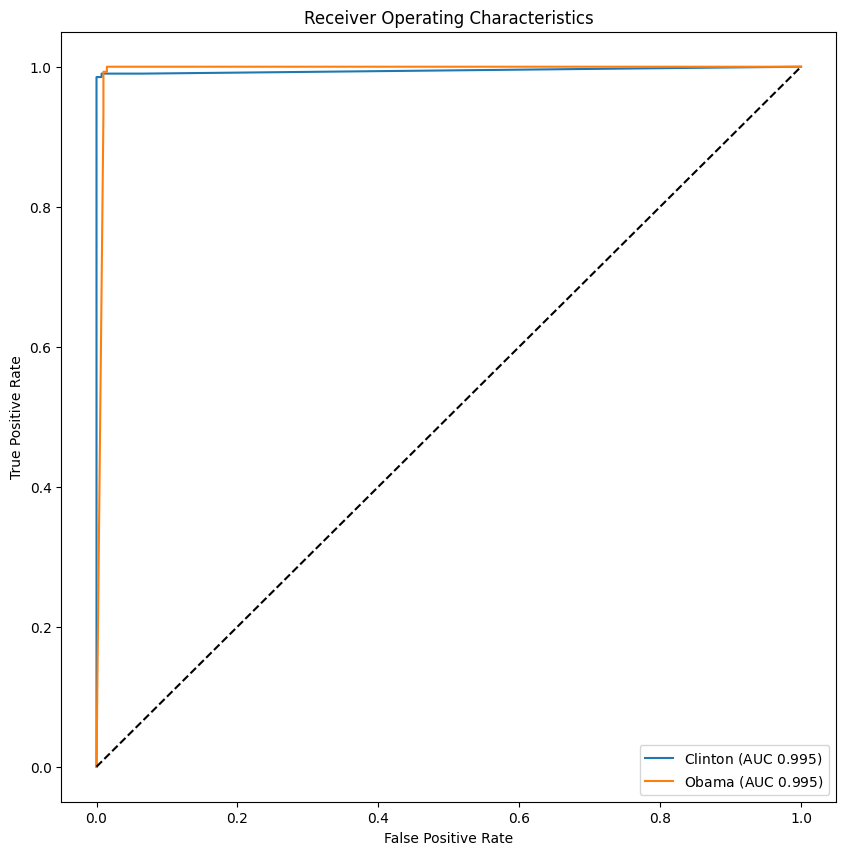

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


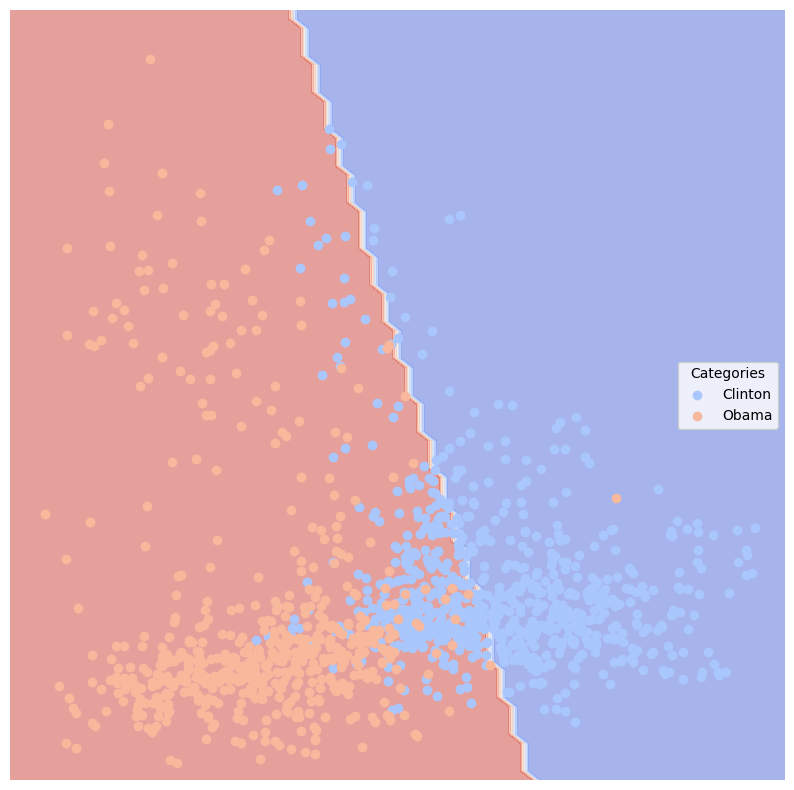

In [ ]:
import numpy as np
import sklearn.linear_model
import sklearn.naive_bayes
import sklearn.svm
import sklearn.neighbors
import sklearn.tree
import sklearn.ensemble
import sklearn.neural_network
from sklearn.naive_bayes import GaussianNB

# Define a list of classifiers
classifiers = [
    ("Logistic Regression", sklearn.linear_model.LogisticRegression()),
    ("Gaussian Naive Bayes", sklearn.naive_bayes.GaussianNB()),
    ("SVC Linear", sklearn.svm.SVC(kernel='linear', probability=True)),
    ("SVC Poly", sklearn.svm.SVC(kernel='poly', degree=3, probability=True)),
    ("Decision Tree", sklearn.tree.DecisionTreeClassifier()),
    ("Random Forest", sklearn.ensemble.RandomForestClassifier()),
    ("MLP Classifier", sklearn.neural_network.MLPClassifier()),
    ("Gradient Boosting", sklearn.ensemble.GradientBoostingClassifier())
]

# Loop through each classifier
for name, clf in classifiers:
    print(f"Training and evaluating {name}")
    # Training classifier
    clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])

    # Evaluation classifier
    lucem_illud.evaluateClassifier(clf, dfTest)

    # Plot
    lucem_illud.plotter(dfTrain)

    # Plot confusion matrix
    lucem_illud.plotConfusionMatrix(clf, dfTest)

    # Plot ROC curve
    lucem_illud.plotMultiROC(clf, dfTest)

    # Plot the decision region
    lucem_illud.plotregions(clf, dfTrain)

# For `SenateSmall` data, every model performed vey well, except `Gaussian Naive Bayes` model, because it did not capture the linear pattern it use a curve and misclassified part of data, while `Random Forest` performs best, which only `4` misclasified from confusion matrix, because it capture the distribution pattern

In [ ]:
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadNewsGroups(), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadSenateSmall(), test_size=.2)
dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadSenateLarge(dataDirectory='/content/drive/MyDrive/Content_Analysis/Homework-Notebooks/data/'), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadSpam(), test_size=.2)

Loading senator: Kennedy
Loading senator: Kerry
Loading senator: Klobuchar
Loading senator: Kohl
Loading senator: Kyl
Converting to vectors


/usr/local/lib/python3.10/dist-packages/spacy/pipeline/lemmatizer.py:211: UserWarning: [W108] The rule-based lemmatizer did not find POS annotation for one or more tokens. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
  warnings.warn(Warnings.W108)


Training and evaluating Logistic Regression


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


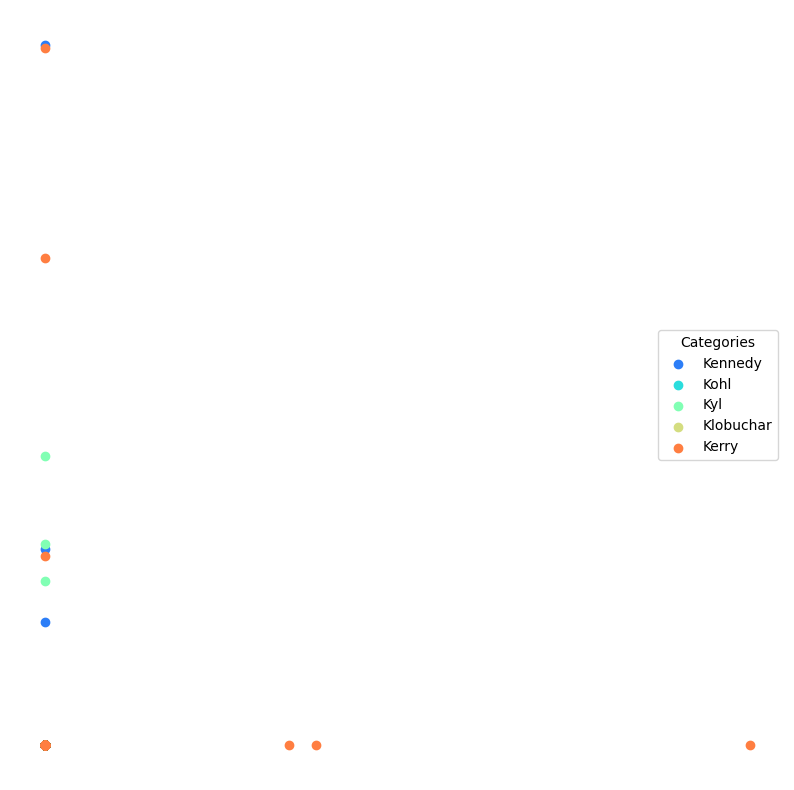

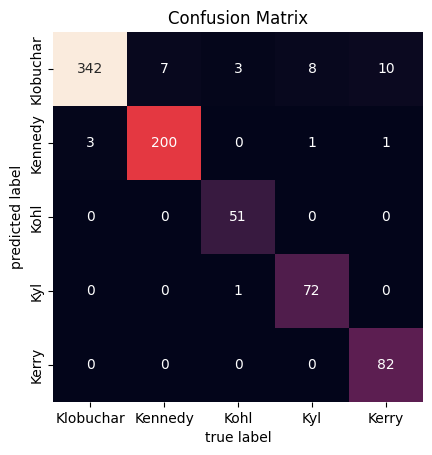

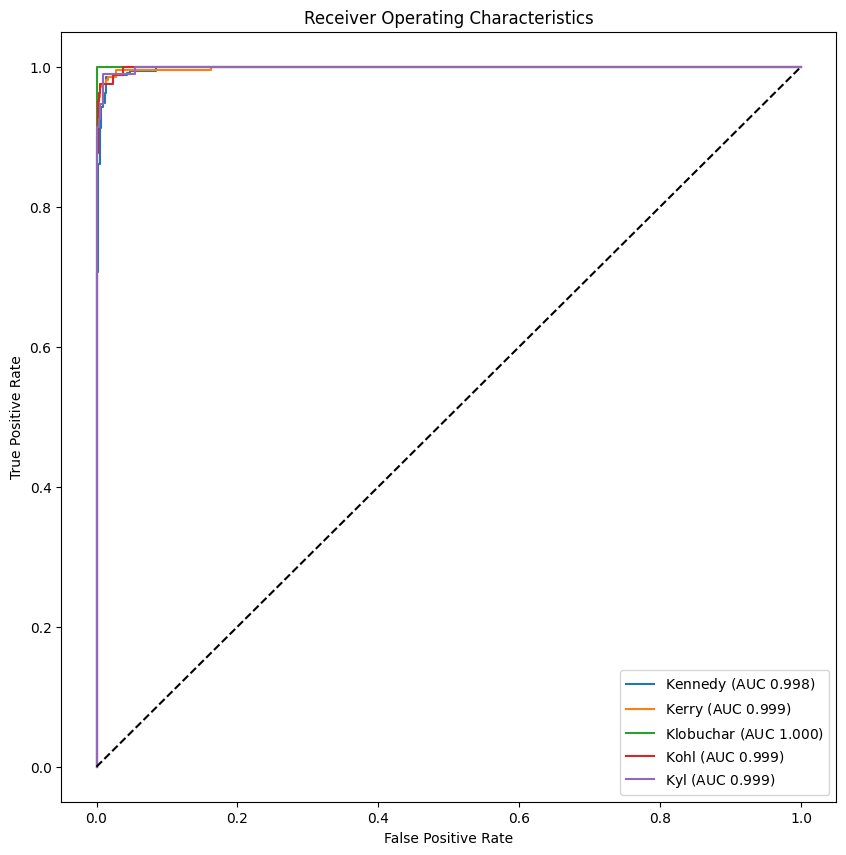

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


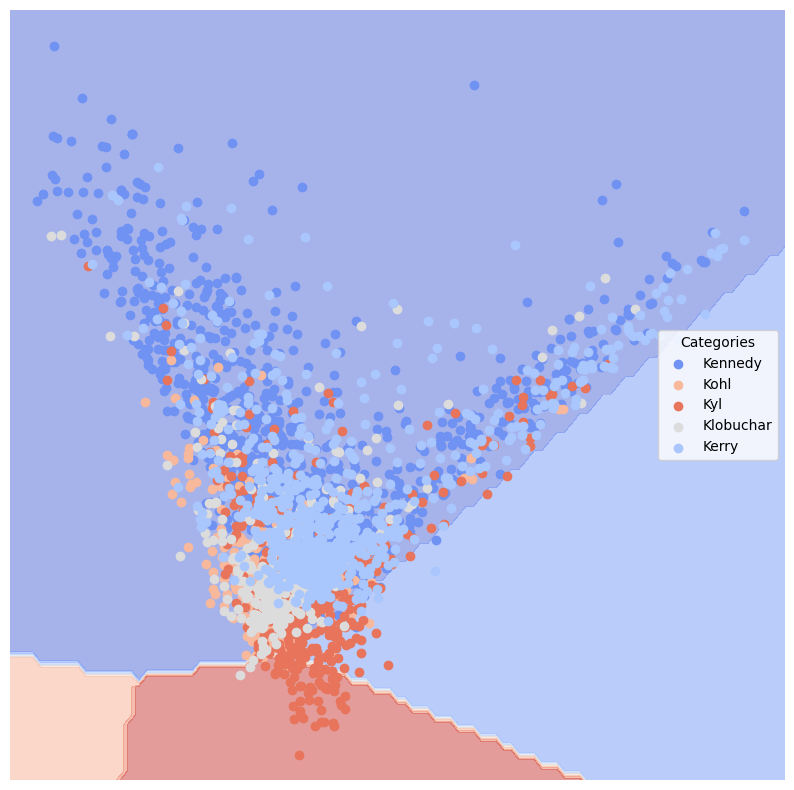

Training and evaluating Gaussian Naive Bayes


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


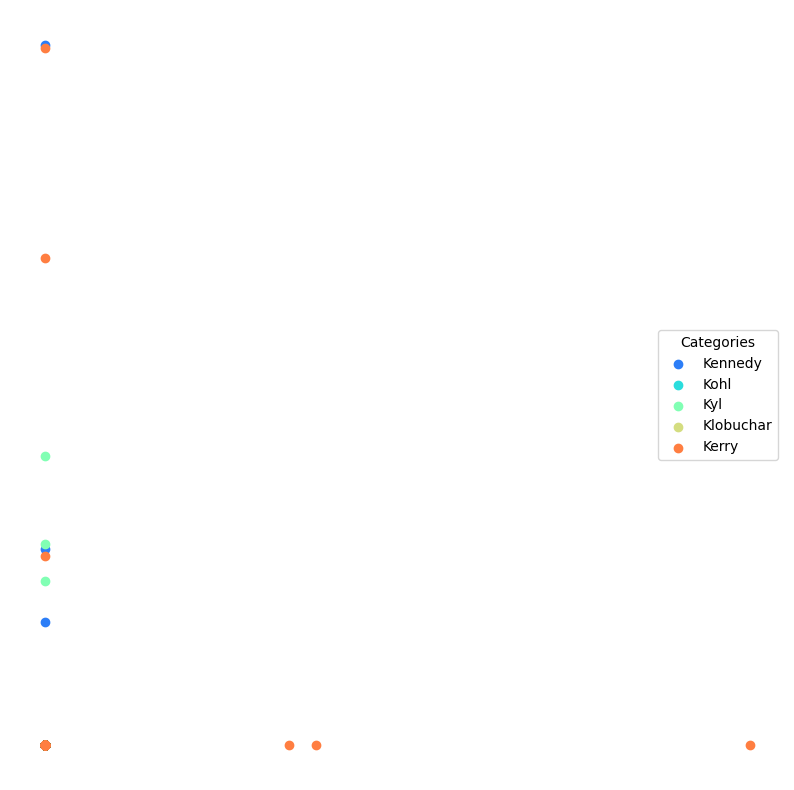

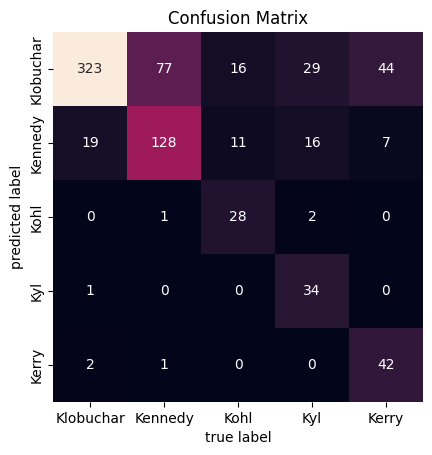

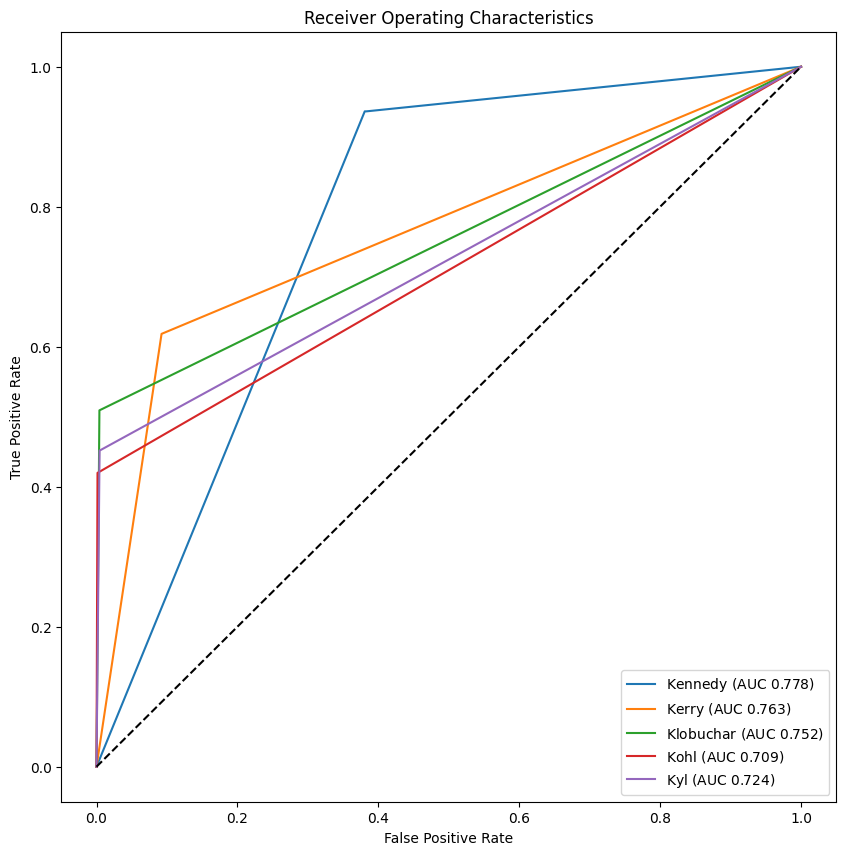

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


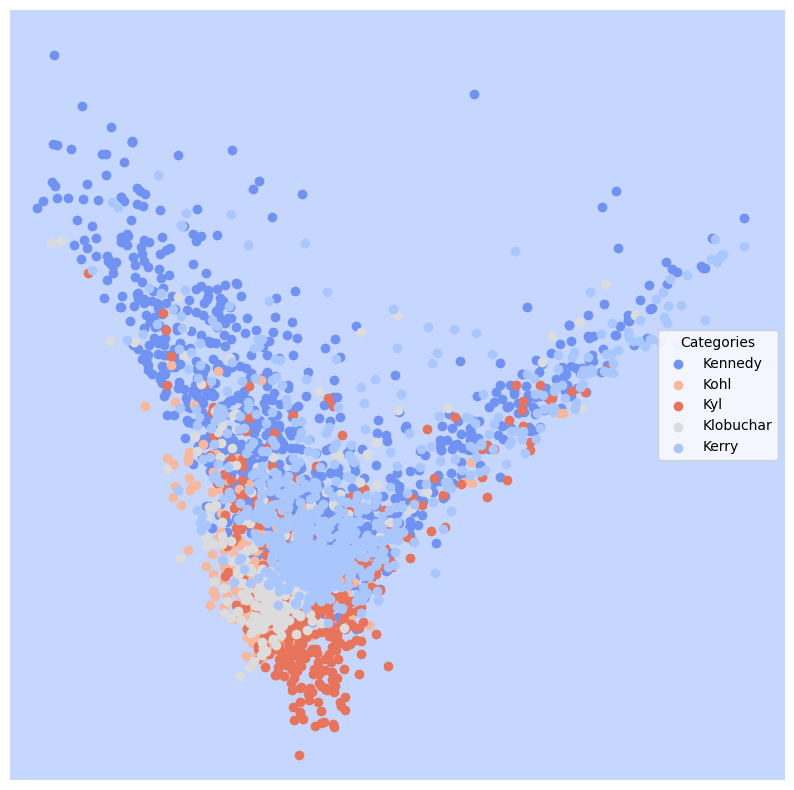

Training and evaluating Decision Tree


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


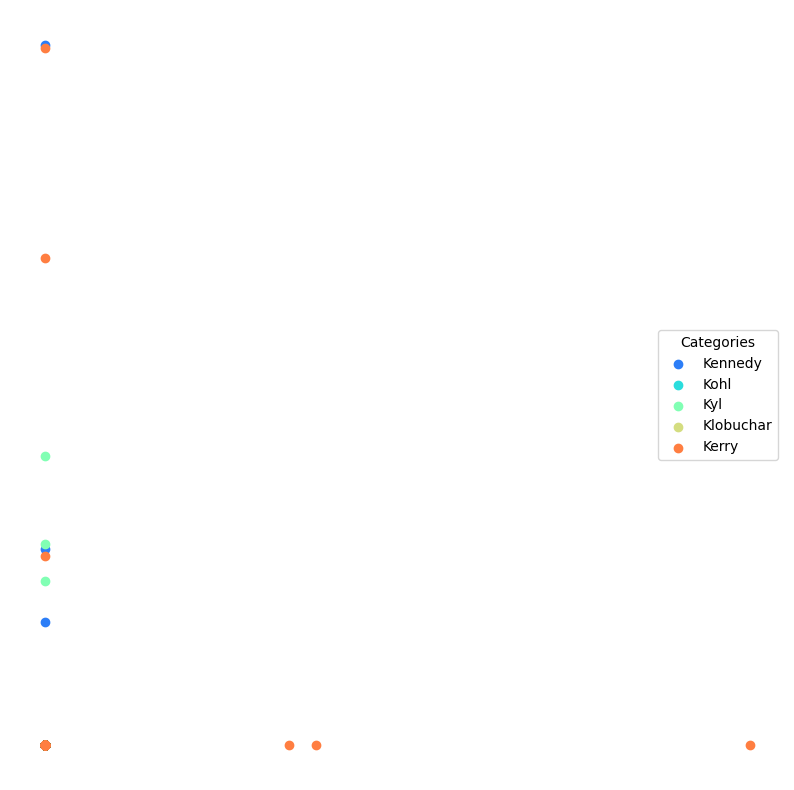

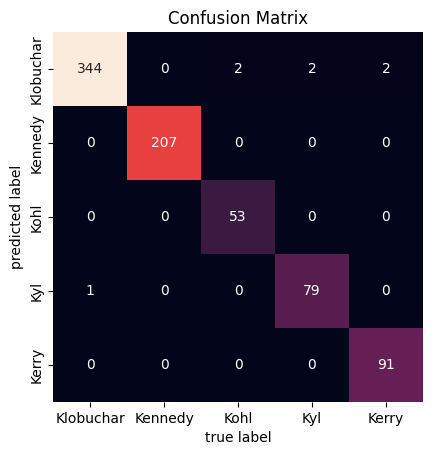

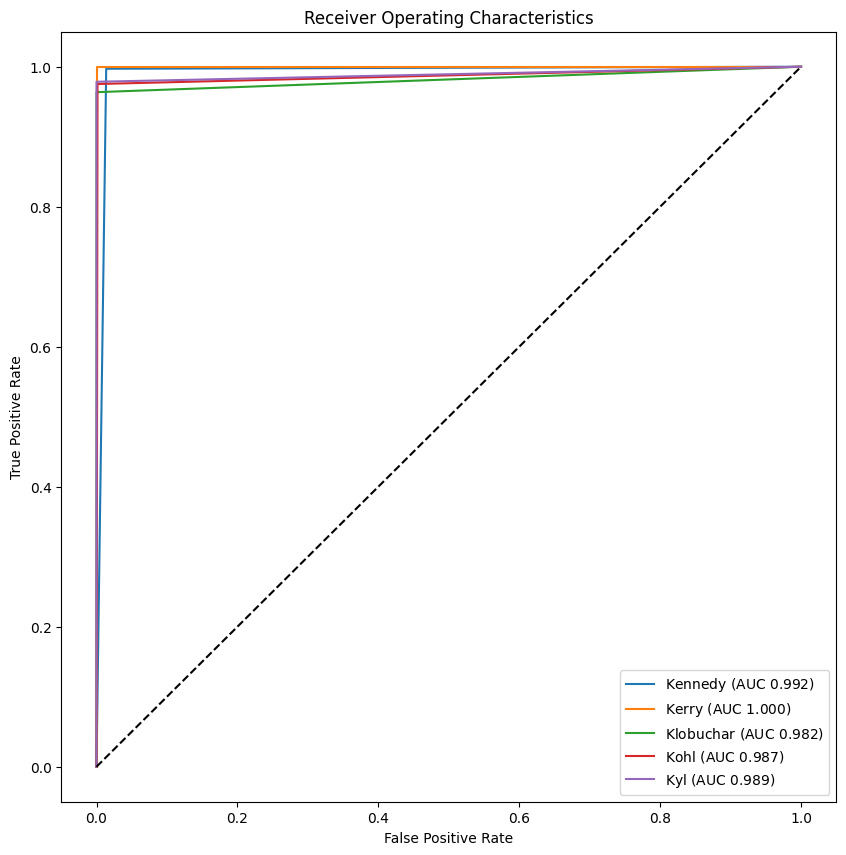

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


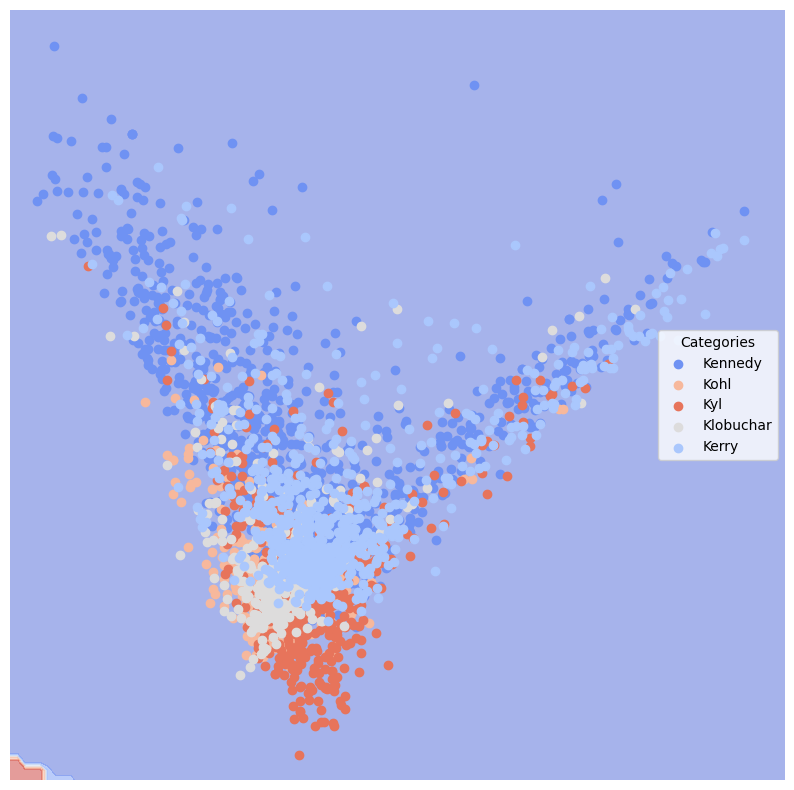

Training and evaluating Random Forest


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


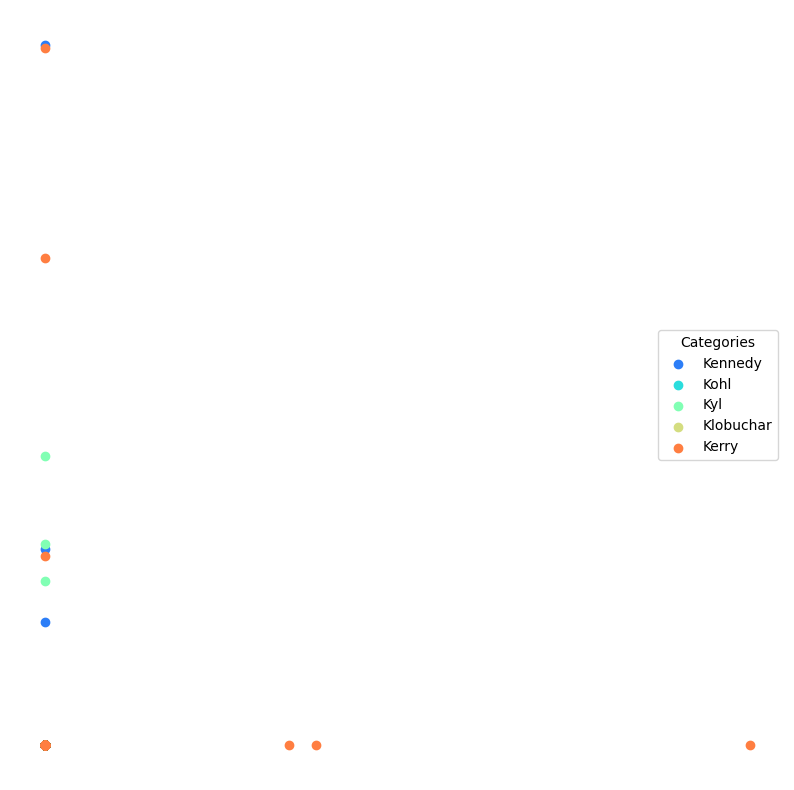

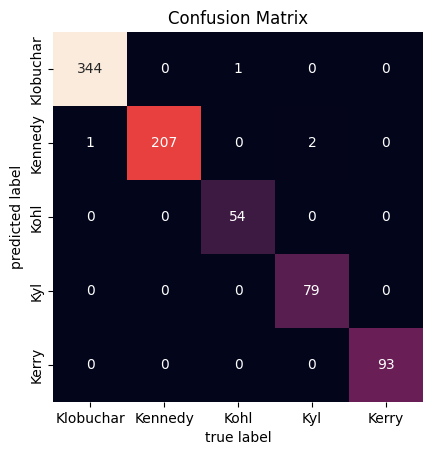

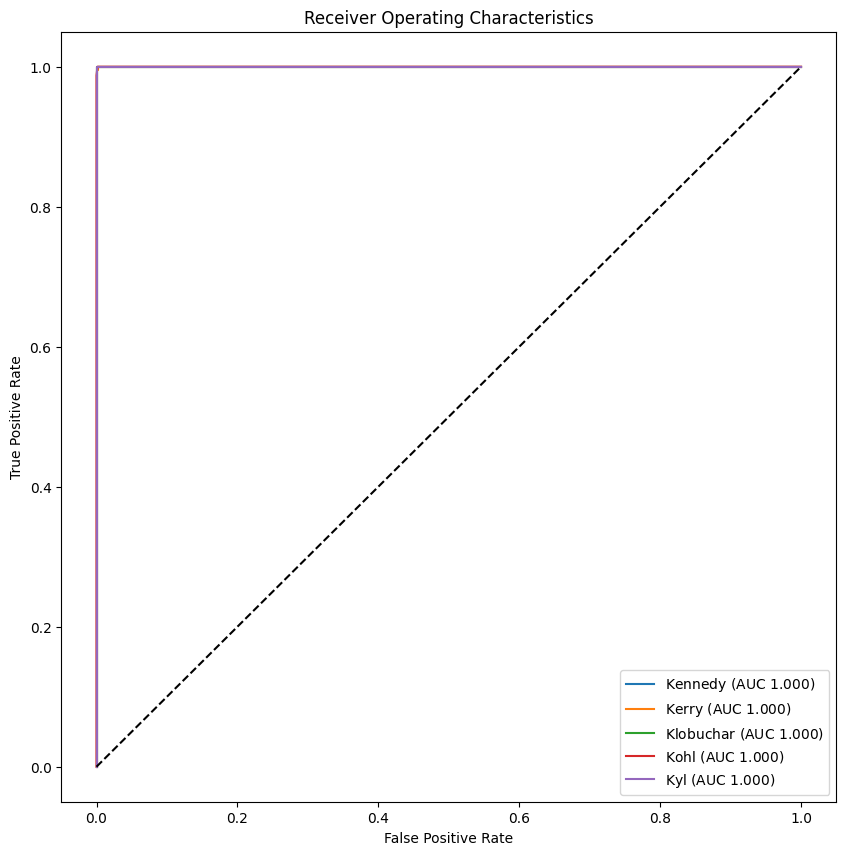

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


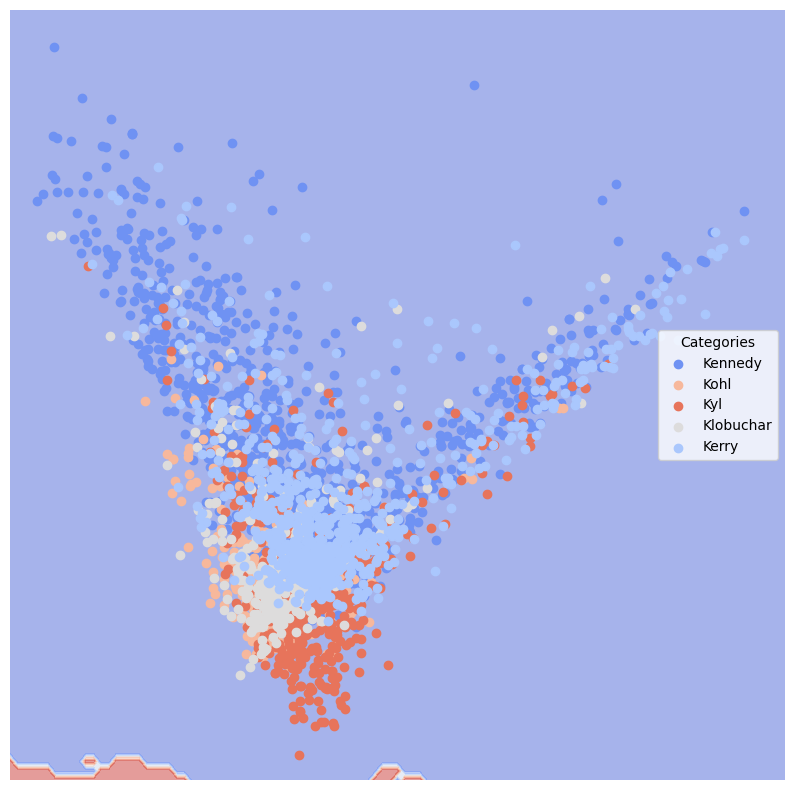

Training and evaluating MLP Classifier


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


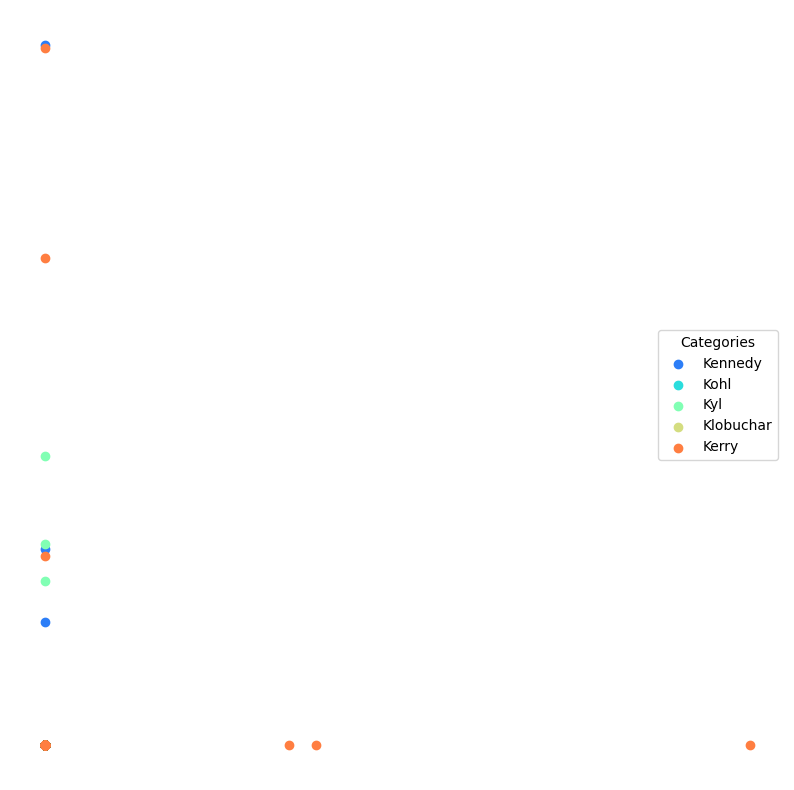

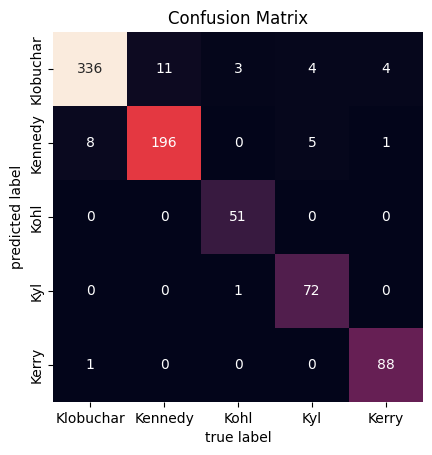

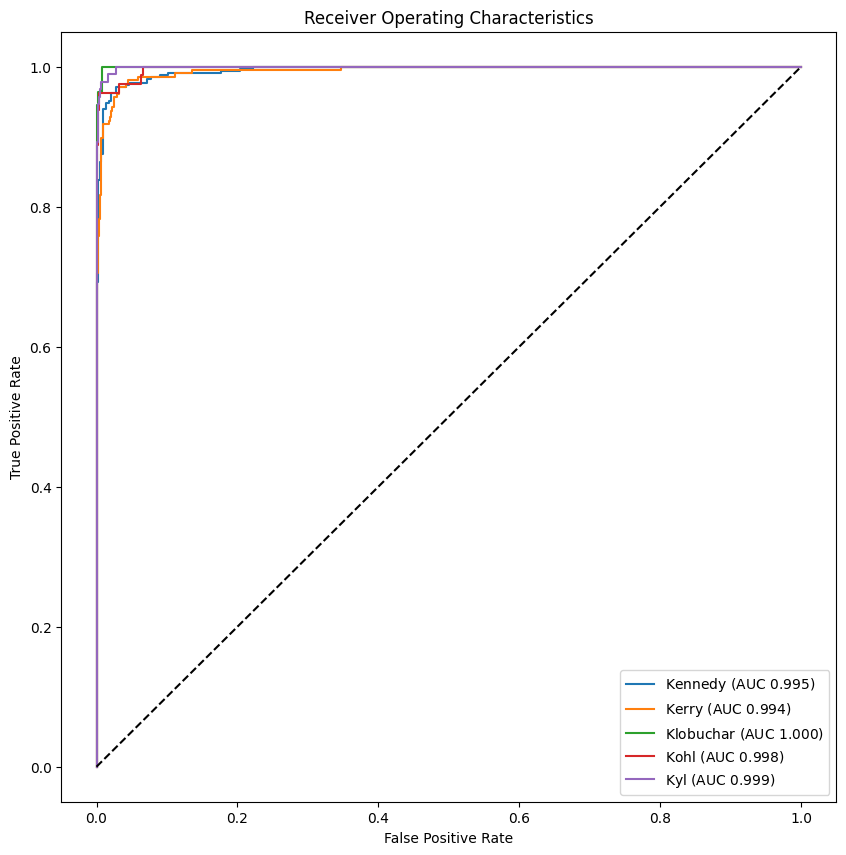

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


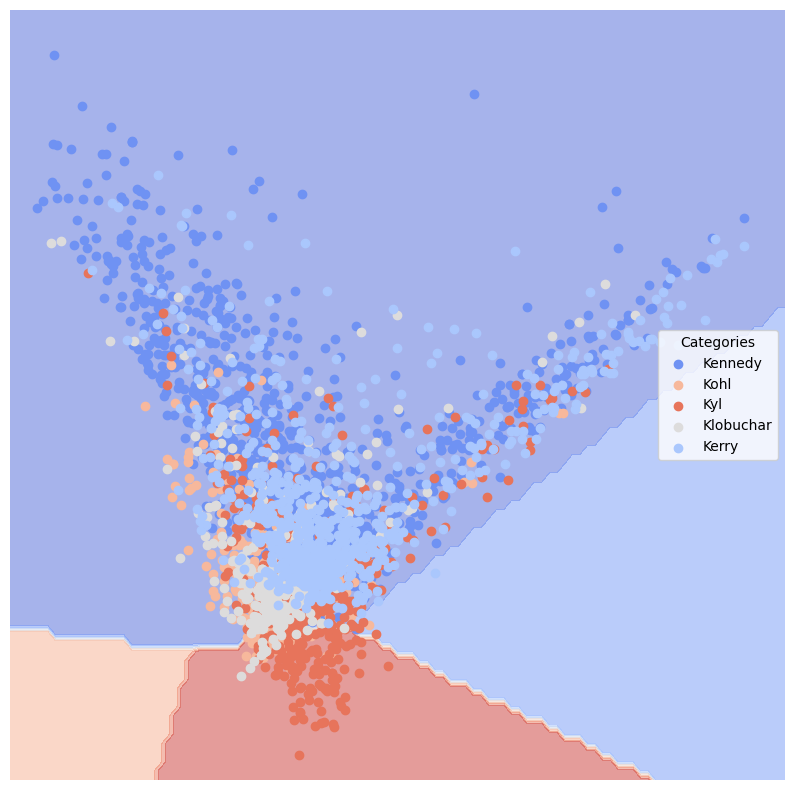

Training and evaluating Gradient Boosting


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


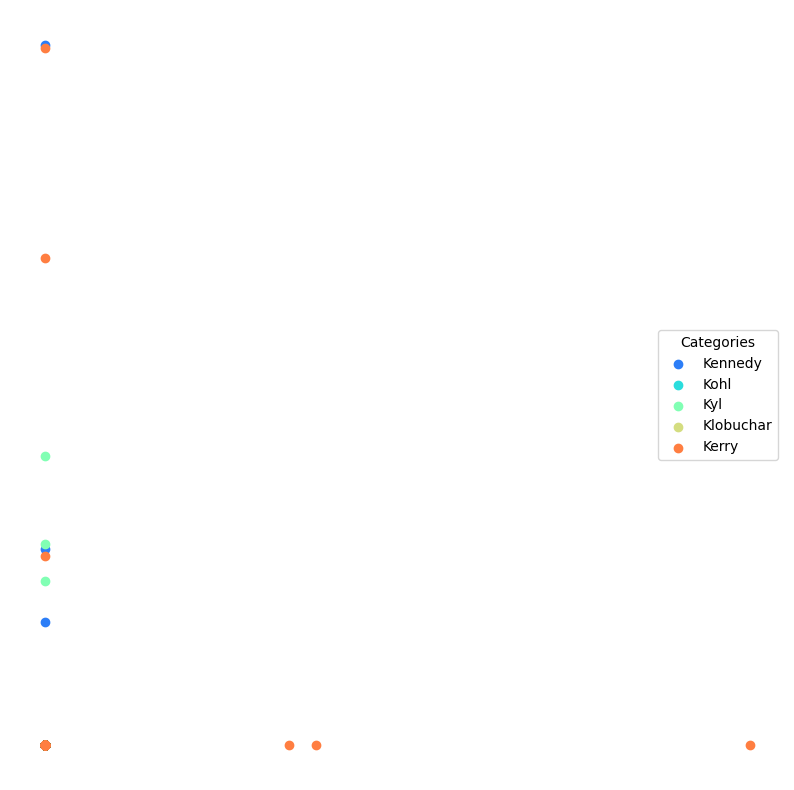

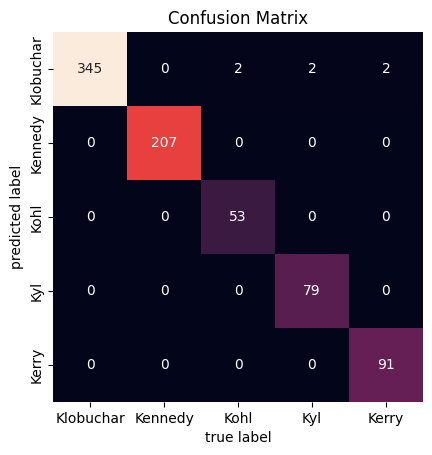

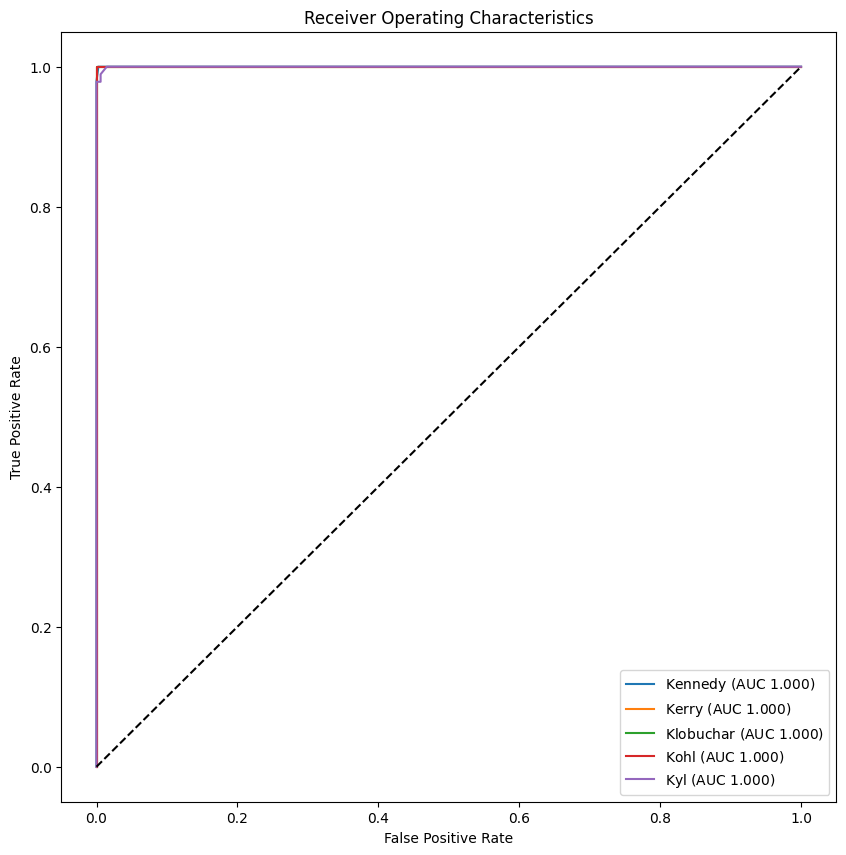

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


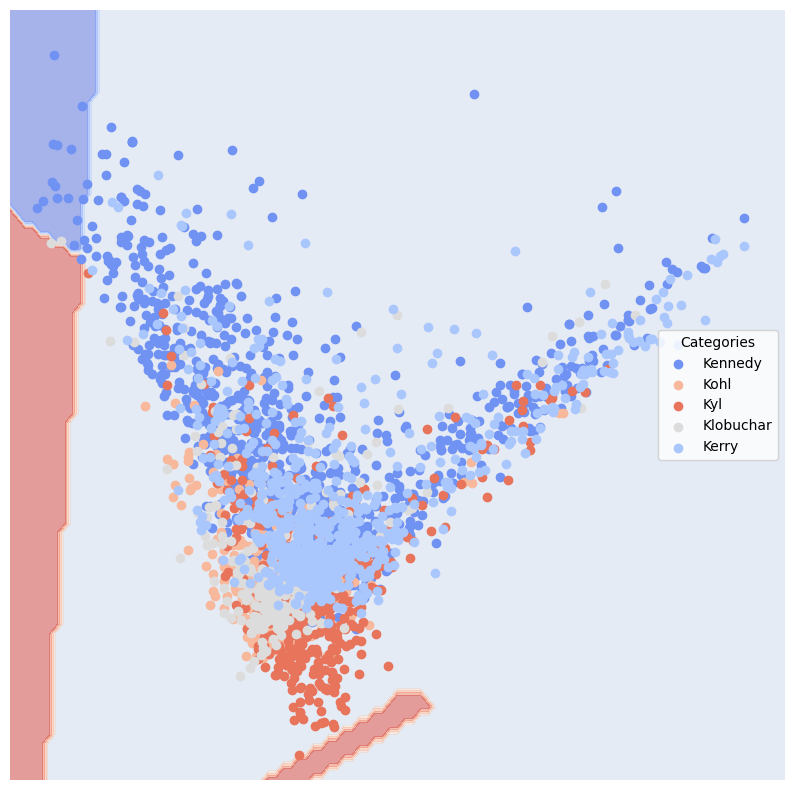

In [ ]:
import numpy as np
import sklearn.linear_model
import sklearn.naive_bayes
import sklearn.svm
import sklearn.neighbors
import sklearn.tree
import sklearn.ensemble
import sklearn.neural_network
from sklearn.naive_bayes import GaussianNB

# Define a list of classifiers
classifiers = [
    ("Logistic Regression", sklearn.linear_model.LogisticRegression()),
    ("Gaussian Naive Bayes", sklearn.naive_bayes.GaussianNB()),
    ("Decision Tree", sklearn.tree.DecisionTreeClassifier()),
    ("Random Forest", sklearn.ensemble.RandomForestClassifier()),
    ("MLP Classifier", sklearn.neural_network.MLPClassifier()),
    ("Gradient Boosting", sklearn.ensemble.GradientBoostingClassifier())
]

# Loop through each classifier
for name, clf in classifiers:
    print(f"Training and evaluating {name}")
    # Training classifier
    clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])

    # Evaluation classifier
    lucem_illud.evaluateClassifier(clf, dfTest)

    # Plot
    lucem_illud.plotter(dfTrain)

    # Plot confusion matrix
    lucem_illud.plotConfusionMatrix(clf, dfTest)

    # Plot ROC curve
    lucem_illud.plotMultiROC(clf, dfTest)

    # Plot the decision region
    lucem_illud.plotregions(clf, dfTrain)

# For `SenateLarge` data, every model performed vey well, except `Gaussian Naive Bayes` model, because it did not capture the pattern and misclassified about 100 data fromthe confusion metrix, while `Random Forest` performs best, which only `4` misclasified from confusion matrix, because it capture the distribution pattern

In [ ]:
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadNewsGroups(), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadSenateSmall(), test_size=.2)
#dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadSenateLarge(), test_size=.2)
dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadSpam(dataDirectory='/content/drive/MyDrive/Content_Analysis/Homework-Notebooks/data/'), test_size=.2)

Loading Spam
Loading Ham
Converting to vectors


/usr/local/lib/python3.10/dist-packages/spacy/pipeline/lemmatizer.py:211: UserWarning: [W108] The rule-based lemmatizer did not find POS annotation for one or more tokens. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
  warnings.warn(Warnings.W108)


Training and evaluating Logistic Regression


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


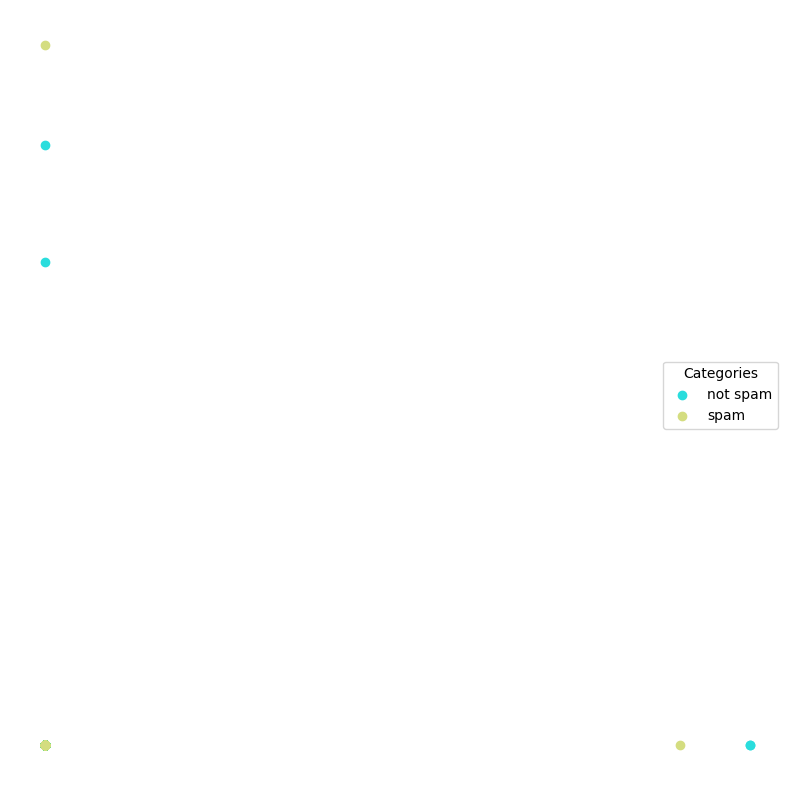

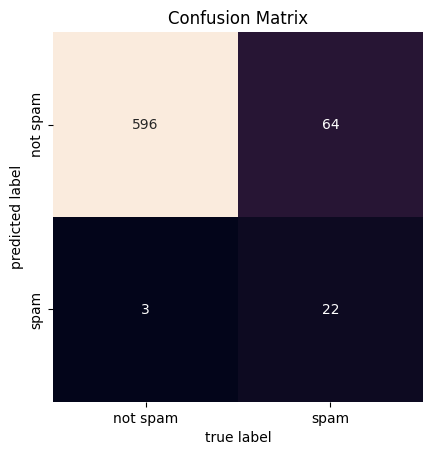

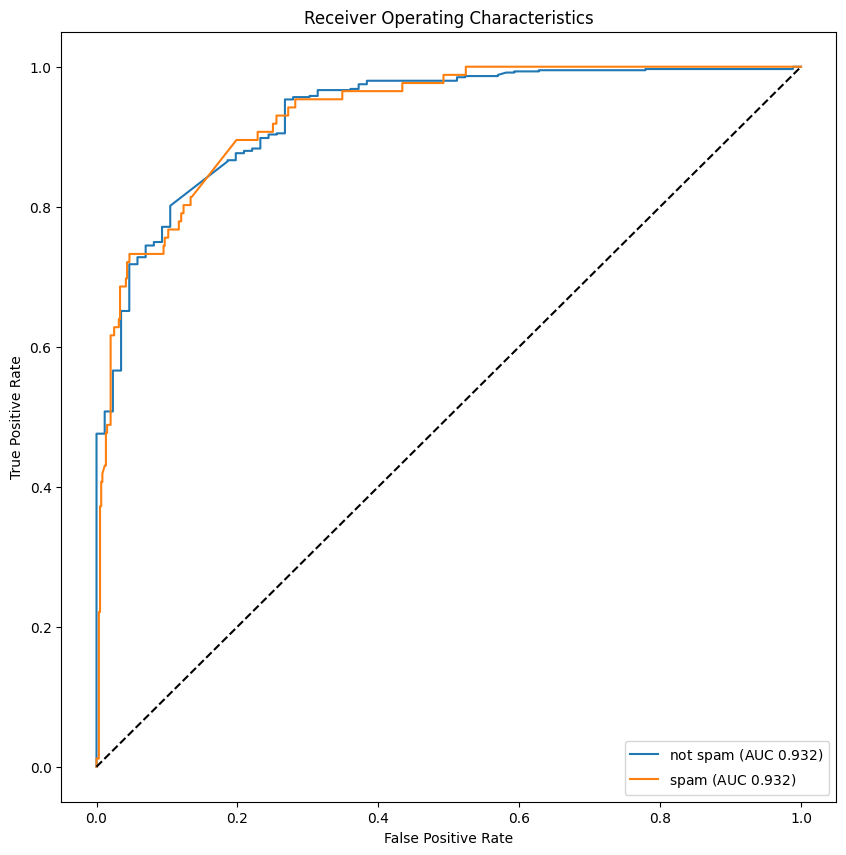

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


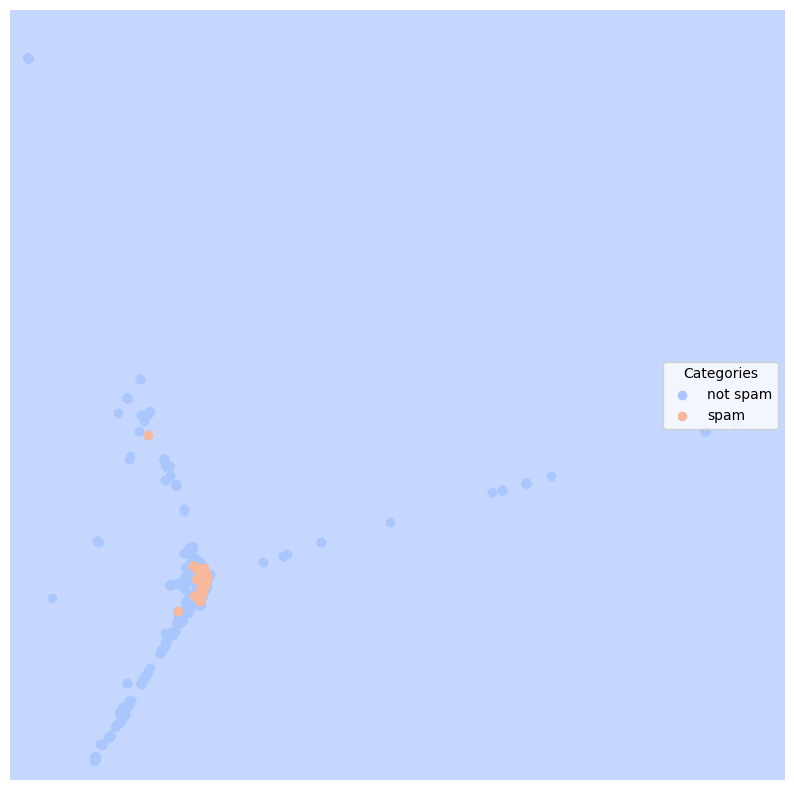

Training and evaluating Gaussian Naive Bayes


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


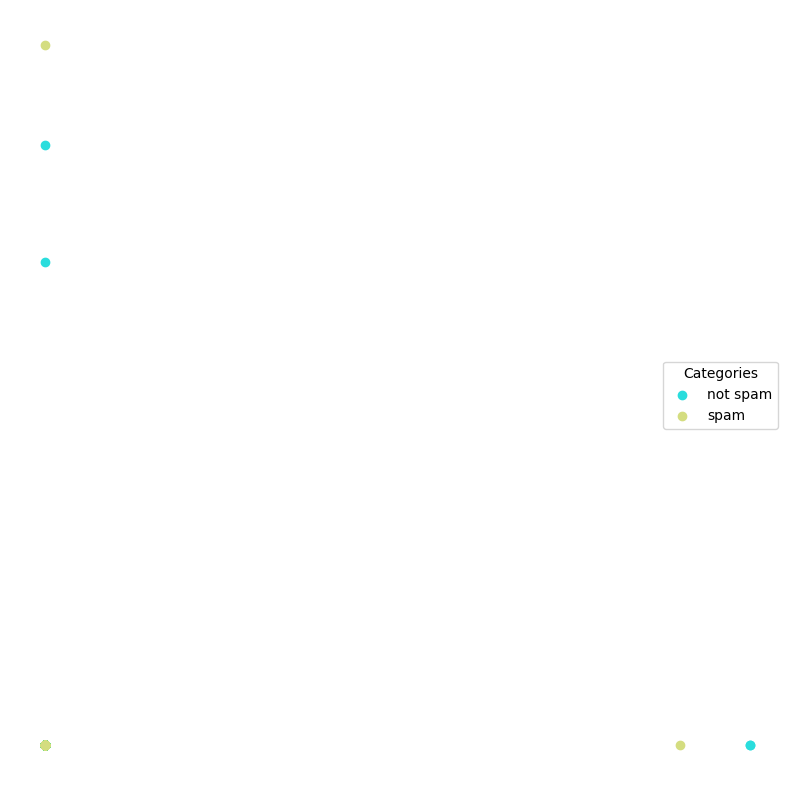

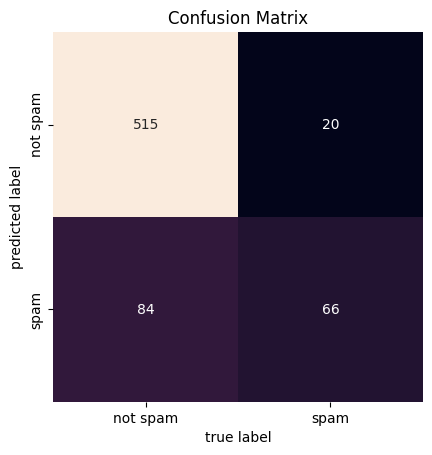

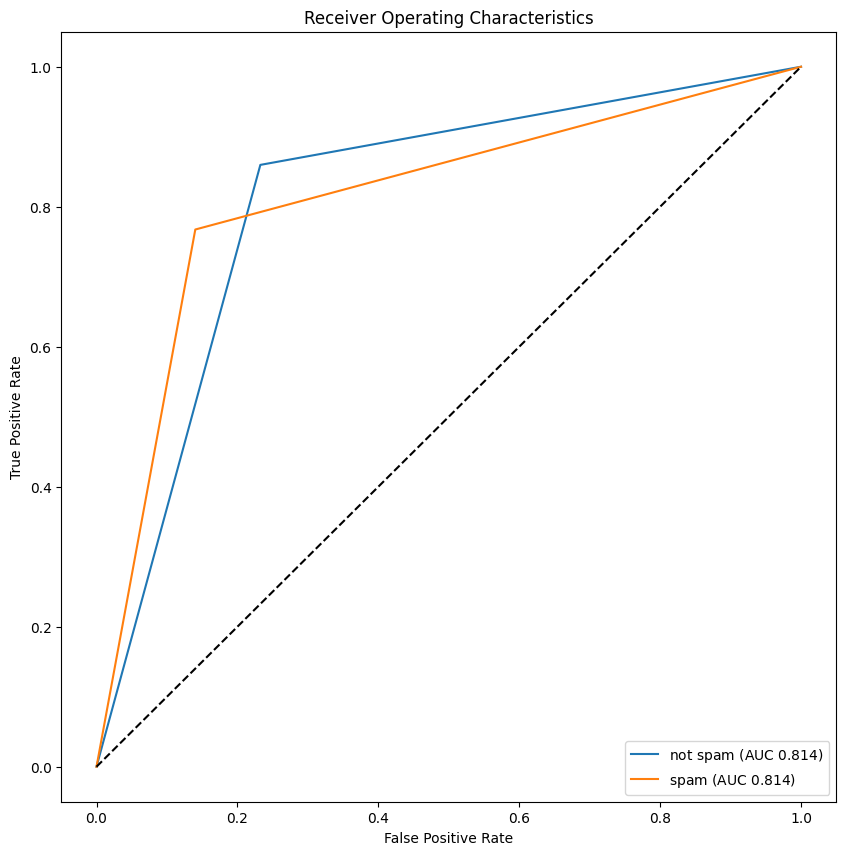

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


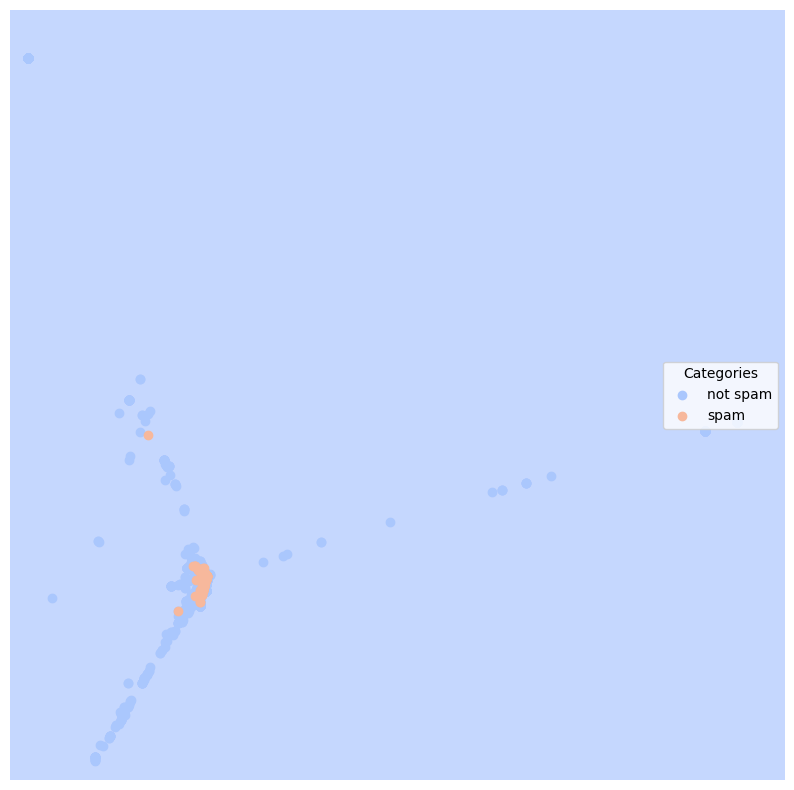

Training and evaluating SVC Linear


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


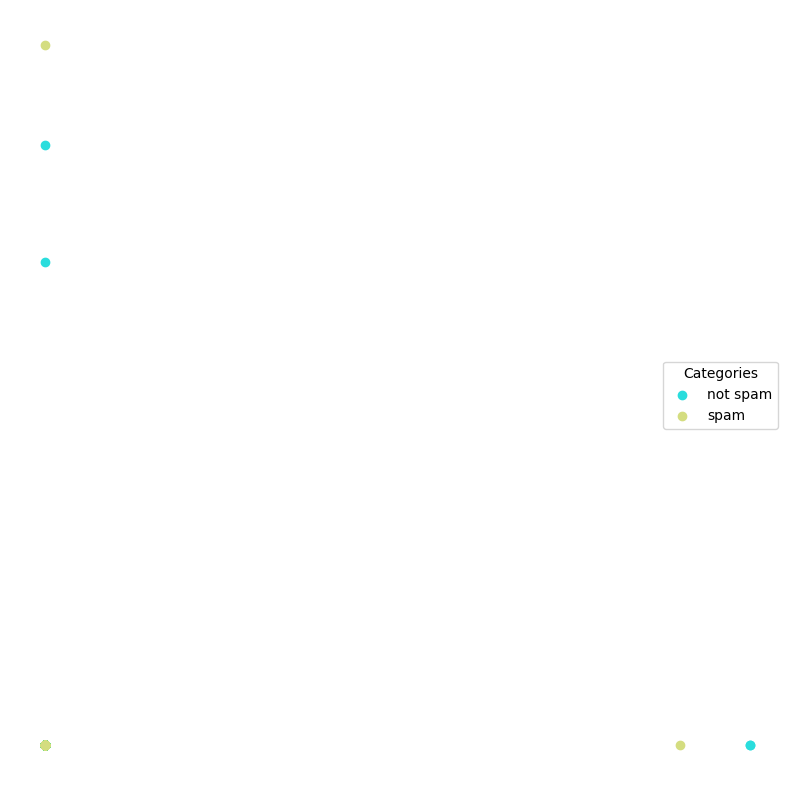

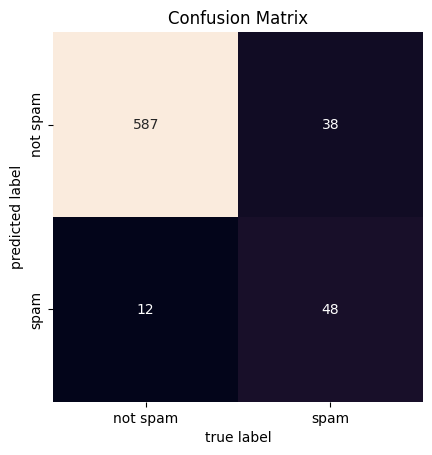

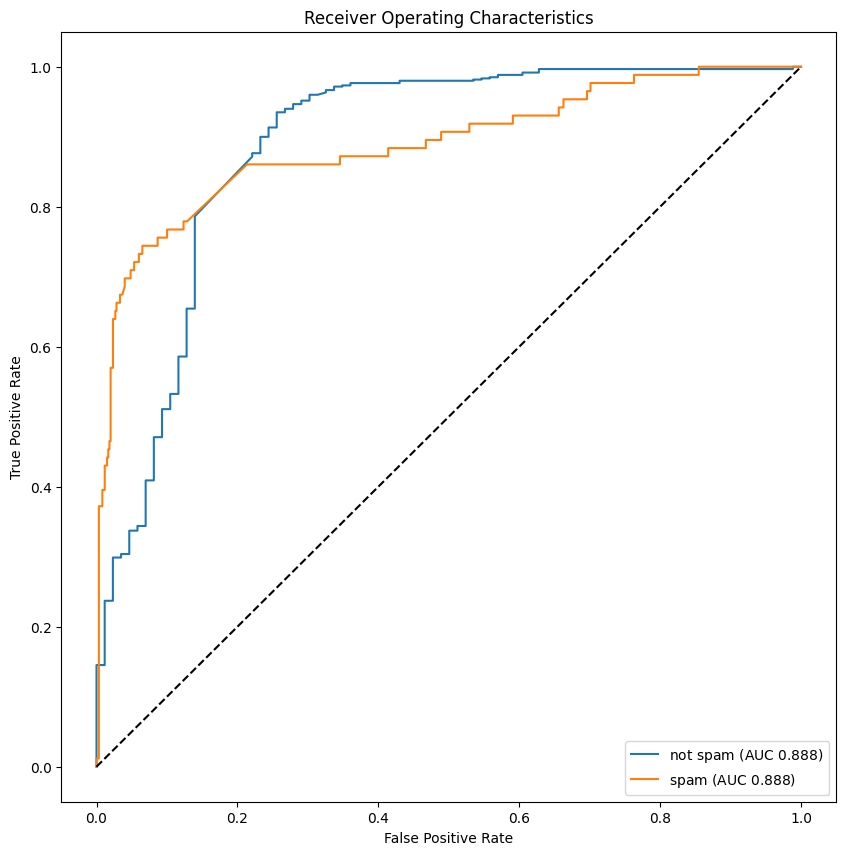

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


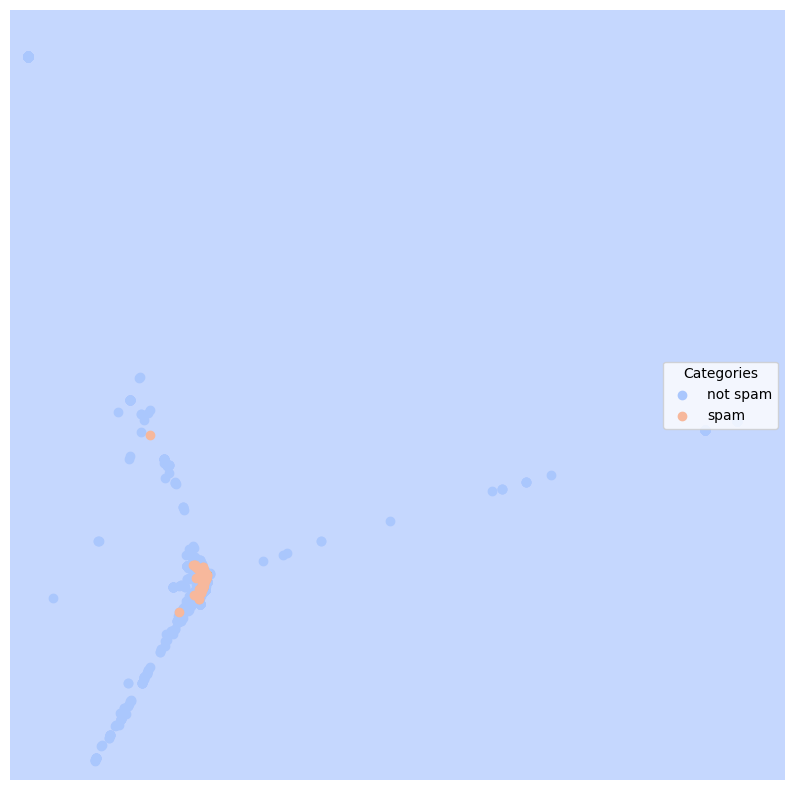

Training and evaluating SVC Poly


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


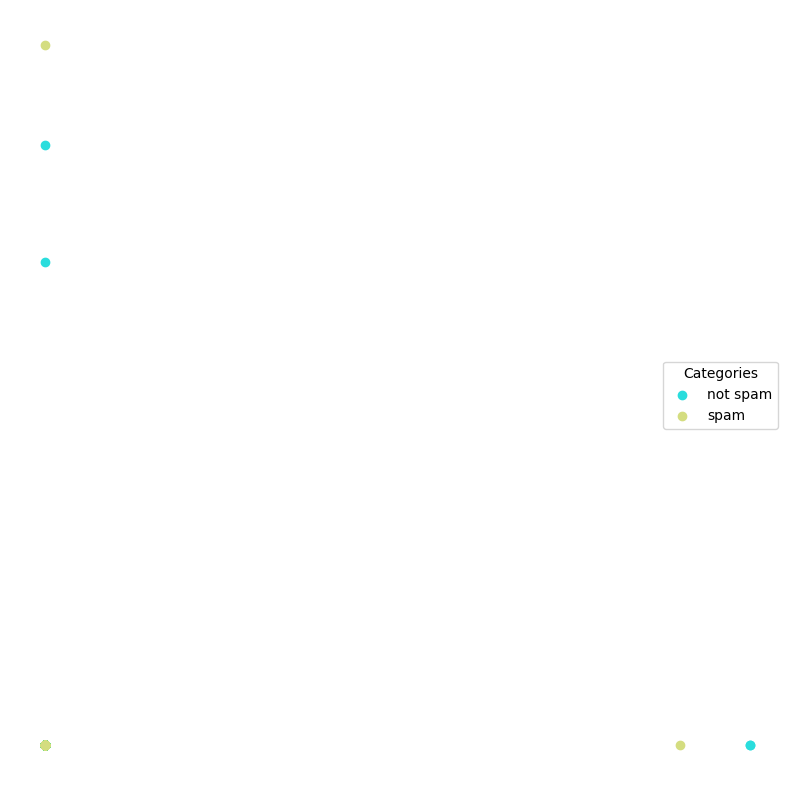

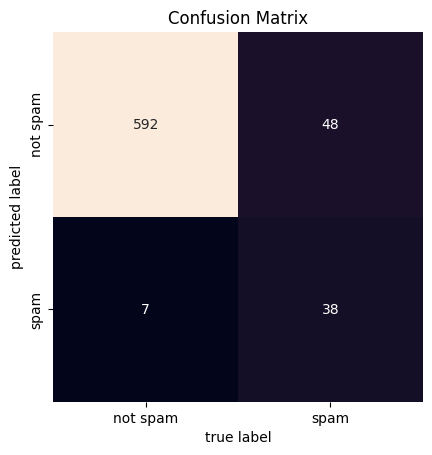

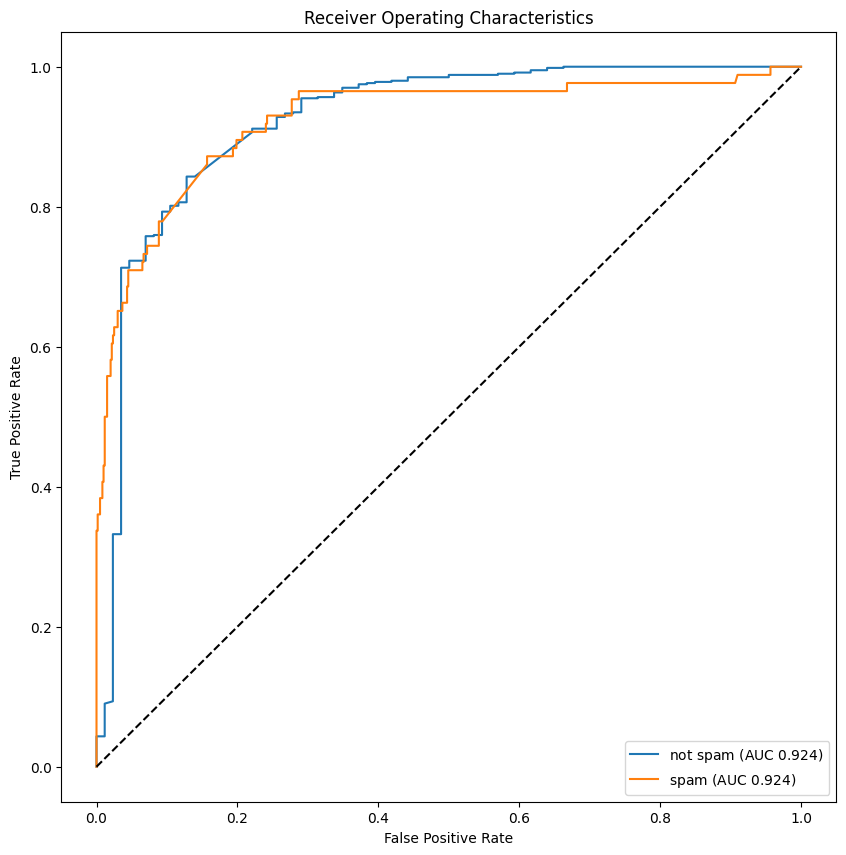

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


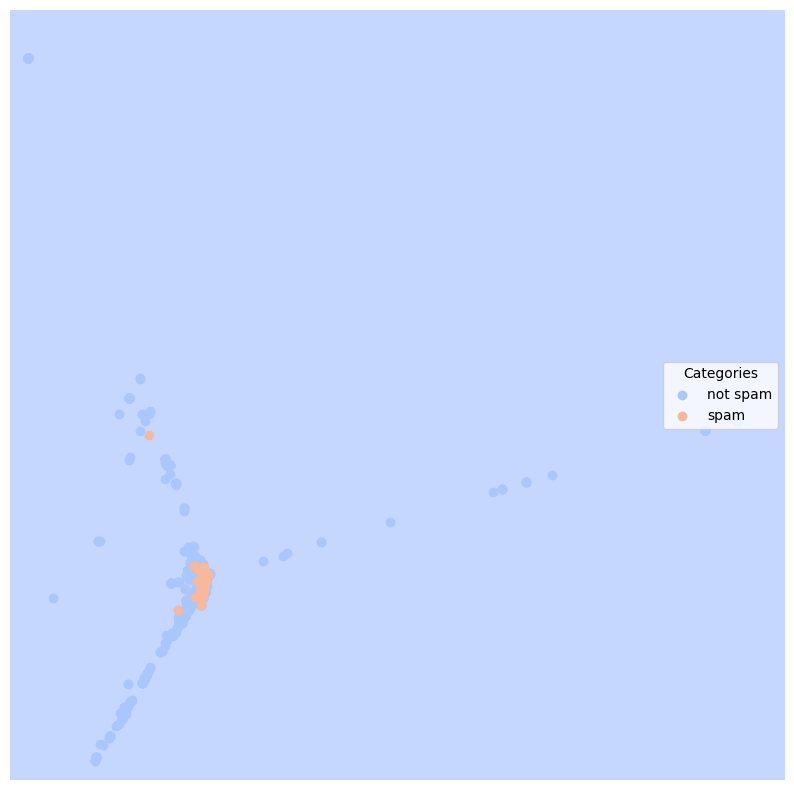

Training and evaluating Decision Tree


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


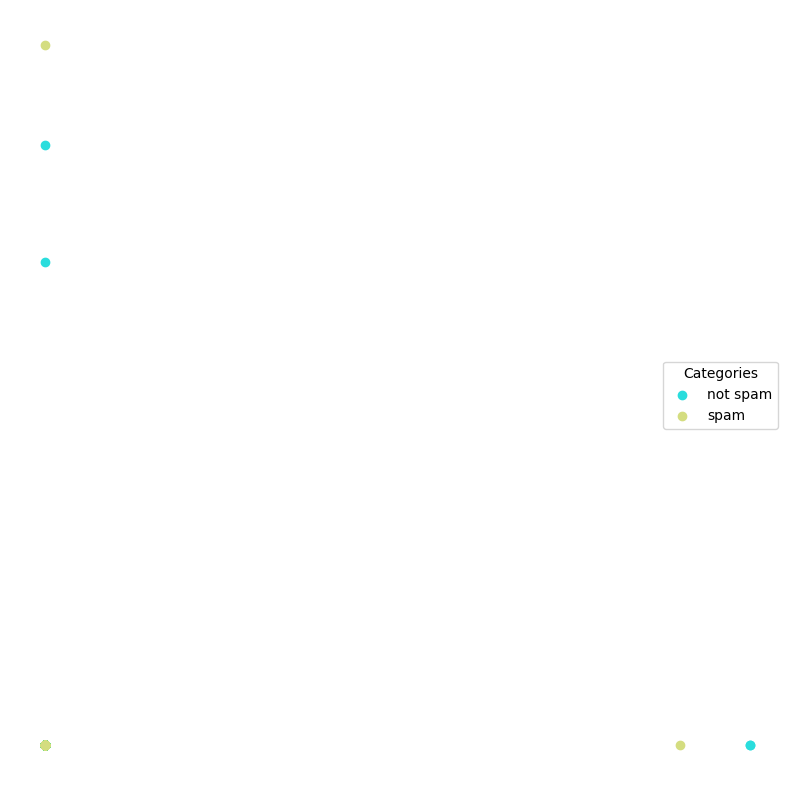

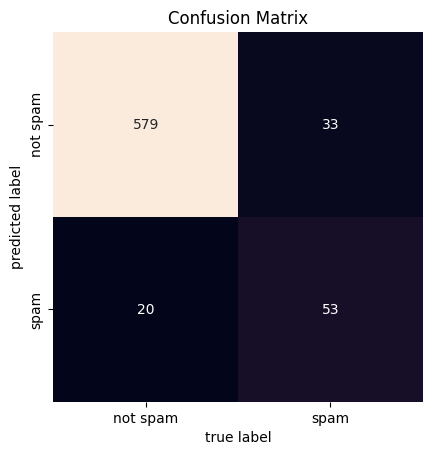

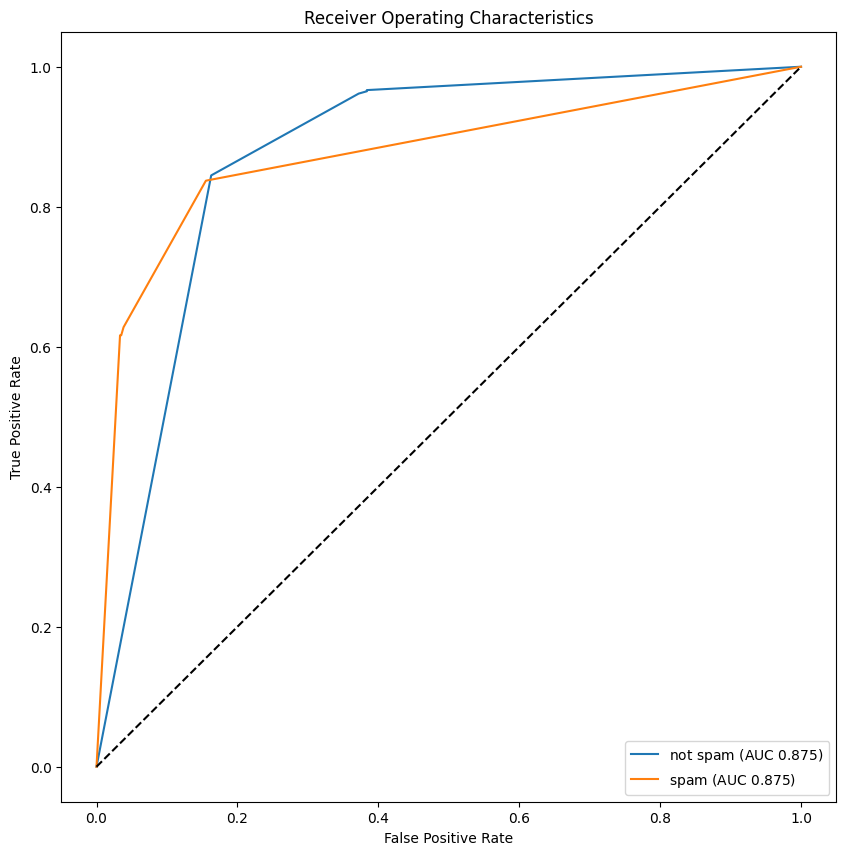

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


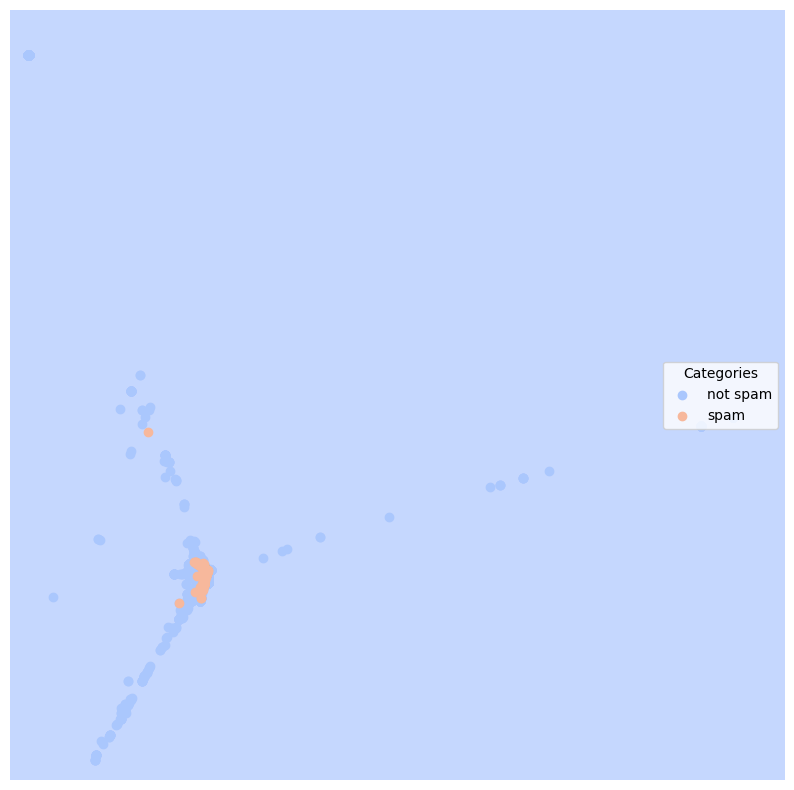

Training and evaluating Random Forest


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


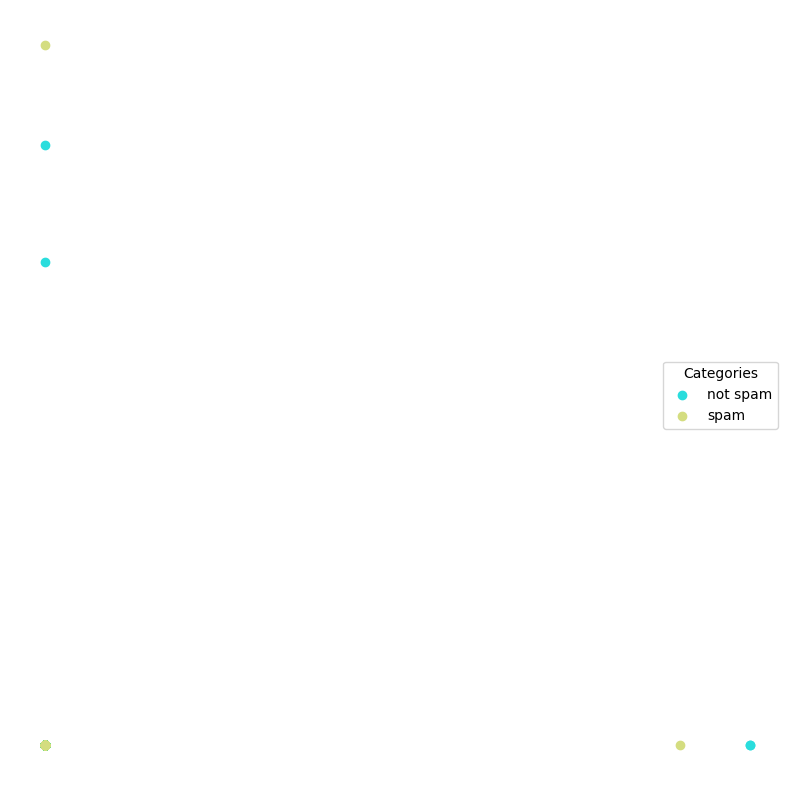

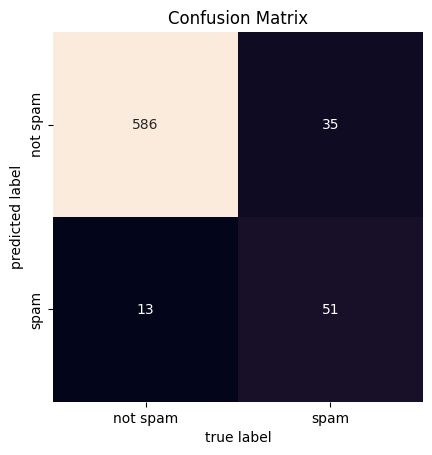

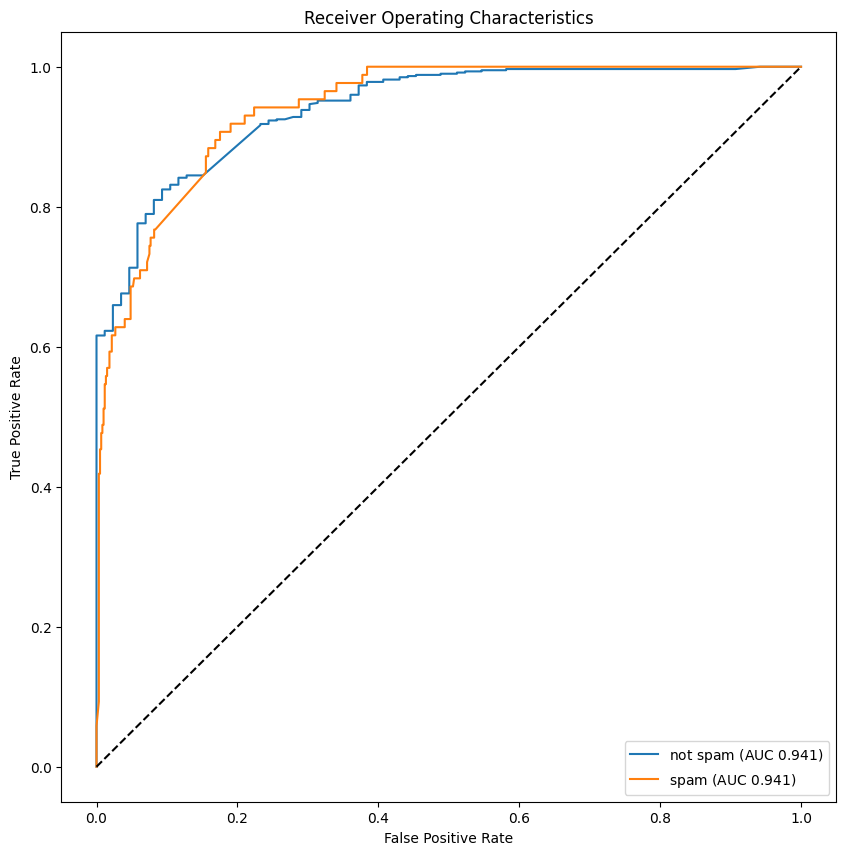

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


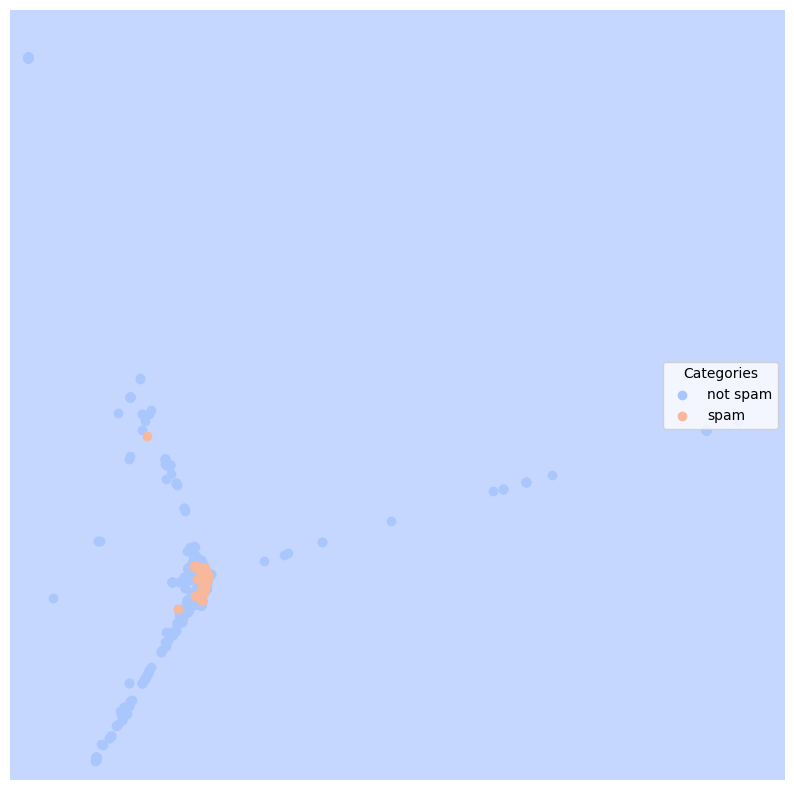

Training and evaluating MLP Classifier


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


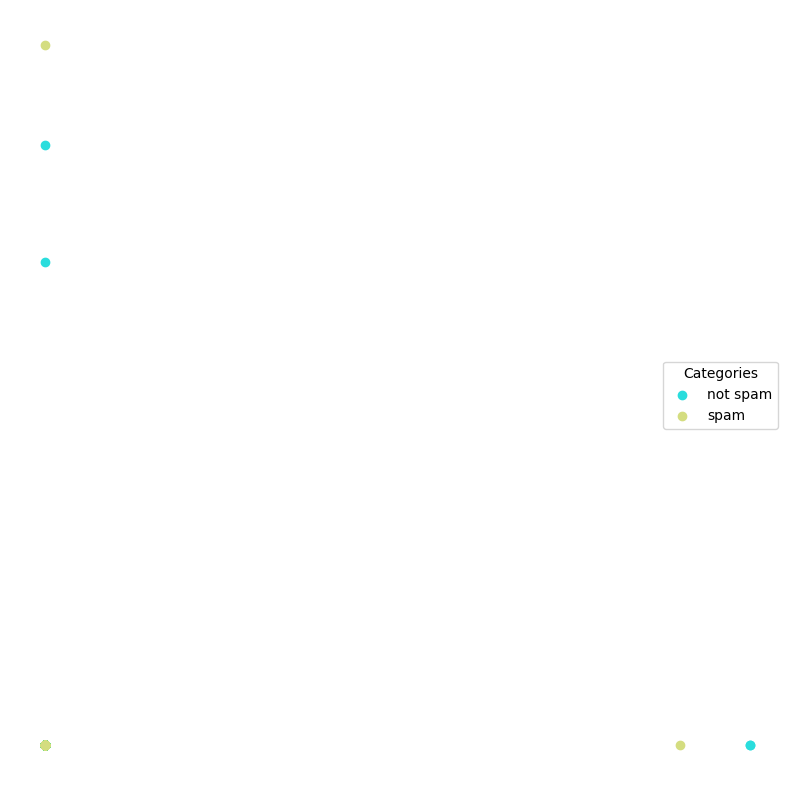

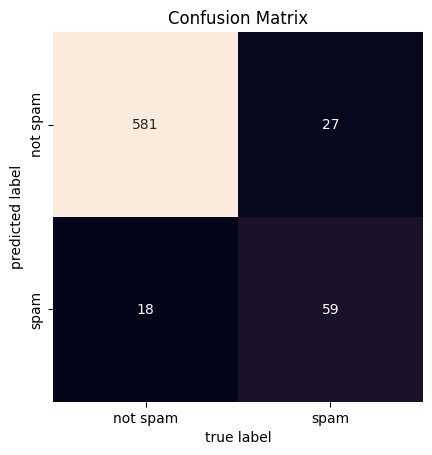

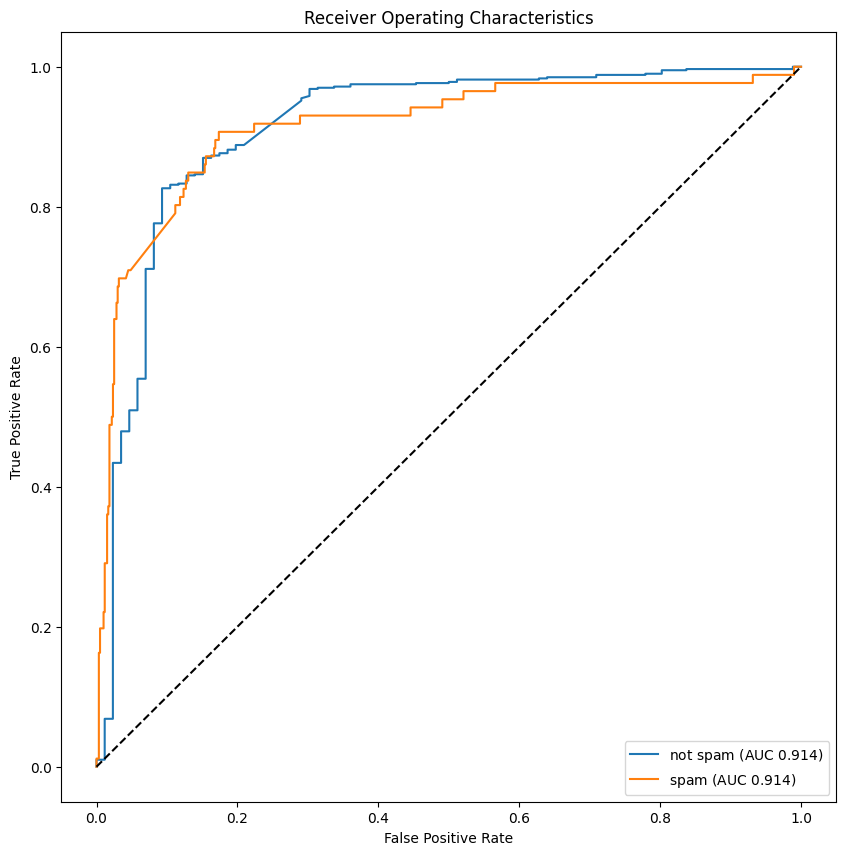

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


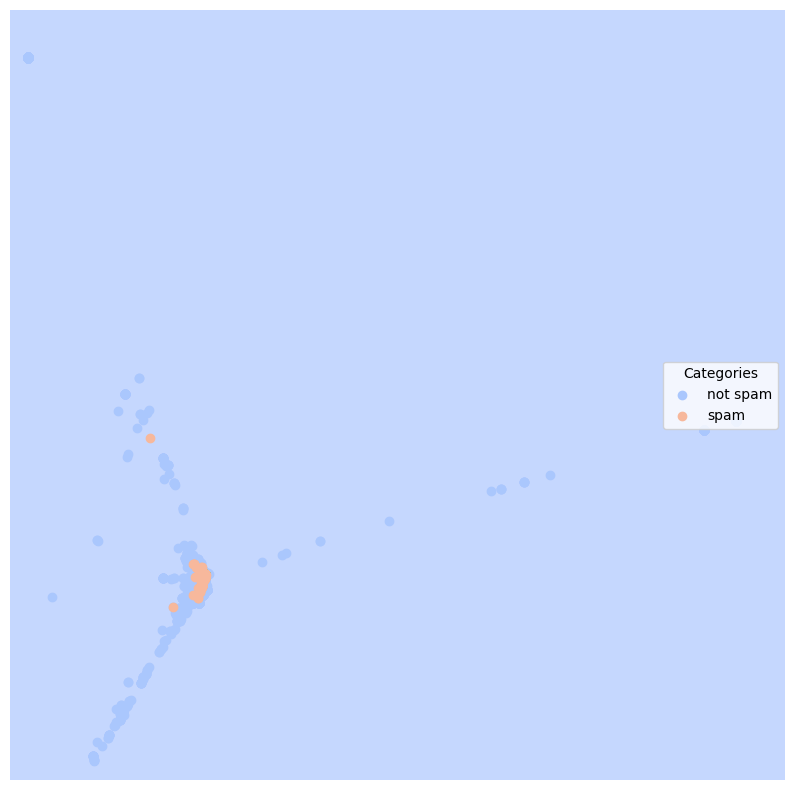

Training and evaluating Gradient Boosting


/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


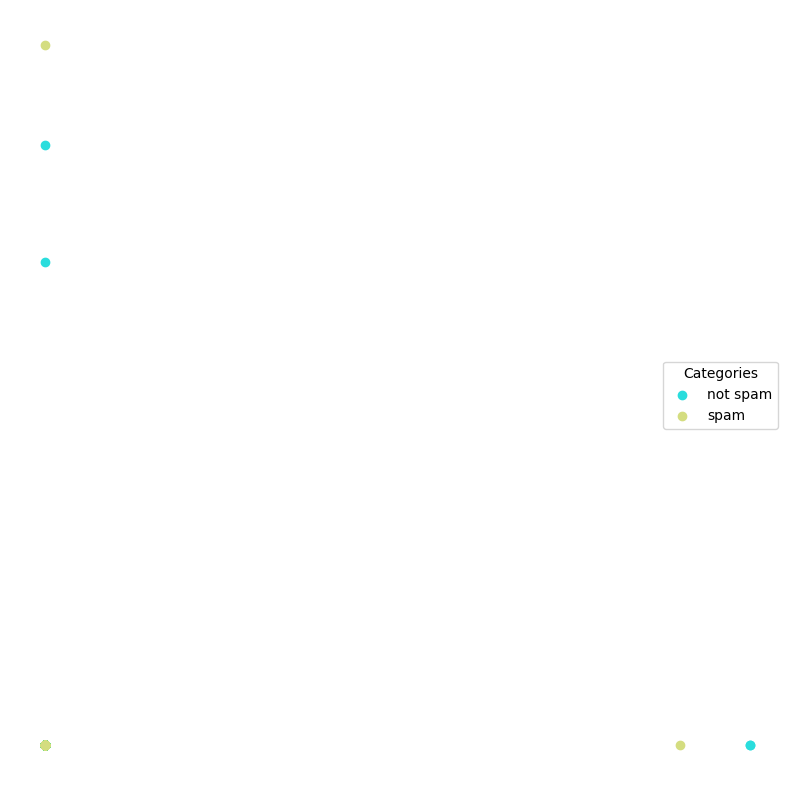

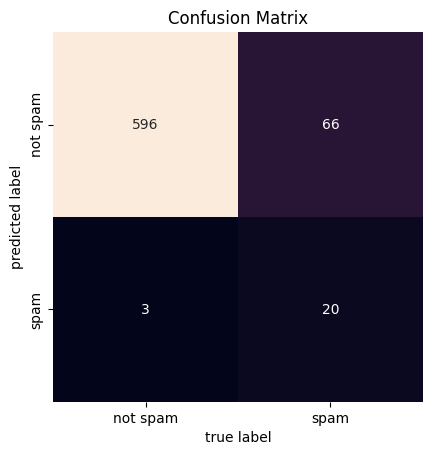

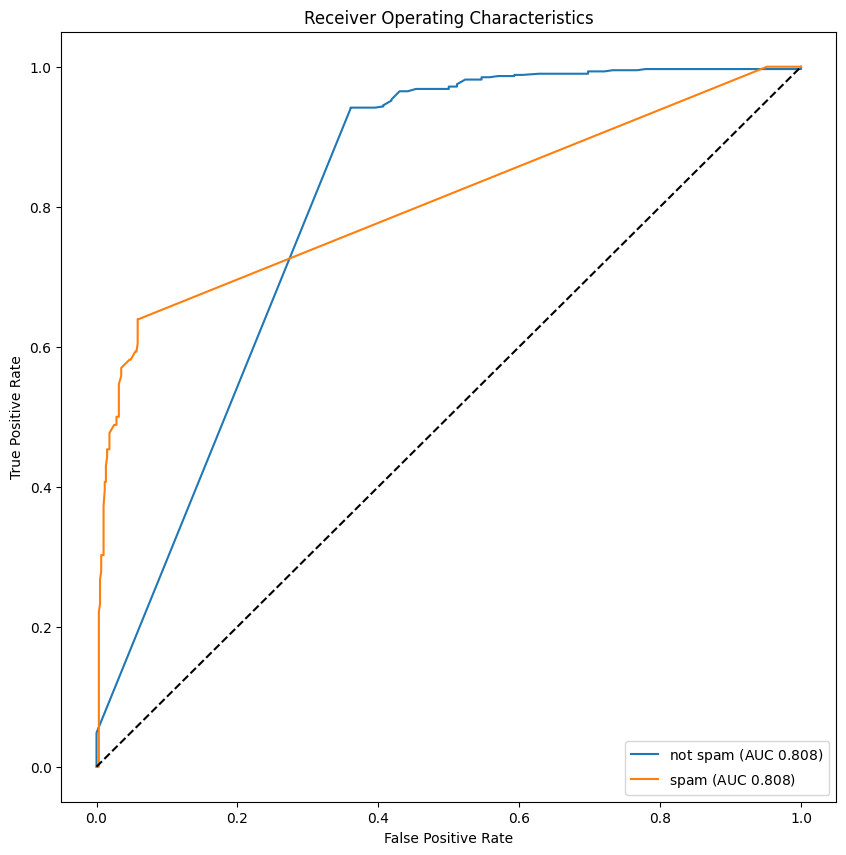

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


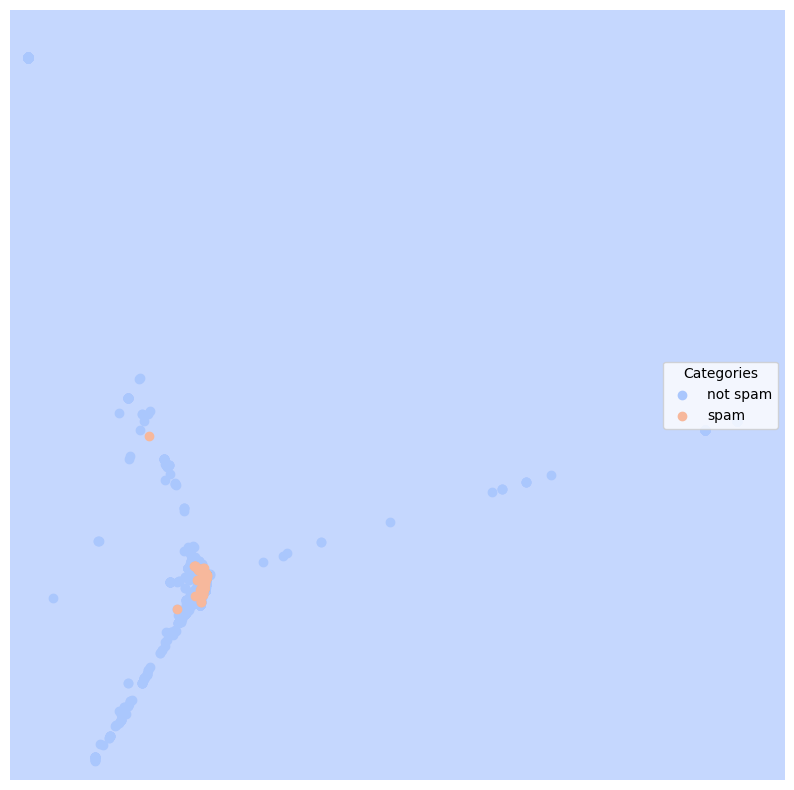

In [ ]:
import numpy as np
import sklearn.linear_model
import sklearn.naive_bayes
import sklearn.svm
import sklearn.neighbors
import sklearn.tree
import sklearn.ensemble
import sklearn.neural_network
from sklearn.naive_bayes import GaussianNB

# Define a list of classifiers
classifiers = [
    ("Logistic Regression", sklearn.linear_model.LogisticRegression()),
    ("Gaussian Naive Bayes", sklearn.naive_bayes.GaussianNB()),
    ("SVC Linear", sklearn.svm.SVC(kernel='linear', probability=True)),
    ("SVC Poly", sklearn.svm.SVC(kernel='poly', degree=3, probability=True)),
    ("Decision Tree", sklearn.tree.DecisionTreeClassifier()),
    ("Random Forest", sklearn.ensemble.RandomForestClassifier()),
    ("MLP Classifier", sklearn.neural_network.MLPClassifier()),
    ("Gradient Boosting", sklearn.ensemble.GradientBoostingClassifier())
]

# Loop through each classifier
for name, clf in classifiers:
    print(f"Training and evaluating {name}")
    # Training classifier
    clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])

    # Evaluation classifier
    lucem_illud.evaluateClassifier(clf, dfTest)

    # Plot
    lucem_illud.plotter(dfTrain)

    # Plot confusion matrix
    lucem_illud.plotConfusionMatrix(clf, dfTest)

    # Plot ROC curve
    lucem_illud.plotMultiROC(clf, dfTest)

    # Plot the decision region
    lucem_illud.plotregions(clf, dfTrain)

# For `Spam` data, the model is less effective than previous data and error rate on average is above previous, The worst is `Gaussian Naive Bayes` model, because it misclassified about 104 data fromthe confusion metrix, while `MLP Classifier` performs best, which only `45` misclasified from confusion matrix, because it capture the distribution pattern

# **Stretch** I will use `AdaBoost` and for artificial I will use `xorSplit` for real data I will use `spam` because they are the hardest data to classify

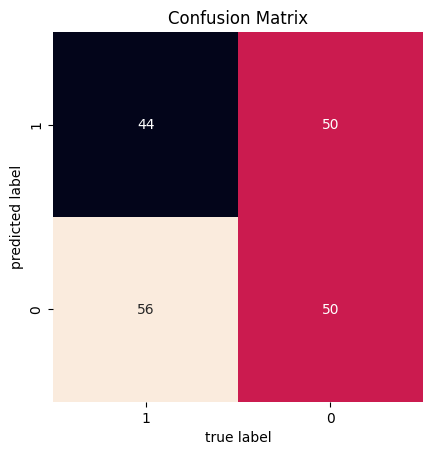

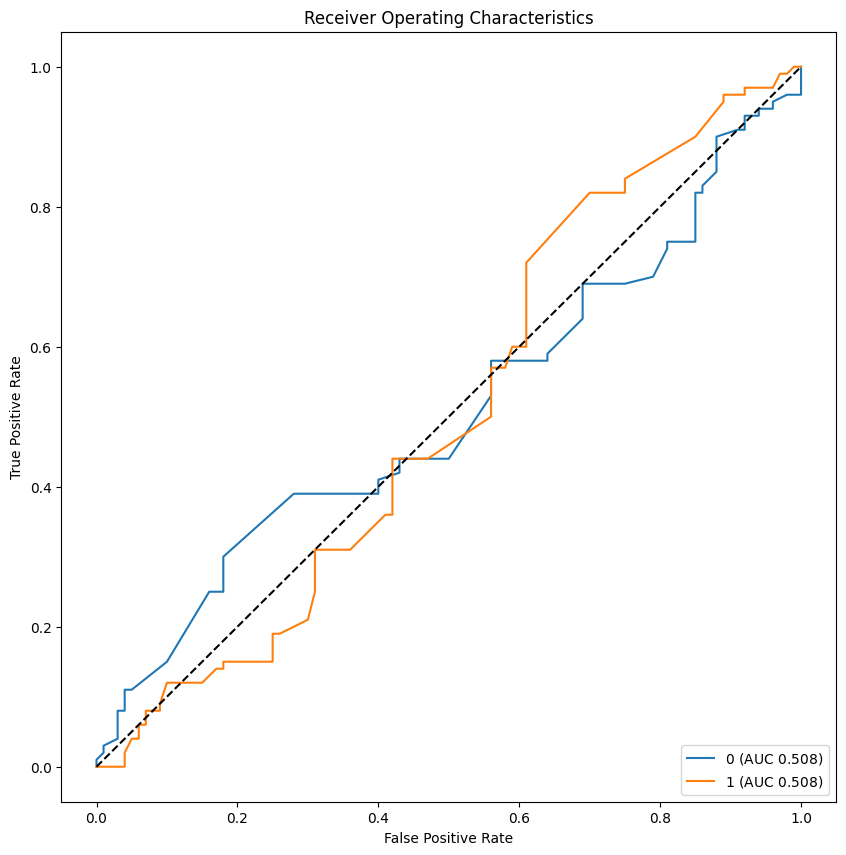

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


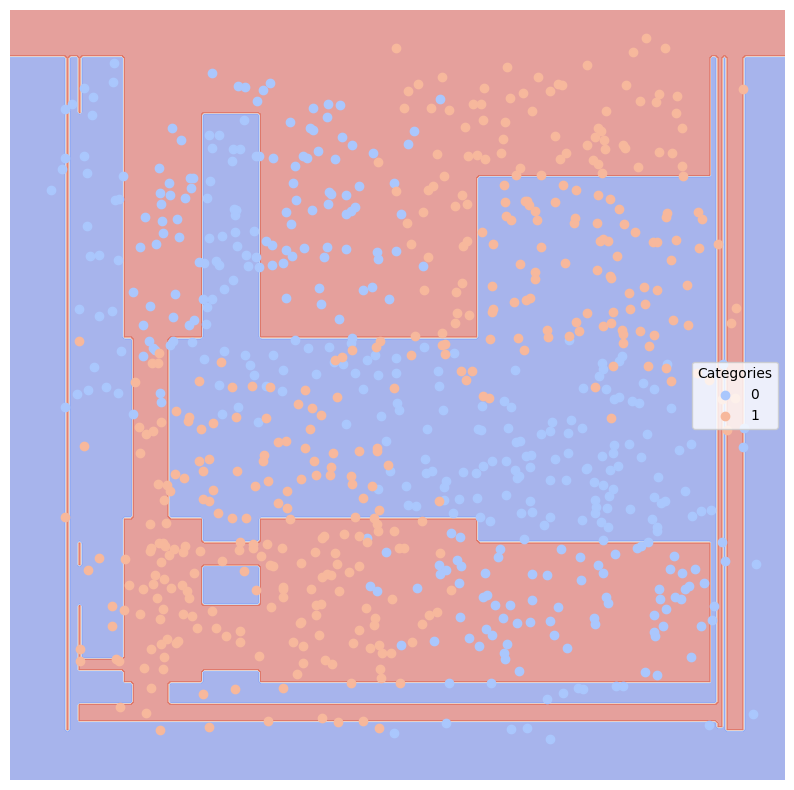

In [ ]:
dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.xorSplit(noise), test_size=.2)
clf = sklearn.ensemble.AdaBoostClassifier()

clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf, dfTest)
lucem_illud.plotConfusionMatrix(clf, dfTest)
lucem_illud.plotMultiROC(clf, dfTest)
lucem_illud.plotregions(clf, dfTrain)

Loading Spam
Loading Ham
Converting to vectors


/usr/local/lib/python3.10/dist-packages/spacy/pipeline/lemmatizer.py:211: UserWarning: [W108] The rule-based lemmatizer did not find POS annotation for one or more tokens. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
  warnings.warn(Warnings.W108)


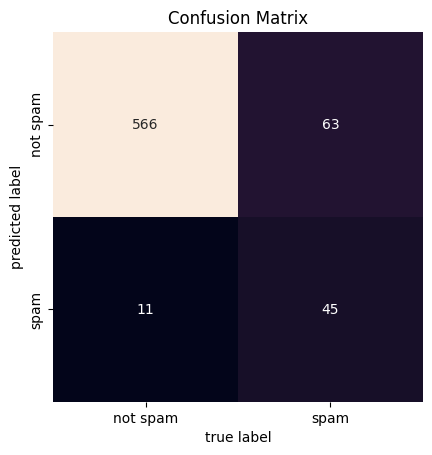

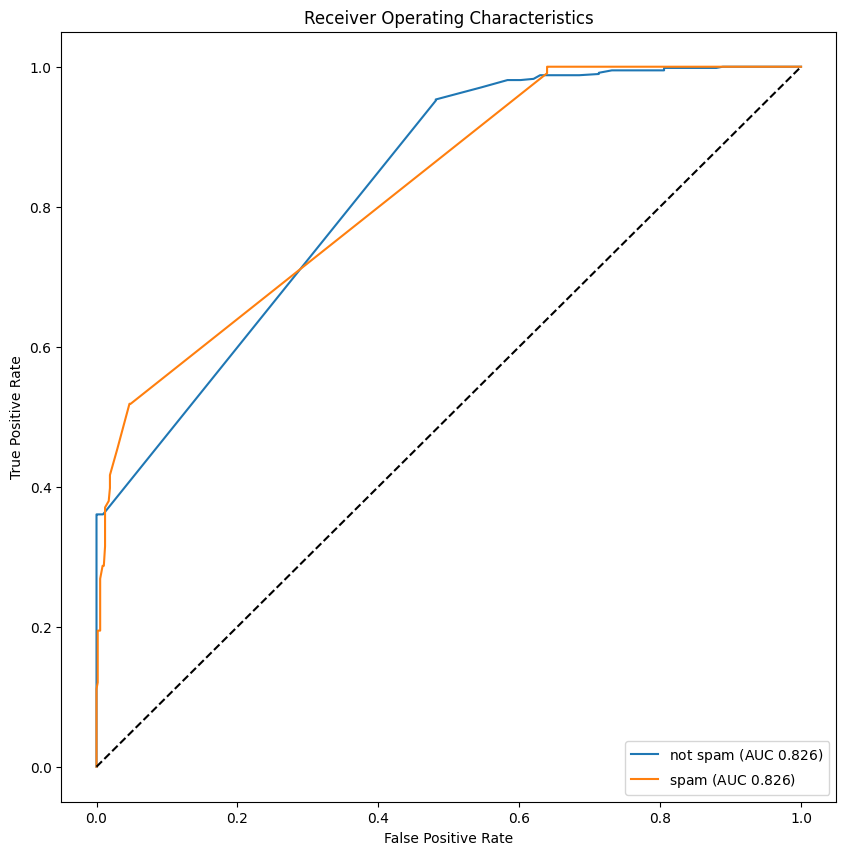

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


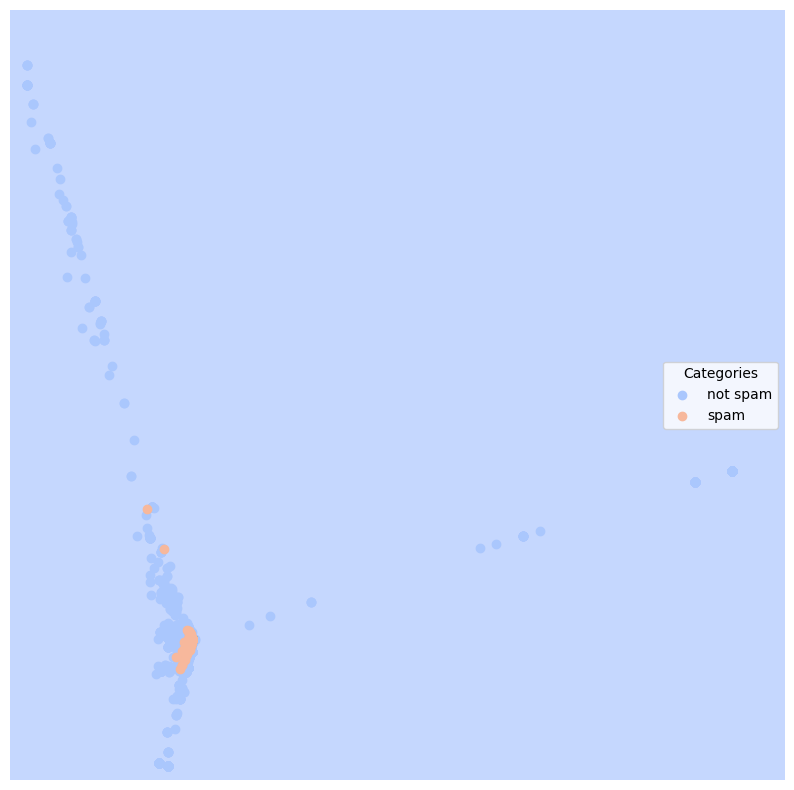

In [ ]:
dfTrain, dfTest = sklearn.model_selection.train_test_split(lucem_illud.loadSpam(dataDirectory='/content/drive/MyDrive/Content_Analysis/Homework-Notebooks/data/'), test_size=.2)
clf = sklearn.ensemble.AdaBoostClassifier()

clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
lucem_illud.evaluateClassifier(clf, dfTest)
lucem_illud.plotConfusionMatrix(clf, dfTest)
lucem_illud.plotMultiROC(clf, dfTest)
lucem_illud.plotregions(clf, dfTrain)

# It can be seen that AdaBoost does not perform significantly better on artificial and real data than other models. This is because AdaBoost assumes that the data is separable and reduces classification errors through iteration. If the data set contains a lot of noise, or if the classification problem itself is very complex (such as unclear boundaries between classes), AdaBoost may not have a significant performance improvement.

# Clinton / Obama Press Releases

We often will not have nicely prepared data, so we will work though the proccess of cleaning and structuring in more detail here:

While the Clinton and Obama Senatorial Press Releases are not hand-coded, we can imagine that we have been given a stack of such press releases, but lost the metadata associated with which senatorial office issued which. If we label a few of them, how well can our classifier do at recovering the rest?

In [ ]:
ObamaClintonReleases = pandas.read_csv('/content/drive/MyDrive/Content_Analysis/Homework-Notebooks/data/ObamaClintonReleases.csv', index_col=0)

I'm pretty sure that you're all familiar with pandas, but, just to clarify: why do we use pandas here? pandas is a Python library which is widely used for analyzing and wrangling data. In particular, pandas loads data and creates data frame, a Python object that looks familiar to us (since it looks like a excel table) and easy to work with. So, using pandas.read_csv function, we take in the csv file and convert it into a data frame.

In [ ]:
type(ObamaClintonReleases)

pandas.core.frame.DataFrame

It's a DataFrame! and it looks like this:

In [ ]:
ObamaClintonReleases

,download_url,html_url,name,path,text,targetSenator
0,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,10Apr2007Obama430.txt,raw/Obama/10Apr2007Obama430.txt,Obama Calls on IRS to Protect Taxpayers ...,Obama
1,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,10Apr2008Obama108.txt,raw/Obama/10Apr2008Obama108.txt,Statement from Senator Barack Obama on the ...,Obama
2,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,10Aug2005Obama674.txt,raw/Obama/10Aug2005Obama674.txt,Obama Says Bill Will Help Cut Off Supply of...,Obama
3,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,10Aug2005Obama675.txt,raw/Obama/10Aug2005Obama675.txt,Obama Durbin Say Illinois Will Receive 33 ...,Obama
4,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,10Aug2006Obama508.txt,raw/Obama/10Aug2006Obama508.txt,Obama Introduces Bill to Help Tap Power of ...,Obama
...,...,...,...,...,...,...
1704,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,1Sep2005Clinton285.txt,raw/Clinton/1Sep2005Clinton285.txt,September 1 2005 Senator Clinton Visit Infoto...,Clinton
1705,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,1Sep2005Clinton286.txt,raw/Clinton/1Sep2005Clinton286.txt,September 1 2005 Senator Clinton Announces Ex...,Clinton
1706,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,1Sep2005Clinton287.txt,raw/Clinton/1Sep2005Clinton287.txt,September 1 2005 Senator Clinton Joins Local ...,Clinton
1707,https://raw.githubusercontent.com/lintool/Grim...,https://github.com/lintool/GrimmerSenatePressR...,1Sep2006Clinton207.txt,raw/Clinton/1Sep2006Clinton207.txt,September 1 2006 Clintons Meet with Cazenovia...,Clinton


Neat! Let's turn the 'targetSenator' column into a binary category variable.

In [ ]:
ObamaClintonReleases['category'] = [s == 'Obama' for s in ObamaClintonReleases['targetSenator']]

Tokenize and normalize

In [ ]:
ObamaClintonReleases['tokenized_text'] = ObamaClintonReleases['text'].apply(lambda x: lucem_illud.word_tokenize(x))
ObamaClintonReleases['normalized_text'] = ObamaClintonReleases['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x))

/usr/local/lib/python3.10/dist-packages/spacy/pipeline/lemmatizer.py:211: UserWarning: [W108] The rule-based lemmatizer did not find POS annotation for one or more tokens. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
  warnings.warn(Warnings.W108)


Let's split the data into training data and testing data.

In [ ]:
holdBackFraction = .2
train_data_df, test_data_df = sklearn.model_selection.train_test_split(ObamaClintonReleases, test_size=holdBackFraction)

In [ ]:
print(len(train_data_df))
print(len(test_data_df))

1367
342


## Logistic Regression

First, let's try with a logistic regression, which may be familiar to you from statistical methods classes. First, we must turn the training dataset into a tf-idf matrix (`lucem_illud.generateVecs()` will help with this but for now we are doing it the long way):

In [ ]:
TFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects = TFVectorizer.fit_transform(train_data_df['text'])

The core function here is TfidfVectorizer, which takes a collection of raw documents and turn them to a tf-idf matrix. Just to recap: tf-idf means term frequency-inverse document frequency, a statistic (or, more precisely, a product of two statistics, term frequency and inverse document frequency) that shows the importance of a term vis-a-vis documents. TF, or, term frequency, counts how many times a term is used in a document; IDF, or, inverse-document-frequency, measures common or rare a term appears across documents.

Let's look at three parameters of TfidfVectorizer: max_df = 100, min_df = 2, and norm='l2'. What do those parameters mean?

(1) max_df = 100

Here, we specified a thredhold of 100, and the terms that have a document frequency higher than 100 would be ignored.

(2) min_df = 2

We specified a lower bound, 2, and the terms that have a document frequency lower than 2 will be ignored.

(3) norm = 'l2'

This parameter is about vector normalization. In machine learning, we commonly normalize vectors, i.e., change the length of vectors and turn them into a unit vector, before passing them into algorithms. There are various ways of normalizations, and this parameter specifies how we normalize vectors. Here, we set the norm to l2, in which case, we normalize the vectors such that squares of vector elements sums to 1. Alternatively, we can set it to l1, in which case the sum of absolute values of vector elements, not the square of vector elements, is 1.

fit_transform() literally fits to data and then transform it. So, fit_transform() is just a combination of two steps--(1) fitting parameters to data; (2) then, using the vocabulary and document frequencies learned by fit(), transforming documents into document-term matrix. So, it's the same as fit followed by transform.

Note that we can use the CountVectorizer instead, which simply produces a matrix of word counts.

In [ ]:
TFVects.shape

(1367, 11173)

We can save this in the dataframe to make things easier

In [ ]:
train_data_df['vect'] = [np.array(v).flatten() for v in TFVects.todense()]

Looks simple, but we need to know what todense() does here. todense() returns a dense matrix representation of the matrix. Why do we need this? As you can see above, the TFVects, a document-term matrix, has 11349 columns, and this matrix is sparse, in the sense that it is comprised mostly of zeros. Dense matrices, in contrast, are the matrices that are comprised of mostly non-zeros. Then why do we make sparse matrices into dense ones? Because zero values don't contain important information but take up so much memory.

In a regression, we cannot have more variables than cases. So, we need to first do a dimension reduction. First, we will approah this with PCA. You have previously seen this in week 3. Here we are not concerned about visualization, but rather classification and so all principal components are calculated. Watch out: we have to use `stack` not `sum` for combining the vectors. We note that you could also use topic loading and embedding dimensions as featured variables.

In [ ]:
pca = sklearn.decomposition.PCA()
reduced_data = pca.fit_transform(np.stack(train_data_df['vect'], axis=0))

We can store the PCA space vectors in the dataframe too:

In [ ]:
train_data_df['pca'] = [r for r in reduced_data]

Visualization in 2D:

<ipython-input-89-c9d2b7441e78>:7: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[0], label = "True")
<ipython-input-89-c9d2b7441e78>:11: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[1], label = "False")


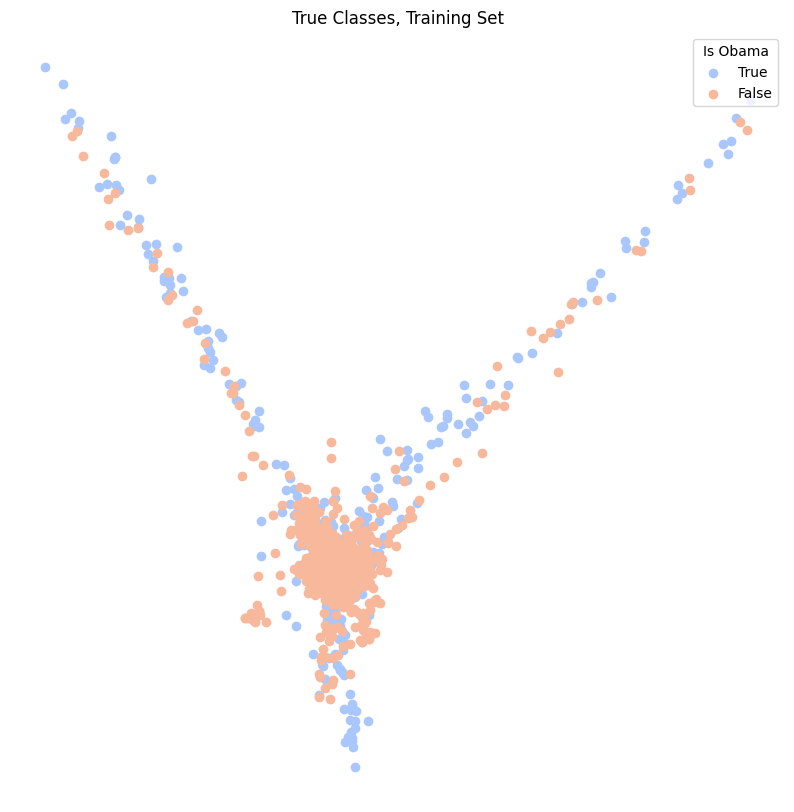

In [ ]:
fig, ax = plt.subplots(figsize = (10,10))
ax.axis('off')
pallet = seaborn.color_palette(palette='coolwarm', n_colors = 2)

#Plot Obama
a = np.stack(train_data_df[train_data_df['category']]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[0], label = "True")

#Plot not Obama
a = np.stack(train_data_df[train_data_df['category'].eq(False)]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[1], label = "False")

ax.legend(loc = 'upper right', title = 'Is Obama')
plt.title('True Classes, Training Set')
plt.show()

PCA cannot distinguish Obama very well. Let's perform a screeplot to see how many Principal Components we need.

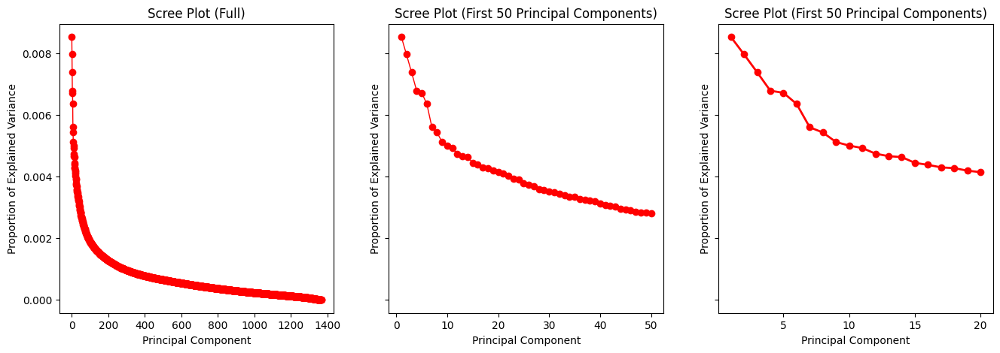

In [ ]:
n = len(train_data_df)

fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize = (16, 5), sharey=True)

eigen_vals = np.arange(n) + 1
ax1.plot(eigen_vals, pca.explained_variance_ratio_, 'ro-', linewidth=1)
ax1.set_title('Scree Plot (Full)')
ax1.set_xlabel('Principal Component')
ax1.set_ylabel('Proportion of Explained Variance')

eigen_vals = np.arange(50) + 1
ax2.plot(eigen_vals, pca.explained_variance_ratio_[:50], 'ro-', linewidth=1)
ax2.set_title('Scree Plot (First 50 Principal Components)')
ax2.set_xlabel('Principal Component')
ax2.set_ylabel('Proportion of Explained Variance')


eigen_vals = np.arange(20) + 1
ax3.plot(eigen_vals, pca.explained_variance_ratio_[:20], 'ro-', linewidth=2)
ax3.set_title('Scree Plot (First 50 Principal Components)')
ax3.set_xlabel('Principal Component')
ax3.set_ylabel('Proportion of Explained Variance')

plt.show()

Let's choose the first 10 pricipal components as our covariates.

In [ ]:
train_data_df['pca_reduced_10'] = train_data_df['pca'].apply(lambda x: x[:10])

Now we fit a logistic regression to our data.

In [ ]:
logistic = sklearn.linear_model.LogisticRegression()
logistic.fit(np.stack(train_data_df['pca_reduced_10'], axis=0), train_data_df['category'])

LogisticRegression()

Let's see how the logistic regression performs on the training dataset from which we develop the model. Unfortunately, the mean accuracy is only about 64%.

In [ ]:
logistic.score(np.stack(train_data_df['pca_reduced_10'], axis=0), train_data_df['category'])

0.667885881492319

How does it perform on the testing dataset, which we "held out" and did not use for model training? We need to repeat all the steps on the testing data, but without retraining:

In [ ]:
#Create vectors
TFVects_test = TFVectorizer.transform(test_data_df['text'])
test_data_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#PCA
reduced_data_test = pca.transform(np.stack(test_data_df['vect'], axis=0))
test_data_df['pca'] = [r for r in reduced_data_test]
test_data_df['pca_reduced_10'] = test_data_df['pca'].apply(lambda x: x[:10])

#Test
logistic.score(np.stack(test_data_df['pca_reduced_10'], axis=0), test_data_df['category'])

0.6695906432748538

Slightly poorer. How about using more dimensions (40)?

In [ ]:
train_data_df['pca_reduced_40'] = train_data_df['pca'].apply(lambda x: x[:40])
test_data_df['pca_reduced_40'] = test_data_df['pca'].apply(lambda x: x[:40])

logistic.fit(np.stack(train_data_df['pca_reduced_40'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_40'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_40'], axis=0), test_data_df['category']))

Training:
0.7395757132406731
Testing:
0.7222222222222222


Or still more (100)?

In [ ]:
train_data_df['pca_reduced_100'] = train_data_df['pca'].apply(lambda x: x[:100])
test_data_df['pca_reduced_100'] = test_data_df['pca'].apply(lambda x: x[:100])

logistic.fit(np.stack(train_data_df['pca_reduced_100'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_100'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_100'], axis=0), test_data_df['category']))

Training:
0.8193123628383321
Testing:
0.7923976608187134


Or even more (200)!

In [ ]:
train_data_df['pca_reduced_200'] = train_data_df['pca'].apply(lambda x: x[:200])
test_data_df['pca_reduced_200'] = test_data_df['pca'].apply(lambda x: x[:200])

logistic.fit(np.stack(train_data_df['pca_reduced_200'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_200'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_200'], axis=0), test_data_df['category']))

Training:
0.8785662033650329
Testing:
0.8216374269005848


This is becoming ridiculous (400)!

In [ ]:
train_data_df['pca_reduced_400'] = train_data_df['pca'].apply(lambda x: x[:400])
test_data_df['pca_reduced_400'] = test_data_df['pca'].apply(lambda x: x[:400])

logistic.fit(np.stack(train_data_df['pca_reduced_400'], axis=0), train_data_df['category'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_400'], axis=0), train_data_df['category']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_400'], axis=0), test_data_df['category']))

Training:
0.9195318215069496
Testing:
0.8391812865497076


Increasing the number of covariates would overfit our data, and it seems that using a logistic regression, our prediction accuracy is at best about 65%. We can, however, try a logistic regression that uses the TF-IDF scores for each word, but with an L1 regularization or L1-norm loss function, which is also known as least absolute deviations (LAD), least absolute errors (LAE) or L1 penalty. It minimizes the sum of the absolute differences (S) between the target value ($Y_i$) and the estimated values ($f(x_i)$) and prunes all insignificant variables (i.e., word TF-IDF scores):

$S=\sum^n_{i=1}|y_i=f(x_i)|$

The result is a model retaining only the most individually significant features.

In [ ]:
logistic_l1= sklearn.linear_model.LogisticRegression(penalty='l2')
logistic_l1.fit(np.stack(train_data_df['vect'], axis=0), train_data_df['category'])
print(logistic_l1.score(np.stack(train_data_df['vect'], axis=0), train_data_df['category']))

0.9656181419166057


Train the model using training data, and then test it on the testing data.

In [ ]:
print(logistic_l1.score(np.stack(test_data_df['vect'], axis=0), test_data_df['category']))

0.8538011695906432


81% accuracy seems like the best we can get by using a logistic regression.

## <font color="red">*Exercise 3*</font>

<font color="red">In the cells immediately following, perform logistic regression classification using training, testing and uncoded (i.e., data you didn't code by hand but want to use your model on) data from texts and hand-classifications associated with your final project (e.g., these could be crowd-sourced codes gathered through Amazon Mechanical Turk in Exercise 1). Visualize the confusion matrix for training and testing sets. Calculate precision, recall, the F-measure, and AUC, then perform an ROC visualization. How do these classifiers perform? Exrapolate codes from these models to all uncoded data.


# I will load my data with coers, I take the mode of each coder as a marker

In [ ]:
President = pd.read_csv('/content/drive/MyDrive/Content_Analysis/Homework-Notebooks/week 5/mexico_sentences.csv')
President['Final_Label'] = President[['A1', 'A2', 'A3']].mode(axis=1)[0]
President

,SPEAKER,DATE,TITLE,CITATION,URL,Merged_Text,A1,A2,A3,Final_Label
0,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,The fact that the President—George Bush's firs...,2.0,2.0,2.0,2.0
1,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,I also acknowledge President Bush's demonstra...,2.0,2.0,2.0,2.0
2,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,"President, that you will always be welcome in...",2.0,2.0,2.0,2.0
3,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,"We, the Presidents of Mexico and the United St...",2.0,1.0,1.0,1.0
4,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,"Muchas gracias, amigo, el Presidente de Mexico",2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...
901,Joseph R. Biden,10-Jan-23,The President's News Conference With Prime Min...,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,That's exactly what we're doing in Mexico,NaN,NaN,NaN,NaN
902,Joseph R. Biden,10-Jan-23,The President's News Conference With Prime Min...,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,This doesn't happen in Mexico anymore,NaN,NaN,NaN,NaN
903,Joseph R. Biden,10-Jan-23,The President's News Conference With Prime Min...,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,Just as I was telling you that in the case of...,NaN,NaN,NaN,NaN
904,Joseph R. Biden,10-Jan-23,The President's News Conference With Prime Min...,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,"In the case of Mexico, this led us to make al...",NaN,NaN,NaN,NaN


# Now I spill data into labeled and predict data set

In [ ]:
Predic_President = President[President['Final_Label'].isnull()]
Labeled_President = President.dropna(subset=['Final_Label'])

Predic_President.head()

,SPEAKER,DATE,TITLE,CITATION,URL,Merged_Text,A1,A2,A3,Final_Label
50,George W. Bush,24-Aug-01,The President's News Conference in Crawford,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,The history of the relationship between Mexico...,NaN,NaN,NaN,NaN
51,George W. Bush,24-Aug-01,The President's News Conference in Crawford,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,"The long-term solution, however, for immigrati...",NaN,NaN,NaN,NaN
52,George W. Bush,24-Aug-01,The President's News Conference in Crawford,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,There are people in Mexico who have got child...,NaN,NaN,NaN,NaN
53,George W. Bush,11-Oct-01,The President's News Conference,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,"Our staunch friends, Great Britain, our neigh...",NaN,NaN,NaN,NaN
54,George W. Bush,21-Feb-02,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,I have accepted with pleasure and appreciatio...,NaN,NaN,NaN,NaN


In [ ]:
Labeled_President.head()

,SPEAKER,DATE,TITLE,CITATION,URL,Merged_Text,A1,A2,A3,Final_Label
0,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,The fact that the President—George Bush's firs...,2.0,2.0,2.0,2.0
1,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,I also acknowledge President Bush's demonstra...,2.0,2.0,2.0,2.0
2,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,"President, that you will always be welcome in...",2.0,2.0,2.0,2.0
3,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,"We, the Presidents of Mexico and the United St...",2.0,1.0,1.0,1.0
4,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,"Muchas gracias, amigo, el Presidente de Mexico",2.0,2.0,2.0,2.0


# Now I spill the train and test set

In [ ]:
holdBackFraction = .2
train_data_df, test_data_df = sklearn.model_selection.train_test_split(Labeled_President, test_size=holdBackFraction)
print(len(train_data_df))
print(len(test_data_df))

130
33


# Now I transfer the text into TF-IDF

In [ ]:
TFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects = TFVectorizer.fit_transform(train_data_df['Merged_Text'])

In [ ]:
TFVects.shape

(130, 190)

In [ ]:
train_data_df['vect'] = [np.array(v).flatten() for v in TFVects.todense()]

In [ ]:
pca = sklearn.decomposition.PCA()
reduced_data = pca.fit_transform(np.stack(train_data_df['vect'], axis=0))

In [ ]:
train_data_df['pca'] = [r for r in reduced_data]

# Now I modify the code to show my three different attitude labels

<ipython-input-117-ffb7d7ace095>:11: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:, 0], a[:, 1], c=pallet[0], label="Negative attitude")
<ipython-input-117-ffb7d7ace095>:15: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:, 0], a[:, 1], c=pallet[1], label="Neutral attitude")
<ipython-input-117-ffb7d7ace095>:19: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should

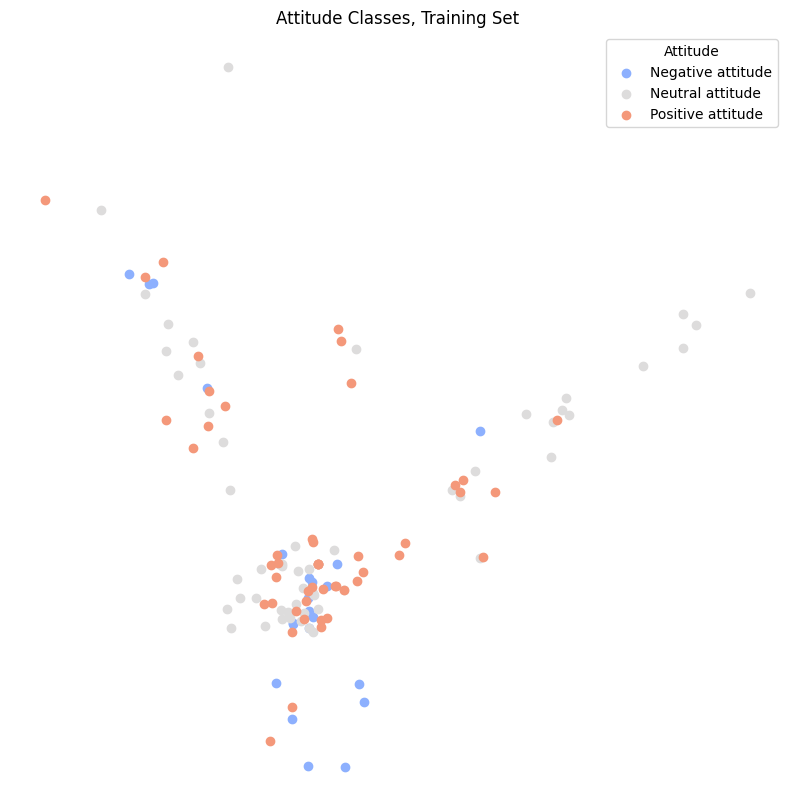

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn

fig, ax = plt.subplots(figsize=(10, 10))
ax.axis('off')
pallet = seaborn.color_palette(palette='coolwarm', n_colors=3)

#  Negative attitude
a = np.stack(train_data_df[train_data_df['Final_Label'] == 0]['pca'])
ax.scatter(a[:, 0], a[:, 1], c=pallet[0], label="Negative attitude")

#  Neutral attitude
a = np.stack(train_data_df[train_data_df['Final_Label'] == 1]['pca'])
ax.scatter(a[:, 0], a[:, 1], c=pallet[1], label="Neutral attitude")

#  Positive attitude
a = np.stack(train_data_df[train_data_df['Final_Label'] == 2]['pca'])
ax.scatter(a[:, 0], a[:, 1], c=pallet[2], label="Positive attitude")

ax.legend(loc='upper right', title='Attitude')
plt.title('Attitude Classes, Training Set')
plt.show()

# PCA cannot distinguish Obama very well. Let's perform a screeplot to see how many Principal Components we need.

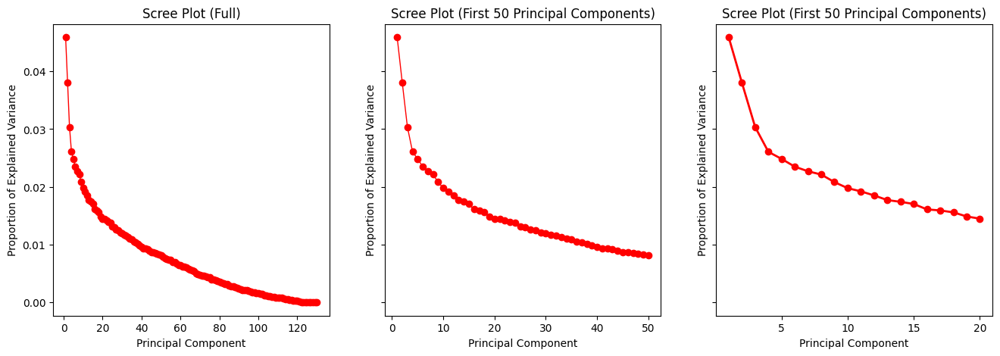

In [ ]:
n = len(train_data_df)

fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize = (16, 5), sharey=True)

eigen_vals = np.arange(n) + 1
ax1.plot(eigen_vals, pca.explained_variance_ratio_, 'ro-', linewidth=1)
ax1.set_title('Scree Plot (Full)')
ax1.set_xlabel('Principal Component')
ax1.set_ylabel('Proportion of Explained Variance')

eigen_vals = np.arange(50) + 1
ax2.plot(eigen_vals, pca.explained_variance_ratio_[:50], 'ro-', linewidth=1)
ax2.set_title('Scree Plot (First 50 Principal Components)')
ax2.set_xlabel('Principal Component')
ax2.set_ylabel('Proportion of Explained Variance')


eigen_vals = np.arange(20) + 1
ax3.plot(eigen_vals, pca.explained_variance_ratio_[:20], 'ro-', linewidth=2)
ax3.set_title('Scree Plot (First 50 Principal Components)')
ax3.set_xlabel('Principal Component')
ax3.set_ylabel('Proportion of Explained Variance')

plt.show()

Let's choose the first 10 pricipal components as our covariates.

In [ ]:
train_data_df['pca_reduced_10'] = train_data_df['pca'].apply(lambda x: x[:10])

Now we fit a logistic regression to our data.

In [ ]:
logistic = sklearn.linear_model.LogisticRegression()
logistic.fit(np.stack(train_data_df['pca_reduced_10'], axis=0), train_data_df['Final_Label'])

LogisticRegression()

Let's see how the logistic regression performs on the training dataset from which we develop the model. Unfortunately, the mean accuracy is only about 52%.

In [ ]:
logistic.score(np.stack(train_data_df['pca_reduced_10'], axis=0), train_data_df['Final_Label'])

0.5230769230769231

How does it perform on the testing dataset, which we "held out" and did not use for model training? We need to repeat all the steps on the testing data, but without retraining:

In [ ]:
#Create vectors
TFVects_test = TFVectorizer.transform(test_data_df['Merged_Text'])
test_data_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#PCA
reduced_data_test = pca.transform(np.stack(test_data_df['vect'], axis=0))
test_data_df['pca'] = [r for r in reduced_data_test]
test_data_df['pca_reduced_10'] = test_data_df['pca'].apply(lambda x: x[:10])

#Test
logistic.score(np.stack(test_data_df['pca_reduced_10'], axis=0), test_data_df['Final_Label'])

0.48484848484848486

Slightly poorer. How about using more dimensions (40)?

In [ ]:
train_data_df['pca_reduced_40'] = train_data_df['pca'].apply(lambda x: x[:40])
test_data_df['pca_reduced_40'] = test_data_df['pca'].apply(lambda x: x[:40])

logistic.fit(np.stack(train_data_df['pca_reduced_40'], axis=0), train_data_df['Final_Label'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_40'], axis=0), train_data_df['Final_Label']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_40'], axis=0), test_data_df['Final_Label']))

Training:
0.7615384615384615
Testing:
0.6666666666666666


Or still more (100)?

In [ ]:
train_data_df['pca_reduced_100'] = train_data_df['pca'].apply(lambda x: x[:100])
test_data_df['pca_reduced_100'] = test_data_df['pca'].apply(lambda x: x[:100])

logistic.fit(np.stack(train_data_df['pca_reduced_100'], axis=0), train_data_df['Final_Label'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_100'], axis=0), train_data_df['Final_Label']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_100'], axis=0), test_data_df['Final_Label']))

Training:
0.8461538461538461
Testing:
0.6060606060606061


In [ ]:
train_data_df['pca_reduced_200'] = train_data_df['pca'].apply(lambda x: x[:200])
test_data_df['pca_reduced_200'] = test_data_df['pca'].apply(lambda x: x[:200])

logistic.fit(np.stack(train_data_df['pca_reduced_200'], axis=0), train_data_df['Final_Label'])

print("Training:")
print(logistic.score(np.stack(train_data_df['pca_reduced_200'], axis=0), train_data_df['Final_Label']))
print("Testing:")
print(logistic.score(np.stack(test_data_df['pca_reduced_200'], axis=0), test_data_df['Final_Label']))

Training:
0.8692307692307693
Testing:
0.6060606060606061


In [ ]:
logistic_l1= sklearn.linear_model.LogisticRegression(penalty='l2')
logistic_l1.fit(np.stack(train_data_df['vect'], axis=0), train_data_df['Final_Label'])
print(logistic_l1.score(np.stack(train_data_df['vect'], axis=0), train_data_df['Final_Label']))

0.8692307692307693


In [ ]:
print(logistic_l1.score(np.stack(test_data_df['vect'], axis=0), test_data_df['Final_Label']))

0.6060606060606061


# From 40 dimensions we can know that 66% accuracy seems like the best we can get by using a logistic regression. Now I calculate the statistics

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, roc_auc_score, auc
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import label_binarize

Text vectorliazation again for both train, test and predict data

In [ ]:
# Initialize the vectorizer
vectorizer = TfidfVectorizer(stop_words='english', max_df=0.9, min_df=2, norm='l2')

# Vectorize training data
X_train = vectorizer.fit_transform(train_data_df['Merged_Text'])
y_train = train_data_df['Final_Label']

# Vectorize testing data
X_test = vectorizer.transform(test_data_df['Merged_Text'])
y_test = test_data_df['Final_Label']

# Vectorize uncoded data
X_predic = vectorizer.transform(Predic_President['Merged_Text'])

Train the model

In [ ]:
# Initialize and train the logistic regression classifier
clf = LogisticRegression(max_iter=1000)  # Increase iteration count for convergence assurance
clf.fit(X_train, y_train)

LogisticRegression(max_iter=1000)

For multipal labels I will use `OVR` method

              precision    recall  f1-score   support

         0.0       1.00      0.33      0.50         3
         1.0       0.68      0.75      0.71        20
         2.0       0.40      0.40      0.40        10

    accuracy                           0.61        33
   macro avg       0.69      0.49      0.54        33
weighted avg       0.63      0.61      0.60        33



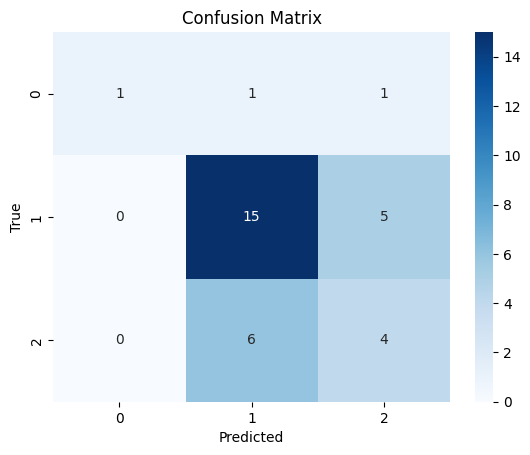

AUC: 0.79


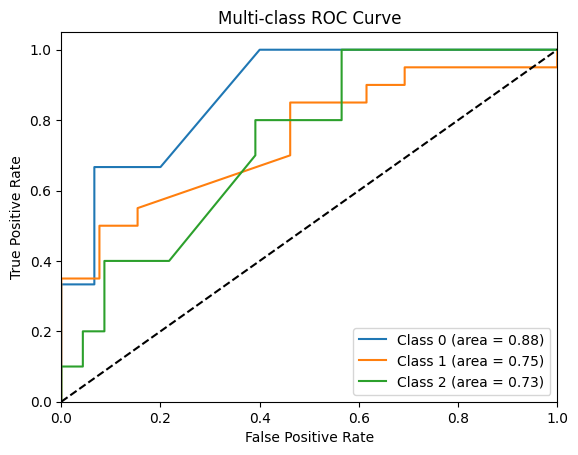

In [ ]:
# Predict on the test set
y_pred = clf.predict(X_test)

# Display the classification report
print(classification_report(y_test, y_pred))

# Confusion matrix
conf_mat = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Calculate AUC for multi-class
y_prob = clf.predict_proba(X_test)
auc_ovr = roc_auc_score(y_test, y_prob, multi_class='ovr', average='macro')
print("AUC: {:.2f}".format(auc_ovr))

# Plot ROC curve for multi-class
# Binarize the labels for multi-class scenario
y_test_binarized = label_binarize(y_test, classes=np.unique(y_test))

# Compute ROC curve and AUC for each class
n_classes = y_prob.shape[1]
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot the ROC curve for each class
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label='Class {} (area = {:.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')  # Line for random chance
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-class ROC Curve')
plt.legend(loc="lower right")
plt.show()

# Above are the precision, recall, the F-measure, and AUC, then perform an ROC visualization, it could learned that this model is somewhat less effective in predic classification, now I will apply it to predic unlabeled data

In [ ]:
# Predict labels for uncoded data
predic_labels = clf.predict(X_predic)

# Optionally, add predictions as a new column
Predic_President['Predicted_Label'] = predic_labels
Predic_President

<ipython-input-143-7e95f0e364f2>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Predic_President['Predicted_Label'] = predic_labels


,SPEAKER,DATE,TITLE,CITATION,URL,Merged_Text,A1,A2,A3,Final_Label,Predicted_Label
50,George W. Bush,24-Aug-01,The President's News Conference in Crawford,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,The history of the relationship between Mexico...,NaN,NaN,NaN,NaN,2.0
51,George W. Bush,24-Aug-01,The President's News Conference in Crawford,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,"The long-term solution, however, for immigrati...",NaN,NaN,NaN,NaN,2.0
52,George W. Bush,24-Aug-01,The President's News Conference in Crawford,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,There are people in Mexico who have got child...,NaN,NaN,NaN,NaN,2.0
53,George W. Bush,11-Oct-01,The President's News Conference,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,"Our staunch friends, Great Britain, our neigh...",NaN,NaN,NaN,NaN,2.0
54,George W. Bush,21-Feb-02,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,I have accepted with pleasure and appreciatio...,NaN,NaN,NaN,NaN,1.0
...,...,...,...,...,...,...,...,...,...,...,...
901,Joseph R. Biden,10-Jan-23,The President's News Conference With Prime Min...,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,That's exactly what we're doing in Mexico,NaN,NaN,NaN,NaN,1.0
902,Joseph R. Biden,10-Jan-23,The President's News Conference With Prime Min...,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,This doesn't happen in Mexico anymore,NaN,NaN,NaN,NaN,1.0
903,Joseph R. Biden,10-Jan-23,The President's News Conference With Prime Min...,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,Just as I was telling you that in the case of...,NaN,NaN,NaN,NaN,1.0
904,Joseph R. Biden,10-Jan-23,The President's News Conference With Prime Min...,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,"In the case of Mexico, this led us to make al...",NaN,NaN,NaN,NaN,1.0


# Decision Trees

Decision trees can be used to predict both categorical/class labels (i.e., classification) and continuous labels (i.e., regression).

/usr/local/lib/python3.10/dist-packages/lucem_illud/cartoons.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[i], label = cat)


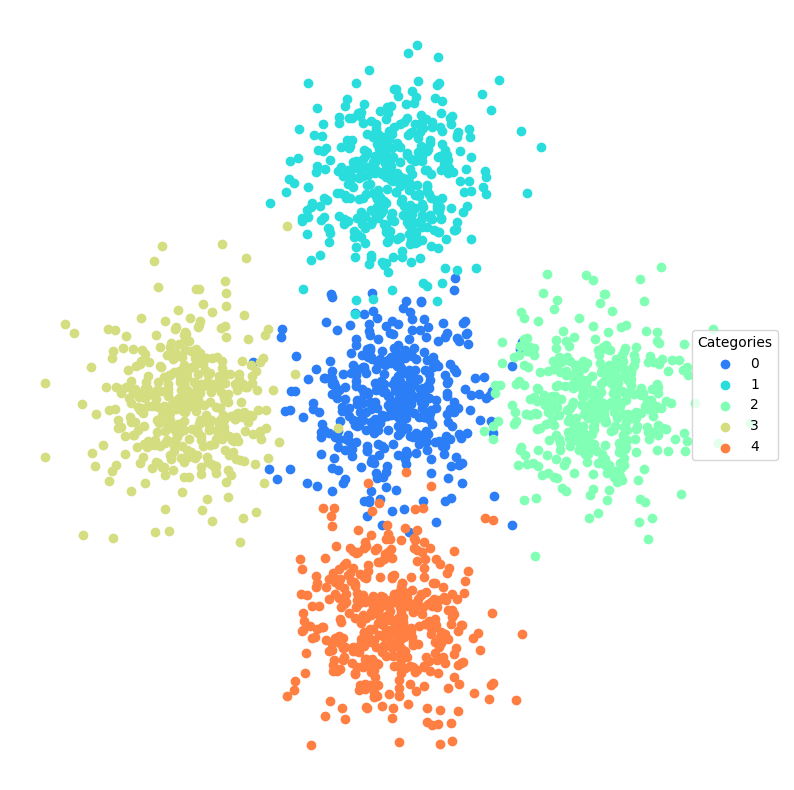

In [ ]:
blobs_df = lucem_illud.multiBlobs(noise=.2, centers=[(0,0), (0,5), (5,0), (-5,0), (0,-5)])
df_exampleTree_train, df_exampleTree_test = sklearn.model_selection.train_test_split(blobs_df, test_size=.2)
lucem_illud.plotter(df_exampleTree_train)

Now we import our Decision Tree classifier from sklearn.tree (familiar syntax) and fit it using the fit method.

In [ ]:
clf_tree = sklearn.tree.DecisionTreeClassifier(max_depth=4,random_state=0)
clf_tree.fit(np.stack(df_exampleTree_train['vect'], axis =0), df_exampleTree_train['category'])

DecisionTreeClassifier(max_depth=4, random_state=0)

To see what's going on visually with the classification:

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


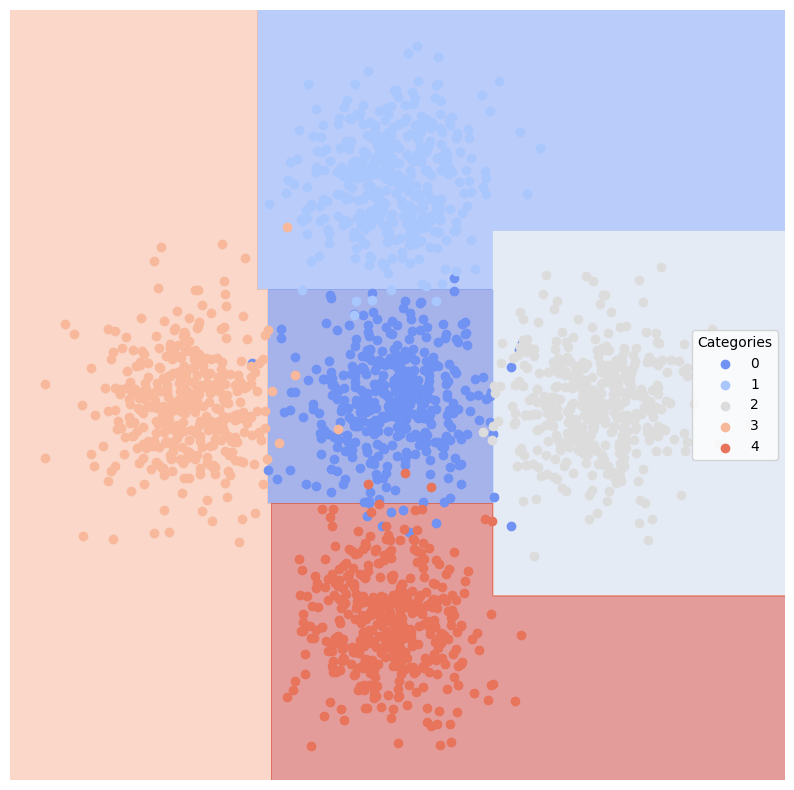

In [ ]:
lucem_illud.plotregions(clf_tree, df_exampleTree_train)

In [ ]:
lucem_illud.evaluateClassifier(clf_tree, df_exampleTree_test)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
0,0.034,0.964060,0.882883,0.856260,0.960784
1,0.006,0.992543,0.980392,0.972685,0.990099
2,0.006,0.983696,1.000000,0.973391,0.967391
3,0.010,0.978448,1.000000,0.966897,0.956897
4,0.012,0.975095,0.977011,0.941101,0.955056


Lets look at accuracy:

In [ ]:
sklearn.metrics.accuracy_score(df_exampleTree_test['category'],clf_tree.predict(np.stack(df_exampleTree_test['vect'], axis = 0)))

0.966

What happens if we trim the tree?

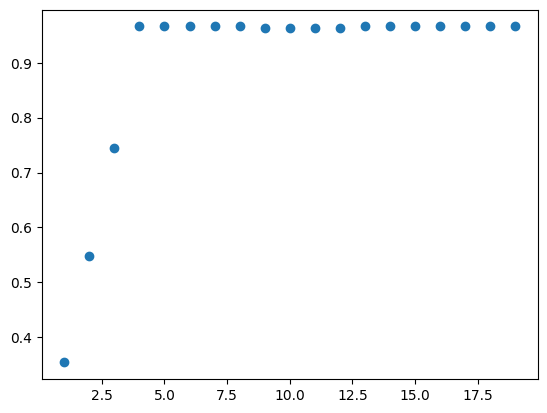

In [ ]:
depthvec = []
scorevec = []
for i in range(1,20):
    tree2 = sklearn.tree.DecisionTreeClassifier(max_depth=i,random_state=0)
    tree2.fit(np.stack(df_exampleTree_train['vect'], axis =0), df_exampleTree_train['category'])
    score = sklearn.metrics.accuracy_score(df_exampleTree_test['category'], tree2.predict(np.stack(df_exampleTree_test['vect'], axis = 0)))
    depthvec.append(i)
    scorevec.append(score)
plt.scatter(depthvec,scorevec)
plt.show()

We can select different layers of the decision tree or "prune" it. At approximately four layers down in the decision tree, the shape is somewhat odd, suggesting that our model is overfitting beyond those four layers.

Combining multiple overfitting estimators turns out to be a key idea in machine learning. This is called **bagging** and is a type of **ensemble** method. The idea is to make many randomized estimators--each can overfit, as decision trees are wont to do--but then to combine them, ultimately producing a better classification. A **random forest** is produced by bagging decision trees.

In [ ]:
tree = sklearn.tree.DecisionTreeClassifier(max_depth=10) #Create an instance of our decision tree classifier.

bag = sklearn.ensemble.BaggingClassifier(tree, n_estimators=100, max_samples=0.8, random_state=1) #Each tree uses up to 80% of the data

In [ ]:
bag.fit(np.stack(df_exampleTree_train['vect'], axis =0), df_exampleTree_train['category']) #Fit the bagged classifier

BaggingClassifier(estimator=DecisionTreeClassifier(max_depth=10),
                  max_samples=0.8, n_estimators=100, random_state=1)

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


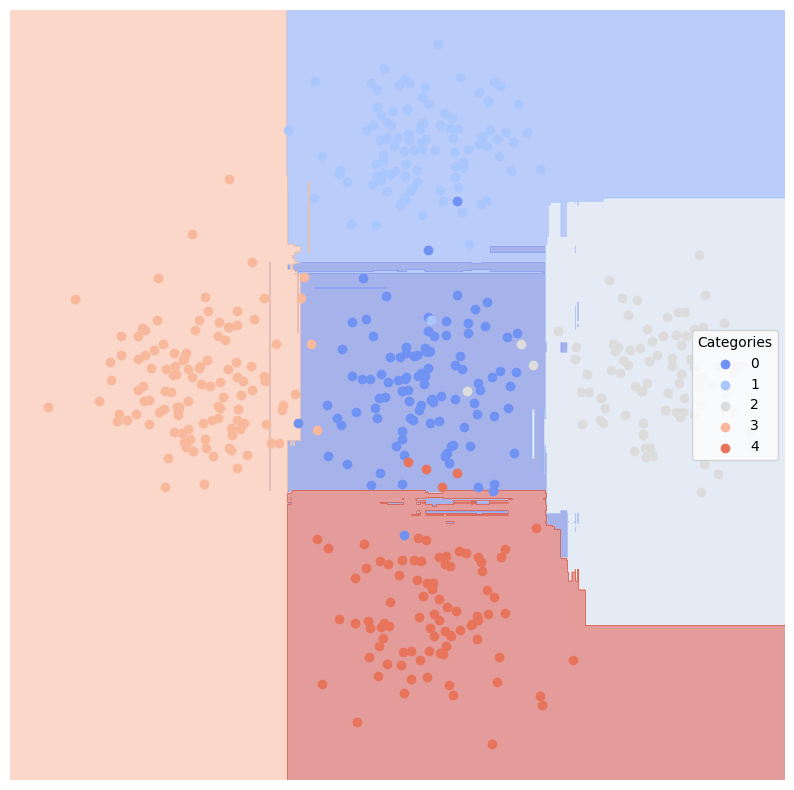

In [ ]:
lucem_illud.plotregions(bag, df_exampleTree_test)

In [ ]:
lucem_illud.evaluateClassifier(bag, df_exampleTree_test)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
0,0.034,0.960415,0.889908,0.856285,0.950980
1,0.006,0.992543,0.980392,0.972685,0.990099
2,0.006,0.983696,1.000000,0.973391,0.967391
3,0.010,0.981457,0.991150,0.964973,0.965517
4,0.012,0.975095,0.977011,0.941101,0.955056


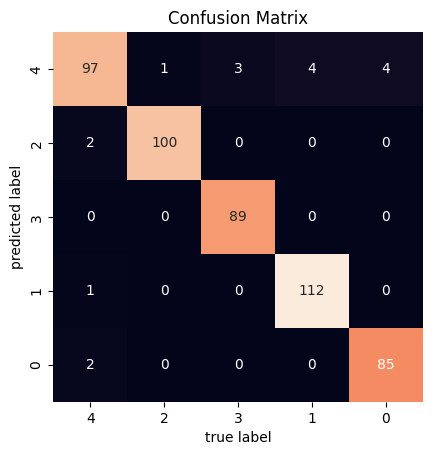

In [ ]:
lucem_illud.plotConfusionMatrix(bag, df_exampleTree_test)

## <font color="red">*Exercise 4*</font>

<font color="red">In the cells immediately following, perform decision tree and random forest classification (binary, multinomial or continuous) using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project. As with ***Exercise 2***, these could be crowd-sourced codes gathered through Amazon Mechanical Turk last week. Visualize the classification of data points. Calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). Now build an ensemble classifier by bagging trees into a random forest. Visualize the result. How do these classifiers perform? What does ensemble learning do?

# Now I apply decision tree and random forest

# First, I will modify my dataset to fit the input requirment of the course package

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
import matplotlib.pyplot as plt

In [ ]:
import pandas as pd
President = pd.read_csv('/content/drive/MyDrive/Content_Analysis/Homework-Notebooks/week 5/mexico_sentences.csv')
President['Final_Label'] = President[['A1', 'A2', 'A3']].mode(axis=1)[0]
Predic_President = President[President['Final_Label'].isnull()]
Labeled_President = President.dropna(subset=['Final_Label'])
Labeled_President.rename(columns={'Labeled_President': 'text', 'Merged_Text': 'text', 'Final_Label': 'category'}, inplace=True)
Labeled_President['tokenized_text'] = Labeled_President['text'].apply(lambda x: lucem_illud.word_tokenize(x))
Labeled_President['normalized_text'] = Labeled_President['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x))

blobs_df = Labeled_President.rename(columns={'category': 'category'}, inplace=False)[['category', 'tokenized_text', 'normalized_text']]
blobs_df

<ipython-input-37-9b93cc9f2b3e>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Labeled_President.rename(columns={'Labeled_President': 'text', 'Merged_Text': 'text', 'Final_Label': 'category'}, inplace=True)
/usr/local/lib/python3.10/dist-packages/spacy/pipeline/lemmatizer.py:211: UserWarning: [W108] The rule-based lemmatizer did not find POS annotation for one or more tokens. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
  warnings.warn(Warnings.W108)
<ipython-input-37-9b93cc9f2b3e>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

,category,tokenized_text,normalized_text
0,2.0,"[The, fact, that, the, President, George, Bush...","[fact, president, george, bush, foreign, visit..."
1,2.0,"[I, also, acknowledge, President, Bush, 's, de...","[acknowledge, president, bush, demonstration, ..."
2,2.0,"[President, that, you, will, always, be, welco...","[president, welcome, home, language, president..."
3,1.0,"[We, the, Presidents, of, Mexico, and, the, Un...","[president, mexico, united, states, favorable,..."
4,2.0,"[Muchas, gracias, amigo, el, Presidente, de, M...","[muchas, gracias, amigo, el, presidente, de, m..."
...,...,...,...
864,1.0,"[Detention, Conditions, at, the, Mexico, U]","[detention, condition, mexico, u]"
865,1.0,"[Detention, Conditions, at, the, Mexico, U]","[detention, condition, mexico, u]"
866,0.0,"[Rolling, back, the, policies, of, Remain, in,...","[roll, policy, remain, mexico, sit, edge, rio,..."
867,0.0,"[Illegal, Immigration, Unaccompanied, Minors, ...","[illegal, immigration, unaccompanied, minor, m..."


# Now I spill my data

In [ ]:
df_exampleTree_train, df_exampleTree_test = sklearn.model_selection.train_test_split(blobs_df, test_size=.2)

# Now I vectorlize my data and import Decision Tree classifier from sklearn.tree and fit it using the fit method.

In [ ]:
redditTFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=0.5, min_df=3, stop_words='english', norm='l2')
redditTFVects = redditTFVectorizer.fit_transform([' '.join(l) for l in blobs_df['normalized_text']])
blobs_df['vect'] = [np.array(v).flatten() for v in redditTFVects.todense()]

In [ ]:
clf_tree = sklearn.tree.DecisionTreeClassifier(max_depth=4,random_state=0)
clf_tree.fit(np.stack(df_exampleTree_train['vect'], axis =0), df_exampleTree_train['category'])

DecisionTreeClassifier(max_depth=4, random_state=0)

# To see what's going on visually with the classification:

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


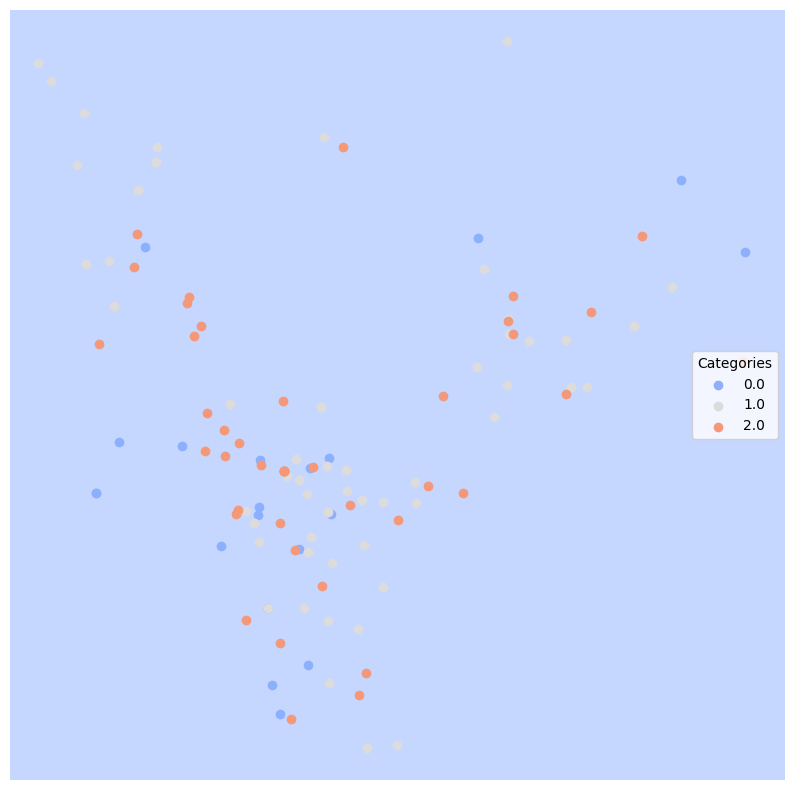

In [ ]:
lucem_illud.plotregions(clf_tree, df_exampleTree_train)

In [ ]:
lucem_illud.evaluateClassifier(clf_tree, df_exampleTree_test)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
0.0,0.121212,0.600000,1.000000,0.321212,0.200000
1.0,0.545455,0.550000,0.419355,0.419355,1.000000
2.0,0.424242,0.533333,1.000000,0.490909,0.066667


# From the result it could be learned that, both 1 and 2 have large error rate. Combined with the plot result, my data is less distinct from other categories therefore, it is harder for decision tree to predict

# Lets look at accuracy:

In [ ]:
sklearn.metrics.accuracy_score(df_exampleTree_test['category'],clf_tree.predict(np.stack(df_exampleTree_test['vect'], axis = 0)))

0.45454545454545453

# It is lower than previous logistic model, What happens if we trim the tree?

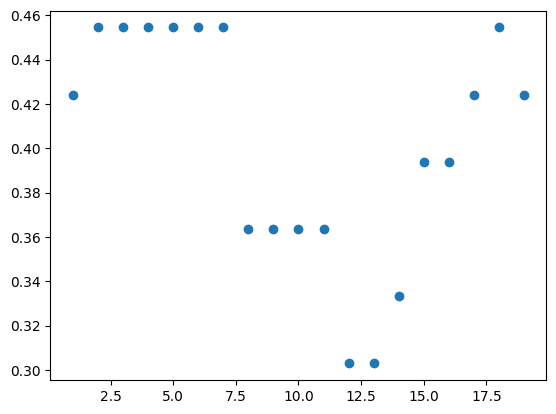

In [ ]:
depthvec = []
scorevec = []
for i in range(1,20):
    tree2 = sklearn.tree.DecisionTreeClassifier(max_depth=i,random_state=0)
    tree2.fit(np.stack(df_exampleTree_train['vect'], axis =0), df_exampleTree_train['category'])
    score = sklearn.metrics.accuracy_score(df_exampleTree_test['category'], tree2.predict(np.stack(df_exampleTree_test['vect'], axis = 0)))
    depthvec.append(i)
    scorevec.append(score)
plt.scatter(depthvec,scorevec)
plt.show()

# Now I build an ensemble classifier by bagging trees into a random forest

In [ ]:
tree = sklearn.tree.DecisionTreeClassifier(max_depth=10) #Create an instance of our decision tree classifier.

bag = sklearn.ensemble.BaggingClassifier(tree, n_estimators=100, max_samples=0.8, random_state=1) #Each tree uses up to 80% of the data

In [ ]:
bag.fit(np.stack(df_exampleTree_train['vect'], axis =0), df_exampleTree_train['category']) #Fit the bagged classifier

BaggingClassifier(estimator=DecisionTreeClassifier(max_depth=10),
                  max_samples=0.8, n_estimators=100, random_state=1)

# Now we create the plot and calculate the values

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


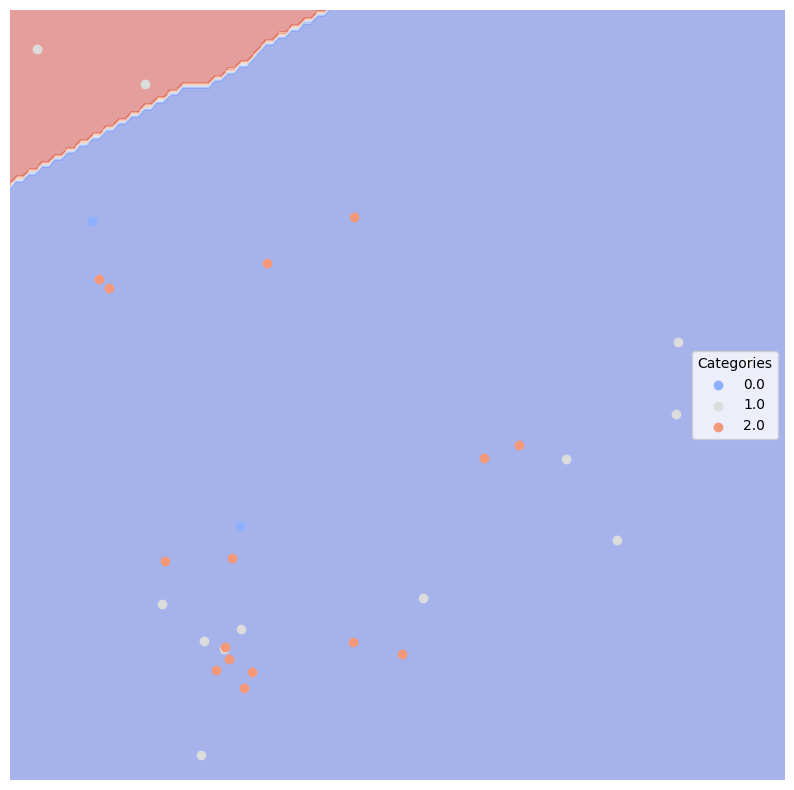

In [ ]:
lucem_illud.plotregions(bag, df_exampleTree_test)

In [ ]:
lucem_illud.evaluateClassifier(bag, df_exampleTree_test)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
0.0,0.121212,0.600000,1.000000,0.321212,0.200000
1.0,0.606061,0.446154,0.360000,0.370443,0.692308
2.0,0.484848,0.488889,0.428571,0.449351,0.200000


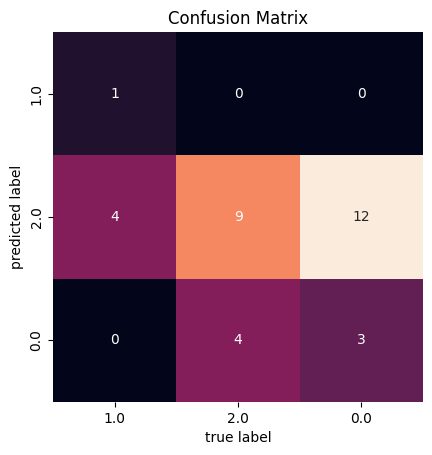

In [ ]:
lucem_illud.plotConfusionMatrix(bag, df_exampleTree_test)

# It is much worse than the origional tree with error rate raise to 0.6 for category 1, under this circumstance rendomforest may be not a better method for my data.

# The advantages of ensemble learning methods include improved generalization ability of models, reduced risk of overfitting, and better performance when dealing with complex data and problems. However, ensemble learning also has some disadvantages, such as the possibility of increasing computational costs for large data sets and high-dimensional data, and the need to carefully adjust parameters to avoid overfitting.

# Because this model is not better than logistic model, I will not use this to predic my non-labeld sentences

# K-Nearest Neighbors

The K-Nearest neighbors classifier takes a simpler premise than those before: Find the closest labeled datapoint in set and "borrow" its label.

Let's use newsgroup data.

In [ ]:
newsgroups = sklearn.datasets.fetch_20newsgroups(data_home = '../data') #Free data to play with: documents from a newsgroup corpus. # replace path if on Colab
newsgroups.target_names #Possible categories, i.e., the newsgroups

target_categories = ['talk.religion.misc', 'soc.religion.christian', 'sci.space', 'comp.graphics'] #Can change these of course

newsgroupsDF = pandas.DataFrame(columns = ['text', 'category', 'source_file'])
for category in target_categories:
    print("Loading data for: {}".format(category))
    ng = sklearn.datasets.fetch_20newsgroups(categories = [category], remove=['headers', 'footers', 'quotes'], data_home = '../data')
    newsgroupsDF = newsgroupsDF.append(pandas.DataFrame({'text' : ng.data, 'category' : [category] * len(ng.data), 'source_file' : ng.filenames}), ignore_index=True)

newsgroupsDF['tokenized_text'] = newsgroupsDF['text'].apply(lambda x: lucem_illud.word_tokenize(x))
newsgroupsDF['normalized_text'] = newsgroupsDF['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x))

Loading data for: talk.religion.misc
Loading data for: soc.religion.christian
Loading data for: sci.space
Loading data for: comp.graphics


/usr/local/lib/python3.10/dist-packages/spacy/pipeline/lemmatizer.py:211: UserWarning: [W108] The rule-based lemmatizer did not find POS annotation for one or more tokens. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
  warnings.warn(Warnings.W108)


In [ ]:
newsgroupsDF[:5]

,text,category,source_file,tokenized_text,normalized_text
0,\n\nParadise and salvation are not the same th...,talk.religion.misc,../data/20news_home/20news-bydate-train/talk.r...,"[Paradise, and, salvation, are, not, the, same...","[paradise, salvation, thing, salvation, well, ..."
1,\nYou're admitting a lot more than that. You ...,talk.religion.misc,../data/20news_home/20news-bydate-train/talk.r...,"[You, 're, admitting, a, lot, more, than, that...","[admit, lot, admit, moral, situational, admit,..."
2,"\n\nJesus also recognized other holy days, lik...",talk.religion.misc,../data/20news_home/20news-bydate-train/talk.r...,"[Jesus, also, recognized, other, holy, days, l...","[jesus, recognize, holy, day, like, passover, ..."
3,In <lsjc8cINNmc1@saltillo.cs.utexas.edu> turpi...,talk.religion.misc,../data/20news_home/20news-bydate-train/talk.r...,"[In, <, lsjc8cINNmc1@saltillo.cs.utexas.edu, >...","[<, lsjc8cinnmc1@saltillo.cs.utexas.edu, >, tu..."
4,"\nI'm sorry, but He does not! Ever read the F...",talk.religion.misc,../data/20news_home/20news-bydate-train/talk.r...,"[I, 'm, sorry, but, He, does, not, Ever, read,...","[m, sorry, read, commandment]"


Make a testing and training set:

In [ ]:
holdBackFraction = .2
train_ng_df, test_ng_df = sklearn.model_selection.train_test_split(newsgroupsDF, test_size=holdBackFraction)

Let's initialize our k-nearest neighbors classifier:

In [ ]:
n_neighbors = 15
weights="uniform"
clf_knearest = sklearn.neighbors.KNeighborsClassifier(n_neighbors, weights=weights)

Let's try to classify using the TF-IDF vectors:

In [ ]:
TFVectorizer_ng = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects_ng = TFVectorizer_ng.fit_transform(train_ng_df['text'])
train_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_ng.todense()]

In [ ]:
clf_knearest.fit(np.stack(train_ng_df['vect'], axis = 0), train_ng_df['category'])

KNeighborsClassifier(n_neighbors=15)

In [ ]:
lucem_illud.evaluateClassifier(clf_knearest, train_ng_df)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
sci.space,0.275842,0.500000,0.000000,0.275842,0.000000
soc.religion.christian,0.275842,0.500000,0.000000,0.275842,0.000000
comp.graphics,0.722416,0.500429,0.270206,0.270204,0.984946
talk.religion.misc,0.182346,0.510280,0.370370,0.184538,0.032573


And lets look at the testing data

In [ ]:
#Create vectors
TFVects_test = TFVectorizer_ng.transform(test_ng_df['text'])
test_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#Add to df
test_ng_df['nb_predict'] = clf_knearest.predict(np.stack(test_ng_df['vect'], axis=0))

#Test
print("Testing score:")
print(clf_knearest.score(np.stack(test_ng_df['vect'], axis=0), test_ng_df['category']))

Testing score:
0.2737819025522042


Let's produce another confusion matrix:

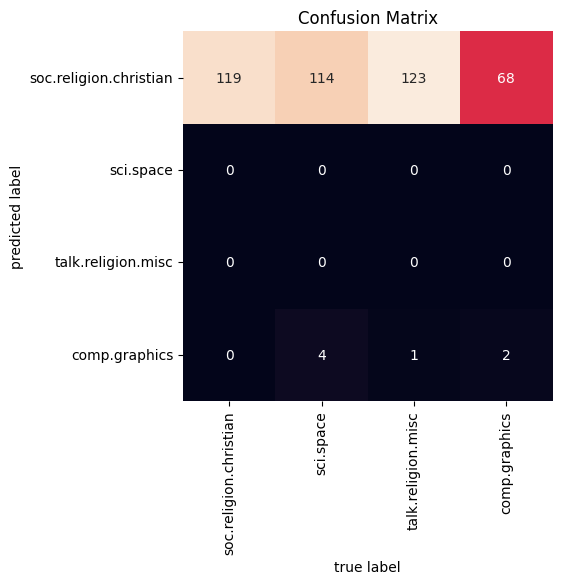

In [ ]:
lucem_illud.plotConfusionMatrix(clf_knearest, test_ng_df)

You can produce the PCA space visual if you want, altough it can take a very long time, so we'll leave it optionally commented out:

In [ ]:
#lucem_illud.plotregions(clf_knearest, test_ng_df)

## <font color="red">*Exercise 5*</font>

<font color="red">In the cells immediately following, perform and visualize k-nearest neighbor classification using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project. Visualize the classification of data points and calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). Articulate how the *k*-nearest neighbor approach relates to *k*-means clustering explored in ***week 3***?

# Load my data and rename

In [ ]:
import pandas as pd
President = pd.read_csv('/content/drive/MyDrive/Content_Analysis/Homework-Notebooks/week 5/mexico_sentences.csv')
President['Final_Label'] = President[['A1', 'A2', 'A3']].mode(axis=1)[0]
Predic_President = President[President['Final_Label'].isnull()]
Labeled_President = President.dropna(subset=['Final_Label'])
Labeled_President.rename(columns={'Labeled_President': 'text', 'Merged_Text': 'text', 'Final_Label': 'category'}, inplace=True)
Labeled_President

<ipython-input-17-8947ef372d11>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Labeled_President.rename(columns={'Labeled_President': 'text', 'Merged_Text': 'text', 'Final_Label': 'category'}, inplace=True)


,SPEAKER,DATE,TITLE,CITATION,URL,text,A1,A2,A3,category
0,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,The fact that the President—George Bush's firs...,2.0,2.0,2.0,2.0
1,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,I also acknowledge President Bush's demonstra...,2.0,2.0,2.0,2.0
2,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,"President, that you will always be welcome in...",2.0,2.0,2.0,2.0
3,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,"We, the Presidents of Mexico and the United St...",2.0,1.0,1.0,1.0
4,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,"Muchas gracias, amigo, el Presidente de Mexico",2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...
864,Joseph R. Biden,25-Mar-21,The President's News Conference,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,Detention Conditions at the Mexico-U,1.0,1.0,1.0,1.0
865,Joseph R. Biden,25-Mar-21,The President's News Conference,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,Detention Conditions at the Mexico-U,1.0,1.0,1.0,1.0
866,Joseph R. Biden,25-Mar-21,The President's News Conference,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,"Rolling back the policies of ""Remain in Mexic...",0.0,0.0,0.0,0.0
867,Joseph R. Biden,25-Mar-21,The President's News Conference,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,Illegal Immigration/Unaccompanied Minors at th...,0.0,0.0,0.0,0.0


# Make a testing and training set:

In [ ]:
holdBackFraction = .2
train_ng_df, test_ng_df = sklearn.model_selection.train_test_split(Labeled_President, test_size=holdBackFraction)

# initialize our k-nearest neighbors classifier:

In [ ]:
n_neighbors = 15
weights="uniform"
clf_knearest = sklearn.neighbors.KNeighborsClassifier(n_neighbors, weights=weights)

# try to classify using the TF-IDF vectors:

In [ ]:
TFVectorizer_ng = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects_ng = TFVectorizer_ng.fit_transform(train_ng_df['text'])
train_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_ng.todense()]

In [ ]:
clf_knearest.fit(np.stack(train_ng_df['vect'], axis = 0), train_ng_df['category'])

KNeighborsClassifier(n_neighbors=15)

In [ ]:
lucem_illud.evaluateClassifier(clf_knearest, train_ng_df)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
0.0,0.146154,0.525000,1.000000,0.196154,0.05
1.0,0.523077,0.507246,0.472868,0.472868,1.00
2.0,0.376923,0.500000,0.000000,0.376923,0.00


# From the results it could be learned that, 0 is more easy to predict and have better results compared to other categories, while 1 is the hardest to predict, because in my data, 1 represents the information that is unrelated to presidents attitude with mexico, which is hard to predict than the positive or negative attitude

# look at the testing data

In [ ]:
#Create vectors
TFVects_test = TFVectorizer_ng.transform(test_ng_df['text'])
test_ng_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#Add to df
test_ng_df['nb_predict'] = clf_knearest.predict(np.stack(test_ng_df['vect'], axis=0))

#Test
print("Testing score:")
print(clf_knearest.score(np.stack(test_ng_df['vect'], axis=0), test_ng_df['category']))

Testing score:
0.5151515151515151


# produce another confusion matrix:

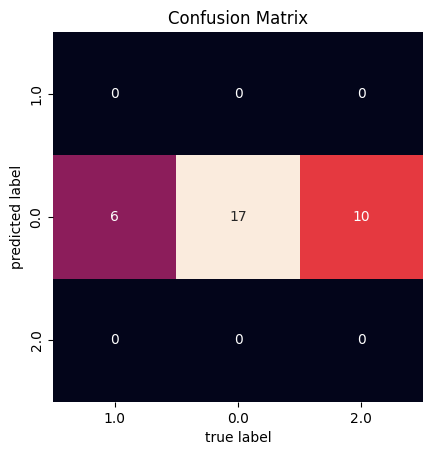

In [ ]:
lucem_illud.plotConfusionMatrix(clf_knearest, test_ng_df)

# I will not create the plot as it will break down the google colab. Becsuse this model is less effective than logistic model, I will not use this model to predict my non-label dataset

In [ ]:
#lucem_illud.plotregions(clf_knearest, test_ng_df)

# K-nearest neighbor (KNN) and k-means clustering both use the concept of "k," but they serve different purposes:

- # KNN is a supervised learning algorithm for classification and regression, where a new data point is classified based on the majority class of its k nearest neighbors.
- # K-means clustering is an unsupervised learning algorithm for partitioning a dataset into k clusters based on the similarity of data points' features.

# While both use "k," KNN requires labeled data for training and focuses on finding similar instances, while k-means operates on unlabeled data to discover underlying patterns and groupings in the data.

# SVMs

Now we will examine Support Vector Machines, an approach that creates the partition that preserves the "maximum margin" between classes.

We will use a few sub forums from reddit--which tend to share text rather than memes--namely `talesfromtechsupport`, `badroommates`, `weeabootales` and `relationships`. The top 100 text posts from each have been saved to `data/reddit.csv`.

In [ ]:
redditDf = pandas.read_csv('/content/drive/MyDrive/Content_Analysis/Homework-Notebooks/data/reddit.csv', index_col = 0) # replace path if on Colab

#Drop a couple missing values

redditDf = redditDf.dropna()

#Set category

redditDf['category'] = redditDf['subreddit']

#tokenize and normalize
redditDf['tokenized_text'] = redditDf['text'].apply(lambda x: lucem_illud.word_tokenize(x))
redditDf['normalized_text'] = redditDf['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x))

/usr/local/lib/python3.10/dist-packages/spacy/pipeline/lemmatizer.py:211: UserWarning: [W108] The rule-based lemmatizer did not find POS annotation for one or more tokens. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
  warnings.warn(Warnings.W108)


We will tf.idf the data to make our vectors:

In [ ]:
redditTFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=0.5, min_df=3, stop_words='english', norm='l2')
redditTFVects = redditTFVectorizer.fit_transform([' '.join(l) for l in redditDf['normalized_text']])
redditDf['vect'] = [np.array(v).flatten() for v in redditTFVects.todense()]

Initilize the model and make a train test split:

In [ ]:
holdBackFraction = .2
train_redditDf, test_redditDf = sklearn.model_selection.train_test_split(redditDf, test_size=holdBackFraction)

In [ ]:
clf_svm = sklearn.svm.SVC(kernel='linear', probability = False)
#probability = True is slower but  lets you call predict_proba()
clf_svm.fit(np.stack(train_redditDf['vect'], axis=0), train_redditDf['category'])

SVC(kernel='linear')

...and consider the results:

In [ ]:
lucem_illud.evaluateClassifier(clf_svm, test_redditDf)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
Tales From Tech Support,0.00000,1.000000,1.000000,1.000000,1.000000
Weeaboo Tales: stories about the extreme fans of japanese culture,0.00625,0.987654,1.000000,0.981559,0.975309
Bad Roommates: Tales of Irritation,0.01250,0.987735,0.965517,0.957283,0.988235
Relationships,0.00625,0.991802,0.987805,0.978883,0.987805


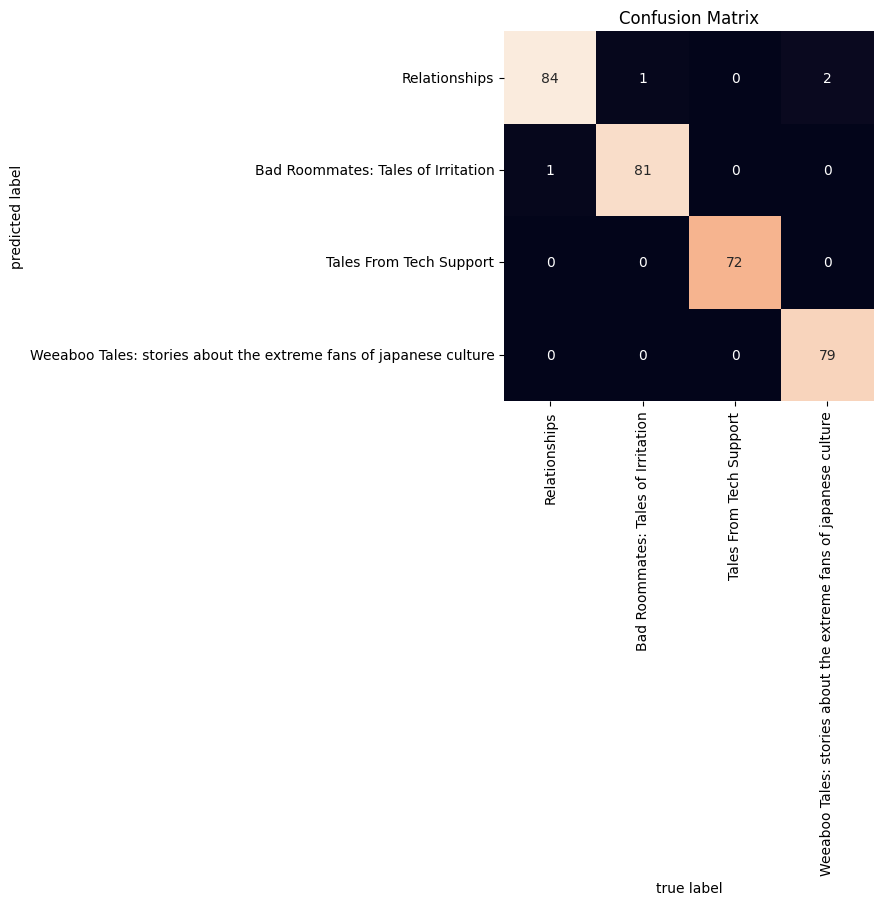

In [ ]:
lucem_illud.plotConfusionMatrix(clf_svm, test_redditDf)

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


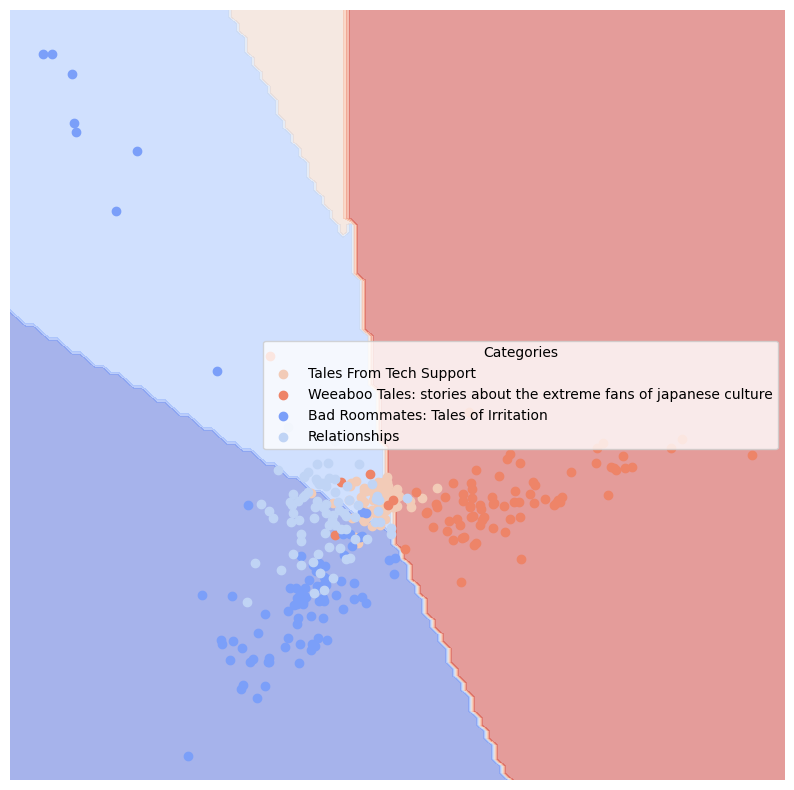

In [ ]:
lucem_illud.plotregions(clf_svm, test_redditDf)

# Neural Nets

We include an example of a simple neural network, the Multi-layer Perceptron (MLP) that learns a function $f(\cdot): R^m \rightarrow R^o$ by training on a dataset, where $m$ is the number of dimensions for input and $o$ is the number of dimensions for output. Given a set of features $X = {x_1, x_2, ..., x_m}$ and a target $y$, it can learn a non-linear function approximator for either classification or regression. It is different from logistic regression, in that between the input and the output layer, there can be one or more non-linear layers, called hidden layers. The following figure shows a one hidden layer MLP with scalar output. The leftmost layer, known as the input layer, consists of a set of "neurons" $\{x_i | x_1, x_2, ..., x_m\}$ representing the input features (e.g., weighted words). Each neuron in the hidden layer transforms the values from the previous layer with a weighted linear summation $z = w_1x_1 + w_2x_2 + ... + w_mx_m$, followed by a non-linear activation function $f(\cdot):R \rightarrow R$ - like the logistic or hyperbolic tan function. The output layer receives the values from the last hidden layer and transforms them into output values.

<img src="https://github.com/UChicago-Computational-Content-Analysis/Homework-Notebooks-2024-Winter/blob/main/data/MLP.jpg?raw=true" alt="https://github.com/UChicago-Computational-Content-Analysis/Homework-Notebooks-2024-Winter/blob/main/data/MLP.jpg?raw=true" style="width:500px">

In [ ]:
clf_nn = sklearn.neural_network.MLPClassifier()
clf_nn.fit(np.stack(train_redditDf['vect'], axis=0), train_redditDf['category'])

MLPClassifier()

In [ ]:
lucem_illud.evaluateClassifier(clf_nn, test_redditDf)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
Tales From Tech Support,0.003125,0.993056,1.000000,0.989236,0.986111
Weeaboo Tales: stories about the extreme fans of japanese culture,0.006250,0.987654,1.000000,0.981559,0.975309
Bad Roommates: Tales of Irritation,0.025000,0.967960,0.952941,0.920597,0.952941
Relationships,0.028125,0.969102,0.929412,0.904784,0.963415


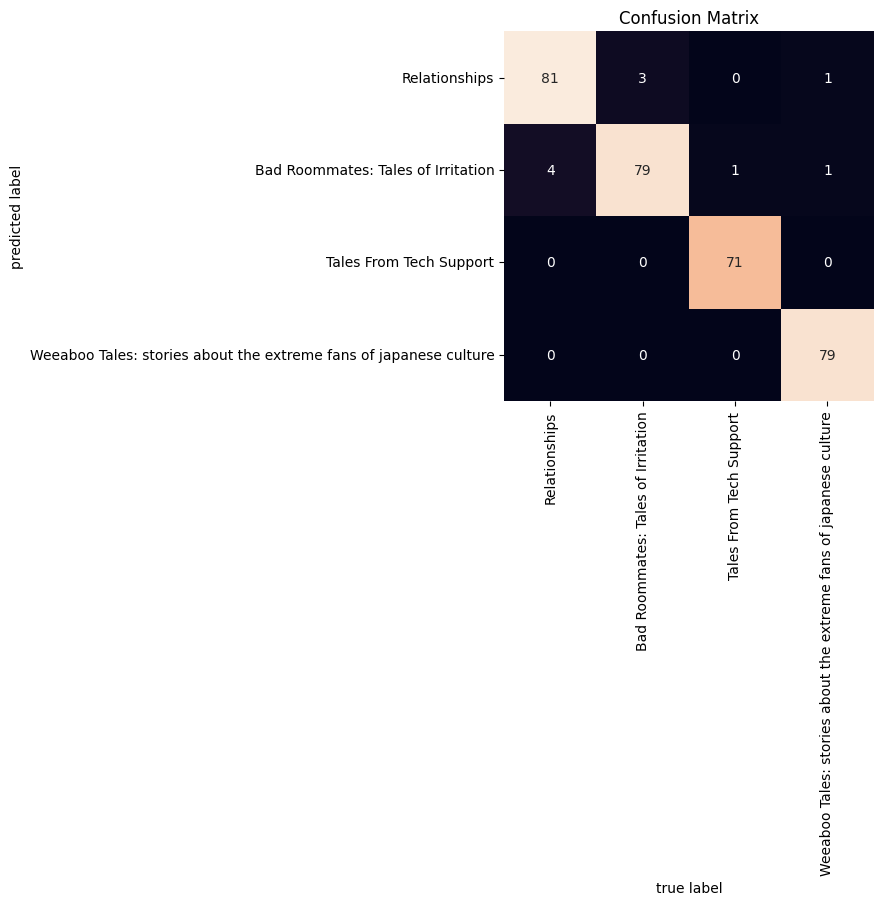

In [ ]:
lucem_illud.plotConfusionMatrix(clf_nn, test_redditDf)

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


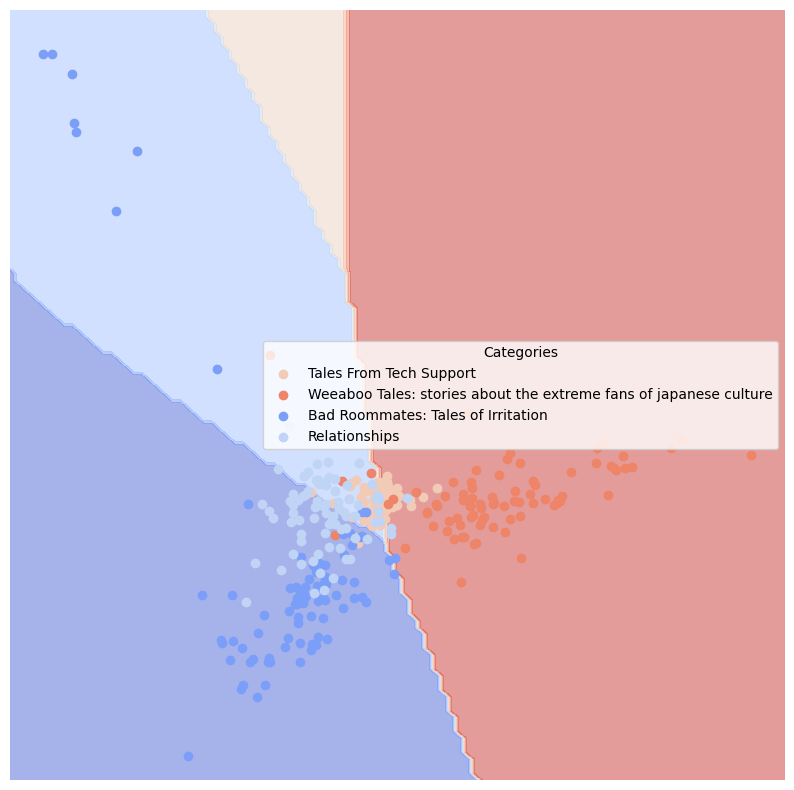

In [ ]:
lucem_illud.plotregions(clf_nn, test_redditDf)

It performs very well.

## <font color="red">*Exercise 6*</font>

<font color="red">In the cells immediately following, perform a neural network classification and calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). How does this classify relevant to *k*-nearest neighbor, logistic and decision-tree approaches?

# Now I will apply my dataset to neural network

In [ ]:
import pandas as pd
President = pd.read_csv('/content/drive/MyDrive/Content_Analysis/Homework-Notebooks/week 5/mexico_sentences.csv')
President['Final_Label'] = President[['A1', 'A2', 'A3']].mode(axis=1)[0]
Predic_President = President[President['Final_Label'].isnull()]
Labeled_President = President.dropna(subset=['Final_Label'])
Labeled_President.rename(columns={'Labeled_President': 'text', 'Merged_Text': 'text', 'Final_Label': 'category'}, inplace=True)
Labeled_President['tokenized_text'] = Labeled_President['text'].apply(lambda x: lucem_illud.word_tokenize(x))
Labeled_President['normalized_text'] = Labeled_President['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x))

redditDf = Labeled_President.rename(columns={'category': 'category'}, inplace=False)[['category', 'tokenized_text', 'normalized_text']]
redditDf

<ipython-input-21-77e310fd43de>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Labeled_President.rename(columns={'Labeled_President': 'text', 'Merged_Text': 'text', 'Final_Label': 'category'}, inplace=True)
/usr/local/lib/python3.10/dist-packages/spacy/pipeline/lemmatizer.py:211: UserWarning: [W108] The rule-based lemmatizer did not find POS annotation for one or more tokens. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
  warnings.warn(Warnings.W108)
<ipython-input-21-77e310fd43de>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guid

,category,tokenized_text,normalized_text
0,2.0,"[The, fact, that, the, President, George, Bush...","[fact, president, george, bush, foreign, visit..."
1,2.0,"[I, also, acknowledge, President, Bush, 's, de...","[acknowledge, president, bush, demonstration, ..."
2,2.0,"[President, that, you, will, always, be, welco...","[president, welcome, home, language, president..."
3,1.0,"[We, the, Presidents, of, Mexico, and, the, Un...","[president, mexico, united, states, favorable,..."
4,2.0,"[Muchas, gracias, amigo, el, Presidente, de, M...","[muchas, gracias, amigo, el, presidente, de, m..."
...,...,...,...
864,1.0,"[Detention, Conditions, at, the, Mexico, U]","[detention, condition, mexico, u]"
865,1.0,"[Detention, Conditions, at, the, Mexico, U]","[detention, condition, mexico, u]"
866,0.0,"[Rolling, back, the, policies, of, Remain, in,...","[roll, policy, remain, mexico, sit, edge, rio,..."
867,0.0,"[Illegal, Immigration, Unaccompanied, Minors, ...","[illegal, immigration, unaccompanied, minor, m..."


In [ ]:
redditTFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=0.5, min_df=3, stop_words='english', norm='l2')
redditTFVects = redditTFVectorizer.fit_transform([' '.join(l) for l in redditDf['normalized_text']])
redditDf['vect'] = [np.array(v).flatten() for v in redditTFVects.todense()]

In [ ]:
holdBackFraction = .2
train_redditDf, test_redditDf = sklearn.model_selection.train_test_split(redditDf, test_size=holdBackFraction)

In [ ]:
clf_nn = sklearn.neural_network.MLPClassifier()
clf_nn.fit(np.stack(train_redditDf['vect'], axis=0), train_redditDf['category'])

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPClassifier()

In [ ]:
lucem_illud.evaluateClassifier(clf_nn, test_redditDf)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
0.0,0.212121,0.433333,0.000000,0.090909,0.000000
1.0,0.484848,0.511111,0.555556,0.551066,0.555556
2.0,0.393939,0.565476,0.454545,0.401515,0.416667


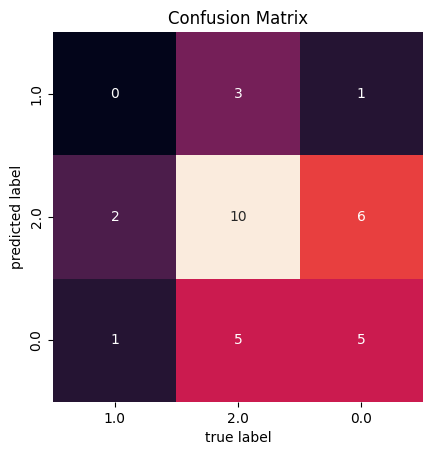

In [ ]:
lucem_illud.plotConfusionMatrix(clf_nn, test_redditDf)

/usr/local/lib/python3.10/dist-packages/lucem_illud/metrics.py:167: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(a[:,0], a[:, 1], c = pallet[catsMap[cat]], label = cat)


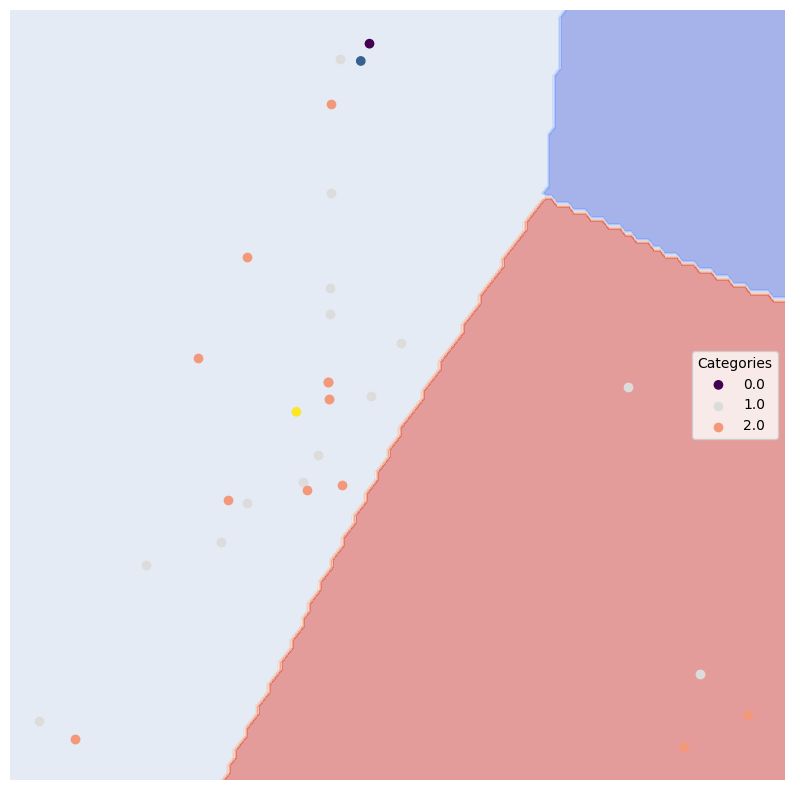

In [ ]:
lucem_illud.plotregions(clf_nn, test_redditDf)

# It seems less effcient than KNN, and from the plot it could infer that in my dataset the categories are not distinct from each other therefore, this method may not be very feasible for my data, therefore, I will not use this model to predict my unlabeled data

# Neural network classification, K-nearest neighbor (KNN), logistic regression, and decision tree approaches are all used for classification tasks:

- # Neural networks: Complex, learn patterns through layers, suitable for large datasets, computationally intensive.
- # KNN: Simple, non-parametric, relies on similarity to neighbors, can be slow for large datasets.
- # Logistic regression: Linear model, interpretable, assumes linear relationships, efficient.
- # Decision trees: Hierarchical, capture complex decision boundaries, prone to overfitting, can be improved with ensemble methods.

# While each approach has strengths and weaknesses, the choice depends on factors like data complexity, interpretability, and computational resources.

## Classification with BERT Pipelines
Now, instead of classifying based on "old" NLP methods, we will now use the popular Transformers package default 'pipelines'. This package has methods for a wide range of common NLP tasks using contextual word embeddings. Note that for this homework, we are not building new contextual models ourselves, merely using existing models in Transformers. We will spend Weeks 7 and 8 learning more about Transformers, so do not worry about fully understanding them this week.

[Transformers Documentation](https://huggingface.co/transformers/)

[Transformers GitHub](https://github.com/huggingface/transformers)

The following sections of code are taken from the [Summary of Tasks](https://huggingface.co/transformers/task_summary.html) page in the Transformers documentation.

### Sequence Classification (e.g., sentiment)
Sequence classification is the task of classifying sequences according to a given number of classes. An example of
sequence classification is the GLUE dataset. If you would like to fine-tune a
model on a GLUE sequence classification task, you may leverage the [pytorch version run_glue.py](https://github.com/huggingface/transformers/blob/f40b87de0ca234df61f76928956c4a2118c0b548/examples/pytorch/text-classification/run_glue.py) and
[pytorch-lightning version run_glue.py](https://github.com/huggingface/transformers/blob/f40b87de0ca234df61f76928956c4a2118c0b548/examples/legacy/pytorch-lightning/run_glue.py)(legacy) or
[tensorflow version run_glue.py](https://github.com/huggingface/transformers/blob/f40b87de0ca234df61f76928956c4a2118c0b548/examples/tensorflow/text-classification/run_glue.py) scripts.

Here is an example of using pipelines to do sentiment analysis: identifying if a sentence is positive or negative. It
leverages a fine-tuned model on sst2, which is a GLUE task.

This returns a label ("POSITIVE" or "NEGATIVE") alongside a score, as follows:

In [ ]:
from transformers import pipeline
nlp = pipeline("sentiment-analysis")
result = nlp("I hate you")[0]
print(f"label: {result['label']}, with score: {round(result['score'], 4)}")
result = nlp("I love you")[0]
print(f"label: {result['label']}, with score: {round(result['score'], 4)}")

No model was supplied, defaulted to distilbert-base-uncased-finetuned-sst-2-english and revision af0f99b (https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/629 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

label: NEGATIVE, with score: 0.9991
label: POSITIVE, with score: 0.9999


Here is an example of doing a sequence classification using a model to determine if two sequences are paraphrases of
each other. The process is the following:

1. Instantiate a tokenizer and a model from the checkpoint name. The model is identified as a BERT model and loads it
   with the weights stored in the checkpoint.
2. Build a sequence from the two sentences, with the correct model-specific separators token type ids and attention
   masks (`PreTrainedTokenizer.encode` and `PreTrainedTokenizer.__call__` take
   care of this).
3. Pass this sequence through the model so that it is classified in one of the two available classes: 0 (not a
   paraphrase) and 1 (is a paraphrase).
4. Compute the softmax of the result to get probabilities over the classes.
5. Print the results.

In [ ]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification
import torch
tokenizer = AutoTokenizer.from_pretrained("bert-base-cased-finetuned-mrpc")
model = AutoModelForSequenceClassification.from_pretrained("bert-base-cased-finetuned-mrpc")
classes = ["not paraphrase", "is paraphrase"]
sequence_0 = "The company HuggingFace is based in New York City"
sequence_1 = "Apples are especially bad for your health"
sequence_2 = "HuggingFace's headquarters are situated in Manhattan"
paraphrase = tokenizer(sequence_0, sequence_2, return_tensors="pt")
not_paraphrase = tokenizer(sequence_0, sequence_1, return_tensors="pt")
paraphrase_classification_logits = model(**paraphrase).logits
not_paraphrase_classification_logits = model(**not_paraphrase).logits
paraphrase_results = torch.softmax(paraphrase_classification_logits, dim=1).tolist()[0]
not_paraphrase_results = torch.softmax(not_paraphrase_classification_logits, dim=1).tolist()[0]
# Should be paraphrase
for i in range(len(classes)):
    print(f"{classes[i]}: {int(round(paraphrase_results[i] * 100))}%")
# Should not be paraphrase
for i in range(len(classes)):
    print(f"{classes[i]}: {int(round(not_paraphrase_results[i] * 100))}%")

tokenizer_config.json:   0%|          | 0.00/29.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/433 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/213k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/436k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/433M [00:00<?, ?B/s]

not paraphrase: 10%
is paraphrase: 90%
not paraphrase: 94%
is paraphrase: 6%


### Extractive Question Answering

Extractive Question Answering is the task of extracting an answer from a text given a question. An example of a
question answering dataset is the SQuAD dataset, which is entirely based on that task. If you would like to fine-tune a
model on a SQuAD task, you may leverage the [run_squad.py](https://github.com/huggingface/transformers/blob/f40b87de0ca234df61f76928956c4a2118c0b548/examples/legacy/question-answering/run_squad.py) (legacy) script.


Here is an example of using pipelines to do question answering: extracting an answer from a text given a question. It
leverages a fine-tuned model on SQuAD.

In [ ]:
from transformers import pipeline
nlp = pipeline("question-answering")
context = r"""
Extractive Question Answering is the task of extracting an answer from a text given a question. An example of a
question answering dataset is the SQuAD dataset, which is entirely based on that task. If you would like to fine-tune
a model on a SQuAD task, you may leverage the examples/legacy/question-answering/run_squad.py
"""

No model was supplied, defaulted to distilbert-base-cased-distilled-squad and revision 626af31 (https://huggingface.co/distilbert-base-cased-distilled-squad).
Using a pipeline without specifying a model name and revision in production is not recommended.


config.json:   0%|          | 0.00/473 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/261M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/29.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/213k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/436k [00:00<?, ?B/s]

This returns an answer extracted from the text, a confidence score, alongside "start" and "end" values, which are the
positions of the extracted answer in the text.

In [ ]:
result = nlp(question="What is extractive question answering?", context=context)
print(f"Answer: '{result['answer']}', score: {round(result['score'], 4)}, start: {result['start']}, end: {result['end']}")
result = nlp(question="What is a good example of a question answering dataset?", context=context)
print(f"Answer: '{result['answer']}', score: {round(result['score'], 4)}, start: {result['start']}, end: {result['end']}")

Answer: 'the task of extracting an answer from a text given a question', score: 0.6329, start: 34, end: 95
Answer: 'SQuAD dataset', score: 0.5102, start: 147, end: 160


Here is an example of question answering using a model and a tokenizer. The process is the following:

1. Instantiate a tokenizer and a model from the checkpoint name. The model is identified as a BERT model and loads it
   with the weights stored in the checkpoint.
2. Define a text and a few questions.
3. Iterate over the questions and build a sequence from the text and the current question, with the correct
   model-specific separators token type ids and attention masks.
4. Pass this sequence through the model. This outputs a range of scores across the entire sequence of tokens (question and
   text), for both the start and end positions.
5. Compute the softmax of the result to get probabilities over the tokens.
6. Fetch the tokens from the identified start and stop values, convert those tokens to a string.
7. Print the results.

In [ ]:
from transformers import AutoTokenizer, AutoModelForQuestionAnswering
import torch
tokenizer = AutoTokenizer.from_pretrained("bert-large-uncased-whole-word-masking-finetuned-squad")
model = AutoModelForQuestionAnswering.from_pretrained("bert-large-uncased-whole-word-masking-finetuned-squad")
text = r"""
🤗 Transformers (formerly known as pytorch-transformers and pytorch-pretrained-bert) provides general-purpose
architectures (BERT, GPT-2, RoBERTa, XLM, DistilBert, XLNet…) for Natural Language Understanding (NLU) and Natural
Language Generation (NLG) with over 32+ pretrained models in 100+ languages and deep interoperability between
TensorFlow 2.0 and PyTorch.
"""
questions = [
    "How many pretrained models are available in 🤗 Transformers?",
    "What does 🤗 Transformers provide?",
    "🤗 Transformers provides interoperability between which frameworks?",
]
for question in questions:
    inputs = tokenizer(question, text, add_special_tokens=True, return_tensors="pt")
    input_ids = inputs["input_ids"].tolist()[0]

    text_tokens = tokenizer.convert_ids_to_tokens(input_ids)
    outputs = model(**inputs)
    answer_start_scores = outputs.start_logits
    answer_end_scores = outputs.end_logits

    answer_start = torch.argmax(
        answer_start_scores
    )  # Get the most likely beginning of answer with the argmax of the score
    answer_end = torch.argmax(answer_end_scores) + 1  # Get the most likely end of answer with the argmax of the score

    answer = tokenizer.convert_tokens_to_string(tokenizer.convert_ids_to_tokens(input_ids[answer_start:answer_end]))

    print(f"Question: {question}")
    print(f"Answer: {answer}")

tokenizer_config.json:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/443 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.34G [00:00<?, ?B/s]

Some weights of the model checkpoint at bert-large-uncased-whole-word-masking-finetuned-squad were not used when initializing BertForQuestionAnswering: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
- This IS expected if you are initializing BertForQuestionAnswering from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForQuestionAnswering from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Question: How many pretrained models are available in 🤗 Transformers?
Answer: over 32 +
Question: What does 🤗 Transformers provide?
Answer: general - purpose architectures
Question: 🤗 Transformers provides interoperability between which frameworks?
Answer: tensorflow 2. 0 and pytorch


## <font color="red">*Exercise 7*</font>

<font color="red">In the cells immediately following, use the pipeline functions or the word or sentence vector functions (e.g., similarity) to explore the social game underlying the production and meaning of texts associated with your final project. How does BERT help you gain insight regarding your research question that is similar and different from prior methods?

# I will use this to help me predic my president attitude on mexico data

In [ ]:
import pandas as pd
President = pd.read_csv('/content/drive/MyDrive/Content_Analysis/Homework-Notebooks/week 5/mexico_sentences.csv')
President['Final_Label'] = President[['A1', 'A2', 'A3']].mode(axis=1)[0]
President

,SPEAKER,DATE,TITLE,CITATION,URL,Merged_Text,A1,A2,A3,Final_Label
0,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,The fact that the President—George Bush's firs...,2.0,2.0,2.0,2.0
1,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,I also acknowledge President Bush's demonstra...,2.0,2.0,2.0,2.0
2,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,"President, that you will always be welcome in...",2.0,2.0,2.0,2.0
3,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,"We, the Presidents of Mexico and the United St...",2.0,1.0,1.0,1.0
4,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,"Muchas gracias, amigo, el Presidente de Mexico",2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...
901,Joseph R. Biden,10-Jan-23,The President's News Conference With Prime Min...,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,That's exactly what we're doing in Mexico,NaN,NaN,NaN,NaN
902,Joseph R. Biden,10-Jan-23,The President's News Conference With Prime Min...,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,This doesn't happen in Mexico anymore,NaN,NaN,NaN,NaN
903,Joseph R. Biden,10-Jan-23,The President's News Conference With Prime Min...,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,Just as I was telling you that in the case of...,NaN,NaN,NaN,NaN
904,Joseph R. Biden,10-Jan-23,The President's News Conference With Prime Min...,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,"In the case of Mexico, this led us to make al...",NaN,NaN,NaN,NaN


In [ ]:
import pandas as pd
from transformers import pipeline

# Load the sentiment analysis pipeline
nlp = pipeline("sentiment-analysis")

# Analyze the sentiment of each line of text and save the results to a new column
President['sentiment'] = President['Merged_Text'].apply(lambda x: nlp(x)[0]['label'])

No model was supplied, defaulted to distilbert-base-uncased-finetuned-sst-2-english and revision af0f99b (https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.


In [ ]:
 President

,SPEAKER,DATE,TITLE,CITATION,URL,Merged_Text,A1,A2,A3,Final_Label,sentiment
0,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,The fact that the President—George Bush's firs...,2.0,2.0,2.0,2.0,POSITIVE
1,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,I also acknowledge President Bush's demonstra...,2.0,2.0,2.0,2.0,POSITIVE
2,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,"President, that you will always be welcome in...",2.0,2.0,2.0,2.0,POSITIVE
3,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,"We, the Presidents of Mexico and the United St...",2.0,1.0,1.0,1.0,POSITIVE
4,George W. Bush,16-Feb-01,The President's News Conference With President...,"George W. Bush, The President's News Conferenc...",https://www.presidency.ucsb.edu/documents/the-...,"Muchas gracias, amigo, el Presidente de Mexico",2.0,2.0,2.0,2.0,POSITIVE
...,...,...,...,...,...,...,...,...,...,...,...
901,Joseph R. Biden,10-Jan-23,The President's News Conference With Prime Min...,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,That's exactly what we're doing in Mexico,NaN,NaN,NaN,NaN,POSITIVE
902,Joseph R. Biden,10-Jan-23,The President's News Conference With Prime Min...,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,This doesn't happen in Mexico anymore,NaN,NaN,NaN,NaN,NEGATIVE
903,Joseph R. Biden,10-Jan-23,The President's News Conference With Prime Min...,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,Just as I was telling you that in the case of...,NaN,NaN,NaN,NaN,POSITIVE
904,Joseph R. Biden,10-Jan-23,The President's News Conference With Prime Min...,"Joseph R. Biden, The President's News Conferen...",https://www.presidency.ucsb.edu/documents/the-...,"In the case of Mexico, this led us to make al...",NaN,NaN,NaN,NaN,NEGATIVE


# From the result it is really a strong package and labels are almost the same as manual

# Now I want ask some question based on my corpus

In [ ]:
# Initialize the question-answering pipeline with BERT
qa_pipeline = pipeline("question-answering", model="bert-large-uncased-whole-word-masking-finetuned-squad")


context = """
The fact that the President—George Bush's first foreign visit has our country as its destination is a clear message of the interest his administration places on strengthening links with Mexico. At the same time, it is quite a distinction.
This starting point is very encouraging, so that both Mexicans and Americans, together, to inaugurate an era of shared prosperity together."""


questions = [
    "What does President George W. Bush's first foreign trip mean?",
    "How is the starting point?",
    "What kind of era are Mexicans and Americans going to create together?"
]

# Get answers to each question based on the context
for question in questions:
    result = qa_pipeline(question=question, context=context)
    print(f"Question: {question}")
    print(f"Answer: '{result['answer']}', Score: {round(result['score'], 4)}\n")

Some weights of the model checkpoint at bert-large-uncased-whole-word-masking-finetuned-squad were not used when initializing BertForQuestionAnswering: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
- This IS expected if you are initializing BertForQuestionAnswering from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForQuestionAnswering from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Question: What does President George W. Bush's first foreign trip mean?
Answer: 'strengthening links with Mexico', Score: 0.1494

Question: How is the starting point?
Answer: 'very encouraging', Score: 0.6442

Question: What kind of era are Mexicans and Americans going to create together?
Answer: 'shared prosperity', Score: 0.684



# Unlike traditional static word embedding methods such as the Bag of Words model or Word2Vec, BERT dynamically generates word embedding by considering the context of the entire sentence, which makes its understanding of the language much deeper and more accurate. BERT's bidirectional training mode allows it to more accurately understand the meaning of words in different contexts. BERT is better able to handle ambiguity and complex structures in languages, such as long-distance dependencies. In particular, the interpretation and emotion analysis of the president's speech will greatly help my research